# Image Search using Deep Learning

### Folder Creation

In [ ]:
!mkdir /proj

In [ ]:
!mkdir /proj/cat

In [ ]:
!mkdir /proj/cat/train

In [ ]:
!mkdir /proj/cat/test

In [ ]:
!mkdir /temp

### Dataset Download

In [ ]:
!kaggle datasets download -d crawford/cat-dataset

Dataset URL: https://www.kaggle.com/datasets/crawford/cat-dataset
License(s): CC0-1.0
100% 4.02G/4.04G [00:57<00:00, 75.8MB/s]
100% 4.04G/4.04G [00:57<00:00, 75.7MB/s]


In [ ]:

!unzip /content/cat-dataset.zip

Streaming output truncated to the last 5000 lines.
  inflating: cats/CAT_05/00001130_020.jpg  
  inflating: cats/CAT_05/00001130_020.jpg.cat  
  inflating: cats/CAT_05/00001130_023.jpg  
  inflating: cats/CAT_05/00001130_023.jpg.cat  
  inflating: cats/CAT_05/00001130_026.jpg  
  inflating: cats/CAT_05/00001130_026.jpg.cat  
  inflating: cats/CAT_05/00001131_003.jpg  
  inflating: cats/CAT_05/00001131_003.jpg.cat  
  inflating: cats/CAT_05/00001131_026.jpg  
  inflating: cats/CAT_05/00001131_026.jpg.cat  
  inflating: cats/CAT_05/00001132_007.jpg  
  inflating: cats/CAT_05/00001132_007.jpg.cat  
  inflating: cats/CAT_05/00001132_008.jpg  
  inflating: cats/CAT_05/00001132_008.jpg.cat  
  inflating: cats/CAT_05/00001132_014.jpg  
  inflating: cats/CAT_05/00001132_014.jpg.cat  
  inflating: cats/CAT_05/00001132_017.jpg  
  inflating: cats/CAT_05/00001132_017.jpg.cat  
  inflating: cats/CAT_05/00001132_018.jpg  
  inflating: cats/CAT_05/00001132_018.jpg.cat  
  inflating: cats/CAT_05/0000

In [ ]:
import os
import keras
from keras.preprocessing import image
from keras.applications.imagenet_utils import decode_predictions, preprocess_input
from keras.models import Model

### Loading Pretrained Model

We load the ResNet50 model pretrained on ImageNet with the top layers included. This model will be used for feature extraction and classification.

In [ ]:
model = keras.applications.resnet50.ResNet50(weights='imagenet', include_top=True)

102967424/102967424 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [ ]:
model.summary()

Model: "resnet50"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, 230, 230, 3)    │              0 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 112, 112, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 112, 112, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, 114, 114, 64)   │              0 │ conv1_relu[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, 56, 56, 64)     │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 64)     │          4,160 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 64)     │         36,928 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv       │ (None, 56, 56, 256)    │         16,640 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_3_conv       │ (None, 56, 56, 256)    │         16,640 │ conv2_block1_2_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├──────────────────────

 Total params: 25,636,712 (97.80 MB)

 Trainable params: 25,583,592 (97.59 MB)

 Non-trainable params: 53,120 (207.50 KB)

ResNet-50 is designed to take a fixed-size (224 x 224 x 3) RGB image at its input, similar to VGG-16, but it improves on deep network training through the use of residual connections. ResNet-50 passes the input through a series of convolutional layers, grouped into residual blocks, interspersed with pooling layers.

After processing through these stages, the feature maps are passed through a global average pooling layer, followed by a fully connected layer with 1000 neurons, where the output is a probability distribution over 1000 classes via the softmax layer.

### Forwarding an image through the network

In order to input an image into the network, it has to be pre-processed into a feature vector of the correct size. To help us do this, we will create a function `load_image(path)` which will handle the usual pre-processing steps: load an image from our file system and turn it into an input vector of the correct dimensions, those expected by VGG16, namely a color image of size 224x224.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def load_image(path):
    img = image.load_img(path, target_size=model.input_shape[1:3])
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    return img, x

This function loads an image from a file, resizes it to match the model's input shape, converts it into a NumPy array, and preprocesses it for the RESNET50 model (scales pixel values).

shape of x:  (1, 224, 224, 3)
data type:  float32


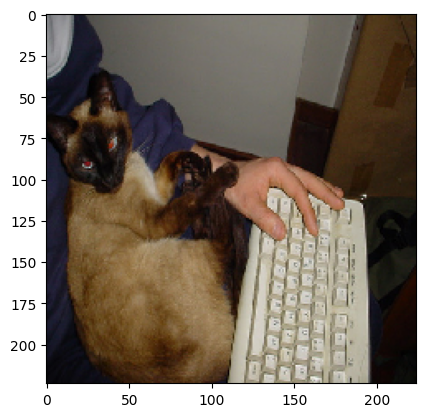

In [ ]:
img, x = load_image("/content/CAT_06/00001498_008.jpg")
print("shape of x: ", x.shape)
print("data type: ", x.dtype)
plt.imshow(img)

`shape of x:  (1, 224, 224, 3)`

The above output tells us that the image has been processed by tensorflow in the batch size of 1, the image size is 224x224 and 3 indicates that it is an RGB image.

### Making Predictions

 We forward `x` through `model` and then use the built-in `decode_predictions` to look up the class names.

In [ ]:
# forward the image through the network
predictions = model.predict(x)

for _, pred, prob in decode_predictions(predictions)[0]:
    print("predicted %s with probability %0.3f" % (pred, prob))

1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
35363/35363 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
predicted computer_keyboard with probability 0.671
predicted Siamese_cat with probability 0.324
predicted mouse with probability 0.003
predicted malinois with probability 0.001
predicted space_bar with probability 0.001


### Feature Extraction

A new model feat_extractor is created that takes the same input as ResNet-50 but outputs features from global average pooling layer in ResNet-50, which gives you a 2048-dimensional vector., which is the last convolutional layer in the fifth residual block of ResNet-50.

The avg_pool layer outputs a 2048-dimensional feature map for each image.

In [ ]:
feat_extractor = Model(inputs=model.input, outputs=model.get_layer("avg_pool").output)
feat_extractor.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, 230, 230, 3)    │              0 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 112, 112, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 112, 112, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, 114, 114, 64)   │              0 │ conv1_relu[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, 56, 56, 64)     │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 64)     │          4,160 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 64)     │         36,928 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv       │ (None, 56, 56, 256)    │         16,640 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_3_conv       │ (None, 56, 56, 256)    │         16,640 │ conv2_block1_2_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├──────────────────────

 Total params: 23,587,712 (89.98 MB)

 Trainable params: 23,534,592 (89.78 MB)

 Non-trainable params: 53,120 (207.50 KB)

Creates a feature extraction model using the RESNET50 architecture, where the output is taken from the  global average pooling layer in ResNet-50(avg_pool). This layer contains high-level features of the image.

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


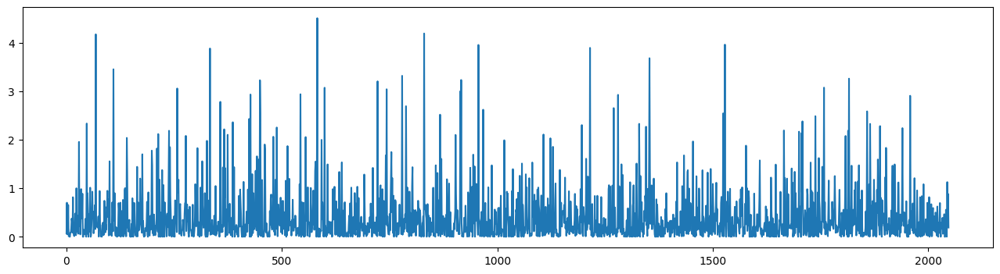

In [ ]:
img, x = load_image("/content/CAT_00/00000001_020.jpg")
feat = feat_extractor.predict(x)

plt.figure(figsize=(16,4))
plt.plot(feat[0].reshape(-1))

The `fc2` activations of two images which have similar content should be very close to each other.

In the next cell, we will open a folder of images for analysis. First, the next cell will just recursively crawl the folder specified by `image_path` looking for images of the extensions inside of `image_extensions` and then limiting them to a random subset of maximum `max_num_images` images just so we can reduce the time taken for feature extraction by limiting the number of input images.

In [ ]:
images_path = '/content/cats'
image_extensions = ['.jpg', '.png', '.jpeg']
max_num_images = 15000

images = [os.path.join(dp, f) for dp, dn, filenames in os.walk(images_path) for f in filenames if os.path.splitext(f)[1].lower() in image_extensions]
if max_num_images < len(images):
    images = [images[i] for i in sorted(random.sample(xrange(len(images)), max_num_images))]

print("keeping %d images to analyze" % len(images))

keeping 9997 images to analyze


### Extracting Features

Once the model is defined, we pass an image through the ResNet-50 network.

The predict function processes the image, and instead of predicting a class label, it gives us a feature map (2048 values) that captures the important characteristics of the image.

For example:

If the input image contains a cat, the feature map might include representations of edges, textures, shapes, and patterns that are relevant to recognizing a cat.

Each value in the feature map represents a different aspect of the image, such as specific patterns or high-level features like edges and textures, which the model considers important based on its training. These features are extracted from deep layers and provide a semantically rich representation of the image.

### Why We Are Doing Feature Extraction: (we can remove this cell later while presenting)
Dimensionality Reduction:

Raw images are high-dimensional (thousands of pixels), making direct comparisons between them computationally expensive and inefficient.
By extracting features, we reduce this complexity by representing the image in a lower-dimensional vector (4096 dimensions in this case), which still retains critical visual information.

Content Representation:

Instead of relying on pixel-wise comparisons (which don't work well for image retrieval), feature extraction allows us to represent images based on their content.
The VGG16 network has already learned general visual features through training on ImageNet, so it provides a powerful way to describe the image content in a meaningful way (like textures, shapes, and object parts).

Facilitating Similarity Measurement:

Once the feature vectors are extracted, we can compare them using similarity metrics like cosine similarity.
Images with similar feature vectors (i.e., similar content) will have a higher similarity score.
This allows us to retrieve images that are similar to a query image based on their high-level visual characteristics.

Transfer Learning:

By using a pre-trained model like VGG16, we benefit from the knowledge it has gained from being trained on millions of images.
Instead of training a model from scratch, we leverage this powerful feature extractor to work on our specific task, saving both time and computational resources.

In [ ]:
from tqdm import tqdm

features = []
for i, image_path in tqdm(enumerate(images), total=len(images)):
    img, x = load_image(image_path)
    feat = feat_extractor.predict(x)[0]
    features.append(feat)

    if i % 500 == 0 and i != 0:
        print(f"Analyzed {i} / {len(images)} images")

print('Finished extracting features for %d images' % len(images))


  0%|          | 0/9997 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  0%|          | 2/9997 [00:00<13:49, 12.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


  0%|          | 4/9997 [00:00<14:42, 11.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  0%|          | 6/9997 [00:00<13:57, 11.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  0%|          | 8/9997 [00:00<13:31, 12.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  0%|          | 10/9997 [00:00<13:42, 12.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  0%|          | 12/9997 [00:00<13:37, 12.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  0%|          | 14/9997 [00:01<13:25, 12.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


  0%|          | 16/9997 [00:01<13:58, 11.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


  0%|          | 18/9997 [00:01<16:37, 10.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


  0%|          | 20/9997 [00:01<17:57,  9.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


  0%|          | 21/9997 [00:01<18:11,  9.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


  0%|          | 22/9997 [00:02<18:14,  9.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


  0%|          | 23/9997 [00:02<18:56,  8.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


  0%|          | 24/9997 [00:02<19:02,  8.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


  0%|          | 25/9997 [00:02<20:07,  8.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


  0%|          | 26/9997 [00:02<19:46,  8.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


  0%|          | 27/9997 [00:02<19:38,  8.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


  0%|          | 28/9997 [00:02<21:21,  7.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


  0%|          | 29/9997 [00:03<22:32,  7.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


  0%|          | 30/9997 [00:03<21:32,  7.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


  0%|          | 31/9997 [00:03<20:38,  8.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


  0%|          | 32/9997 [00:03<20:29,  8.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


  0%|          | 33/9997 [00:03<22:08,  7.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


  0%|          | 34/9997 [00:03<21:51,  7.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


  0%|          | 35/9997 [00:03<21:20,  7.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


  0%|          | 36/9997 [00:03<22:04,  7.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


  0%|          | 37/9997 [00:04<21:49,  7.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


  0%|          | 38/9997 [00:04<23:05,  7.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


  0%|          | 39/9997 [00:04<24:58,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


  0%|          | 40/9997 [00:04<26:35,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


  0%|          | 41/9997 [00:04<25:36,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


  0%|          | 42/9997 [00:04<25:23,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


  0%|          | 43/9997 [00:05<26:13,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


  0%|          | 44/9997 [00:05<25:18,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


  0%|          | 45/9997 [00:05<25:38,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


  0%|          | 46/9997 [00:05<25:43,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


  0%|          | 47/9997 [00:05<26:46,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


  0%|          | 48/9997 [00:05<25:24,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


  0%|          | 49/9997 [00:05<23:47,  6.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


  1%|          | 50/9997 [00:06<25:59,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


  1%|          | 51/9997 [00:06<24:21,  6.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


  1%|          | 52/9997 [00:06<26:24,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


  1%|          | 53/9997 [00:06<24:32,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


  1%|          | 54/9997 [00:06<25:20,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


  1%|          | 55/9997 [00:06<24:50,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


  1%|          | 56/9997 [00:06<25:39,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


  1%|          | 57/9997 [00:07<27:41,  5.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


  1%|          | 58/9997 [00:07<26:12,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


  1%|          | 59/9997 [00:07<25:23,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


  1%|          | 60/9997 [00:07<24:44,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  1%|          | 62/9997 [00:07<19:57,  8.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  1%|          | 64/9997 [00:07<17:48,  9.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  1%|          | 66/9997 [00:08<16:20, 10.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  1%|          | 68/9997 [00:08<15:13, 10.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  1%|          | 70/9997 [00:08<15:35, 10.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  1%|          | 72/9997 [00:08<14:55, 11.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  1%|          | 74/9997 [00:08<14:44, 11.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  1%|          | 76/9997 [00:08<14:06, 11.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  1%|          | 78/9997 [00:09<14:09, 11.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


  1%|          | 80/9997 [00:09<13:57, 11.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  1%|          | 82/9997 [00:09<14:24, 11.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


  1%|          | 84/9997 [00:09<14:06, 11.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  1%|          | 86/9997 [00:09<15:01, 11.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  1%|          | 88/9997 [00:10<14:40, 11.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  1%|          | 90/9997 [00:10<14:11, 11.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


  1%|          | 92/9997 [00:10<14:15, 11.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


  1%|          | 94/9997 [00:10<20:49,  7.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  1%|          | 96/9997 [00:10<18:28,  8.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


  1%|          | 98/9997 [00:11<16:56,  9.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  1%|          | 100/9997 [00:11<15:54, 10.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  1%|          | 102/9997 [00:11<15:34, 10.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  1%|          | 104/9997 [00:11<14:52, 11.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


  1%|          | 106/9997 [00:11<14:56, 11.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  1%|          | 108/9997 [00:11<14:18, 11.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  1%|          | 110/9997 [00:12<14:04, 11.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  1%|          | 112/9997 [00:12<14:01, 11.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  1%|          | 114/9997 [00:12<14:24, 11.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  1%|          | 116/9997 [00:12<13:50, 11.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  1%|          | 118/9997 [00:12<13:39, 12.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  1%|          | 120/9997 [00:12<13:27, 12.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  1%|          | 122/9997 [00:13<13:20, 12.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


  1%|          | 124/9997 [00:13<13:23, 12.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  1%|▏         | 126/9997 [00:13<14:16, 11.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  1%|▏         | 128/9997 [00:13<13:59, 11.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  1%|▏         | 130/9997 [00:13<13:55, 11.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  1%|▏         | 132/9997 [00:13<13:40, 12.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  1%|▏         | 134/9997 [00:14<13:24, 12.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


  1%|▏         | 136/9997 [00:14<13:04, 12.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  1%|▏         | 138/9997 [00:14<13:28, 12.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  1%|▏         | 140/9997 [00:14<13:16, 12.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  1%|▏         | 142/9997 [00:14<13:16, 12.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  1%|▏         | 144/9997 [00:14<13:28, 12.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  1%|▏         | 146/9997 [00:15<13:46, 11.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  1%|▏         | 148/9997 [00:15<13:38, 12.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


  2%|▏         | 150/9997 [00:15<14:21, 11.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


  2%|▏         | 152/9997 [00:15<13:38, 12.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  2%|▏         | 154/9997 [00:15<13:32, 12.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  2%|▏         | 156/9997 [00:15<13:34, 12.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  2%|▏         | 158/9997 [00:16<13:47, 11.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  2%|▏         | 160/9997 [00:16<13:46, 11.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  2%|▏         | 162/9997 [00:16<14:08, 11.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


  2%|▏         | 164/9997 [00:16<13:42, 11.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


  2%|▏         | 166/9997 [00:16<13:53, 11.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  2%|▏         | 168/9997 [00:16<13:54, 11.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  2%|▏         | 170/9997 [00:17<13:41, 11.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  2%|▏         | 172/9997 [00:17<13:41, 11.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  2%|▏         | 174/9997 [00:17<14:39, 11.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


  2%|▏         | 176/9997 [00:17<15:11, 10.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


  2%|▏         | 178/9997 [00:17<17:16,  9.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


  2%|▏         | 179/9997 [00:18<18:24,  8.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


  2%|▏         | 180/9997 [00:18<18:16,  8.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


  2%|▏         | 181/9997 [00:18<19:37,  8.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


  2%|▏         | 182/9997 [00:18<20:59,  7.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


  2%|▏         | 183/9997 [00:18<20:11,  8.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


  2%|▏         | 184/9997 [00:18<19:58,  8.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


  2%|▏         | 185/9997 [00:18<20:08,  8.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


  2%|▏         | 186/9997 [00:18<19:28,  8.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


  2%|▏         | 187/9997 [00:19<20:28,  7.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


  2%|▏         | 188/9997 [00:19<21:44,  7.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


  2%|▏         | 189/9997 [00:19<21:30,  7.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


  2%|▏         | 190/9997 [00:19<23:06,  7.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


  2%|▏         | 191/9997 [00:19<24:27,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


  2%|▏         | 192/9997 [00:19<23:14,  7.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


  2%|▏         | 193/9997 [00:20<24:21,  6.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


  2%|▏         | 194/9997 [00:20<23:33,  6.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


  2%|▏         | 195/9997 [00:20<22:43,  7.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


  2%|▏         | 196/9997 [00:20<24:16,  6.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


  2%|▏         | 197/9997 [00:20<23:40,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


  2%|▏         | 198/9997 [00:20<23:53,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


  2%|▏         | 199/9997 [00:20<23:19,  7.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


  2%|▏         | 200/9997 [00:21<22:35,  7.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


  2%|▏         | 201/9997 [00:21<26:01,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


  2%|▏         | 202/9997 [00:21<25:08,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


  2%|▏         | 203/9997 [00:21<24:23,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


  2%|▏         | 204/9997 [00:21<25:26,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


  2%|▏         | 205/9997 [00:21<25:04,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


  2%|▏         | 206/9997 [00:21<25:54,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


  2%|▏         | 207/9997 [00:22<24:42,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


  2%|▏         | 208/9997 [00:22<27:03,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


  2%|▏         | 209/9997 [00:22<25:58,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


  2%|▏         | 210/9997 [00:22<25:06,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


  2%|▏         | 211/9997 [00:22<23:43,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


  2%|▏         | 212/9997 [00:22<23:21,  6.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


  2%|▏         | 213/9997 [00:23<23:40,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


  2%|▏         | 214/9997 [00:23<26:05,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


  2%|▏         | 215/9997 [00:23<27:45,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


  2%|▏         | 216/9997 [00:23<29:25,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  2%|▏         | 217/9997 [00:23<25:42,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step


  2%|▏         | 218/9997 [00:23<31:14,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


  2%|▏         | 219/9997 [00:24<36:33,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  2%|▏         | 220/9997 [00:24<33:35,  4.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  2%|▏         | 222/9997 [00:24<24:06,  6.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  2%|▏         | 224/9997 [00:24<19:53,  8.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


  2%|▏         | 226/9997 [00:25<20:54,  7.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


  2%|▏         | 227/9997 [00:25<25:16,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


  2%|▏         | 228/9997 [00:25<30:50,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  2%|▏         | 230/9997 [00:25<24:00,  6.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  2%|▏         | 232/9997 [00:25<20:23,  7.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  2%|▏         | 234/9997 [00:26<18:09,  8.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  2%|▏         | 236/9997 [00:26<16:25,  9.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  2%|▏         | 238/9997 [00:26<16:21,  9.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  2%|▏         | 240/9997 [00:26<15:36, 10.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  2%|▏         | 242/9997 [00:26<14:57, 10.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  2%|▏         | 244/9997 [00:26<14:32, 11.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  2%|▏         | 246/9997 [00:27<14:31, 11.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


  2%|▏         | 248/9997 [00:27<14:31, 11.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  3%|▎         | 250/9997 [00:27<15:09, 10.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  3%|▎         | 252/9997 [00:27<14:36, 11.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  3%|▎         | 254/9997 [00:27<14:21, 11.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  3%|▎         | 256/9997 [00:28<14:16, 11.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  3%|▎         | 258/9997 [00:28<14:07, 11.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


  3%|▎         | 260/9997 [00:28<14:32, 11.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  3%|▎         | 262/9997 [00:28<14:20, 11.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  3%|▎         | 264/9997 [00:28<14:27, 11.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  3%|▎         | 266/9997 [00:28<14:01, 11.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  3%|▎         | 268/9997 [00:29<13:48, 11.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  3%|▎         | 270/9997 [00:29<13:43, 11.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


  3%|▎         | 272/9997 [00:29<14:12, 11.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  3%|▎         | 274/9997 [00:29<14:33, 11.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  3%|▎         | 276/9997 [00:29<14:06, 11.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  3%|▎         | 278/9997 [00:29<13:53, 11.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  3%|▎         | 280/9997 [00:30<13:38, 11.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  3%|▎         | 282/9997 [00:30<13:25, 12.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  3%|▎         | 284/9997 [00:30<14:14, 11.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  3%|▎         | 286/9997 [00:30<14:12, 11.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  3%|▎         | 288/9997 [00:30<13:51, 11.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  3%|▎         | 290/9997 [00:31<13:45, 11.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


  3%|▎         | 292/9997 [00:31<13:53, 11.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


  3%|▎         | 294/9997 [00:31<13:59, 11.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  3%|▎         | 296/9997 [00:31<14:04, 11.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  3%|▎         | 298/9997 [00:31<14:23, 11.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  3%|▎         | 300/9997 [00:31<13:52, 11.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  3%|▎         | 302/9997 [00:32<13:39, 11.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  3%|▎         | 304/9997 [00:32<13:28, 11.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


  3%|▎         | 306/9997 [00:32<13:43, 11.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  3%|▎         | 308/9997 [00:32<14:04, 11.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


  3%|▎         | 310/9997 [00:32<14:15, 11.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  3%|▎         | 312/9997 [00:32<13:51, 11.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  3%|▎         | 314/9997 [00:33<13:39, 11.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  3%|▎         | 316/9997 [00:33<13:31, 11.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


  3%|▎         | 318/9997 [00:33<14:10, 11.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  3%|▎         | 320/9997 [00:33<14:04, 11.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


  3%|▎         | 322/9997 [00:33<16:08,  9.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


  3%|▎         | 324/9997 [00:34<16:46,  9.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


  3%|▎         | 325/9997 [00:34<17:31,  9.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


  3%|▎         | 326/9997 [00:34<18:20,  8.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


  3%|▎         | 327/9997 [00:34<19:19,  8.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


  3%|▎         | 328/9997 [00:34<19:04,  8.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


  3%|▎         | 329/9997 [00:34<19:30,  8.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


  3%|▎         | 330/9997 [00:34<19:17,  8.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


  3%|▎         | 331/9997 [00:34<19:20,  8.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


  3%|▎         | 332/9997 [00:35<20:34,  7.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


  3%|▎         | 333/9997 [00:35<20:29,  7.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


  3%|▎         | 334/9997 [00:35<21:31,  7.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


  3%|▎         | 335/9997 [00:35<20:59,  7.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


  3%|▎         | 336/9997 [00:35<21:00,  7.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


  3%|▎         | 337/9997 [00:35<23:04,  6.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


  3%|▎         | 338/9997 [00:35<21:50,  7.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


  3%|▎         | 339/9997 [00:36<20:36,  7.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


  3%|▎         | 340/9997 [00:36<20:47,  7.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


  3%|▎         | 341/9997 [00:36<21:58,  7.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


  3%|▎         | 342/9997 [00:36<22:59,  7.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


  3%|▎         | 343/9997 [00:36<22:32,  7.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


  3%|▎         | 344/9997 [00:36<22:11,  7.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


  3%|▎         | 345/9997 [00:36<25:38,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


  3%|▎         | 346/9997 [00:37<25:08,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


  3%|▎         | 347/9997 [00:37<27:15,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


  3%|▎         | 348/9997 [00:37<30:08,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


  3%|▎         | 349/9997 [00:37<29:46,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


  4%|▎         | 350/9997 [00:37<27:02,  5.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


  4%|▎         | 351/9997 [00:38<28:06,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


  4%|▎         | 352/9997 [00:38<25:57,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


  4%|▎         | 353/9997 [00:38<23:59,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


  4%|▎         | 354/9997 [00:38<25:48,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


  4%|▎         | 355/9997 [00:38<25:04,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


  4%|▎         | 356/9997 [00:38<24:05,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


  4%|▎         | 357/9997 [00:38<24:58,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


  4%|▎         | 358/9997 [00:39<25:59,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


  4%|▎         | 359/9997 [00:39<24:43,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


  4%|▎         | 360/9997 [00:39<26:12,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


  4%|▎         | 361/9997 [00:39<26:12,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


  4%|▎         | 362/9997 [00:39<25:09,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


  4%|▎         | 363/9997 [00:39<24:09,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


  4%|▎         | 364/9997 [00:40<23:49,  6.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  4%|▎         | 365/9997 [00:40<21:46,  7.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  4%|▎         | 367/9997 [00:40<18:04,  8.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


  4%|▎         | 368/9997 [00:40<17:51,  8.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  4%|▎         | 370/9997 [00:40<16:14,  9.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


  4%|▎         | 372/9997 [00:40<15:16, 10.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  4%|▎         | 374/9997 [00:40<14:22, 11.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  4%|▍         | 376/9997 [00:41<14:01, 11.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  4%|▍         | 378/9997 [00:41<15:04, 10.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  4%|▍         | 380/9997 [00:41<14:55, 10.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


  4%|▍         | 382/9997 [00:41<14:28, 11.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  4%|▍         | 384/9997 [00:41<14:00, 11.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  4%|▍         | 386/9997 [00:41<13:38, 11.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  4%|▍         | 388/9997 [00:42<13:36, 11.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  4%|▍         | 390/9997 [00:42<13:38, 11.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  4%|▍         | 392/9997 [00:42<13:59, 11.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  4%|▍         | 394/9997 [00:42<13:36, 11.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  4%|▍         | 396/9997 [00:42<13:32, 11.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  4%|▍         | 398/9997 [00:42<13:34, 11.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  4%|▍         | 400/9997 [00:43<13:23, 11.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


  4%|▍         | 402/9997 [00:43<13:59, 11.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


  4%|▍         | 404/9997 [00:43<13:56, 11.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


  4%|▍         | 406/9997 [00:43<13:55, 11.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  4%|▍         | 408/9997 [00:43<13:30, 11.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


  4%|▍         | 410/9997 [00:43<13:08, 12.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  4%|▍         | 412/9997 [00:44<12:57, 12.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


  4%|▍         | 414/9997 [00:44<13:25, 11.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  4%|▍         | 416/9997 [00:44<14:18, 11.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  4%|▍         | 418/9997 [00:44<14:03, 11.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


  4%|▍         | 420/9997 [00:44<13:51, 11.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  4%|▍         | 422/9997 [00:45<13:41, 11.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  4%|▍         | 424/9997 [00:45<13:32, 11.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


  4%|▍         | 426/9997 [00:45<14:22, 11.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


  4%|▍         | 428/9997 [00:45<13:59, 11.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


  4%|▍         | 430/9997 [00:45<13:54, 11.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  4%|▍         | 432/9997 [00:45<13:34, 11.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  4%|▍         | 434/9997 [00:46<13:22, 11.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  4%|▍         | 436/9997 [00:46<13:43, 11.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  4%|▍         | 438/9997 [00:46<14:32, 10.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


  4%|▍         | 440/9997 [00:46<14:04, 11.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  4%|▍         | 442/9997 [00:46<13:54, 11.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  4%|▍         | 444/9997 [00:46<13:45, 11.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  4%|▍         | 446/9997 [00:47<13:54, 11.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


  4%|▍         | 448/9997 [00:47<14:02, 11.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  5%|▍         | 450/9997 [00:47<14:34, 10.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  5%|▍         | 452/9997 [00:47<14:10, 11.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  5%|▍         | 454/9997 [00:47<14:44, 10.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  5%|▍         | 456/9997 [00:48<14:25, 11.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


  5%|▍         | 458/9997 [00:48<14:50, 10.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


  5%|▍         | 460/9997 [00:48<15:21, 10.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  5%|▍         | 462/9997 [00:48<14:46, 10.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  5%|▍         | 464/9997 [00:48<14:23, 11.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  5%|▍         | 466/9997 [00:48<14:19, 11.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  5%|▍         | 468/9997 [00:49<14:35, 10.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


  5%|▍         | 470/9997 [00:49<14:26, 11.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  5%|▍         | 472/9997 [00:49<15:10, 10.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  5%|▍         | 474/9997 [00:49<14:37, 10.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  5%|▍         | 476/9997 [00:49<14:01, 11.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


  5%|▍         | 478/9997 [00:50<13:57, 11.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


  5%|▍         | 480/9997 [00:50<16:11,  9.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


  5%|▍         | 482/9997 [00:50<17:44,  8.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


  5%|▍         | 483/9997 [00:50<17:47,  8.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


  5%|▍         | 484/9997 [00:50<18:27,  8.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


  5%|▍         | 485/9997 [00:50<17:57,  8.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


  5%|▍         | 486/9997 [00:51<18:12,  8.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


  5%|▍         | 487/9997 [00:51<18:15,  8.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


  5%|▍         | 488/9997 [00:51<19:20,  8.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


  5%|▍         | 489/9997 [00:51<20:39,  7.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


  5%|▍         | 490/9997 [00:51<21:09,  7.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


  5%|▍         | 491/9997 [00:51<21:18,  7.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


  5%|▍         | 492/9997 [00:51<21:16,  7.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


  5%|▍         | 493/9997 [00:52<20:52,  7.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


  5%|▍         | 494/9997 [00:52<20:30,  7.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


  5%|▍         | 495/9997 [00:52<20:27,  7.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


  5%|▍         | 496/9997 [00:52<22:42,  6.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


  5%|▍         | 497/9997 [00:52<22:02,  7.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


  5%|▍         | 498/9997 [00:52<21:17,  7.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


  5%|▍         | 499/9997 [00:52<22:53,  6.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


  5%|▌         | 500/9997 [00:52<21:40,  7.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


  5%|▌         | 501/9997 [00:53<21:07,  7.49it/s]

Analyzed 500 / 9997 images
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


  5%|▌         | 502/9997 [00:53<22:21,  7.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


  5%|▌         | 503/9997 [00:53<26:33,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


  5%|▌         | 504/9997 [00:53<26:56,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


  5%|▌         | 505/9997 [00:53<25:25,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


  5%|▌         | 506/9997 [00:53<25:42,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


  5%|▌         | 507/9997 [00:54<24:22,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


  5%|▌         | 508/9997 [00:54<25:18,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


  5%|▌         | 509/9997 [00:54<27:03,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


  5%|▌         | 510/9997 [00:54<25:59,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


  5%|▌         | 511/9997 [00:54<28:13,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


  5%|▌         | 512/9997 [00:54<26:10,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


  5%|▌         | 513/9997 [00:55<25:58,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


  5%|▌         | 514/9997 [00:55<25:16,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


  5%|▌         | 515/9997 [00:55<24:38,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


  5%|▌         | 516/9997 [00:55<24:13,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


  5%|▌         | 517/9997 [00:55<23:44,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


  5%|▌         | 518/9997 [00:55<26:26,  5.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


  5%|▌         | 519/9997 [00:56<25:40,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


  5%|▌         | 520/9997 [00:56<25:16,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


  5%|▌         | 521/9997 [00:56<27:30,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


  5%|▌         | 522/9997 [00:56<25:44,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


  5%|▌         | 523/9997 [00:56<25:36,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


  5%|▌         | 524/9997 [00:56<25:27,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  5%|▌         | 526/9997 [00:57<20:06,  7.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  5%|▌         | 528/9997 [00:57<17:50,  8.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


  5%|▌         | 529/9997 [00:57<18:40,  8.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  5%|▌         | 531/9997 [00:57<16:51,  9.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


  5%|▌         | 533/9997 [00:57<16:02,  9.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


  5%|▌         | 535/9997 [00:57<15:27, 10.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  5%|▌         | 537/9997 [00:58<15:13, 10.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


  5%|▌         | 539/9997 [00:58<14:44, 10.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  5%|▌         | 541/9997 [00:58<15:02, 10.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  5%|▌         | 543/9997 [00:58<14:46, 10.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  5%|▌         | 545/9997 [00:58<14:20, 10.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  5%|▌         | 547/9997 [00:59<13:59, 11.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  5%|▌         | 549/9997 [00:59<13:46, 11.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


  6%|▌         | 551/9997 [00:59<14:19, 10.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  6%|▌         | 553/9997 [00:59<14:23, 10.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  6%|▌         | 555/9997 [00:59<14:08, 11.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  6%|▌         | 557/9997 [00:59<13:48, 11.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


  6%|▌         | 559/9997 [01:00<14:01, 11.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  6%|▌         | 561/9997 [01:00<14:08, 11.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


  6%|▌         | 563/9997 [01:00<14:43, 10.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  6%|▌         | 565/9997 [01:00<14:29, 10.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  6%|▌         | 567/9997 [01:00<14:10, 11.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


  6%|▌         | 569/9997 [01:01<14:03, 11.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  6%|▌         | 571/9997 [01:01<14:03, 11.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


  6%|▌         | 573/9997 [01:01<14:16, 11.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  6%|▌         | 575/9997 [01:01<14:18, 10.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  6%|▌         | 577/9997 [01:01<14:24, 10.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  6%|▌         | 579/9997 [01:01<14:16, 11.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  6%|▌         | 581/9997 [01:02<14:29, 10.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  6%|▌         | 583/9997 [01:02<14:16, 11.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


  6%|▌         | 585/9997 [01:02<14:36, 10.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


  6%|▌         | 587/9997 [01:02<14:25, 10.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  6%|▌         | 589/9997 [01:02<14:23, 10.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


  6%|▌         | 591/9997 [01:03<14:11, 11.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  6%|▌         | 593/9997 [01:03<14:11, 11.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


  6%|▌         | 595/9997 [01:03<14:18, 10.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  6%|▌         | 597/9997 [01:03<14:21, 10.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


  6%|▌         | 599/9997 [01:03<14:23, 10.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  6%|▌         | 601/9997 [01:03<14:08, 11.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  6%|▌         | 603/9997 [01:04<13:44, 11.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  6%|▌         | 605/9997 [01:04<13:57, 11.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  6%|▌         | 607/9997 [01:04<14:16, 10.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


  6%|▌         | 609/9997 [01:04<14:02, 11.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  6%|▌         | 611/9997 [01:04<14:15, 10.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  6%|▌         | 613/9997 [01:05<13:59, 11.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


  6%|▌         | 615/9997 [01:05<14:12, 11.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


  6%|▌         | 617/9997 [01:05<14:39, 10.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  6%|▌         | 619/9997 [01:05<14:29, 10.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  6%|▌         | 621/9997 [01:05<14:28, 10.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  6%|▌         | 623/9997 [01:05<14:26, 10.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  6%|▋         | 625/9997 [01:06<14:17, 10.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


  6%|▋         | 627/9997 [01:06<14:29, 10.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  6%|▋         | 629/9997 [01:06<14:51, 10.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


  6%|▋         | 631/9997 [01:06<14:33, 10.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  6%|▋         | 633/9997 [01:06<14:20, 10.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


  6%|▋         | 635/9997 [01:07<16:12,  9.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


  6%|▋         | 636/9997 [01:07<17:26,  8.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


  6%|▋         | 637/9997 [01:07<18:39,  8.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


  6%|▋         | 638/9997 [01:07<19:18,  8.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


  6%|▋         | 639/9997 [01:07<18:39,  8.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


  6%|▋         | 640/9997 [01:07<18:35,  8.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


  6%|▋         | 641/9997 [01:07<19:26,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


  6%|▋         | 642/9997 [01:08<19:01,  8.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


  6%|▋         | 643/9997 [01:08<18:40,  8.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


  6%|▋         | 644/9997 [01:08<18:50,  8.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


  6%|▋         | 645/9997 [01:08<19:56,  7.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


  6%|▋         | 646/9997 [01:08<19:07,  8.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


  6%|▋         | 647/9997 [01:08<19:21,  8.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


  6%|▋         | 648/9997 [01:08<20:02,  7.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


  6%|▋         | 649/9997 [01:08<19:41,  7.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


  7%|▋         | 650/9997 [01:09<19:41,  7.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


  7%|▋         | 651/9997 [01:09<21:11,  7.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


  7%|▋         | 652/9997 [01:09<20:18,  7.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


  7%|▋         | 653/9997 [01:09<20:09,  7.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


  7%|▋         | 654/9997 [01:09<19:28,  7.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


  7%|▋         | 655/9997 [01:09<19:27,  8.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


  7%|▋         | 656/9997 [01:09<19:35,  7.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


  7%|▋         | 657/9997 [01:09<20:02,  7.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


  7%|▋         | 658/9997 [01:10<19:50,  7.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


  7%|▋         | 659/9997 [01:10<19:47,  7.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


  7%|▋         | 660/9997 [01:10<38:59,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


  7%|▋         | 661/9997 [01:11<1:01:46,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


  7%|▋         | 662/9997 [01:11<57:45,  2.69it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


  7%|▋         | 663/9997 [01:11<46:28,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


  7%|▋         | 664/9997 [01:12<41:01,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


  7%|▋         | 665/9997 [01:12<36:11,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


  7%|▋         | 666/9997 [01:12<33:04,  4.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


  7%|▋         | 667/9997 [01:12<29:15,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


  7%|▋         | 668/9997 [01:12<30:26,  5.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


  7%|▋         | 669/9997 [01:12<27:40,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


  7%|▋         | 670/9997 [01:13<26:01,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


  7%|▋         | 671/9997 [01:13<24:59,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


  7%|▋         | 672/9997 [01:13<26:16,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


  7%|▋         | 673/9997 [01:13<24:41,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


  7%|▋         | 674/9997 [01:13<24:34,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


  7%|▋         | 675/9997 [01:13<26:39,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  7%|▋         | 676/9997 [01:14<23:35,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  7%|▋         | 678/9997 [01:14<18:55,  8.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


  7%|▋         | 680/9997 [01:14<16:49,  9.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  7%|▋         | 681/9997 [01:14<16:43,  9.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  7%|▋         | 683/9997 [01:14<15:32,  9.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  7%|▋         | 685/9997 [01:14<14:55, 10.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  7%|▋         | 687/9997 [01:15<14:45, 10.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  7%|▋         | 689/9997 [01:15<14:21, 10.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


  7%|▋         | 691/9997 [01:15<14:22, 10.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  7%|▋         | 693/9997 [01:15<14:31, 10.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  7%|▋         | 695/9997 [01:15<14:07, 10.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  7%|▋         | 697/9997 [01:15<13:47, 11.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


  7%|▋         | 699/9997 [01:16<14:57, 10.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  7%|▋         | 701/9997 [01:16<14:22, 10.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  7%|▋         | 703/9997 [01:16<14:24, 10.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  7%|▋         | 705/9997 [01:16<14:06, 10.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  7%|▋         | 707/9997 [01:16<13:42, 11.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  7%|▋         | 709/9997 [01:16<13:49, 11.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  7%|▋         | 711/9997 [01:17<13:45, 11.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


  7%|▋         | 713/9997 [01:17<13:55, 11.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  7%|▋         | 715/9997 [01:17<14:09, 10.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  7%|▋         | 717/9997 [01:17<13:59, 11.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  7%|▋         | 719/9997 [01:17<13:30, 11.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  7%|▋         | 721/9997 [01:18<14:52, 10.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


  7%|▋         | 723/9997 [01:18<14:26, 10.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  7%|▋         | 725/9997 [01:18<15:09, 10.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  7%|▋         | 727/9997 [01:18<14:31, 10.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  7%|▋         | 729/9997 [01:18<14:21, 10.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  7%|▋         | 731/9997 [01:19<14:22, 10.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  7%|▋         | 733/9997 [01:19<13:52, 11.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


  7%|▋         | 735/9997 [01:19<14:11, 10.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  7%|▋         | 737/9997 [01:19<13:58, 11.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  7%|▋         | 739/9997 [01:19<13:46, 11.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  7%|▋         | 741/9997 [01:19<13:26, 11.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  7%|▋         | 743/9997 [01:20<13:36, 11.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  7%|▋         | 745/9997 [01:20<13:27, 11.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  7%|▋         | 747/9997 [01:20<14:04, 10.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  7%|▋         | 749/9997 [01:20<13:38, 11.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  8%|▊         | 751/9997 [01:20<13:57, 11.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  8%|▊         | 753/9997 [01:21<14:05, 10.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


  8%|▊         | 755/9997 [01:21<14:14, 10.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


  8%|▊         | 757/9997 [01:21<15:31,  9.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  8%|▊         | 759/9997 [01:21<14:54, 10.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


  8%|▊         | 761/9997 [01:21<14:36, 10.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  8%|▊         | 763/9997 [01:21<14:43, 10.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


  8%|▊         | 765/9997 [01:22<14:46, 10.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


  8%|▊         | 767/9997 [01:22<15:36,  9.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  8%|▊         | 768/9997 [01:22<16:05,  9.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  8%|▊         | 770/9997 [01:22<15:26,  9.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  8%|▊         | 772/9997 [01:22<14:46, 10.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  8%|▊         | 774/9997 [01:23<14:10, 10.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  8%|▊         | 776/9997 [01:23<13:58, 11.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  8%|▊         | 778/9997 [01:23<15:20, 10.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  8%|▊         | 780/9997 [01:23<14:51, 10.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  8%|▊         | 782/9997 [01:23<14:25, 10.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


  8%|▊         | 784/9997 [01:24<15:26,  9.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


  8%|▊         | 786/9997 [01:24<18:49,  8.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


  8%|▊         | 787/9997 [01:24<19:05,  8.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


  8%|▊         | 788/9997 [01:24<18:46,  8.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


  8%|▊         | 789/9997 [01:24<19:33,  7.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


  8%|▊         | 790/9997 [01:24<19:34,  7.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


  8%|▊         | 791/9997 [01:25<19:36,  7.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


  8%|▊         | 792/9997 [01:25<19:26,  7.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


  8%|▊         | 793/9997 [01:25<19:58,  7.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


  8%|▊         | 794/9997 [01:25<20:10,  7.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


  8%|▊         | 795/9997 [01:25<19:22,  7.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


  8%|▊         | 796/9997 [01:25<19:04,  8.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


  8%|▊         | 797/9997 [01:25<22:02,  6.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


  8%|▊         | 799/9997 [01:26<19:32,  7.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


  8%|▊         | 800/9997 [01:26<19:15,  7.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


  8%|▊         | 801/9997 [01:26<20:34,  7.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


  8%|▊         | 802/9997 [01:26<20:09,  7.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


  8%|▊         | 803/9997 [01:26<20:05,  7.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


  8%|▊         | 804/9997 [01:26<19:36,  7.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


  8%|▊         | 805/9997 [01:26<19:19,  7.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


  8%|▊         | 806/9997 [01:26<18:52,  8.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


  8%|▊         | 807/9997 [01:27<18:32,  8.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


  8%|▊         | 808/9997 [01:27<19:57,  7.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


  8%|▊         | 809/9997 [01:27<21:19,  7.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


  8%|▊         | 810/9997 [01:27<21:20,  7.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


  8%|▊         | 811/9997 [01:27<21:28,  7.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


  8%|▊         | 812/9997 [01:27<21:46,  7.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


  8%|▊         | 813/9997 [01:27<22:29,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


  8%|▊         | 814/9997 [01:28<23:30,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


  8%|▊         | 815/9997 [01:28<23:13,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


  8%|▊         | 816/9997 [01:28<24:07,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


  8%|▊         | 817/9997 [01:28<23:54,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


  8%|▊         | 818/9997 [01:28<23:30,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


  8%|▊         | 819/9997 [01:28<22:22,  6.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


  8%|▊         | 820/9997 [01:29<23:39,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


  8%|▊         | 821/9997 [01:29<24:21,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


  8%|▊         | 822/9997 [01:29<25:11,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


  8%|▊         | 823/9997 [01:29<24:34,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


  8%|▊         | 824/9997 [01:29<23:09,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


  8%|▊         | 825/9997 [01:29<23:14,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


  8%|▊         | 826/9997 [01:30<23:22,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


  8%|▊         | 827/9997 [01:30<22:53,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


  8%|▊         | 828/9997 [01:30<22:29,  6.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


  8%|▊         | 829/9997 [01:30<24:50,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


  8%|▊         | 830/9997 [01:30<27:03,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


  8%|▊         | 831/9997 [01:30<24:49,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


  8%|▊         | 832/9997 [01:31<24:46,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


  8%|▊         | 833/9997 [01:31<24:01,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


  8%|▊         | 835/9997 [01:31<19:08,  7.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  8%|▊         | 837/9997 [01:31<17:05,  8.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


  8%|▊         | 839/9997 [01:31<15:53,  9.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  8%|▊         | 841/9997 [01:31<14:52, 10.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  8%|▊         | 843/9997 [01:32<14:17, 10.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  8%|▊         | 845/9997 [01:32<13:48, 11.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


  8%|▊         | 847/9997 [01:32<13:48, 11.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  8%|▊         | 849/9997 [01:32<13:45, 11.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


  9%|▊         | 851/9997 [01:32<14:02, 10.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  9%|▊         | 853/9997 [01:32<14:01, 10.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  9%|▊         | 855/9997 [01:33<13:34, 11.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  9%|▊         | 857/9997 [01:33<13:37, 11.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  9%|▊         | 859/9997 [01:33<14:15, 10.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  9%|▊         | 861/9997 [01:33<14:09, 10.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  9%|▊         | 863/9997 [01:33<13:58, 10.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  9%|▊         | 865/9997 [01:34<13:42, 11.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  9%|▊         | 867/9997 [01:34<13:18, 11.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


  9%|▊         | 869/9997 [01:34<13:28, 11.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  9%|▊         | 871/9997 [01:34<13:44, 11.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  9%|▊         | 873/9997 [01:34<13:28, 11.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  9%|▉         | 875/9997 [01:34<14:35, 10.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  9%|▉         | 877/9997 [01:35<14:11, 10.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


  9%|▉         | 879/9997 [01:35<13:56, 10.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  9%|▉         | 881/9997 [01:35<13:56, 10.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  9%|▉         | 883/9997 [01:35<13:42, 11.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  9%|▉         | 885/9997 [01:35<13:54, 10.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


  9%|▉         | 887/9997 [01:36<13:54, 10.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  9%|▉         | 889/9997 [01:36<13:29, 11.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


  9%|▉         | 891/9997 [01:36<13:51, 10.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


  9%|▉         | 893/9997 [01:36<13:29, 11.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


  9%|▉         | 895/9997 [01:36<13:13, 11.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


  9%|▉         | 897/9997 [01:36<13:31, 11.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  9%|▉         | 899/9997 [01:37<13:04, 11.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  9%|▉         | 901/9997 [01:37<13:15, 11.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  9%|▉         | 903/9997 [01:37<13:44, 11.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  9%|▉         | 905/9997 [01:37<13:31, 11.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


  9%|▉         | 907/9997 [01:37<13:19, 11.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  9%|▉         | 909/9997 [01:37<13:16, 11.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  9%|▉         | 911/9997 [01:38<13:20, 11.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


  9%|▉         | 913/9997 [01:38<13:22, 11.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  9%|▉         | 915/9997 [01:38<14:10, 10.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  9%|▉         | 917/9997 [01:38<13:50, 10.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


  9%|▉         | 919/9997 [01:38<13:20, 11.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


  9%|▉         | 921/9997 [01:39<13:38, 11.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  9%|▉         | 923/9997 [01:39<13:57, 10.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  9%|▉         | 925/9997 [01:39<14:42, 10.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  9%|▉         | 927/9997 [01:39<14:03, 10.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  9%|▉         | 929/9997 [01:39<13:40, 11.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  9%|▉         | 931/9997 [01:39<13:43, 11.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  9%|▉         | 933/9997 [01:40<13:33, 11.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


  9%|▉         | 935/9997 [01:40<13:44, 10.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


  9%|▉         | 937/9997 [01:40<13:57, 10.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


  9%|▉         | 939/9997 [01:40<13:51, 10.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  9%|▉         | 941/9997 [01:40<13:31, 11.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


  9%|▉         | 943/9997 [01:41<13:29, 11.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


  9%|▉         | 945/9997 [01:41<14:04, 10.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


  9%|▉         | 947/9997 [01:41<15:23,  9.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


  9%|▉         | 948/9997 [01:41<15:56,  9.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


  9%|▉         | 949/9997 [01:41<17:43,  8.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 10%|▉         | 950/9997 [01:41<17:59,  8.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 10%|▉         | 951/9997 [01:42<18:40,  8.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 10%|▉         | 952/9997 [01:42<19:07,  7.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 10%|▉         | 953/9997 [01:42<19:54,  7.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 10%|▉         | 954/9997 [01:42<19:13,  7.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 10%|▉         | 955/9997 [01:42<19:04,  7.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 10%|▉         | 956/9997 [01:42<18:56,  7.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 10%|▉         | 957/9997 [01:42<19:27,  7.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 10%|▉         | 958/9997 [01:42<19:05,  7.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 10%|▉         | 959/9997 [01:43<19:40,  7.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 10%|▉         | 960/9997 [01:43<19:09,  7.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 10%|▉         | 961/9997 [01:43<21:46,  6.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 10%|▉         | 962/9997 [01:43<21:09,  7.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 10%|▉         | 963/9997 [01:43<19:57,  7.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 10%|▉         | 964/9997 [01:43<19:47,  7.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 10%|▉         | 965/9997 [01:43<20:13,  7.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 10%|▉         | 966/9997 [01:44<19:43,  7.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 10%|▉         | 967/9997 [01:44<19:42,  7.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 10%|▉         | 968/9997 [01:44<21:32,  6.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 10%|▉         | 969/9997 [01:44<21:36,  6.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 10%|▉         | 970/9997 [01:44<20:33,  7.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 10%|▉         | 971/9997 [01:44<21:42,  6.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 10%|▉         | 972/9997 [01:44<23:52,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 10%|▉         | 973/9997 [01:45<26:01,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 10%|▉         | 974/9997 [01:45<26:53,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 10%|▉         | 975/9997 [01:45<27:23,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 10%|▉         | 976/9997 [01:45<25:39,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 10%|▉         | 977/9997 [01:45<23:44,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 10%|▉         | 978/9997 [01:46<23:56,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 10%|▉         | 979/9997 [01:46<24:54,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 10%|▉         | 980/9997 [01:46<24:57,  6.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 10%|▉         | 981/9997 [01:46<23:48,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 10%|▉         | 982/9997 [01:46<23:21,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 10%|▉         | 983/9997 [01:46<22:17,  6.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 10%|▉         | 984/9997 [01:46<22:35,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 10%|▉         | 985/9997 [01:47<22:25,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 10%|▉         | 986/9997 [01:47<23:33,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 10%|▉         | 987/9997 [01:47<26:12,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 10%|▉         | 988/9997 [01:47<24:33,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 10%|▉         | 989/9997 [01:47<25:53,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 10%|▉         | 990/9997 [01:47<25:51,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 10%|▉         | 991/9997 [01:48<25:27,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 10%|▉         | 993/9997 [01:48<21:48,  6.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 10%|▉         | 994/9997 [01:48<22:05,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 10%|▉         | 996/9997 [01:48<18:07,  8.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 10%|▉         | 998/9997 [01:48<16:04,  9.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 10%|█         | 1000/9997 [01:49<14:52, 10.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Analyzed 1000 / 9997 images
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 10%|█         | 1002/9997 [01:49<14:19, 10.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 10%|█         | 1004/9997 [01:49<14:15, 10.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 10%|█         | 1006/9997 [01:49<14:46, 10.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 10%|█         | 1008/9997 [01:49<14:23, 10.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 10%|█         | 1010/9997 [01:49<13:47, 10.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 10%|█         | 1012/9997 [01:50<13:25, 11.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 10%|█         | 1014/9997 [01:50<13:13, 11.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 10%|█         | 1016/9997 [01:50<13:41, 10.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 10%|█         | 1018/9997 [01:50<13:47, 10.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 10%|█         | 1020/9997 [01:50<13:53, 10.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 10%|█         | 1022/9997 [01:51<13:47, 10.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 10%|█         | 1024/9997 [01:51<13:26, 11.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 10%|█         | 1026/9997 [01:51<13:32, 11.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 10%|█         | 1028/9997 [01:51<13:28, 11.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 10%|█         | 1030/9997 [01:51<13:31, 11.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 10%|█         | 1032/9997 [01:51<13:28, 11.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 10%|█         | 1034/9997 [01:52<13:35, 10.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 10%|█         | 1036/9997 [01:52<13:12, 11.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 10%|█         | 1038/9997 [01:52<13:45, 10.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 10%|█         | 1040/9997 [01:52<13:34, 11.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 10%|█         | 1042/9997 [01:52<13:28, 11.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 10%|█         | 1044/9997 [01:53<13:43, 10.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 10%|█         | 1046/9997 [01:53<13:34, 10.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 10%|█         | 1048/9997 [01:53<14:04, 10.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 11%|█         | 1050/9997 [01:53<13:52, 10.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 11%|█         | 1052/9997 [01:53<14:00, 10.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 11%|█         | 1054/9997 [01:53<13:43, 10.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 11%|█         | 1056/9997 [01:54<13:34, 10.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 11%|█         | 1058/9997 [01:54<13:17, 11.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 11%|█         | 1060/9997 [01:54<13:46, 10.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 11%|█         | 1062/9997 [01:54<13:24, 11.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 11%|█         | 1064/9997 [01:54<13:15, 11.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 11%|█         | 1066/9997 [01:55<13:13, 11.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 11%|█         | 1068/9997 [01:55<13:18, 11.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 11%|█         | 1070/9997 [01:55<13:52, 10.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 11%|█         | 1072/9997 [01:55<13:53, 10.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 11%|█         | 1074/9997 [01:55<13:49, 10.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


 11%|█         | 1076/9997 [01:55<13:20, 11.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 11%|█         | 1078/9997 [01:56<13:23, 11.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 11%|█         | 1080/9997 [01:56<13:36, 10.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 11%|█         | 1082/9997 [01:56<13:38, 10.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 11%|█         | 1084/9997 [01:56<13:22, 11.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 11%|█         | 1086/9997 [01:56<13:14, 11.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 11%|█         | 1088/9997 [01:57<13:05, 11.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 11%|█         | 1090/9997 [01:57<13:05, 11.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 11%|█         | 1092/9997 [01:57<13:20, 11.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 11%|█         | 1094/9997 [01:57<13:18, 11.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 11%|█         | 1096/9997 [01:57<13:15, 11.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 11%|█         | 1098/9997 [01:57<13:43, 10.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 11%|█         | 1100/9997 [01:58<13:22, 11.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 11%|█         | 1102/9997 [01:58<15:10,  9.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 11%|█         | 1104/9997 [01:58<16:43,  8.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 11%|█         | 1105/9997 [01:58<17:09,  8.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 11%|█         | 1106/9997 [01:58<17:47,  8.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 11%|█         | 1107/9997 [01:59<17:43,  8.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 11%|█         | 1108/9997 [01:59<18:16,  8.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 11%|█         | 1109/9997 [01:59<19:27,  7.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 11%|█         | 1110/9997 [01:59<19:40,  7.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 11%|█         | 1111/9997 [01:59<19:18,  7.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 11%|█         | 1112/9997 [01:59<18:44,  7.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 11%|█         | 1113/9997 [01:59<19:17,  7.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 11%|█         | 1114/9997 [02:00<22:07,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 11%|█         | 1115/9997 [02:00<21:24,  6.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 11%|█         | 1116/9997 [02:00<22:49,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 11%|█         | 1117/9997 [02:00<23:46,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 11%|█         | 1118/9997 [02:00<21:29,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 11%|█         | 1119/9997 [02:00<22:05,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 11%|█         | 1120/9997 [02:00<20:51,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 11%|█         | 1121/9997 [02:01<20:54,  7.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 11%|█         | 1122/9997 [02:01<19:39,  7.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 11%|█         | 1123/9997 [02:01<19:57,  7.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 11%|█         | 1124/9997 [02:01<19:51,  7.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 11%|█▏        | 1125/9997 [02:01<21:17,  6.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 11%|█▏        | 1126/9997 [02:01<22:22,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 11%|█▏        | 1127/9997 [02:01<22:44,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 11%|█▏        | 1128/9997 [02:02<23:40,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 11%|█▏        | 1129/9997 [02:02<22:41,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 11%|█▏        | 1130/9997 [02:02<25:05,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 11%|█▏        | 1131/9997 [02:02<24:33,  6.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 11%|█▏        | 1132/9997 [02:02<24:51,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 11%|█▏        | 1133/9997 [02:02<23:00,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 11%|█▏        | 1134/9997 [02:03<24:21,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 11%|█▏        | 1135/9997 [02:03<22:55,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 11%|█▏        | 1136/9997 [02:03<21:48,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 11%|█▏        | 1137/9997 [02:03<21:33,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 11%|█▏        | 1138/9997 [02:03<22:50,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 11%|█▏        | 1139/9997 [02:03<24:04,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 11%|█▏        | 1140/9997 [02:03<22:59,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 11%|█▏        | 1141/9997 [02:04<23:07,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 11%|█▏        | 1142/9997 [02:04<25:05,  5.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 11%|█▏        | 1143/9997 [02:04<23:30,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 11%|█▏        | 1144/9997 [02:04<23:09,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 11%|█▏        | 1145/9997 [02:04<23:25,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 11%|█▏        | 1146/9997 [02:04<22:31,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 11%|█▏        | 1147/9997 [02:05<22:10,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 11%|█▏        | 1148/9997 [02:05<21:33,  6.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 11%|█▏        | 1149/9997 [02:05<23:09,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 12%|█▏        | 1150/9997 [02:05<21:41,  6.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 12%|█▏        | 1151/9997 [02:05<19:38,  7.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 12%|█▏        | 1153/9997 [02:05<16:55,  8.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 12%|█▏        | 1155/9997 [02:05<14:52,  9.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 12%|█▏        | 1156/9997 [02:06<14:53,  9.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 12%|█▏        | 1158/9997 [02:06<14:00, 10.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 12%|█▏        | 1160/9997 [02:06<14:19, 10.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 12%|█▏        | 1162/9997 [02:06<13:59, 10.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 12%|█▏        | 1164/9997 [02:06<13:47, 10.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 12%|█▏        | 1166/9997 [02:07<13:37, 10.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 12%|█▏        | 1168/9997 [02:07<13:23, 10.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 12%|█▏        | 1170/9997 [02:07<13:26, 10.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 12%|█▏        | 1172/9997 [02:07<13:32, 10.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 12%|█▏        | 1174/9997 [02:07<13:44, 10.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 12%|█▏        | 1176/9997 [02:07<13:58, 10.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 12%|█▏        | 1178/9997 [02:08<13:53, 10.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 12%|█▏        | 1180/9997 [02:08<13:53, 10.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 12%|█▏        | 1182/9997 [02:08<14:35, 10.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 12%|█▏        | 1184/9997 [02:08<13:58, 10.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 12%|█▏        | 1186/9997 [02:08<14:01, 10.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 12%|█▏        | 1188/9997 [02:09<14:08, 10.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 12%|█▏        | 1190/9997 [02:09<14:01, 10.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 12%|█▏        | 1192/9997 [02:09<14:09, 10.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 12%|█▏        | 1194/9997 [02:09<14:11, 10.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 12%|█▏        | 1196/9997 [02:09<13:54, 10.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 12%|█▏        | 1198/9997 [02:10<13:35, 10.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 12%|█▏        | 1200/9997 [02:10<13:11, 11.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 12%|█▏        | 1202/9997 [02:10<14:02, 10.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 12%|█▏        | 1204/9997 [02:10<13:53, 10.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 12%|█▏        | 1206/9997 [02:10<13:58, 10.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 12%|█▏        | 1208/9997 [02:10<13:27, 10.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 12%|█▏        | 1210/9997 [02:11<13:37, 10.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 12%|█▏        | 1212/9997 [02:11<14:50,  9.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 12%|█▏        | 1214/9997 [02:11<15:23,  9.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 12%|█▏        | 1216/9997 [02:11<14:34, 10.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 12%|█▏        | 1218/9997 [02:11<14:09, 10.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 12%|█▏        | 1220/9997 [02:12<13:40, 10.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 12%|█▏        | 1222/9997 [02:12<14:08, 10.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 12%|█▏        | 1224/9997 [02:12<14:10, 10.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 12%|█▏        | 1226/9997 [02:12<14:21, 10.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 12%|█▏        | 1228/9997 [02:12<13:50, 10.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 12%|█▏        | 1230/9997 [02:13<13:40, 10.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 12%|█▏        | 1232/9997 [02:13<13:13, 11.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 12%|█▏        | 1234/9997 [02:13<14:14, 10.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 12%|█▏        | 1236/9997 [02:13<14:13, 10.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 12%|█▏        | 1238/9997 [02:13<13:58, 10.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 12%|█▏        | 1240/9997 [02:14<13:42, 10.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 12%|█▏        | 1242/9997 [02:14<13:22, 10.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 12%|█▏        | 1244/9997 [02:14<13:59, 10.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 12%|█▏        | 1246/9997 [02:14<13:42, 10.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 12%|█▏        | 1248/9997 [02:14<14:00, 10.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 13%|█▎        | 1250/9997 [02:15<13:54, 10.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 13%|█▎        | 1252/9997 [02:15<13:41, 10.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 13%|█▎        | 1254/9997 [02:15<14:09, 10.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 13%|█▎        | 1256/9997 [02:15<14:27, 10.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 13%|█▎        | 1258/9997 [02:15<16:46,  8.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 13%|█▎        | 1259/9997 [02:16<17:05,  8.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 13%|█▎        | 1260/9997 [02:16<17:00,  8.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 13%|█▎        | 1261/9997 [02:16<18:13,  7.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 13%|█▎        | 1262/9997 [02:16<18:46,  7.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 13%|█▎        | 1263/9997 [02:16<18:52,  7.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 13%|█▎        | 1264/9997 [02:16<18:14,  7.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 13%|█▎        | 1265/9997 [02:16<19:22,  7.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 13%|█▎        | 1266/9997 [02:16<18:52,  7.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 13%|█▎        | 1267/9997 [02:17<18:31,  7.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 13%|█▎        | 1268/9997 [02:17<19:11,  7.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 13%|█▎        | 1269/9997 [02:17<21:51,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 13%|█▎        | 1270/9997 [02:17<22:57,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 13%|█▎        | 1271/9997 [02:17<21:40,  6.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 13%|█▎        | 1272/9997 [02:17<21:37,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 13%|█▎        | 1273/9997 [02:18<22:34,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 13%|█▎        | 1274/9997 [02:18<21:37,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 13%|█▎        | 1275/9997 [02:18<22:09,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 13%|█▎        | 1276/9997 [02:18<21:45,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 13%|█▎        | 1277/9997 [02:18<21:22,  6.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 13%|█▎        | 1278/9997 [02:18<22:06,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 13%|█▎        | 1279/9997 [02:18<23:11,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 13%|█▎        | 1280/9997 [02:19<22:43,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 13%|█▎        | 1281/9997 [02:19<22:45,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 13%|█▎        | 1282/9997 [02:19<24:36,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 13%|█▎        | 1283/9997 [02:19<24:49,  5.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 13%|█▎        | 1284/9997 [02:19<25:41,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 13%|█▎        | 1285/9997 [02:20<25:47,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 13%|█▎        | 1286/9997 [02:20<24:47,  5.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 13%|█▎        | 1287/9997 [02:20<25:27,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 13%|█▎        | 1288/9997 [02:20<25:09,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 13%|█▎        | 1289/9997 [02:20<24:41,  5.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 13%|█▎        | 1290/9997 [02:20<23:17,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 13%|█▎        | 1291/9997 [02:20<23:13,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 13%|█▎        | 1292/9997 [02:21<25:59,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 13%|█▎        | 1293/9997 [02:21<24:40,  5.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 13%|█▎        | 1294/9997 [02:21<25:34,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 13%|█▎        | 1295/9997 [02:21<26:29,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 13%|█▎        | 1296/9997 [02:21<24:41,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 13%|█▎        | 1297/9997 [02:22<25:27,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 13%|█▎        | 1298/9997 [02:22<25:01,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 13%|█▎        | 1299/9997 [02:22<26:00,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 13%|█▎        | 1300/9997 [02:22<25:58,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 13%|█▎        | 1301/9997 [02:22<23:17,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 13%|█▎        | 1303/9997 [02:22<18:21,  7.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 13%|█▎        | 1305/9997 [02:23<16:28,  8.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 13%|█▎        | 1307/9997 [02:23<15:46,  9.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 13%|█▎        | 1308/9997 [02:23<16:27,  8.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 13%|█▎        | 1309/9997 [02:23<16:21,  8.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 13%|█▎        | 1310/9997 [02:23<16:02,  9.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 13%|█▎        | 1312/9997 [02:23<14:42,  9.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 13%|█▎        | 1314/9997 [02:23<13:47, 10.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 13%|█▎        | 1316/9997 [02:24<13:34, 10.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 13%|█▎        | 1318/9997 [02:24<14:28,  9.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 13%|█▎        | 1320/9997 [02:24<14:26, 10.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 13%|█▎        | 1322/9997 [02:24<14:13, 10.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 13%|█▎        | 1324/9997 [02:24<13:52, 10.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 13%|█▎        | 1326/9997 [02:25<13:35, 10.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 13%|█▎        | 1328/9997 [02:25<13:52, 10.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 13%|█▎        | 1330/9997 [02:25<14:18, 10.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 13%|█▎        | 1332/9997 [02:25<14:19, 10.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 13%|█▎        | 1334/9997 [02:25<14:09, 10.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 13%|█▎        | 1336/9997 [02:26<13:49, 10.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 13%|█▎        | 1338/9997 [02:26<13:54, 10.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 13%|█▎        | 1340/9997 [02:26<14:14, 10.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 13%|█▎        | 1342/9997 [02:26<14:08, 10.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 13%|█▎        | 1344/9997 [02:26<13:52, 10.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 13%|█▎        | 1346/9997 [02:27<13:42, 10.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 13%|█▎        | 1348/9997 [02:27<13:33, 10.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 14%|█▎        | 1350/9997 [02:27<14:11, 10.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 14%|█▎        | 1352/9997 [02:27<13:47, 10.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 14%|█▎        | 1354/9997 [02:27<13:58, 10.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 14%|█▎        | 1356/9997 [02:28<14:00, 10.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 14%|█▎        | 1358/9997 [02:28<13:52, 10.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 14%|█▎        | 1360/9997 [02:28<14:39,  9.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 14%|█▎        | 1362/9997 [02:28<14:06, 10.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 14%|█▎        | 1364/9997 [02:28<14:09, 10.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 14%|█▎        | 1366/9997 [02:29<13:52, 10.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 14%|█▎        | 1368/9997 [02:29<13:36, 10.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 14%|█▎        | 1370/9997 [02:29<14:08, 10.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 14%|█▎        | 1372/9997 [02:29<14:15, 10.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 14%|█▎        | 1374/9997 [02:29<13:56, 10.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 14%|█▍        | 1376/9997 [02:30<13:50, 10.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 14%|█▍        | 1378/9997 [02:30<14:10, 10.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 14%|█▍        | 1380/9997 [02:30<14:57,  9.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 14%|█▍        | 1381/9997 [02:30<15:17,  9.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 14%|█▍        | 1382/9997 [02:30<15:16,  9.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 14%|█▍        | 1383/9997 [02:30<15:09,  9.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 14%|█▍        | 1384/9997 [02:30<15:05,  9.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 14%|█▍        | 1386/9997 [02:31<15:10,  9.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 14%|█▍        | 1388/9997 [02:31<14:55,  9.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 14%|█▍        | 1389/9997 [02:31<15:38,  9.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 14%|█▍        | 1391/9997 [02:31<15:04,  9.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 14%|█▍        | 1393/9997 [02:31<14:35,  9.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 14%|█▍        | 1395/9997 [02:32<13:56, 10.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 14%|█▍        | 1397/9997 [02:32<13:35, 10.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 14%|█▍        | 1399/9997 [02:32<13:49, 10.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 14%|█▍        | 1401/9997 [02:32<14:09, 10.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 14%|█▍        | 1403/9997 [02:32<15:50,  9.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 14%|█▍        | 1404/9997 [02:33<17:01,  8.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 14%|█▍        | 1405/9997 [02:33<16:49,  8.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 14%|█▍        | 1406/9997 [02:33<17:22,  8.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 14%|█▍        | 1407/9997 [02:33<18:28,  7.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 14%|█▍        | 1408/9997 [02:33<18:21,  7.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 14%|█▍        | 1409/9997 [02:33<19:03,  7.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 14%|█▍        | 1410/9997 [02:33<19:25,  7.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 14%|█▍        | 1411/9997 [02:33<18:47,  7.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 14%|█▍        | 1412/9997 [02:34<20:12,  7.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 14%|█▍        | 1413/9997 [02:34<19:12,  7.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 14%|█▍        | 1414/9997 [02:34<20:12,  7.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 14%|█▍        | 1415/9997 [02:34<21:59,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 14%|█▍        | 1416/9997 [02:34<24:04,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 14%|█▍        | 1417/9997 [02:34<22:34,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 14%|█▍        | 1418/9997 [02:35<21:19,  6.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 14%|█▍        | 1419/9997 [02:35<22:08,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 14%|█▍        | 1420/9997 [02:35<23:15,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 14%|█▍        | 1421/9997 [02:35<21:27,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 14%|█▍        | 1422/9997 [02:35<22:11,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 14%|█▍        | 1423/9997 [02:35<20:57,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 14%|█▍        | 1424/9997 [02:35<19:26,  7.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 14%|█▍        | 1425/9997 [02:36<18:22,  7.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 14%|█▍        | 1426/9997 [02:36<18:06,  7.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 14%|█▍        | 1427/9997 [02:36<19:32,  7.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 14%|█▍        | 1428/9997 [02:36<21:26,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 14%|█▍        | 1429/9997 [02:36<22:59,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 14%|█▍        | 1430/9997 [02:36<23:41,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 14%|█▍        | 1431/9997 [02:37<23:46,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 14%|█▍        | 1432/9997 [02:37<23:13,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 14%|█▍        | 1433/9997 [02:37<23:33,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 14%|█▍        | 1434/9997 [02:37<24:54,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 14%|█▍        | 1435/9997 [02:37<24:25,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 14%|█▍        | 1436/9997 [02:37<22:58,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 14%|█▍        | 1437/9997 [02:38<23:07,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 14%|█▍        | 1438/9997 [02:38<22:10,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 14%|█▍        | 1439/9997 [02:38<22:31,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 14%|█▍        | 1440/9997 [02:38<23:56,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 14%|█▍        | 1441/9997 [02:38<24:58,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 14%|█▍        | 1442/9997 [02:38<23:29,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 14%|█▍        | 1443/9997 [02:39<25:17,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 14%|█▍        | 1444/9997 [02:39<23:59,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 14%|█▍        | 1445/9997 [02:39<25:05,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 14%|█▍        | 1446/9997 [02:39<23:52,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 14%|█▍        | 1447/9997 [02:39<23:30,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 14%|█▍        | 1448/9997 [02:39<23:39,  6.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 14%|█▍        | 1449/9997 [02:39<21:39,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 15%|█▍        | 1450/9997 [02:40<19:57,  7.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 15%|█▍        | 1452/9997 [02:40<17:20,  8.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 15%|█▍        | 1453/9997 [02:40<17:02,  8.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 15%|█▍        | 1455/9997 [02:40<15:24,  9.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 15%|█▍        | 1457/9997 [02:40<14:29,  9.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 15%|█▍        | 1459/9997 [02:40<13:40, 10.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 15%|█▍        | 1461/9997 [02:41<13:46, 10.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 15%|█▍        | 1463/9997 [02:41<14:49,  9.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 15%|█▍        | 1465/9997 [02:41<14:24,  9.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 15%|█▍        | 1467/9997 [02:41<14:10, 10.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 15%|█▍        | 1469/9997 [02:41<13:37, 10.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 15%|█▍        | 1471/9997 [02:42<13:24, 10.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 15%|█▍        | 1473/9997 [02:42<13:44, 10.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 15%|█▍        | 1475/9997 [02:42<13:59, 10.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 15%|█▍        | 1477/9997 [02:42<14:11, 10.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 15%|█▍        | 1479/9997 [02:42<14:07, 10.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 15%|█▍        | 1481/9997 [02:43<14:25,  9.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 15%|█▍        | 1482/9997 [02:43<14:31,  9.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 15%|█▍        | 1483/9997 [02:43<14:30,  9.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 15%|█▍        | 1484/9997 [02:43<14:30,  9.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 15%|█▍        | 1485/9997 [02:43<14:31,  9.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 15%|█▍        | 1486/9997 [02:43<14:56,  9.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 15%|█▍        | 1487/9997 [02:43<14:58,  9.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 15%|█▍        | 1489/9997 [02:43<14:35,  9.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 15%|█▍        | 1491/9997 [02:44<14:42,  9.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 15%|█▍        | 1493/9997 [02:44<14:40,  9.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 15%|█▍        | 1494/9997 [02:44<15:01,  9.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 15%|█▍        | 1495/9997 [02:44<14:58,  9.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 15%|█▍        | 1497/9997 [02:44<14:39,  9.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 15%|█▍        | 1498/9997 [02:44<14:34,  9.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 15%|█▌        | 1500/9997 [02:45<14:04, 10.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 15%|█▌        | 1501/9997 [02:45<14:34,  9.71it/s]

Analyzed 1500 / 9997 images
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 15%|█▌        | 1502/9997 [02:45<16:25,  8.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 15%|█▌        | 1503/9997 [02:45<15:55,  8.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 15%|█▌        | 1505/9997 [02:45<14:44,  9.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 15%|█▌        | 1506/9997 [02:45<14:41,  9.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 15%|█▌        | 1508/9997 [02:45<13:56, 10.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 15%|█▌        | 1510/9997 [02:46<13:55, 10.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 15%|█▌        | 1512/9997 [02:46<14:33,  9.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 15%|█▌        | 1513/9997 [02:46<14:53,  9.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 15%|█▌        | 1515/9997 [02:46<14:07, 10.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 15%|█▌        | 1517/9997 [02:46<13:45, 10.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 15%|█▌        | 1519/9997 [02:47<13:35, 10.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 15%|█▌        | 1521/9997 [02:47<13:35, 10.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 15%|█▌        | 1523/9997 [02:47<14:12,  9.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 15%|█▌        | 1524/9997 [02:47<14:13,  9.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 15%|█▌        | 1526/9997 [02:47<13:45, 10.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 15%|█▌        | 1528/9997 [02:47<13:36, 10.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 15%|█▌        | 1530/9997 [02:48<13:43, 10.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 15%|█▌        | 1532/9997 [02:48<14:19,  9.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 15%|█▌        | 1533/9997 [02:48<14:47,  9.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 15%|█▌        | 1535/9997 [02:48<14:27,  9.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 15%|█▌        | 1536/9997 [02:48<14:36,  9.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 15%|█▌        | 1537/9997 [02:48<15:35,  9.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 15%|█▌        | 1538/9997 [02:49<15:39,  9.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 15%|█▌        | 1540/9997 [02:49<14:38,  9.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 15%|█▌        | 1541/9997 [02:49<15:34,  9.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 15%|█▌        | 1543/9997 [02:49<14:31,  9.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 15%|█▌        | 1545/9997 [02:49<13:59, 10.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 15%|█▌        | 1546/9997 [02:49<14:11,  9.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 15%|█▌        | 1548/9997 [02:50<15:58,  8.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 15%|█▌        | 1549/9997 [02:50<16:09,  8.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 16%|█▌        | 1550/9997 [02:50<19:09,  7.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 16%|█▌        | 1551/9997 [02:50<20:49,  6.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 16%|█▌        | 1552/9997 [02:50<20:01,  7.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 16%|█▌        | 1553/9997 [02:50<19:08,  7.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 16%|█▌        | 1554/9997 [02:50<18:20,  7.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 16%|█▌        | 1555/9997 [02:51<19:37,  7.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 16%|█▌        | 1556/9997 [02:51<19:13,  7.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 16%|█▌        | 1557/9997 [02:51<21:49,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 16%|█▌        | 1558/9997 [02:51<22:22,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 16%|█▌        | 1559/9997 [02:51<22:57,  6.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 16%|█▌        | 1560/9997 [02:51<22:18,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 16%|█▌        | 1561/9997 [02:52<21:31,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 16%|█▌        | 1562/9997 [02:52<20:54,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 16%|█▌        | 1563/9997 [02:52<21:19,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 16%|█▌        | 1564/9997 [02:52<21:48,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 16%|█▌        | 1565/9997 [02:52<21:34,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 16%|█▌        | 1566/9997 [02:52<22:07,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 16%|█▌        | 1567/9997 [02:52<20:27,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 16%|█▌        | 1568/9997 [02:53<20:20,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 16%|█▌        | 1569/9997 [02:53<21:18,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 16%|█▌        | 1570/9997 [02:53<23:39,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 16%|█▌        | 1571/9997 [02:53<23:38,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 16%|█▌        | 1572/9997 [02:53<24:40,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 16%|█▌        | 1573/9997 [02:54<23:46,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 16%|█▌        | 1574/9997 [02:54<24:21,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 16%|█▌        | 1575/9997 [02:54<22:41,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 16%|█▌        | 1576/9997 [02:54<22:46,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 16%|█▌        | 1577/9997 [02:54<23:57,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 16%|█▌        | 1578/9997 [02:54<22:49,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 16%|█▌        | 1579/9997 [02:55<23:41,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 16%|█▌        | 1580/9997 [02:55<25:26,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 16%|█▌        | 1581/9997 [02:55<27:30,  5.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 16%|█▌        | 1582/9997 [02:55<26:35,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 16%|█▌        | 1583/9997 [02:55<24:47,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 16%|█▌        | 1584/9997 [02:55<24:30,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 16%|█▌        | 1585/9997 [02:56<25:41,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 16%|█▌        | 1586/9997 [02:56<25:49,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 16%|█▌        | 1587/9997 [02:56<25:26,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 16%|█▌        | 1588/9997 [02:56<24:28,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 16%|█▌        | 1589/9997 [02:56<22:42,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 16%|█▌        | 1590/9997 [02:56<21:33,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 16%|█▌        | 1591/9997 [02:57<19:56,  7.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 16%|█▌        | 1593/9997 [02:57<16:35,  8.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 16%|█▌        | 1594/9997 [02:57<16:20,  8.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 16%|█▌        | 1595/9997 [02:57<16:17,  8.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


 16%|█▌        | 1596/9997 [02:57<22:56,  6.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


 16%|█▌        | 1597/9997 [02:58<30:28,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 16%|█▌        | 1598/9997 [02:58<30:12,  4.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 16%|█▌        | 1600/9997 [02:58<22:08,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 16%|█▌        | 1602/9997 [02:58<18:44,  7.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


 16%|█▌        | 1604/9997 [02:58<16:23,  8.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 16%|█▌        | 1605/9997 [02:58<16:04,  8.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 16%|█▌        | 1607/9997 [02:59<14:47,  9.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 16%|█▌        | 1609/9997 [02:59<14:24,  9.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 16%|█▌        | 1610/9997 [02:59<14:32,  9.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 16%|█▌        | 1612/9997 [02:59<13:55, 10.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 16%|█▌        | 1614/9997 [02:59<13:37, 10.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 16%|█▌        | 1616/9997 [03:00<14:31,  9.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 16%|█▌        | 1618/9997 [03:00<13:40, 10.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 16%|█▌        | 1620/9997 [03:00<13:38, 10.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 16%|█▌        | 1622/9997 [03:00<13:23, 10.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 16%|█▌        | 1624/9997 [03:00<13:25, 10.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 16%|█▋        | 1626/9997 [03:00<13:10, 10.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 16%|█▋        | 1628/9997 [03:01<13:12, 10.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 16%|█▋        | 1630/9997 [03:01<13:42, 10.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 16%|█▋        | 1632/9997 [03:01<13:38, 10.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 16%|█▋        | 1634/9997 [03:01<13:20, 10.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 16%|█▋        | 1636/9997 [03:01<13:09, 10.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 16%|█▋        | 1638/9997 [03:02<12:59, 10.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 16%|█▋        | 1640/9997 [03:02<12:49, 10.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 16%|█▋        | 1642/9997 [03:02<13:04, 10.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 16%|█▋        | 1644/9997 [03:02<13:23, 10.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 16%|█▋        | 1646/9997 [03:02<13:16, 10.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 16%|█▋        | 1648/9997 [03:03<13:01, 10.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 17%|█▋        | 1650/9997 [03:03<13:02, 10.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 17%|█▋        | 1652/9997 [03:03<13:35, 10.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 17%|█▋        | 1654/9997 [03:03<13:55,  9.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 17%|█▋        | 1656/9997 [03:03<13:41, 10.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 17%|█▋        | 1658/9997 [03:04<13:41, 10.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 17%|█▋        | 1660/9997 [03:04<13:43, 10.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 17%|█▋        | 1662/9997 [03:04<14:05,  9.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 17%|█▋        | 1664/9997 [03:04<13:30, 10.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 17%|█▋        | 1666/9997 [03:04<13:37, 10.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 17%|█▋        | 1668/9997 [03:05<13:29, 10.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 17%|█▋        | 1670/9997 [03:05<14:00,  9.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 17%|█▋        | 1671/9997 [03:05<14:08,  9.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 17%|█▋        | 1672/9997 [03:05<14:16,  9.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 17%|█▋        | 1673/9997 [03:05<14:12,  9.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 17%|█▋        | 1675/9997 [03:05<13:19, 10.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 17%|█▋        | 1677/9997 [03:05<13:22, 10.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 17%|█▋        | 1679/9997 [03:06<13:11, 10.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 17%|█▋        | 1681/9997 [03:06<13:34, 10.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 17%|█▋        | 1683/9997 [03:06<13:54,  9.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 17%|█▋        | 1685/9997 [03:06<13:43, 10.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 17%|█▋        | 1687/9997 [03:06<13:29, 10.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 17%|█▋        | 1689/9997 [03:07<14:22,  9.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 17%|█▋        | 1690/9997 [03:07<16:41,  8.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 17%|█▋        | 1691/9997 [03:07<18:03,  7.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 17%|█▋        | 1692/9997 [03:07<19:15,  7.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 17%|█▋        | 1693/9997 [03:07<19:25,  7.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 17%|█▋        | 1694/9997 [03:07<19:03,  7.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 17%|█▋        | 1695/9997 [03:08<19:38,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 17%|█▋        | 1696/9997 [03:08<19:12,  7.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 17%|█▋        | 1697/9997 [03:08<19:39,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 17%|█▋        | 1698/9997 [03:08<19:38,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 17%|█▋        | 1699/9997 [03:08<19:19,  7.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 17%|█▋        | 1700/9997 [03:08<17:56,  7.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 17%|█▋        | 1701/9997 [03:08<18:35,  7.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 17%|█▋        | 1702/9997 [03:09<18:09,  7.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 17%|█▋        | 1703/9997 [03:09<20:28,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 17%|█▋        | 1704/9997 [03:09<20:14,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 17%|█▋        | 1705/9997 [03:09<21:05,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 17%|█▋        | 1706/9997 [03:09<22:58,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 17%|█▋        | 1707/9997 [03:09<21:00,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 17%|█▋        | 1708/9997 [03:10<22:28,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 17%|█▋        | 1709/9997 [03:10<20:25,  6.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 17%|█▋        | 1710/9997 [03:10<19:46,  6.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 17%|█▋        | 1711/9997 [03:10<21:05,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 17%|█▋        | 1712/9997 [03:10<19:51,  6.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 17%|█▋        | 1713/9997 [03:10<21:49,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 17%|█▋        | 1714/9997 [03:10<20:56,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 17%|█▋        | 1715/9997 [03:11<20:39,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 17%|█▋        | 1716/9997 [03:11<21:57,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 17%|█▋        | 1717/9997 [03:11<23:20,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 17%|█▋        | 1718/9997 [03:11<23:32,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 17%|█▋        | 1719/9997 [03:11<23:28,  5.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 17%|█▋        | 1720/9997 [03:11<22:26,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 17%|█▋        | 1721/9997 [03:12<21:45,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 17%|█▋        | 1722/9997 [03:12<20:45,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 17%|█▋        | 1723/9997 [03:12<20:31,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 17%|█▋        | 1724/9997 [03:12<22:15,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 17%|█▋        | 1725/9997 [03:12<23:26,  5.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 17%|█▋        | 1726/9997 [03:12<21:49,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 17%|█▋        | 1727/9997 [03:13<22:01,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 17%|█▋        | 1728/9997 [03:13<21:21,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 17%|█▋        | 1729/9997 [03:13<22:23,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 17%|█▋        | 1730/9997 [03:13<22:16,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 17%|█▋        | 1731/9997 [03:13<22:10,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 17%|█▋        | 1732/9997 [03:13<21:20,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 17%|█▋        | 1733/9997 [03:13<21:33,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 17%|█▋        | 1734/9997 [03:14<23:08,  5.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 17%|█▋        | 1735/9997 [03:14<22:02,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 17%|█▋        | 1736/9997 [03:14<24:02,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 17%|█▋        | 1738/9997 [03:14<18:41,  7.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 17%|█▋        | 1739/9997 [03:14<17:38,  7.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 17%|█▋        | 1741/9997 [03:14<15:21,  8.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 17%|█▋        | 1743/9997 [03:15<14:05,  9.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 17%|█▋        | 1744/9997 [03:15<14:06,  9.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 17%|█▋        | 1745/9997 [03:15<14:34,  9.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 17%|█▋        | 1747/9997 [03:15<13:44, 10.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 17%|█▋        | 1749/9997 [03:15<13:16, 10.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 18%|█▊        | 1751/9997 [03:15<13:26, 10.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 18%|█▊        | 1753/9997 [03:16<13:13, 10.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 18%|█▊        | 1755/9997 [03:16<13:18, 10.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 18%|█▊        | 1757/9997 [03:16<13:16, 10.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 18%|█▊        | 1759/9997 [03:16<12:58, 10.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 18%|█▊        | 1761/9997 [03:16<13:06, 10.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 18%|█▊        | 1763/9997 [03:17<12:46, 10.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 18%|█▊        | 1765/9997 [03:17<12:53, 10.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 18%|█▊        | 1767/9997 [03:17<13:40, 10.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 18%|█▊        | 1769/9997 [03:17<13:12, 10.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 18%|█▊        | 1771/9997 [03:17<13:11, 10.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 18%|█▊        | 1773/9997 [03:18<13:30, 10.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 18%|█▊        | 1775/9997 [03:18<13:14, 10.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 18%|█▊        | 1777/9997 [03:18<13:43,  9.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 18%|█▊        | 1779/9997 [03:18<13:34, 10.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 18%|█▊        | 1781/9997 [03:18<13:22, 10.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 18%|█▊        | 1783/9997 [03:19<14:33,  9.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 18%|█▊        | 1785/9997 [03:19<14:02,  9.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 18%|█▊        | 1786/9997 [03:19<14:24,  9.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 18%|█▊        | 1787/9997 [03:19<14:23,  9.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 18%|█▊        | 1789/9997 [03:19<13:44,  9.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 18%|█▊        | 1790/9997 [03:19<13:49,  9.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 18%|█▊        | 1792/9997 [03:19<13:35, 10.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 18%|█▊        | 1793/9997 [03:20<13:38, 10.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 18%|█▊        | 1794/9997 [03:20<13:40,  9.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 18%|█▊        | 1796/9997 [03:20<13:31, 10.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 18%|█▊        | 1798/9997 [03:20<13:41,  9.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 18%|█▊        | 1800/9997 [03:20<13:26, 10.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 18%|█▊        | 1802/9997 [03:20<13:05, 10.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 18%|█▊        | 1804/9997 [03:21<13:08, 10.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 18%|█▊        | 1806/9997 [03:21<13:03, 10.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 18%|█▊        | 1808/9997 [03:21<13:06, 10.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 18%|█▊        | 1810/9997 [03:21<13:09, 10.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 18%|█▊        | 1812/9997 [03:21<13:16, 10.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 18%|█▊        | 1814/9997 [03:22<13:12, 10.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 18%|█▊        | 1816/9997 [03:22<13:07, 10.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 18%|█▊        | 1818/9997 [03:22<13:31, 10.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 18%|█▊        | 1820/9997 [03:22<13:22, 10.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 18%|█▊        | 1822/9997 [03:22<13:08, 10.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 18%|█▊        | 1824/9997 [03:23<12:56, 10.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 18%|█▊        | 1826/9997 [03:23<12:58, 10.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 18%|█▊        | 1828/9997 [03:23<13:18, 10.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 18%|█▊        | 1830/9997 [03:23<13:08, 10.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


 18%|█▊        | 1832/9997 [03:23<13:00, 10.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 18%|█▊        | 1834/9997 [03:24<13:07, 10.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 18%|█▊        | 1836/9997 [03:24<13:04, 10.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 18%|█▊        | 1838/9997 [03:24<13:24, 10.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 18%|█▊        | 1840/9997 [03:24<14:32,  9.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 18%|█▊        | 1841/9997 [03:24<15:57,  8.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 18%|█▊        | 1842/9997 [03:24<15:42,  8.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 18%|█▊        | 1843/9997 [03:25<15:50,  8.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 18%|█▊        | 1844/9997 [03:25<17:39,  7.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 18%|█▊        | 1845/9997 [03:25<18:17,  7.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 18%|█▊        | 1846/9997 [03:25<19:43,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 18%|█▊        | 1847/9997 [03:25<18:49,  7.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 18%|█▊        | 1848/9997 [03:25<18:54,  7.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 18%|█▊        | 1849/9997 [03:26<19:54,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 19%|█▊        | 1850/9997 [03:26<18:51,  7.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 19%|█▊        | 1851/9997 [03:26<18:05,  7.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 19%|█▊        | 1852/9997 [03:26<19:56,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 19%|█▊        | 1853/9997 [03:26<19:20,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 19%|█▊        | 1854/9997 [03:26<19:53,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 19%|█▊        | 1855/9997 [03:26<19:28,  6.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 19%|█▊        | 1856/9997 [03:26<18:38,  7.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 19%|█▊        | 1857/9997 [03:27<18:38,  7.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 19%|█▊        | 1858/9997 [03:27<18:19,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 19%|█▊        | 1859/9997 [03:27<19:14,  7.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 19%|█▊        | 1860/9997 [03:27<19:08,  7.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 19%|█▊        | 1861/9997 [03:27<19:57,  6.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 19%|█▊        | 1862/9997 [03:27<19:49,  6.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 19%|█▊        | 1863/9997 [03:28<19:38,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 19%|█▊        | 1864/9997 [03:28<18:35,  7.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 19%|█▊        | 1865/9997 [03:28<19:52,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 19%|█▊        | 1866/9997 [03:28<19:41,  6.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 19%|█▊        | 1867/9997 [03:28<21:21,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 19%|█▊        | 1868/9997 [03:28<20:40,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 19%|█▊        | 1869/9997 [03:28<22:44,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 19%|█▊        | 1870/9997 [03:29<22:35,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 19%|█▊        | 1871/9997 [03:29<22:15,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 19%|█▊        | 1872/9997 [03:29<22:59,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 19%|█▊        | 1873/9997 [03:29<23:35,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 19%|█▊        | 1874/9997 [03:29<23:52,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 19%|█▉        | 1875/9997 [03:30<23:44,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 19%|█▉        | 1876/9997 [03:30<22:41,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 19%|█▉        | 1877/9997 [03:30<21:31,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 19%|█▉        | 1878/9997 [03:30<22:24,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 19%|█▉        | 1879/9997 [03:30<23:49,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 19%|█▉        | 1880/9997 [03:30<24:29,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 19%|█▉        | 1881/9997 [03:31<22:33,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 19%|█▉        | 1882/9997 [03:31<21:43,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 19%|█▉        | 1883/9997 [03:31<23:13,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 19%|█▉        | 1884/9997 [03:31<22:18,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 19%|█▉        | 1885/9997 [03:31<22:30,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 19%|█▉        | 1886/9997 [03:31<21:40,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 19%|█▉        | 1887/9997 [03:31<21:38,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 19%|█▉        | 1888/9997 [03:32<21:35,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 19%|█▉        | 1889/9997 [03:32<20:24,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 19%|█▉        | 1890/9997 [03:32<19:42,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 19%|█▉        | 1891/9997 [03:32<18:03,  7.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 19%|█▉        | 1893/9997 [03:32<15:18,  8.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 19%|█▉        | 1894/9997 [03:32<14:53,  9.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 19%|█▉        | 1896/9997 [03:32<13:53,  9.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 19%|█▉        | 1898/9997 [03:33<13:32,  9.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 19%|█▉        | 1899/9997 [03:33<13:41,  9.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 19%|█▉        | 1900/9997 [03:33<14:01,  9.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 19%|█▉        | 1901/9997 [03:33<13:58,  9.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 19%|█▉        | 1903/9997 [03:33<13:13, 10.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 19%|█▉        | 1905/9997 [03:33<13:20, 10.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 19%|█▉        | 1907/9997 [03:34<13:01, 10.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 19%|█▉        | 1909/9997 [03:34<12:39, 10.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 19%|█▉        | 1911/9997 [03:34<12:52, 10.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 19%|█▉        | 1913/9997 [03:34<12:58, 10.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


 19%|█▉        | 1915/9997 [03:34<13:08, 10.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 19%|█▉        | 1917/9997 [03:34<12:47, 10.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 19%|█▉        | 1919/9997 [03:35<12:38, 10.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 19%|█▉        | 1921/9997 [03:35<13:03, 10.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 19%|█▉        | 1923/9997 [03:35<12:54, 10.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 19%|█▉        | 1925/9997 [03:35<12:53, 10.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 19%|█▉        | 1927/9997 [03:35<12:32, 10.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 19%|█▉        | 1929/9997 [03:36<12:31, 10.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 19%|█▉        | 1931/9997 [03:36<18:14,  7.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 19%|█▉        | 1933/9997 [03:36<16:26,  8.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 19%|█▉        | 1935/9997 [03:36<15:32,  8.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 19%|█▉        | 1937/9997 [03:37<14:29,  9.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 19%|█▉        | 1939/9997 [03:37<14:02,  9.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 19%|█▉        | 1941/9997 [03:37<13:59,  9.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 19%|█▉        | 1943/9997 [03:37<13:33,  9.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 19%|█▉        | 1945/9997 [03:37<13:26,  9.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 19%|█▉        | 1947/9997 [03:38<13:05, 10.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 19%|█▉        | 1949/9997 [03:38<13:16, 10.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 20%|█▉        | 1951/9997 [03:38<13:22, 10.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 20%|█▉        | 1953/9997 [03:38<13:14, 10.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 20%|█▉        | 1955/9997 [03:38<13:29,  9.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 20%|█▉        | 1956/9997 [03:39<13:39,  9.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 20%|█▉        | 1957/9997 [03:39<13:41,  9.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 20%|█▉        | 1959/9997 [03:39<13:08, 10.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 20%|█▉        | 1961/9997 [03:39<13:39,  9.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 20%|█▉        | 1963/9997 [03:39<13:08, 10.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 20%|█▉        | 1965/9997 [03:39<13:11, 10.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 20%|█▉        | 1967/9997 [03:40<13:13, 10.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 20%|█▉        | 1969/9997 [03:40<12:53, 10.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 20%|█▉        | 1971/9997 [03:40<13:09, 10.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 20%|█▉        | 1973/9997 [03:40<12:42, 10.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 20%|█▉        | 1975/9997 [03:40<12:49, 10.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 20%|█▉        | 1977/9997 [03:41<12:34, 10.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 20%|█▉        | 1979/9997 [03:41<13:07, 10.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 20%|█▉        | 1981/9997 [03:41<13:36,  9.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 20%|█▉        | 1983/9997 [03:41<13:27,  9.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 20%|█▉        | 1985/9997 [03:41<13:03, 10.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 20%|█▉        | 1987/9997 [03:42<12:59, 10.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 20%|█▉        | 1989/9997 [03:42<13:16, 10.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 20%|█▉        | 1991/9997 [03:42<15:43,  8.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 20%|█▉        | 1992/9997 [03:42<15:30,  8.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 20%|█▉        | 1993/9997 [03:42<17:37,  7.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 20%|█▉        | 1994/9997 [03:43<17:26,  7.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 20%|█▉        | 1995/9997 [03:43<19:27,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 20%|█▉        | 1996/9997 [03:43<19:16,  6.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 20%|█▉        | 1997/9997 [03:43<20:01,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 20%|█▉        | 1998/9997 [03:43<20:34,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 20%|█▉        | 1999/9997 [03:43<20:51,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 20%|██        | 2000/9997 [03:44<21:55,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 20%|██        | 2001/9997 [03:44<20:21,  6.55it/s]

Analyzed 2000 / 9997 images
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 20%|██        | 2002/9997 [03:44<20:44,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 20%|██        | 2003/9997 [03:44<20:48,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 20%|██        | 2004/9997 [03:44<19:56,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 20%|██        | 2005/9997 [03:44<21:06,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 20%|██        | 2006/9997 [03:44<21:48,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 20%|██        | 2007/9997 [03:45<20:37,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 20%|██        | 2008/9997 [03:45<20:24,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 20%|██        | 2009/9997 [03:45<20:31,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 20%|██        | 2010/9997 [03:45<21:06,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 20%|██        | 2011/9997 [03:45<19:39,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 20%|██        | 2012/9997 [03:45<19:18,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 20%|██        | 2013/9997 [03:45<18:37,  7.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 20%|██        | 2014/9997 [03:46<19:07,  6.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 20%|██        | 2015/9997 [03:46<18:58,  7.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 20%|██        | 2016/9997 [03:46<20:06,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 20%|██        | 2017/9997 [03:46<19:45,  6.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 20%|██        | 2018/9997 [03:46<19:29,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 20%|██        | 2019/9997 [03:46<19:25,  6.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 20%|██        | 2020/9997 [03:47<19:08,  6.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 20%|██        | 2021/9997 [03:47<18:15,  7.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 20%|██        | 2022/9997 [03:47<18:23,  7.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 20%|██        | 2023/9997 [03:47<19:59,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 20%|██        | 2024/9997 [03:47<19:29,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 20%|██        | 2025/9997 [03:47<21:32,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 20%|██        | 2026/9997 [03:47<21:09,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 20%|██        | 2027/9997 [03:48<19:59,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 20%|██        | 2028/9997 [03:48<18:55,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 20%|██        | 2029/9997 [03:48<21:19,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 20%|██        | 2030/9997 [03:48<20:37,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 20%|██        | 2031/9997 [03:48<19:42,  6.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 20%|██        | 2032/9997 [03:48<21:32,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 20%|██        | 2033/9997 [03:48<20:41,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 20%|██        | 2034/9997 [03:49<21:05,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 20%|██        | 2035/9997 [03:49<20:03,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 20%|██        | 2036/9997 [03:49<21:07,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 20%|██        | 2037/9997 [03:49<20:04,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 20%|██        | 2038/9997 [03:49<19:10,  6.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 20%|██        | 2039/9997 [03:49<20:39,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 20%|██        | 2040/9997 [03:50<21:56,  6.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 20%|██        | 2041/9997 [03:50<22:44,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 20%|██        | 2042/9997 [03:50<21:29,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 20%|██        | 2043/9997 [03:50<19:27,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 20%|██        | 2044/9997 [03:50<17:53,  7.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 20%|██        | 2045/9997 [03:50<16:29,  8.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 20%|██        | 2046/9997 [03:50<15:41,  8.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 20%|██        | 2048/9997 [03:51<13:46,  9.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 21%|██        | 2050/9997 [03:51<13:18,  9.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 21%|██        | 2052/9997 [03:51<13:43,  9.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 21%|██        | 2054/9997 [03:51<13:12, 10.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 21%|██        | 2056/9997 [03:51<13:26,  9.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 21%|██        | 2058/9997 [03:52<12:58, 10.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 21%|██        | 2060/9997 [03:52<12:49, 10.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 21%|██        | 2062/9997 [03:52<12:54, 10.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 21%|██        | 2064/9997 [03:52<12:56, 10.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 21%|██        | 2066/9997 [03:52<12:57, 10.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 21%|██        | 2068/9997 [03:52<12:43, 10.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 21%|██        | 2070/9997 [03:53<12:38, 10.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 21%|██        | 2072/9997 [03:53<13:03, 10.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 21%|██        | 2074/9997 [03:53<12:54, 10.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 21%|██        | 2076/9997 [03:53<13:07, 10.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 21%|██        | 2078/9997 [03:53<13:28,  9.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 21%|██        | 2079/9997 [03:54<13:29,  9.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 21%|██        | 2081/9997 [03:54<13:02, 10.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 21%|██        | 2083/9997 [03:54<13:08, 10.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 21%|██        | 2085/9997 [03:54<12:40, 10.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 21%|██        | 2087/9997 [03:54<12:47, 10.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 21%|██        | 2089/9997 [03:55<12:55, 10.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 21%|██        | 2091/9997 [03:55<12:35, 10.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 21%|██        | 2093/9997 [03:55<13:03, 10.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 21%|██        | 2095/9997 [03:55<13:00, 10.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 21%|██        | 2097/9997 [03:55<13:08, 10.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 21%|██        | 2099/9997 [03:56<12:49, 10.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 21%|██        | 2101/9997 [03:56<12:53, 10.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 21%|██        | 2103/9997 [03:56<13:22,  9.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 21%|██        | 2105/9997 [03:56<13:07, 10.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 21%|██        | 2107/9997 [03:56<12:45, 10.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 21%|██        | 2109/9997 [03:57<12:53, 10.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 21%|██        | 2111/9997 [03:57<12:54, 10.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 21%|██        | 2113/9997 [03:57<13:34,  9.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 21%|██        | 2114/9997 [03:57<13:32,  9.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 21%|██        | 2115/9997 [03:57<13:41,  9.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 21%|██        | 2116/9997 [03:57<14:06,  9.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 21%|██        | 2117/9997 [03:57<14:23,  9.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 21%|██        | 2118/9997 [03:58<14:08,  9.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 21%|██        | 2120/9997 [03:58<13:33,  9.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 21%|██        | 2121/9997 [03:58<13:59,  9.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 21%|██        | 2122/9997 [03:58<15:13,  8.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 21%|██        | 2123/9997 [03:58<14:57,  8.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 21%|██        | 2124/9997 [03:58<14:44,  8.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 21%|██▏       | 2125/9997 [03:58<14:22,  9.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 21%|██▏       | 2126/9997 [03:58<14:24,  9.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 21%|██▏       | 2127/9997 [03:59<14:51,  8.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 21%|██▏       | 2128/9997 [03:59<14:27,  9.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 21%|██▏       | 2129/9997 [03:59<14:24,  9.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 21%|██▏       | 2130/9997 [03:59<14:42,  8.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 21%|██▏       | 2131/9997 [03:59<15:25,  8.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 21%|██▏       | 2133/9997 [03:59<14:04,  9.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 21%|██▏       | 2134/9997 [03:59<14:02,  9.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 21%|██▏       | 2135/9997 [03:59<13:55,  9.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 21%|██▏       | 2136/9997 [03:59<14:00,  9.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 21%|██▏       | 2137/9997 [04:00<14:08,  9.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 21%|██▏       | 2138/9997 [04:00<14:14,  9.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 21%|██▏       | 2139/9997 [04:00<16:06,  8.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 21%|██▏       | 2141/9997 [04:00<15:34,  8.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 21%|██▏       | 2142/9997 [04:00<15:46,  8.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 21%|██▏       | 2143/9997 [04:00<17:17,  7.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 21%|██▏       | 2144/9997 [04:01<16:57,  7.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 21%|██▏       | 2145/9997 [04:01<16:52,  7.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 21%|██▏       | 2146/9997 [04:01<16:43,  7.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 21%|██▏       | 2147/9997 [04:01<16:54,  7.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 21%|██▏       | 2148/9997 [04:01<17:38,  7.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 21%|██▏       | 2149/9997 [04:01<17:22,  7.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 22%|██▏       | 2150/9997 [04:01<17:37,  7.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 22%|██▏       | 2151/9997 [04:01<18:16,  7.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 22%|██▏       | 2152/9997 [04:02<19:04,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 22%|██▏       | 2153/9997 [04:02<19:05,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 22%|██▏       | 2154/9997 [04:02<19:15,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 22%|██▏       | 2155/9997 [04:02<19:10,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 22%|██▏       | 2156/9997 [04:02<20:13,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 22%|██▏       | 2157/9997 [04:02<19:19,  6.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 22%|██▏       | 2158/9997 [04:02<18:35,  7.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 22%|██▏       | 2159/9997 [04:03<18:47,  6.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 22%|██▏       | 2160/9997 [04:03<18:43,  6.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 22%|██▏       | 2161/9997 [04:03<19:10,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 22%|██▏       | 2162/9997 [04:03<18:42,  6.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 22%|██▏       | 2163/9997 [04:03<18:13,  7.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 22%|██▏       | 2164/9997 [04:03<18:12,  7.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 22%|██▏       | 2165/9997 [04:03<18:35,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 22%|██▏       | 2166/9997 [04:04<19:16,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 22%|██▏       | 2167/9997 [04:04<19:29,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 22%|██▏       | 2168/9997 [04:04<20:39,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 22%|██▏       | 2169/9997 [04:04<21:45,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 22%|██▏       | 2170/9997 [04:04<22:42,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 22%|██▏       | 2171/9997 [04:05<24:11,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 22%|██▏       | 2172/9997 [04:05<24:04,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 22%|██▏       | 2173/9997 [04:05<24:25,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 22%|██▏       | 2174/9997 [04:05<24:00,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 22%|██▏       | 2175/9997 [04:05<22:52,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 22%|██▏       | 2176/9997 [04:05<21:12,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 22%|██▏       | 2177/9997 [04:06<21:32,  6.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 22%|██▏       | 2178/9997 [04:06<20:41,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 22%|██▏       | 2179/9997 [04:06<20:09,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 22%|██▏       | 2180/9997 [04:06<19:10,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


 22%|██▏       | 2181/9997 [04:06<21:05,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step


 22%|██▏       | 2182/9997 [04:06<22:41,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 22%|██▏       | 2183/9997 [04:07<21:33,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 22%|██▏       | 2184/9997 [04:07<21:13,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 22%|██▏       | 2185/9997 [04:07<23:35,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 22%|██▏       | 2186/9997 [04:07<23:50,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 22%|██▏       | 2187/9997 [04:07<24:19,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 22%|██▏       | 2188/9997 [04:07<23:12,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 22%|██▏       | 2189/9997 [04:08<23:36,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 22%|██▏       | 2190/9997 [04:08<24:06,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 22%|██▏       | 2191/9997 [04:08<25:15,  5.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 22%|██▏       | 2192/9997 [04:08<24:10,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 22%|██▏       | 2193/9997 [04:08<21:30,  6.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 22%|██▏       | 2194/9997 [04:08<19:05,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 22%|██▏       | 2195/9997 [04:09<17:36,  7.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 22%|██▏       | 2197/9997 [04:09<15:13,  8.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 22%|██▏       | 2198/9997 [04:09<15:30,  8.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 22%|██▏       | 2199/9997 [04:09<15:13,  8.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 22%|██▏       | 2200/9997 [04:09<14:46,  8.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 22%|██▏       | 2202/9997 [04:09<14:04,  9.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 22%|██▏       | 2204/9997 [04:09<13:30,  9.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 22%|██▏       | 2205/9997 [04:10<13:29,  9.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 22%|██▏       | 2207/9997 [04:10<13:15,  9.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 22%|██▏       | 2208/9997 [04:10<14:03,  9.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 22%|██▏       | 2209/9997 [04:10<14:08,  9.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 22%|██▏       | 2210/9997 [04:10<14:11,  9.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 22%|██▏       | 2211/9997 [04:10<13:55,  9.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 22%|██▏       | 2212/9997 [04:10<14:14,  9.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 22%|██▏       | 2213/9997 [04:10<14:05,  9.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 22%|██▏       | 2215/9997 [04:11<13:42,  9.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 22%|██▏       | 2216/9997 [04:11<13:38,  9.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 22%|██▏       | 2217/9997 [04:11<14:00,  9.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 22%|██▏       | 2218/9997 [04:11<14:33,  8.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 22%|██▏       | 2220/9997 [04:11<13:45,  9.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 22%|██▏       | 2221/9997 [04:11<14:00,  9.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 22%|██▏       | 2222/9997 [04:11<14:08,  9.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 22%|██▏       | 2224/9997 [04:12<13:37,  9.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 22%|██▏       | 2225/9997 [04:12<13:33,  9.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 22%|██▏       | 2226/9997 [04:12<13:57,  9.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 22%|██▏       | 2227/9997 [04:12<14:05,  9.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 22%|██▏       | 2229/9997 [04:12<12:52, 10.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 22%|██▏       | 2230/9997 [04:12<13:45,  9.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 22%|██▏       | 2232/9997 [04:12<13:39,  9.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 22%|██▏       | 2233/9997 [04:13<13:36,  9.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 22%|██▏       | 2234/9997 [04:13<13:36,  9.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 22%|██▏       | 2235/9997 [04:13<13:47,  9.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 22%|██▏       | 2236/9997 [04:13<14:32,  8.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 22%|██▏       | 2237/9997 [04:13<14:07,  9.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 22%|██▏       | 2238/9997 [04:13<13:46,  9.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 22%|██▏       | 2240/9997 [04:13<13:03,  9.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 22%|██▏       | 2241/9997 [04:13<13:11,  9.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 22%|██▏       | 2242/9997 [04:14<13:14,  9.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 22%|██▏       | 2243/9997 [04:14<13:43,  9.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 22%|██▏       | 2244/9997 [04:14<13:43,  9.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 22%|██▏       | 2245/9997 [04:14<14:02,  9.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 22%|██▏       | 2246/9997 [04:14<14:11,  9.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 22%|██▏       | 2247/9997 [04:14<14:15,  9.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 22%|██▏       | 2248/9997 [04:14<14:20,  9.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 22%|██▏       | 2249/9997 [04:14<13:55,  9.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 23%|██▎       | 2251/9997 [04:15<13:35,  9.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 23%|██▎       | 2252/9997 [04:15<13:41,  9.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 23%|██▎       | 2254/9997 [04:15<13:17,  9.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 23%|██▎       | 2255/9997 [04:15<13:49,  9.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 23%|██▎       | 2256/9997 [04:15<13:58,  9.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 23%|██▎       | 2257/9997 [04:15<13:44,  9.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 23%|██▎       | 2258/9997 [04:15<13:37,  9.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 23%|██▎       | 2259/9997 [04:15<13:26,  9.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 23%|██▎       | 2260/9997 [04:15<13:26,  9.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 23%|██▎       | 2261/9997 [04:16<13:39,  9.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 23%|██▎       | 2262/9997 [04:16<13:44,  9.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 23%|██▎       | 2264/9997 [04:16<13:41,  9.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 23%|██▎       | 2265/9997 [04:16<14:01,  9.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 23%|██▎       | 2266/9997 [04:16<13:56,  9.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 23%|██▎       | 2267/9997 [04:16<13:46,  9.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 23%|██▎       | 2268/9997 [04:16<13:36,  9.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 23%|██▎       | 2269/9997 [04:16<13:32,  9.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 23%|██▎       | 2271/9997 [04:17<13:23,  9.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 23%|██▎       | 2273/9997 [04:17<13:23,  9.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 23%|██▎       | 2274/9997 [04:17<14:02,  9.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 23%|██▎       | 2276/9997 [04:17<13:07,  9.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 23%|██▎       | 2278/9997 [04:17<12:40, 10.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 23%|██▎       | 2280/9997 [04:18<12:40, 10.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 23%|██▎       | 2282/9997 [04:18<13:07,  9.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 23%|██▎       | 2283/9997 [04:18<13:31,  9.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 23%|██▎       | 2284/9997 [04:18<14:02,  9.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 23%|██▎       | 2285/9997 [04:18<13:49,  9.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 23%|██▎       | 2286/9997 [04:18<13:50,  9.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 23%|██▎       | 2287/9997 [04:18<13:41,  9.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 23%|██▎       | 2288/9997 [04:18<14:12,  9.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 23%|██▎       | 2289/9997 [04:19<14:52,  8.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 23%|██▎       | 2290/9997 [04:19<17:28,  7.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 23%|██▎       | 2291/9997 [04:19<19:20,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 23%|██▎       | 2292/9997 [04:19<19:24,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 23%|██▎       | 2293/9997 [04:19<18:10,  7.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 23%|██▎       | 2294/9997 [04:19<17:38,  7.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 23%|██▎       | 2295/9997 [04:19<19:01,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 23%|██▎       | 2296/9997 [04:20<19:14,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 23%|██▎       | 2297/9997 [04:20<20:29,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 23%|██▎       | 2298/9997 [04:20<21:15,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 23%|██▎       | 2299/9997 [04:20<19:45,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 23%|██▎       | 2300/9997 [04:20<18:53,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 23%|██▎       | 2301/9997 [04:20<20:01,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 23%|██▎       | 2302/9997 [04:21<20:07,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 23%|██▎       | 2303/9997 [04:21<18:13,  7.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 23%|██▎       | 2304/9997 [04:21<20:27,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 23%|██▎       | 2305/9997 [04:21<20:59,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 23%|██▎       | 2306/9997 [04:21<19:37,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 23%|██▎       | 2307/9997 [04:21<20:00,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 23%|██▎       | 2308/9997 [04:22<19:08,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 23%|██▎       | 2309/9997 [04:22<18:47,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 23%|██▎       | 2310/9997 [04:22<19:21,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 23%|██▎       | 2311/9997 [04:22<20:34,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 23%|██▎       | 2312/9997 [04:22<20:14,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 23%|██▎       | 2313/9997 [04:22<21:09,  6.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 23%|██▎       | 2314/9997 [04:23<22:05,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 23%|██▎       | 2315/9997 [04:23<21:17,  6.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 23%|██▎       | 2316/9997 [04:23<22:33,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 23%|██▎       | 2317/9997 [04:23<22:41,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 23%|██▎       | 2318/9997 [04:23<23:54,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 23%|██▎       | 2319/9997 [04:23<23:43,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 23%|██▎       | 2320/9997 [04:24<24:20,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 23%|██▎       | 2321/9997 [04:24<23:09,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 23%|██▎       | 2322/9997 [04:24<23:04,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 23%|██▎       | 2323/9997 [04:24<22:04,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 23%|██▎       | 2324/9997 [04:24<21:52,  5.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 23%|██▎       | 2325/9997 [04:24<21:29,  5.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 23%|██▎       | 2326/9997 [04:25<23:42,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 23%|██▎       | 2327/9997 [04:25<24:30,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 23%|██▎       | 2328/9997 [04:25<23:03,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 23%|██▎       | 2329/9997 [04:25<22:40,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 23%|██▎       | 2330/9997 [04:25<21:28,  5.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 23%|██▎       | 2331/9997 [04:26<22:51,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 23%|██▎       | 2332/9997 [04:26<24:34,  5.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 23%|██▎       | 2333/9997 [04:26<23:26,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 23%|██▎       | 2334/9997 [04:26<22:00,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 23%|██▎       | 2335/9997 [04:26<21:44,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 23%|██▎       | 2336/9997 [04:26<22:34,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 23%|██▎       | 2338/9997 [04:27<17:47,  7.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 23%|██▎       | 2339/9997 [04:27<16:48,  7.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 23%|██▎       | 2340/9997 [04:27<16:18,  7.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 23%|██▎       | 2341/9997 [04:27<15:30,  8.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 23%|██▎       | 2343/9997 [04:27<14:04,  9.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 23%|██▎       | 2344/9997 [04:27<14:17,  8.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 23%|██▎       | 2345/9997 [04:27<15:24,  8.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 23%|██▎       | 2347/9997 [04:28<13:54,  9.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 23%|██▎       | 2349/9997 [04:28<13:20,  9.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 24%|██▎       | 2350/9997 [04:28<13:58,  9.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 24%|██▎       | 2351/9997 [04:28<13:42,  9.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 24%|██▎       | 2352/9997 [04:28<13:47,  9.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 24%|██▎       | 2353/9997 [04:28<13:48,  9.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 24%|██▎       | 2354/9997 [04:28<13:50,  9.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 24%|██▎       | 2355/9997 [04:28<14:00,  9.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 24%|██▎       | 2356/9997 [04:29<14:15,  8.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 24%|██▎       | 2357/9997 [04:29<14:13,  8.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 24%|██▎       | 2358/9997 [04:29<14:33,  8.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 24%|██▎       | 2359/9997 [04:29<14:58,  8.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 24%|██▎       | 2360/9997 [04:29<14:21,  8.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 24%|██▎       | 2361/9997 [04:29<14:06,  9.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 24%|██▎       | 2362/9997 [04:29<14:29,  8.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 24%|██▎       | 2363/9997 [04:29<14:02,  9.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 24%|██▎       | 2364/9997 [04:30<13:52,  9.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 24%|██▎       | 2365/9997 [04:30<13:34,  9.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 24%|██▎       | 2366/9997 [04:30<13:31,  9.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 24%|██▎       | 2367/9997 [04:30<13:44,  9.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 24%|██▎       | 2368/9997 [04:30<13:56,  9.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 24%|██▎       | 2369/9997 [04:30<13:58,  9.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 24%|██▎       | 2370/9997 [04:30<13:41,  9.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 24%|██▎       | 2372/9997 [04:30<12:52,  9.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 24%|██▎       | 2373/9997 [04:30<12:51,  9.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 24%|██▎       | 2374/9997 [04:31<13:15,  9.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 24%|██▍       | 2375/9997 [04:31<13:47,  9.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 24%|██▍       | 2377/9997 [04:31<14:47,  8.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 24%|██▍       | 2378/9997 [04:31<14:21,  8.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 24%|██▍       | 2379/9997 [04:31<14:16,  8.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 24%|██▍       | 2380/9997 [04:31<14:11,  8.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 24%|██▍       | 2381/9997 [04:31<14:09,  8.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 24%|██▍       | 2382/9997 [04:31<13:56,  9.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 24%|██▍       | 2383/9997 [04:32<14:14,  8.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 24%|██▍       | 2385/9997 [04:32<13:19,  9.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 24%|██▍       | 2386/9997 [04:32<13:59,  9.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 24%|██▍       | 2387/9997 [04:32<15:07,  8.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 24%|██▍       | 2389/9997 [04:32<13:48,  9.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 24%|██▍       | 2390/9997 [04:32<13:40,  9.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 24%|██▍       | 2391/9997 [04:32<13:35,  9.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 24%|██▍       | 2392/9997 [04:33<13:31,  9.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 24%|██▍       | 2393/9997 [04:33<13:48,  9.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 24%|██▍       | 2394/9997 [04:33<13:46,  9.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 24%|██▍       | 2395/9997 [04:33<14:41,  8.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 24%|██▍       | 2396/9997 [04:33<14:32,  8.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 24%|██▍       | 2397/9997 [04:33<14:07,  8.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 24%|██▍       | 2398/9997 [04:33<14:05,  8.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 24%|██▍       | 2399/9997 [04:33<14:18,  8.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 24%|██▍       | 2400/9997 [04:33<13:57,  9.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 24%|██▍       | 2401/9997 [04:34<13:53,  9.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 24%|██▍       | 2402/9997 [04:34<13:51,  9.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 24%|██▍       | 2403/9997 [04:34<13:56,  9.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 24%|██▍       | 2404/9997 [04:34<14:12,  8.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 24%|██▍       | 2405/9997 [04:34<14:22,  8.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 24%|██▍       | 2406/9997 [04:34<14:01,  9.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


 24%|██▍       | 2408/9997 [04:34<13:17,  9.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 24%|██▍       | 2410/9997 [04:35<12:44,  9.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 24%|██▍       | 2411/9997 [04:35<12:50,  9.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 24%|██▍       | 2412/9997 [04:35<13:32,  9.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 24%|██▍       | 2413/9997 [04:35<13:42,  9.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 24%|██▍       | 2414/9997 [04:35<13:49,  9.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 24%|██▍       | 2415/9997 [04:35<13:59,  9.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 24%|██▍       | 2416/9997 [04:35<13:42,  9.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 24%|██▍       | 2417/9997 [04:35<13:41,  9.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 24%|██▍       | 2418/9997 [04:35<13:37,  9.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 24%|██▍       | 2420/9997 [04:36<12:41,  9.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 24%|██▍       | 2421/9997 [04:36<12:45,  9.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 24%|██▍       | 2422/9997 [04:36<13:19,  9.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 24%|██▍       | 2423/9997 [04:36<13:50,  9.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 24%|██▍       | 2425/9997 [04:36<13:16,  9.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 24%|██▍       | 2427/9997 [04:36<12:55,  9.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 24%|██▍       | 2428/9997 [04:36<13:02,  9.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 24%|██▍       | 2429/9997 [04:37<13:16,  9.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 24%|██▍       | 2430/9997 [04:37<13:48,  9.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 24%|██▍       | 2431/9997 [04:37<14:31,  8.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 24%|██▍       | 2432/9997 [04:37<15:42,  8.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 24%|██▍       | 2433/9997 [04:37<17:57,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 24%|██▍       | 2434/9997 [04:37<17:57,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 24%|██▍       | 2435/9997 [04:37<18:50,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 24%|██▍       | 2436/9997 [04:38<18:41,  6.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 24%|██▍       | 2437/9997 [04:38<21:15,  5.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 24%|██▍       | 2438/9997 [04:38<20:25,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 24%|██▍       | 2439/9997 [04:38<19:16,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 24%|██▍       | 2440/9997 [04:38<18:53,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 24%|██▍       | 2441/9997 [04:38<18:10,  6.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 24%|██▍       | 2442/9997 [04:39<19:47,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 24%|██▍       | 2443/9997 [04:39<19:59,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 24%|██▍       | 2444/9997 [04:39<18:53,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 24%|██▍       | 2445/9997 [04:39<17:33,  7.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 24%|██▍       | 2446/9997 [04:39<17:38,  7.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 24%|██▍       | 2447/9997 [04:39<19:11,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 24%|██▍       | 2448/9997 [04:39<18:43,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 24%|██▍       | 2449/9997 [04:40<18:00,  6.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 25%|██▍       | 2450/9997 [04:40<18:10,  6.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 25%|██▍       | 2451/9997 [04:40<18:14,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 25%|██▍       | 2452/9997 [04:40<19:42,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 25%|██▍       | 2453/9997 [04:40<20:33,  6.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 25%|██▍       | 2454/9997 [04:40<21:15,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 25%|██▍       | 2455/9997 [04:41<21:34,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 25%|██▍       | 2456/9997 [04:41<21:24,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 25%|██▍       | 2457/9997 [04:41<21:16,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 25%|██▍       | 2458/9997 [04:41<23:38,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 25%|██▍       | 2459/9997 [04:41<22:42,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 25%|██▍       | 2460/9997 [04:41<22:35,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 25%|██▍       | 2461/9997 [04:42<22:02,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 25%|██▍       | 2462/9997 [04:42<22:00,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 25%|██▍       | 2463/9997 [04:42<21:16,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 25%|██▍       | 2464/9997 [04:42<22:01,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 25%|██▍       | 2465/9997 [04:42<21:02,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 25%|██▍       | 2466/9997 [04:42<20:04,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 25%|██▍       | 2467/9997 [04:43<18:51,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 25%|██▍       | 2468/9997 [04:43<19:49,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 25%|██▍       | 2469/9997 [04:43<20:57,  5.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 25%|██▍       | 2470/9997 [04:43<21:17,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 25%|██▍       | 2471/9997 [04:43<20:36,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 25%|██▍       | 2472/9997 [04:43<21:23,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


 25%|██▍       | 2473/9997 [04:44<23:15,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 25%|██▍       | 2474/9997 [04:44<24:10,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 25%|██▍       | 2475/9997 [04:44<23:41,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 25%|██▍       | 2476/9997 [04:44<23:25,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 25%|██▍       | 2477/9997 [04:44<21:52,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 25%|██▍       | 2478/9997 [04:45<20:38,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 25%|██▍       | 2479/9997 [04:45<21:33,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 25%|██▍       | 2480/9997 [04:45<22:05,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 25%|██▍       | 2481/9997 [04:45<19:28,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 25%|██▍       | 2482/9997 [04:45<17:56,  6.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 25%|██▍       | 2483/9997 [04:45<17:15,  7.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 25%|██▍       | 2484/9997 [04:45<16:23,  7.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 25%|██▍       | 2485/9997 [04:45<15:26,  8.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 25%|██▍       | 2486/9997 [04:46<14:38,  8.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 25%|██▍       | 2487/9997 [04:46<14:41,  8.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 25%|██▍       | 2489/9997 [04:46<13:45,  9.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 25%|██▍       | 2490/9997 [04:46<13:52,  9.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 25%|██▍       | 2491/9997 [04:46<13:41,  9.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 25%|██▍       | 2492/9997 [04:46<14:01,  8.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 25%|██▍       | 2493/9997 [04:46<13:48,  9.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 25%|██▍       | 2494/9997 [04:46<13:52,  9.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 25%|██▍       | 2495/9997 [04:47<13:43,  9.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 25%|██▍       | 2496/9997 [04:47<13:49,  9.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 25%|██▍       | 2497/9997 [04:47<13:31,  9.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 25%|██▍       | 2498/9997 [04:47<13:55,  8.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 25%|██▍       | 2499/9997 [04:47<14:17,  8.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 25%|██▌       | 2500/9997 [04:47<14:14,  8.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 25%|██▌       | 2501/9997 [04:47<14:08,  8.84it/s]

Analyzed 2500 / 9997 images
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 25%|██▌       | 2502/9997 [04:47<13:48,  9.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 25%|██▌       | 2503/9997 [04:47<14:12,  8.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 25%|██▌       | 2504/9997 [04:48<14:12,  8.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 25%|██▌       | 2505/9997 [04:48<13:54,  8.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 25%|██▌       | 2506/9997 [04:48<13:54,  8.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 25%|██▌       | 2507/9997 [04:48<14:52,  8.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 25%|██▌       | 2508/9997 [04:48<14:36,  8.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 25%|██▌       | 2509/9997 [04:48<14:23,  8.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 25%|██▌       | 2510/9997 [04:48<14:12,  8.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 25%|██▌       | 2512/9997 [04:48<13:23,  9.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 25%|██▌       | 2513/9997 [04:49<13:11,  9.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 25%|██▌       | 2514/9997 [04:49<13:07,  9.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 25%|██▌       | 2515/9997 [04:49<13:05,  9.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 25%|██▌       | 2516/9997 [04:49<13:34,  9.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 25%|██▌       | 2517/9997 [04:49<13:54,  8.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 25%|██▌       | 2518/9997 [04:49<14:27,  8.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 25%|██▌       | 2519/9997 [04:49<14:37,  8.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 25%|██▌       | 2520/9997 [04:49<14:18,  8.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 25%|██▌       | 2521/9997 [04:49<13:47,  9.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 25%|██▌       | 2522/9997 [04:50<14:03,  8.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 25%|██▌       | 2523/9997 [04:50<14:16,  8.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 25%|██▌       | 2524/9997 [04:50<14:40,  8.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 25%|██▌       | 2525/9997 [04:50<14:41,  8.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 25%|██▌       | 2526/9997 [04:50<14:16,  8.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 25%|██▌       | 2527/9997 [04:50<14:16,  8.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 25%|██▌       | 2529/9997 [04:50<13:07,  9.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 25%|██▌       | 2530/9997 [04:50<13:31,  9.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 25%|██▌       | 2531/9997 [04:51<14:01,  8.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 25%|██▌       | 2532/9997 [04:51<13:41,  9.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 25%|██▌       | 2533/9997 [04:51<15:12,  8.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 25%|██▌       | 2534/9997 [04:51<15:02,  8.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 25%|██▌       | 2535/9997 [04:51<14:33,  8.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 25%|██▌       | 2536/9997 [04:51<14:28,  8.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 25%|██▌       | 2537/9997 [04:51<13:57,  8.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 25%|██▌       | 2538/9997 [04:51<13:43,  9.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 25%|██▌       | 2539/9997 [04:51<13:21,  9.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 25%|██▌       | 2540/9997 [04:52<13:18,  9.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 25%|██▌       | 2541/9997 [04:52<13:14,  9.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 25%|██▌       | 2542/9997 [04:52<13:27,  9.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 25%|██▌       | 2543/9997 [04:52<13:55,  8.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 25%|██▌       | 2544/9997 [04:52<13:39,  9.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 25%|██▌       | 2546/9997 [04:52<13:00,  9.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 25%|██▌       | 2547/9997 [04:52<13:15,  9.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 25%|██▌       | 2548/9997 [04:52<13:02,  9.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 26%|██▌       | 2550/9997 [04:53<12:45,  9.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 26%|██▌       | 2551/9997 [04:53<12:58,  9.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 26%|██▌       | 2552/9997 [04:53<13:06,  9.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 26%|██▌       | 2553/9997 [04:53<13:40,  9.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 26%|██▌       | 2554/9997 [04:53<13:38,  9.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 26%|██▌       | 2555/9997 [04:53<13:29,  9.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 26%|██▌       | 2556/9997 [04:53<13:34,  9.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 26%|██▌       | 2558/9997 [04:54<12:41,  9.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 26%|██▌       | 2559/9997 [04:54<12:49,  9.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 26%|██▌       | 2560/9997 [04:54<13:25,  9.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 26%|██▌       | 2561/9997 [04:54<13:33,  9.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 26%|██▌       | 2562/9997 [04:54<13:31,  9.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 26%|██▌       | 2563/9997 [04:54<13:12,  9.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 26%|██▌       | 2564/9997 [04:54<13:03,  9.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 26%|██▌       | 2565/9997 [04:54<13:10,  9.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 26%|██▌       | 2566/9997 [04:54<13:04,  9.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 26%|██▌       | 2567/9997 [04:54<13:08,  9.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 26%|██▌       | 2568/9997 [04:55<12:55,  9.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 26%|██▌       | 2569/9997 [04:55<13:55,  8.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 26%|██▌       | 2570/9997 [04:55<15:23,  8.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 26%|██▌       | 2571/9997 [04:55<15:53,  7.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 26%|██▌       | 2572/9997 [04:55<16:10,  7.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 26%|██▌       | 2573/9997 [04:55<15:59,  7.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 26%|██▌       | 2574/9997 [04:55<15:43,  7.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 26%|██▌       | 2575/9997 [04:56<15:35,  7.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 26%|██▌       | 2576/9997 [04:56<15:31,  7.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 26%|██▌       | 2577/9997 [04:56<16:10,  7.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 26%|██▌       | 2578/9997 [04:56<17:57,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 26%|██▌       | 2579/9997 [04:56<17:38,  7.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 26%|██▌       | 2580/9997 [04:56<17:50,  6.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 26%|██▌       | 2581/9997 [04:56<17:05,  7.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 26%|██▌       | 2582/9997 [04:57<17:54,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 26%|██▌       | 2583/9997 [04:57<17:43,  6.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 26%|██▌       | 2584/9997 [04:57<17:26,  7.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 26%|██▌       | 2585/9997 [04:57<19:18,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 26%|██▌       | 2586/9997 [04:57<18:27,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 26%|██▌       | 2587/9997 [04:57<19:55,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 26%|██▌       | 2588/9997 [04:57<18:43,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 26%|██▌       | 2589/9997 [04:58<18:11,  6.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 26%|██▌       | 2590/9997 [04:58<17:42,  6.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 26%|██▌       | 2591/9997 [04:58<17:55,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 26%|██▌       | 2592/9997 [04:58<18:19,  6.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 26%|██▌       | 2593/9997 [04:58<19:26,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 26%|██▌       | 2594/9997 [04:58<19:33,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 26%|██▌       | 2595/9997 [04:59<18:44,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 26%|██▌       | 2596/9997 [04:59<18:39,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 26%|██▌       | 2597/9997 [04:59<17:51,  6.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 26%|██▌       | 2598/9997 [04:59<16:43,  7.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 26%|██▌       | 2599/9997 [04:59<17:04,  7.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 26%|██▌       | 2600/9997 [04:59<16:52,  7.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 26%|██▌       | 2601/9997 [04:59<17:51,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 26%|██▌       | 2602/9997 [05:00<19:14,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 26%|██▌       | 2603/9997 [05:00<19:46,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 26%|██▌       | 2604/9997 [05:00<20:35,  5.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 26%|██▌       | 2605/9997 [05:00<20:33,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 26%|██▌       | 2606/9997 [05:00<19:26,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 26%|██▌       | 2607/9997 [05:00<18:40,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 26%|██▌       | 2608/9997 [05:00<18:14,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 26%|██▌       | 2609/9997 [05:01<20:26,  6.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


 26%|██▌       | 2610/9997 [05:01<22:10,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 26%|██▌       | 2611/9997 [05:01<21:58,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 26%|██▌       | 2612/9997 [05:01<21:46,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 26%|██▌       | 2613/9997 [05:01<21:49,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 26%|██▌       | 2614/9997 [05:02<21:45,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 26%|██▌       | 2615/9997 [05:02<21:22,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 26%|██▌       | 2616/9997 [05:02<22:04,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 26%|██▌       | 2617/9997 [05:02<21:19,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 26%|██▌       | 2618/9997 [05:02<20:59,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 26%|██▌       | 2619/9997 [05:02<20:57,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 26%|██▌       | 2620/9997 [05:03<20:11,  6.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 26%|██▌       | 2621/9997 [05:03<21:56,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 26%|██▌       | 2622/9997 [05:03<22:33,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 26%|██▌       | 2623/9997 [05:03<21:48,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 26%|██▌       | 2624/9997 [05:03<20:09,  6.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 26%|██▋       | 2625/9997 [05:03<19:55,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 26%|██▋       | 2626/9997 [05:04<22:00,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 26%|██▋       | 2627/9997 [05:04<22:06,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 26%|██▋       | 2628/9997 [05:04<20:09,  6.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 26%|██▋       | 2629/9997 [05:04<20:03,  6.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 26%|██▋       | 2631/9997 [05:04<15:48,  7.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 26%|██▋       | 2632/9997 [05:04<15:27,  7.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 26%|██▋       | 2634/9997 [05:05<13:47,  8.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 26%|██▋       | 2635/9997 [05:05<13:53,  8.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 26%|██▋       | 2636/9997 [05:05<13:45,  8.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 26%|██▋       | 2637/9997 [05:05<13:45,  8.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 26%|██▋       | 2638/9997 [05:05<13:46,  8.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 26%|██▋       | 2639/9997 [05:05<13:30,  9.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 26%|██▋       | 2640/9997 [05:05<13:18,  9.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 26%|██▋       | 2641/9997 [05:05<13:06,  9.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 26%|██▋       | 2642/9997 [05:05<13:18,  9.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 26%|██▋       | 2643/9997 [05:06<13:20,  9.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 26%|██▋       | 2644/9997 [05:06<13:07,  9.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 26%|██▋       | 2645/9997 [05:06<13:05,  9.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 26%|██▋       | 2646/9997 [05:06<13:26,  9.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 26%|██▋       | 2647/9997 [05:06<13:13,  9.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 26%|██▋       | 2648/9997 [05:06<13:22,  9.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 26%|██▋       | 2649/9997 [05:06<13:20,  9.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 27%|██▋       | 2650/9997 [05:06<13:35,  9.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 27%|██▋       | 2651/9997 [05:06<13:31,  9.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 27%|██▋       | 2652/9997 [05:07<13:47,  8.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 27%|██▋       | 2653/9997 [05:07<13:58,  8.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 27%|██▋       | 2654/9997 [05:07<13:33,  9.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 27%|██▋       | 2655/9997 [05:07<14:19,  8.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 27%|██▋       | 2656/9997 [05:07<14:01,  8.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 27%|██▋       | 2657/9997 [05:07<13:33,  9.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 27%|██▋       | 2659/9997 [05:07<12:30,  9.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 27%|██▋       | 2661/9997 [05:08<12:03, 10.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 27%|██▋       | 2662/9997 [05:08<12:13, 10.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 27%|██▋       | 2663/9997 [05:08<12:18,  9.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 27%|██▋       | 2664/9997 [05:08<12:52,  9.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 27%|██▋       | 2665/9997 [05:08<13:29,  9.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 27%|██▋       | 2666/9997 [05:08<13:22,  9.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 27%|██▋       | 2667/9997 [05:08<13:05,  9.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 27%|██▋       | 2668/9997 [05:08<13:09,  9.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 27%|██▋       | 2669/9997 [05:08<13:31,  9.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 27%|██▋       | 2671/9997 [05:09<13:02,  9.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 27%|██▋       | 2673/9997 [05:09<12:26,  9.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 27%|██▋       | 2674/9997 [05:09<13:05,  9.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 27%|██▋       | 2675/9997 [05:09<13:10,  9.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 27%|██▋       | 2677/9997 [05:09<12:35,  9.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 27%|██▋       | 2678/9997 [05:09<12:54,  9.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 27%|██▋       | 2680/9997 [05:10<12:21,  9.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 27%|██▋       | 2681/9997 [05:10<12:24,  9.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 27%|██▋       | 2682/9997 [05:10<12:24,  9.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 27%|██▋       | 2683/9997 [05:10<13:56,  8.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


 27%|██▋       | 2685/9997 [05:10<12:57,  9.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 27%|██▋       | 2686/9997 [05:10<13:08,  9.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 27%|██▋       | 2687/9997 [05:10<13:31,  9.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 27%|██▋       | 2688/9997 [05:10<13:43,  8.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 27%|██▋       | 2689/9997 [05:11<13:32,  8.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 27%|██▋       | 2690/9997 [05:11<14:21,  8.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 27%|██▋       | 2691/9997 [05:11<13:48,  8.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 27%|██▋       | 2692/9997 [05:11<14:04,  8.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 27%|██▋       | 2693/9997 [05:11<13:37,  8.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 27%|██▋       | 2694/9997 [05:11<13:40,  8.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 27%|██▋       | 2695/9997 [05:11<13:26,  9.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 27%|██▋       | 2696/9997 [05:11<13:11,  9.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 27%|██▋       | 2697/9997 [05:11<13:21,  9.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 27%|██▋       | 2698/9997 [05:12<14:15,  8.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 27%|██▋       | 2699/9997 [05:12<14:07,  8.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 27%|██▋       | 2701/9997 [05:12<13:44,  8.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 27%|██▋       | 2702/9997 [05:12<13:50,  8.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 27%|██▋       | 2703/9997 [05:12<13:49,  8.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 27%|██▋       | 2704/9997 [05:12<13:44,  8.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 27%|██▋       | 2705/9997 [05:12<13:22,  9.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 27%|██▋       | 2706/9997 [05:12<13:21,  9.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 27%|██▋       | 2707/9997 [05:13<13:16,  9.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 27%|██▋       | 2708/9997 [05:13<12:59,  9.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 27%|██▋       | 2709/9997 [05:13<13:04,  9.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 27%|██▋       | 2710/9997 [05:13<14:43,  8.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 27%|██▋       | 2712/9997 [05:13<13:06,  9.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 27%|██▋       | 2713/9997 [05:13<13:01,  9.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 27%|██▋       | 2714/9997 [05:13<12:55,  9.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 27%|██▋       | 2715/9997 [05:13<12:52,  9.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 27%|██▋       | 2716/9997 [05:14<12:45,  9.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 27%|██▋       | 2718/9997 [05:14<12:23,  9.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 27%|██▋       | 2719/9997 [05:14<14:29,  8.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 27%|██▋       | 2720/9997 [05:14<15:44,  7.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 27%|██▋       | 2721/9997 [05:14<15:18,  7.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 27%|██▋       | 2722/9997 [05:14<16:40,  7.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 27%|██▋       | 2723/9997 [05:14<17:02,  7.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 27%|██▋       | 2724/9997 [05:15<17:30,  6.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 27%|██▋       | 2725/9997 [05:15<18:22,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 27%|██▋       | 2726/9997 [05:15<19:07,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 27%|██▋       | 2727/9997 [05:15<19:37,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 27%|██▋       | 2728/9997 [05:15<19:57,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 27%|██▋       | 2729/9997 [05:15<20:02,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 27%|██▋       | 2730/9997 [05:16<20:52,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 27%|██▋       | 2731/9997 [05:16<22:16,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 27%|██▋       | 2732/9997 [05:16<22:11,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 27%|██▋       | 2733/9997 [05:16<20:22,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 27%|██▋       | 2734/9997 [05:16<21:36,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 27%|██▋       | 2735/9997 [05:17<19:43,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 27%|██▋       | 2736/9997 [05:17<19:39,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 27%|██▋       | 2737/9997 [05:17<21:28,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 27%|██▋       | 2738/9997 [05:17<19:17,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 27%|██▋       | 2739/9997 [05:17<19:18,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 27%|██▋       | 2740/9997 [05:17<18:26,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 27%|██▋       | 2741/9997 [05:18<19:22,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 27%|██▋       | 2742/9997 [05:18<18:50,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 27%|██▋       | 2743/9997 [05:18<17:59,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 27%|██▋       | 2744/9997 [05:18<18:46,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 27%|██▋       | 2745/9997 [05:18<20:52,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 27%|██▋       | 2746/9997 [05:18<21:12,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


 27%|██▋       | 2747/9997 [05:19<21:18,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 27%|██▋       | 2748/9997 [05:19<22:20,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 27%|██▋       | 2749/9997 [05:19<23:03,  5.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 28%|██▊       | 2750/9997 [05:19<22:18,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 28%|██▊       | 2751/9997 [05:19<21:54,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 28%|██▊       | 2752/9997 [05:19<23:01,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 28%|██▊       | 2753/9997 [05:20<21:11,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 28%|██▊       | 2754/9997 [05:20<20:52,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 28%|██▊       | 2755/9997 [05:20<21:01,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 28%|██▊       | 2756/9997 [05:20<22:19,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 28%|██▊       | 2757/9997 [05:20<20:57,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 28%|██▊       | 2758/9997 [05:20<20:07,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 28%|██▊       | 2759/9997 [05:21<20:25,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 28%|██▊       | 2760/9997 [05:21<20:00,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 28%|██▊       | 2761/9997 [05:21<19:00,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 28%|██▊       | 2762/9997 [05:21<19:44,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 28%|██▊       | 2763/9997 [05:21<20:30,  5.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 28%|██▊       | 2764/9997 [05:21<19:36,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 28%|██▊       | 2765/9997 [05:22<18:24,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 28%|██▊       | 2766/9997 [05:22<19:13,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 28%|██▊       | 2767/9997 [05:22<19:57,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


 28%|██▊       | 2768/9997 [05:22<20:51,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 28%|██▊       | 2769/9997 [05:22<21:14,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 28%|██▊       | 2770/9997 [05:22<20:12,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 28%|██▊       | 2771/9997 [05:23<18:38,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 28%|██▊       | 2772/9997 [05:23<16:57,  7.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 28%|██▊       | 2773/9997 [05:23<15:50,  7.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 28%|██▊       | 2774/9997 [05:23<15:44,  7.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 28%|██▊       | 2775/9997 [05:23<14:46,  8.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 28%|██▊       | 2776/9997 [05:23<13:59,  8.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 28%|██▊       | 2777/9997 [05:23<13:32,  8.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 28%|██▊       | 2778/9997 [05:23<13:49,  8.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 28%|██▊       | 2779/9997 [05:23<13:35,  8.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 28%|██▊       | 2780/9997 [05:24<13:12,  9.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 28%|██▊       | 2781/9997 [05:24<12:52,  9.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 28%|██▊       | 2782/9997 [05:24<12:59,  9.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 28%|██▊       | 2783/9997 [05:24<13:42,  8.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 28%|██▊       | 2784/9997 [05:24<13:51,  8.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 28%|██▊       | 2786/9997 [05:24<12:37,  9.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 28%|██▊       | 2787/9997 [05:24<13:00,  9.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 28%|██▊       | 2788/9997 [05:24<13:21,  9.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 28%|██▊       | 2789/9997 [05:25<13:19,  9.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 28%|██▊       | 2790/9997 [05:25<13:02,  9.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 28%|██▊       | 2791/9997 [05:25<13:32,  8.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 28%|██▊       | 2792/9997 [05:25<14:39,  8.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 28%|██▊       | 2793/9997 [05:25<13:59,  8.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 28%|██▊       | 2794/9997 [05:25<13:44,  8.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 28%|██▊       | 2795/9997 [05:25<13:34,  8.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 28%|██▊       | 2796/9997 [05:25<13:24,  8.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 28%|██▊       | 2797/9997 [05:26<14:16,  8.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 28%|██▊       | 2798/9997 [05:26<13:53,  8.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 28%|██▊       | 2799/9997 [05:26<13:48,  8.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 28%|██▊       | 2800/9997 [05:26<14:46,  8.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 28%|██▊       | 2801/9997 [05:26<14:48,  8.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 28%|██▊       | 2803/9997 [05:26<13:08,  9.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 28%|██▊       | 2804/9997 [05:26<13:16,  9.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 28%|██▊       | 2805/9997 [05:26<13:41,  8.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 28%|██▊       | 2806/9997 [05:27<14:08,  8.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 28%|██▊       | 2807/9997 [05:27<14:14,  8.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 28%|██▊       | 2808/9997 [05:27<13:50,  8.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 28%|██▊       | 2809/9997 [05:27<13:50,  8.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 28%|██▊       | 2810/9997 [05:27<14:23,  8.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 28%|██▊       | 2811/9997 [05:27<14:26,  8.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 28%|██▊       | 2812/9997 [05:27<14:25,  8.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 28%|██▊       | 2813/9997 [05:27<15:31,  7.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 28%|██▊       | 2814/9997 [05:28<16:34,  7.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


 28%|██▊       | 2816/9997 [05:28<14:23,  8.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 28%|██▊       | 2817/9997 [05:28<15:14,  7.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 28%|██▊       | 2818/9997 [05:28<14:51,  8.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 28%|██▊       | 2819/9997 [05:28<14:41,  8.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 28%|██▊       | 2820/9997 [05:28<14:12,  8.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 28%|██▊       | 2821/9997 [05:28<14:31,  8.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 28%|██▊       | 2822/9997 [05:29<13:59,  8.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 28%|██▊       | 2823/9997 [05:29<14:31,  8.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 28%|██▊       | 2824/9997 [05:29<16:36,  7.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 28%|██▊       | 2825/9997 [05:29<16:59,  7.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 28%|██▊       | 2826/9997 [05:29<16:04,  7.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 28%|██▊       | 2827/9997 [05:29<14:54,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 28%|██▊       | 2828/9997 [05:29<14:17,  8.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 28%|██▊       | 2829/9997 [05:29<15:07,  7.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


 28%|██▊       | 2830/9997 [05:30<14:27,  8.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 28%|██▊       | 2831/9997 [05:30<14:14,  8.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 28%|██▊       | 2832/9997 [05:30<13:56,  8.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 28%|██▊       | 2833/9997 [05:30<14:00,  8.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 28%|██▊       | 2834/9997 [05:30<13:56,  8.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 28%|██▊       | 2835/9997 [05:30<14:21,  8.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 28%|██▊       | 2837/9997 [05:30<12:52,  9.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 28%|██▊       | 2839/9997 [05:31<12:12,  9.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 28%|██▊       | 2840/9997 [05:31<12:28,  9.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 28%|██▊       | 2841/9997 [05:31<13:25,  8.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 28%|██▊       | 2842/9997 [05:31<14:29,  8.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 28%|██▊       | 2843/9997 [05:31<14:19,  8.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 28%|██▊       | 2844/9997 [05:31<14:18,  8.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 28%|██▊       | 2845/9997 [05:31<13:41,  8.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 28%|██▊       | 2846/9997 [05:31<13:37,  8.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


 28%|██▊       | 2848/9997 [05:32<12:51,  9.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 28%|██▊       | 2849/9997 [05:32<13:01,  9.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 29%|██▊       | 2850/9997 [05:32<12:55,  9.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 29%|██▊       | 2851/9997 [05:32<13:20,  8.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 29%|██▊       | 2852/9997 [05:32<13:22,  8.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 29%|██▊       | 2853/9997 [05:32<12:59,  9.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 29%|██▊       | 2854/9997 [05:32<12:56,  9.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 29%|██▊       | 2855/9997 [05:32<12:53,  9.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 29%|██▊       | 2856/9997 [05:32<13:27,  8.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 29%|██▊       | 2857/9997 [05:33<14:56,  7.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 29%|██▊       | 2858/9997 [05:33<15:39,  7.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 29%|██▊       | 2859/9997 [05:33<17:28,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 29%|██▊       | 2860/9997 [05:33<16:59,  7.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 29%|██▊       | 2861/9997 [05:33<15:59,  7.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 29%|██▊       | 2862/9997 [05:33<16:42,  7.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 29%|██▊       | 2863/9997 [05:34<17:21,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 29%|██▊       | 2864/9997 [05:34<19:02,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 29%|██▊       | 2865/9997 [05:34<19:25,  6.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 29%|██▊       | 2866/9997 [05:34<20:56,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 29%|██▊       | 2867/9997 [05:34<20:01,  5.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 29%|██▊       | 2868/9997 [05:34<20:03,  5.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 29%|██▊       | 2869/9997 [05:35<21:03,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 29%|██▊       | 2870/9997 [05:35<20:04,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 29%|██▊       | 2871/9997 [05:35<19:17,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 29%|██▊       | 2872/9997 [05:35<18:03,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 29%|██▊       | 2873/9997 [05:35<17:50,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 29%|██▊       | 2874/9997 [05:35<16:55,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 29%|██▉       | 2875/9997 [05:35<17:33,  6.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 29%|██▉       | 2876/9997 [05:36<17:08,  6.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 29%|██▉       | 2877/9997 [05:36<17:47,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 29%|██▉       | 2878/9997 [05:36<20:03,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 29%|██▉       | 2879/9997 [05:36<20:44,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 29%|██▉       | 2880/9997 [05:36<20:21,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 29%|██▉       | 2881/9997 [05:36<19:52,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 29%|██▉       | 2882/9997 [05:37<20:14,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 29%|██▉       | 2883/9997 [05:37<20:57,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 29%|██▉       | 2884/9997 [05:37<19:55,  5.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 29%|██▉       | 2885/9997 [05:37<20:05,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 29%|██▉       | 2886/9997 [05:37<20:17,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 29%|██▉       | 2887/9997 [05:38<21:02,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


 29%|██▉       | 2888/9997 [05:38<22:03,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 29%|██▉       | 2889/9997 [05:38<21:48,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 29%|██▉       | 2890/9997 [05:38<22:13,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 29%|██▉       | 2891/9997 [05:38<21:05,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 29%|██▉       | 2892/9997 [05:38<21:06,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 29%|██▉       | 2893/9997 [05:39<20:11,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 29%|██▉       | 2894/9997 [05:39<20:36,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 29%|██▉       | 2895/9997 [05:39<21:11,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 29%|██▉       | 2896/9997 [05:39<20:27,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 29%|██▉       | 2897/9997 [05:39<21:25,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 29%|██▉       | 2898/9997 [05:39<19:20,  6.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 29%|██▉       | 2899/9997 [05:40<19:33,  6.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 29%|██▉       | 2900/9997 [05:40<19:16,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 29%|██▉       | 2901/9997 [05:40<18:45,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 29%|██▉       | 2902/9997 [05:40<19:58,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


 29%|██▉       | 2903/9997 [05:40<21:46,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 29%|██▉       | 2904/9997 [05:41<21:53,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 29%|██▉       | 2905/9997 [05:41<21:44,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 29%|██▉       | 2906/9997 [05:41<22:45,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 29%|██▉       | 2907/9997 [05:41<22:43,  5.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 29%|██▉       | 2908/9997 [05:41<22:24,  5.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 29%|██▉       | 2909/9997 [05:41<21:26,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 29%|██▉       | 2910/9997 [05:42<19:26,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 29%|██▉       | 2911/9997 [05:42<17:10,  6.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 29%|██▉       | 2912/9997 [05:42<16:09,  7.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 29%|██▉       | 2913/9997 [05:42<16:06,  7.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 29%|██▉       | 2914/9997 [05:42<15:08,  7.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 29%|██▉       | 2915/9997 [05:42<14:19,  8.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 29%|██▉       | 2916/9997 [05:42<16:07,  7.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 29%|██▉       | 2917/9997 [05:42<15:27,  7.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 29%|██▉       | 2918/9997 [05:43<15:25,  7.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 29%|██▉       | 2919/9997 [05:43<14:44,  8.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 29%|██▉       | 2920/9997 [05:43<14:01,  8.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 29%|██▉       | 2921/9997 [05:43<15:54,  7.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 29%|██▉       | 2922/9997 [05:43<14:56,  7.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 29%|██▉       | 2923/9997 [05:43<16:13,  7.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 29%|██▉       | 2924/9997 [05:43<15:01,  7.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 29%|██▉       | 2926/9997 [05:44<14:44,  7.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 29%|██▉       | 2927/9997 [05:44<14:14,  8.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 29%|██▉       | 2928/9997 [05:44<14:13,  8.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 29%|██▉       | 2929/9997 [05:44<14:01,  8.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 29%|██▉       | 2930/9997 [05:44<13:49,  8.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 29%|██▉       | 2931/9997 [05:44<13:22,  8.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 29%|██▉       | 2933/9997 [05:44<12:43,  9.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 29%|██▉       | 2934/9997 [05:44<13:12,  8.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 29%|██▉       | 2935/9997 [05:45<12:59,  9.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 29%|██▉       | 2936/9997 [05:45<13:12,  8.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 29%|██▉       | 2937/9997 [05:45<12:57,  9.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 29%|██▉       | 2938/9997 [05:45<15:54,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


 29%|██▉       | 2939/9997 [05:45<15:08,  7.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 29%|██▉       | 2940/9997 [05:45<14:21,  8.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 29%|██▉       | 2941/9997 [05:45<13:47,  8.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 29%|██▉       | 2942/9997 [05:45<13:23,  8.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 29%|██▉       | 2943/9997 [05:46<13:17,  8.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 29%|██▉       | 2944/9997 [05:46<13:50,  8.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 29%|██▉       | 2945/9997 [05:46<13:21,  8.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 29%|██▉       | 2946/9997 [05:46<16:02,  7.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 29%|██▉       | 2948/9997 [05:46<13:46,  8.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 29%|██▉       | 2949/9997 [05:46<13:21,  8.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 30%|██▉       | 2950/9997 [05:46<13:12,  8.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 30%|██▉       | 2951/9997 [05:46<13:21,  8.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 30%|██▉       | 2952/9997 [05:47<13:42,  8.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 30%|██▉       | 2953/9997 [05:47<13:58,  8.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 30%|██▉       | 2954/9997 [05:47<14:39,  8.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 30%|██▉       | 2955/9997 [05:47<14:26,  8.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 30%|██▉       | 2956/9997 [05:47<14:06,  8.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 30%|██▉       | 2957/9997 [05:47<13:48,  8.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 30%|██▉       | 2958/9997 [05:47<14:06,  8.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 30%|██▉       | 2959/9997 [05:47<13:31,  8.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 30%|██▉       | 2960/9997 [05:48<13:26,  8.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 30%|██▉       | 2961/9997 [05:48<13:21,  8.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 30%|██▉       | 2962/9997 [05:48<13:44,  8.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 30%|██▉       | 2963/9997 [05:48<14:16,  8.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 30%|██▉       | 2964/9997 [05:48<13:57,  8.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 30%|██▉       | 2965/9997 [05:48<14:00,  8.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 30%|██▉       | 2966/9997 [05:48<13:35,  8.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 30%|██▉       | 2967/9997 [05:48<13:33,  8.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


 30%|██▉       | 2968/9997 [05:48<13:49,  8.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 30%|██▉       | 2969/9997 [05:49<13:57,  8.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 30%|██▉       | 2970/9997 [05:49<13:29,  8.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 30%|██▉       | 2971/9997 [05:49<14:08,  8.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 30%|██▉       | 2972/9997 [05:49<14:23,  8.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 30%|██▉       | 2973/9997 [05:49<14:16,  8.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 30%|██▉       | 2974/9997 [05:49<14:26,  8.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 30%|██▉       | 2975/9997 [05:49<13:59,  8.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 30%|██▉       | 2976/9997 [05:49<13:27,  8.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 30%|██▉       | 2977/9997 [05:50<14:50,  7.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 30%|██▉       | 2978/9997 [05:50<14:22,  8.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 30%|██▉       | 2979/9997 [05:50<15:11,  7.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 30%|██▉       | 2980/9997 [05:50<15:38,  7.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 30%|██▉       | 2981/9997 [05:50<14:37,  7.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 30%|██▉       | 2982/9997 [05:50<13:51,  8.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 30%|██▉       | 2983/9997 [05:50<13:49,  8.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 30%|██▉       | 2984/9997 [05:50<13:11,  8.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 30%|██▉       | 2986/9997 [05:51<12:34,  9.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 30%|██▉       | 2987/9997 [05:51<12:29,  9.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 30%|██▉       | 2988/9997 [05:51<13:58,  8.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 30%|██▉       | 2989/9997 [05:51<14:26,  8.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 30%|██▉       | 2990/9997 [05:51<13:56,  8.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 30%|██▉       | 2991/9997 [05:51<13:52,  8.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 30%|██▉       | 2992/9997 [05:51<13:35,  8.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 30%|██▉       | 2993/9997 [05:51<13:28,  8.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 30%|██▉       | 2994/9997 [05:52<14:56,  7.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 30%|██▉       | 2995/9997 [05:52<16:23,  7.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 30%|██▉       | 2996/9997 [05:52<17:53,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 30%|██▉       | 2997/9997 [05:52<17:20,  6.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 30%|██▉       | 2998/9997 [05:52<16:42,  6.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 30%|██▉       | 2999/9997 [05:52<16:28,  7.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


 30%|███       | 3000/9997 [05:53<17:54,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 30%|███       | 3001/9997 [05:53<18:06,  6.44it/s]

Analyzed 3000 / 9997 images
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 30%|███       | 3002/9997 [05:53<18:23,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 30%|███       | 3003/9997 [05:53<19:27,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 30%|███       | 3004/9997 [05:53<19:24,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 30%|███       | 3005/9997 [05:53<19:16,  6.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 30%|███       | 3006/9997 [05:54<18:17,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 30%|███       | 3007/9997 [05:54<18:48,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 30%|███       | 3008/9997 [05:54<18:38,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 30%|███       | 3009/9997 [05:54<17:45,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 30%|███       | 3010/9997 [05:54<18:09,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 30%|███       | 3011/9997 [05:54<18:08,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 30%|███       | 3012/9997 [05:55<18:36,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 30%|███       | 3013/9997 [05:55<19:05,  6.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 30%|███       | 3014/9997 [05:55<19:36,  5.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 30%|███       | 3015/9997 [05:55<19:10,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 30%|███       | 3016/9997 [05:55<18:31,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 30%|███       | 3017/9997 [05:55<17:09,  6.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 30%|███       | 3018/9997 [05:55<16:16,  7.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 30%|███       | 3019/9997 [05:56<17:28,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 30%|███       | 3020/9997 [05:56<18:18,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 30%|███       | 3021/9997 [05:56<20:03,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 30%|███       | 3022/9997 [05:56<19:50,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 30%|███       | 3023/9997 [05:56<20:53,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 30%|███       | 3024/9997 [05:56<20:39,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


 30%|███       | 3025/9997 [05:57<21:57,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 30%|███       | 3026/9997 [05:57<21:14,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 30%|███       | 3027/9997 [05:57<20:27,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 30%|███       | 3028/9997 [05:57<19:44,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 30%|███       | 3029/9997 [05:57<20:16,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 30%|███       | 3030/9997 [05:58<18:27,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 30%|███       | 3031/9997 [05:58<18:34,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 30%|███       | 3032/9997 [05:58<18:38,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 30%|███       | 3033/9997 [05:58<19:16,  6.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 30%|███       | 3034/9997 [05:58<19:46,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 30%|███       | 3035/9997 [05:58<21:41,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 30%|███       | 3036/9997 [05:59<22:37,  5.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 30%|███       | 3037/9997 [05:59<21:52,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 30%|███       | 3038/9997 [05:59<21:34,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 30%|███       | 3039/9997 [05:59<20:56,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 30%|███       | 3040/9997 [05:59<20:09,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 30%|███       | 3041/9997 [05:59<19:30,  5.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 30%|███       | 3042/9997 [06:00<18:39,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 30%|███       | 3043/9997 [06:00<17:56,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 30%|███       | 3044/9997 [06:00<18:07,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 30%|███       | 3045/9997 [06:00<18:57,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


 30%|███       | 3046/9997 [06:00<20:38,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 30%|███       | 3047/9997 [06:01<22:11,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 30%|███       | 3048/9997 [06:01<20:19,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 30%|███       | 3049/9997 [06:01<17:55,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 31%|███       | 3050/9997 [06:01<17:32,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 31%|███       | 3051/9997 [06:01<15:53,  7.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 31%|███       | 3052/9997 [06:01<14:59,  7.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 31%|███       | 3053/9997 [06:01<14:40,  7.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 31%|███       | 3054/9997 [06:01<14:13,  8.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 31%|███       | 3055/9997 [06:01<13:58,  8.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 31%|███       | 3056/9997 [06:02<13:42,  8.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 31%|███       | 3057/9997 [06:02<14:30,  7.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 31%|███       | 3058/9997 [06:02<16:42,  6.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 31%|███       | 3059/9997 [06:02<15:44,  7.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 31%|███       | 3060/9997 [06:02<14:40,  7.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 31%|███       | 3061/9997 [06:02<13:56,  8.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 31%|███       | 3062/9997 [06:02<13:51,  8.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 31%|███       | 3063/9997 [06:02<13:58,  8.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 31%|███       | 3064/9997 [06:03<14:11,  8.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 31%|███       | 3065/9997 [06:03<14:24,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 31%|███       | 3066/9997 [06:03<15:32,  7.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 31%|███       | 3067/9997 [06:03<14:43,  7.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 31%|███       | 3068/9997 [06:03<13:59,  8.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 31%|███       | 3069/9997 [06:03<13:56,  8.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 31%|███       | 3070/9997 [06:03<13:55,  8.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 31%|███       | 3071/9997 [06:03<13:23,  8.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 31%|███       | 3072/9997 [06:04<12:59,  8.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 31%|███       | 3073/9997 [06:04<13:26,  8.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 31%|███       | 3074/9997 [06:04<14:31,  7.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 31%|███       | 3075/9997 [06:04<14:57,  7.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 31%|███       | 3076/9997 [06:04<14:24,  8.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 31%|███       | 3077/9997 [06:04<13:53,  8.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 31%|███       | 3078/9997 [06:04<13:25,  8.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 31%|███       | 3079/9997 [06:04<12:59,  8.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 31%|███       | 3080/9997 [06:05<12:49,  8.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 31%|███       | 3081/9997 [06:05<12:35,  9.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 31%|███       | 3082/9997 [06:05<13:05,  8.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 31%|███       | 3083/9997 [06:05<14:40,  7.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 31%|███       | 3084/9997 [06:05<14:17,  8.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 31%|███       | 3085/9997 [06:05<15:22,  7.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 31%|███       | 3086/9997 [06:05<15:01,  7.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 31%|███       | 3087/9997 [06:05<15:54,  7.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 31%|███       | 3088/9997 [06:06<14:51,  7.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 31%|███       | 3089/9997 [06:06<13:57,  8.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 31%|███       | 3090/9997 [06:06<15:39,  7.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 31%|███       | 3091/9997 [06:06<14:55,  7.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 31%|███       | 3092/9997 [06:06<14:15,  8.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 31%|███       | 3093/9997 [06:06<13:30,  8.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 31%|███       | 3094/9997 [06:06<13:28,  8.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 31%|███       | 3095/9997 [06:06<13:21,  8.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 31%|███       | 3096/9997 [06:07<13:20,  8.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 31%|███       | 3097/9997 [06:07<13:09,  8.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 31%|███       | 3098/9997 [06:07<13:18,  8.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 31%|███       | 3099/9997 [06:07<13:52,  8.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 31%|███       | 3100/9997 [06:07<13:56,  8.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 31%|███       | 3101/9997 [06:07<13:30,  8.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 31%|███       | 3102/9997 [06:07<13:02,  8.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 31%|███       | 3103/9997 [06:07<12:50,  8.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 31%|███       | 3104/9997 [06:07<12:44,  9.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 31%|███       | 3105/9997 [06:08<12:38,  9.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 31%|███       | 3106/9997 [06:08<12:51,  8.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 31%|███       | 3107/9997 [06:08<12:49,  8.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 31%|███       | 3108/9997 [06:08<13:42,  8.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 31%|███       | 3109/9997 [06:08<13:17,  8.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 31%|███       | 3110/9997 [06:08<13:03,  8.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 31%|███       | 3111/9997 [06:08<13:00,  8.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 31%|███       | 3112/9997 [06:08<12:48,  8.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 31%|███       | 3113/9997 [06:08<12:54,  8.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 31%|███       | 3114/9997 [06:09<12:53,  8.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 31%|███       | 3115/9997 [06:09<12:38,  9.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 31%|███       | 3116/9997 [06:09<12:28,  9.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 31%|███       | 3117/9997 [06:09<12:59,  8.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 31%|███       | 3118/9997 [06:09<13:06,  8.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 31%|███       | 3119/9997 [06:09<14:13,  8.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 31%|███       | 3120/9997 [06:09<13:51,  8.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 31%|███       | 3121/9997 [06:09<14:14,  8.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 31%|███       | 3122/9997 [06:10<13:58,  8.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 31%|███       | 3123/9997 [06:10<13:26,  8.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 31%|███       | 3124/9997 [06:10<13:32,  8.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 31%|███▏      | 3125/9997 [06:10<14:16,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 31%|███▏      | 3126/9997 [06:10<15:27,  7.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 31%|███▏      | 3127/9997 [06:10<14:33,  7.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 31%|███▏      | 3128/9997 [06:10<13:51,  8.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 31%|███▏      | 3129/9997 [06:10<13:12,  8.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 31%|███▏      | 3130/9997 [06:10<13:27,  8.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 31%|███▏      | 3131/9997 [06:11<14:34,  7.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 31%|███▏      | 3132/9997 [06:11<16:01,  7.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 31%|███▏      | 3133/9997 [06:11<15:58,  7.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 31%|███▏      | 3134/9997 [06:11<17:30,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 31%|███▏      | 3135/9997 [06:11<18:24,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 31%|███▏      | 3136/9997 [06:11<18:36,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 31%|███▏      | 3137/9997 [06:12<19:34,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 31%|███▏      | 3138/9997 [06:12<19:48,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 31%|███▏      | 3139/9997 [06:12<20:41,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 31%|███▏      | 3140/9997 [06:12<19:26,  5.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 31%|███▏      | 3141/9997 [06:12<18:55,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 31%|███▏      | 3142/9997 [06:13<19:27,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 31%|███▏      | 3143/9997 [06:13<19:41,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 31%|███▏      | 3144/9997 [06:13<20:26,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 31%|███▏      | 3145/9997 [06:13<19:25,  5.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 31%|███▏      | 3146/9997 [06:13<19:35,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 31%|███▏      | 3147/9997 [06:13<19:47,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 31%|███▏      | 3148/9997 [06:14<20:06,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 31%|███▏      | 3149/9997 [06:14<18:59,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 32%|███▏      | 3150/9997 [06:14<19:16,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 32%|███▏      | 3151/9997 [06:14<20:38,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 32%|███▏      | 3152/9997 [06:14<20:15,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 32%|███▏      | 3153/9997 [06:14<19:33,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 32%|███▏      | 3154/9997 [06:15<21:00,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 32%|███▏      | 3155/9997 [06:15<19:36,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 32%|███▏      | 3156/9997 [06:15<20:24,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 32%|███▏      | 3157/9997 [06:15<19:52,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 32%|███▏      | 3158/9997 [06:15<19:22,  5.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 32%|███▏      | 3159/9997 [06:15<19:08,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 32%|███▏      | 3160/9997 [06:16<19:53,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 32%|███▏      | 3161/9997 [06:16<19:36,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 32%|███▏      | 3162/9997 [06:16<18:31,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 32%|███▏      | 3163/9997 [06:16<19:14,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 32%|███▏      | 3164/9997 [06:16<19:44,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 32%|███▏      | 3165/9997 [06:16<18:50,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 32%|███▏      | 3166/9997 [06:17<19:05,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 32%|███▏      | 3167/9997 [06:17<20:47,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 32%|███▏      | 3168/9997 [06:17<20:04,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 32%|███▏      | 3169/9997 [06:17<19:22,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 32%|███▏      | 3170/9997 [06:17<19:16,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 32%|███▏      | 3171/9997 [06:18<19:37,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 32%|███▏      | 3172/9997 [06:18<20:08,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 32%|███▏      | 3173/9997 [06:18<19:56,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 32%|███▏      | 3174/9997 [06:18<20:46,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 32%|███▏      | 3175/9997 [06:18<20:31,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 32%|███▏      | 3176/9997 [06:18<20:40,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 32%|███▏      | 3177/9997 [06:19<18:56,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 32%|███▏      | 3178/9997 [06:19<20:23,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 32%|███▏      | 3179/9997 [06:19<21:49,  5.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 32%|███▏      | 3180/9997 [06:19<20:55,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 32%|███▏      | 3181/9997 [06:19<21:12,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 32%|███▏      | 3182/9997 [06:20<18:36,  6.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 32%|███▏      | 3183/9997 [06:20<17:58,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 32%|███▏      | 3184/9997 [06:20<17:09,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 32%|███▏      | 3185/9997 [06:20<16:51,  6.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 32%|███▏      | 3186/9997 [06:20<15:53,  7.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 32%|███▏      | 3187/9997 [06:20<16:25,  6.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 32%|███▏      | 3188/9997 [06:20<16:04,  7.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 32%|███▏      | 3189/9997 [06:20<16:09,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 32%|███▏      | 3190/9997 [06:21<15:00,  7.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 32%|███▏      | 3191/9997 [06:21<14:50,  7.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 32%|███▏      | 3192/9997 [06:21<17:13,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 32%|███▏      | 3193/9997 [06:21<15:53,  7.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 32%|███▏      | 3194/9997 [06:21<14:53,  7.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 32%|███▏      | 3195/9997 [06:21<14:11,  7.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 32%|███▏      | 3196/9997 [06:21<13:33,  8.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 32%|███▏      | 3197/9997 [06:21<12:55,  8.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 32%|███▏      | 3198/9997 [06:22<14:05,  8.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 32%|███▏      | 3199/9997 [06:22<13:22,  8.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 32%|███▏      | 3200/9997 [06:22<14:15,  7.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 32%|███▏      | 3201/9997 [06:22<14:13,  7.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 32%|███▏      | 3202/9997 [06:22<13:58,  8.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 32%|███▏      | 3203/9997 [06:22<13:31,  8.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 32%|███▏      | 3204/9997 [06:22<13:14,  8.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 32%|███▏      | 3205/9997 [06:22<12:50,  8.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 32%|███▏      | 3206/9997 [06:23<12:53,  8.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 32%|███▏      | 3207/9997 [06:23<13:03,  8.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 32%|███▏      | 3208/9997 [06:23<14:16,  7.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 32%|███▏      | 3209/9997 [06:23<14:29,  7.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 32%|███▏      | 3210/9997 [06:23<14:03,  8.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 32%|███▏      | 3211/9997 [06:23<13:25,  8.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 32%|███▏      | 3212/9997 [06:23<12:54,  8.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 32%|███▏      | 3214/9997 [06:23<12:17,  9.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 32%|███▏      | 3215/9997 [06:24<12:08,  9.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 32%|███▏      | 3216/9997 [06:24<12:06,  9.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 32%|███▏      | 3217/9997 [06:24<12:23,  9.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 32%|███▏      | 3218/9997 [06:24<12:56,  8.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 32%|███▏      | 3219/9997 [06:24<13:11,  8.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 32%|███▏      | 3220/9997 [06:24<12:51,  8.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 32%|███▏      | 3221/9997 [06:24<12:42,  8.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 32%|███▏      | 3222/9997 [06:24<12:34,  8.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 32%|███▏      | 3223/9997 [06:24<12:28,  9.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 32%|███▏      | 3224/9997 [06:25<12:45,  8.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 32%|███▏      | 3225/9997 [06:25<12:37,  8.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 32%|███▏      | 3226/9997 [06:25<13:19,  8.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 32%|███▏      | 3227/9997 [06:25<14:06,  8.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 32%|███▏      | 3228/9997 [06:25<14:53,  7.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 32%|███▏      | 3229/9997 [06:25<13:56,  8.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 32%|███▏      | 3230/9997 [06:25<13:12,  8.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 32%|███▏      | 3232/9997 [06:26<13:17,  8.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 32%|███▏      | 3233/9997 [06:26<14:19,  7.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 32%|███▏      | 3234/9997 [06:26<13:56,  8.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 32%|███▏      | 3235/9997 [06:26<13:24,  8.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 32%|███▏      | 3236/9997 [06:26<14:09,  7.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 32%|███▏      | 3237/9997 [06:26<14:31,  7.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 32%|███▏      | 3238/9997 [06:26<13:44,  8.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 32%|███▏      | 3239/9997 [06:26<13:13,  8.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 32%|███▏      | 3240/9997 [06:27<12:58,  8.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 32%|███▏      | 3241/9997 [06:27<12:41,  8.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 32%|███▏      | 3242/9997 [06:27<12:36,  8.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 32%|███▏      | 3243/9997 [06:27<14:02,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 32%|███▏      | 3245/9997 [06:27<12:32,  8.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 32%|███▏      | 3246/9997 [06:27<13:45,  8.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 32%|███▏      | 3247/9997 [06:27<13:22,  8.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 32%|███▏      | 3248/9997 [06:27<13:20,  8.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 32%|███▏      | 3249/9997 [06:28<13:05,  8.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 33%|███▎      | 3250/9997 [06:28<12:50,  8.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 33%|███▎      | 3251/9997 [06:28<13:46,  8.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 33%|███▎      | 3252/9997 [06:28<13:23,  8.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 33%|███▎      | 3253/9997 [06:28<14:07,  7.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 33%|███▎      | 3254/9997 [06:28<13:32,  8.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 33%|███▎      | 3255/9997 [06:28<13:43,  8.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 33%|███▎      | 3256/9997 [06:28<13:04,  8.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 33%|███▎      | 3257/9997 [06:29<12:36,  8.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 33%|███▎      | 3258/9997 [06:29<12:52,  8.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 33%|███▎      | 3259/9997 [06:29<12:26,  9.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 33%|███▎      | 3260/9997 [06:29<14:42,  7.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 33%|███▎      | 3261/9997 [06:29<14:16,  7.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 33%|███▎      | 3262/9997 [06:29<15:13,  7.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 33%|███▎      | 3263/9997 [06:29<14:58,  7.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 33%|███▎      | 3264/9997 [06:30<15:25,  7.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 33%|███▎      | 3265/9997 [06:30<15:56,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 33%|███▎      | 3266/9997 [06:30<15:25,  7.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 33%|███▎      | 3267/9997 [06:30<17:03,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 33%|███▎      | 3268/9997 [06:30<17:30,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 33%|███▎      | 3269/9997 [06:30<18:26,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 33%|███▎      | 3270/9997 [06:30<18:03,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 33%|███▎      | 3271/9997 [06:31<17:13,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 33%|███▎      | 3272/9997 [06:31<16:16,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 33%|███▎      | 3273/9997 [06:31<16:36,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 33%|███▎      | 3274/9997 [06:31<17:21,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 33%|███▎      | 3275/9997 [06:31<17:09,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 33%|███▎      | 3276/9997 [06:31<17:43,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 33%|███▎      | 3277/9997 [06:32<18:04,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 33%|███▎      | 3278/9997 [06:32<17:56,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 33%|███▎      | 3279/9997 [06:32<16:49,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 33%|███▎      | 3280/9997 [06:32<16:27,  6.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 33%|███▎      | 3281/9997 [06:32<17:15,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 33%|███▎      | 3282/9997 [06:32<17:38,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 33%|███▎      | 3283/9997 [06:32<16:45,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 33%|███▎      | 3284/9997 [06:33<16:26,  6.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 33%|███▎      | 3285/9997 [06:33<16:20,  6.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 33%|███▎      | 3286/9997 [06:33<17:04,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 33%|███▎      | 3287/9997 [06:33<17:57,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 33%|███▎      | 3288/9997 [06:33<18:50,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 33%|███▎      | 3289/9997 [06:33<17:52,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


 33%|███▎      | 3290/9997 [06:34<18:29,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 33%|███▎      | 3291/9997 [06:34<18:43,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 33%|███▎      | 3292/9997 [06:34<20:12,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 33%|███▎      | 3293/9997 [06:34<19:57,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 33%|███▎      | 3294/9997 [06:34<18:18,  6.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 33%|███▎      | 3295/9997 [06:34<17:39,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 33%|███▎      | 3296/9997 [06:35<17:45,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 33%|███▎      | 3297/9997 [06:35<18:14,  6.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 33%|███▎      | 3298/9997 [06:35<19:08,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 33%|███▎      | 3299/9997 [06:35<20:22,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 33%|███▎      | 3300/9997 [06:35<19:47,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 33%|███▎      | 3301/9997 [06:35<20:13,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 33%|███▎      | 3302/9997 [06:36<19:41,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


 33%|███▎      | 3303/9997 [06:36<20:14,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 33%|███▎      | 3304/9997 [06:36<20:14,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 33%|███▎      | 3305/9997 [06:36<20:31,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 33%|███▎      | 3306/9997 [06:36<20:14,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 33%|███▎      | 3307/9997 [06:37<19:13,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 33%|███▎      | 3308/9997 [06:37<19:27,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 33%|███▎      | 3309/9997 [06:37<19:44,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


 33%|███▎      | 3310/9997 [06:37<20:03,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 33%|███▎      | 3311/9997 [06:37<20:00,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 33%|███▎      | 3312/9997 [06:37<19:53,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 33%|███▎      | 3313/9997 [06:38<19:38,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 33%|███▎      | 3314/9997 [06:38<19:34,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 33%|███▎      | 3315/9997 [06:38<20:37,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 33%|███▎      | 3316/9997 [06:38<20:09,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 33%|███▎      | 3317/9997 [06:38<17:42,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 33%|███▎      | 3318/9997 [06:38<16:02,  6.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 33%|███▎      | 3320/9997 [06:39<13:55,  8.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 33%|███▎      | 3321/9997 [06:39<14:47,  7.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 33%|███▎      | 3322/9997 [06:39<15:23,  7.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 33%|███▎      | 3323/9997 [06:39<14:38,  7.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 33%|███▎      | 3324/9997 [06:39<14:15,  7.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 33%|███▎      | 3325/9997 [06:39<13:29,  8.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 33%|███▎      | 3326/9997 [06:39<12:54,  8.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 33%|███▎      | 3328/9997 [06:40<12:14,  9.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 33%|███▎      | 3329/9997 [06:40<12:04,  9.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 33%|███▎      | 3330/9997 [06:40<11:59,  9.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 33%|███▎      | 3331/9997 [06:40<12:49,  8.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 33%|███▎      | 3332/9997 [06:40<12:42,  8.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 33%|███▎      | 3334/9997 [06:40<13:35,  8.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 33%|███▎      | 3335/9997 [06:40<13:23,  8.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 33%|███▎      | 3337/9997 [06:41<12:31,  8.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 33%|███▎      | 3338/9997 [06:41<12:17,  9.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 33%|███▎      | 3339/9997 [06:41<13:33,  8.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 33%|███▎      | 3340/9997 [06:41<13:53,  7.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 33%|███▎      | 3341/9997 [06:41<13:21,  8.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 33%|███▎      | 3342/9997 [06:41<12:49,  8.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 33%|███▎      | 3343/9997 [06:41<12:38,  8.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 33%|███▎      | 3345/9997 [06:42<11:48,  9.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 33%|███▎      | 3346/9997 [06:42<11:45,  9.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 33%|███▎      | 3347/9997 [06:42<11:39,  9.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 33%|███▎      | 3348/9997 [06:42<11:40,  9.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 34%|███▎      | 3349/9997 [06:42<12:32,  8.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 34%|███▎      | 3350/9997 [06:42<12:29,  8.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 34%|███▎      | 3352/9997 [06:42<11:59,  9.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 34%|███▎      | 3353/9997 [06:42<13:11,  8.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 34%|███▎      | 3354/9997 [06:43<12:52,  8.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 34%|███▎      | 3355/9997 [06:43<12:40,  8.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 34%|███▎      | 3356/9997 [06:43<12:17,  9.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 34%|███▎      | 3357/9997 [06:43<13:07,  8.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 34%|███▎      | 3358/9997 [06:43<13:10,  8.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 34%|███▎      | 3359/9997 [06:43<13:08,  8.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 34%|███▎      | 3360/9997 [06:43<14:08,  7.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 34%|███▎      | 3361/9997 [06:43<14:24,  7.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 34%|███▎      | 3362/9997 [06:44<13:34,  8.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 34%|███▎      | 3363/9997 [06:44<13:07,  8.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 34%|███▎      | 3364/9997 [06:44<14:27,  7.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 34%|███▎      | 3365/9997 [06:44<14:55,  7.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 34%|███▎      | 3366/9997 [06:44<13:58,  7.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 34%|███▎      | 3367/9997 [06:44<13:30,  8.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 34%|███▎      | 3369/9997 [06:44<12:36,  8.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 34%|███▎      | 3370/9997 [06:44<12:35,  8.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 34%|███▎      | 3371/9997 [06:45<12:34,  8.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 34%|███▎      | 3372/9997 [06:45<12:28,  8.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 34%|███▎      | 3373/9997 [06:45<13:25,  8.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 34%|███▍      | 3374/9997 [06:45<13:07,  8.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 34%|███▍      | 3375/9997 [06:45<12:39,  8.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 34%|███▍      | 3376/9997 [06:45<12:45,  8.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 34%|███▍      | 3377/9997 [06:45<13:09,  8.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 34%|███▍      | 3378/9997 [06:45<12:42,  8.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 34%|███▍      | 3379/9997 [06:46<12:43,  8.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 34%|███▍      | 3381/9997 [06:46<11:43,  9.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 34%|███▍      | 3382/9997 [06:46<11:45,  9.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 34%|███▍      | 3383/9997 [06:46<12:35,  8.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 34%|███▍      | 3384/9997 [06:46<12:32,  8.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 34%|███▍      | 3385/9997 [06:46<12:15,  8.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 34%|███▍      | 3386/9997 [06:46<11:58,  9.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 34%|███▍      | 3387/9997 [06:46<11:52,  9.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 34%|███▍      | 3388/9997 [06:47<12:53,  8.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 34%|███▍      | 3389/9997 [06:47<12:29,  8.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 34%|███▍      | 3390/9997 [06:47<13:44,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 34%|███▍      | 3391/9997 [06:47<15:45,  6.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 34%|███▍      | 3392/9997 [06:47<14:36,  7.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 34%|███▍      | 3393/9997 [06:47<14:57,  7.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 34%|███▍      | 3394/9997 [06:47<14:25,  7.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 34%|███▍      | 3395/9997 [06:47<13:36,  8.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 34%|███▍      | 3396/9997 [06:48<14:17,  7.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 34%|███▍      | 3397/9997 [06:48<13:47,  7.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 34%|███▍      | 3398/9997 [06:48<13:06,  8.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 34%|███▍      | 3399/9997 [06:48<13:20,  8.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 34%|███▍      | 3400/9997 [06:48<13:12,  8.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 34%|███▍      | 3401/9997 [06:48<15:03,  7.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 34%|███▍      | 3402/9997 [06:48<15:47,  6.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 34%|███▍      | 3403/9997 [06:49<17:21,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 34%|███▍      | 3404/9997 [06:49<18:46,  5.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 34%|███▍      | 3405/9997 [06:49<19:20,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


 34%|███▍      | 3406/9997 [06:49<19:50,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


 34%|███▍      | 3407/9997 [06:49<19:59,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 34%|███▍      | 3408/9997 [06:50<20:04,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 34%|███▍      | 3409/9997 [06:50<19:35,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 34%|███▍      | 3410/9997 [06:50<20:21,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 34%|███▍      | 3411/9997 [06:50<18:42,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 34%|███▍      | 3412/9997 [06:50<17:45,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 34%|███▍      | 3413/9997 [06:50<18:19,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 34%|███▍      | 3414/9997 [06:51<18:07,  6.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 34%|███▍      | 3415/9997 [06:51<19:10,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 34%|███▍      | 3416/9997 [06:51<19:55,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 34%|███▍      | 3417/9997 [06:51<18:33,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 34%|███▍      | 3418/9997 [06:51<18:58,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 34%|███▍      | 3419/9997 [06:51<18:34,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 34%|███▍      | 3420/9997 [06:52<18:15,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 34%|███▍      | 3421/9997 [06:52<17:03,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 34%|███▍      | 3422/9997 [06:52<19:08,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 34%|███▍      | 3423/9997 [06:52<18:46,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 34%|███▍      | 3424/9997 [06:52<18:12,  6.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 34%|███▍      | 3425/9997 [06:52<18:35,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 34%|███▍      | 3426/9997 [06:53<18:39,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 34%|███▍      | 3427/9997 [06:53<19:08,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 34%|███▍      | 3428/9997 [06:53<19:16,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 34%|███▍      | 3429/9997 [06:53<19:42,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 34%|███▍      | 3430/9997 [06:53<20:04,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 34%|███▍      | 3431/9997 [06:53<19:57,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 34%|███▍      | 3432/9997 [06:54<20:03,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


 34%|███▍      | 3433/9997 [06:54<20:39,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 34%|███▍      | 3434/9997 [06:54<21:07,  5.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


 34%|███▍      | 3435/9997 [06:54<21:18,  5.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 34%|███▍      | 3436/9997 [06:54<20:55,  5.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 34%|███▍      | 3437/9997 [06:55<21:21,  5.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


 34%|███▍      | 3438/9997 [06:55<22:33,  4.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 34%|███▍      | 3439/9997 [06:55<21:40,  5.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 34%|███▍      | 3440/9997 [06:55<19:53,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 34%|███▍      | 3441/9997 [06:55<19:55,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 34%|███▍      | 3442/9997 [06:56<19:46,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 34%|███▍      | 3443/9997 [06:56<20:28,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 34%|███▍      | 3444/9997 [06:56<19:50,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 34%|███▍      | 3445/9997 [06:56<20:41,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 34%|███▍      | 3446/9997 [06:56<20:05,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 34%|███▍      | 3447/9997 [06:57<19:35,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 34%|███▍      | 3448/9997 [06:57<20:17,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 35%|███▍      | 3449/9997 [06:57<20:20,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 35%|███▍      | 3450/9997 [06:57<17:41,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 35%|███▍      | 3451/9997 [06:57<16:11,  6.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 35%|███▍      | 3452/9997 [06:57<15:12,  7.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 35%|███▍      | 3453/9997 [06:57<14:23,  7.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 35%|███▍      | 3454/9997 [06:57<13:39,  7.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 35%|███▍      | 3455/9997 [06:58<12:50,  8.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 35%|███▍      | 3456/9997 [06:58<12:36,  8.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 35%|███▍      | 3457/9997 [06:58<12:13,  8.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 35%|███▍      | 3458/9997 [06:58<14:15,  7.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 35%|███▍      | 3459/9997 [06:58<14:49,  7.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 35%|███▍      | 3460/9997 [06:58<13:58,  7.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 35%|███▍      | 3461/9997 [06:58<15:08,  7.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 35%|███▍      | 3462/9997 [06:58<14:05,  7.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 35%|███▍      | 3463/9997 [06:59<13:18,  8.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 35%|███▍      | 3464/9997 [06:59<12:46,  8.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 35%|███▍      | 3466/9997 [06:59<12:36,  8.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 35%|███▍      | 3467/9997 [06:59<12:27,  8.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 35%|███▍      | 3468/9997 [06:59<12:17,  8.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 35%|███▍      | 3469/9997 [06:59<11:56,  9.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 35%|███▍      | 3470/9997 [06:59<12:34,  8.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 35%|███▍      | 3471/9997 [06:59<12:17,  8.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 35%|███▍      | 3472/9997 [07:00<12:19,  8.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 35%|███▍      | 3473/9997 [07:00<12:38,  8.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 35%|███▍      | 3474/9997 [07:00<12:19,  8.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 35%|███▍      | 3475/9997 [07:00<13:53,  7.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 35%|███▍      | 3476/9997 [07:00<13:04,  8.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 35%|███▍      | 3477/9997 [07:00<12:42,  8.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 35%|███▍      | 3478/9997 [07:00<12:40,  8.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 35%|███▍      | 3479/9997 [07:00<13:11,  8.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 35%|███▍      | 3480/9997 [07:01<12:51,  8.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 35%|███▍      | 3481/9997 [07:01<12:45,  8.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 35%|███▍      | 3482/9997 [07:01<12:25,  8.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 35%|███▍      | 3483/9997 [07:01<14:27,  7.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 35%|███▍      | 3484/9997 [07:01<13:42,  7.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 35%|███▍      | 3485/9997 [07:01<14:20,  7.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 35%|███▍      | 3486/9997 [07:01<13:18,  8.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 35%|███▍      | 3488/9997 [07:02<12:09,  8.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 35%|███▍      | 3489/9997 [07:02<12:01,  9.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 35%|███▍      | 3490/9997 [07:02<11:58,  9.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 35%|███▍      | 3491/9997 [07:02<13:37,  7.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 35%|███▍      | 3492/9997 [07:02<13:28,  8.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 35%|███▍      | 3493/9997 [07:02<12:53,  8.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 35%|███▍      | 3494/9997 [07:02<12:27,  8.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 35%|███▍      | 3495/9997 [07:02<12:25,  8.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 35%|███▍      | 3496/9997 [07:02<11:59,  9.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 35%|███▍      | 3497/9997 [07:03<12:24,  8.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 35%|███▍      | 3498/9997 [07:03<12:03,  8.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 35%|███▌      | 3499/9997 [07:03<11:43,  9.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 35%|███▌      | 3500/9997 [07:03<13:45,  7.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 35%|███▌      | 3501/9997 [07:03<13:13,  8.19it/s]

Analyzed 3500 / 9997 images
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 35%|███▌      | 3502/9997 [07:03<12:57,  8.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 35%|███▌      | 3503/9997 [07:03<12:39,  8.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 35%|███▌      | 3504/9997 [07:03<12:31,  8.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 35%|███▌      | 3505/9997 [07:03<12:03,  8.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 35%|███▌      | 3506/9997 [07:04<13:36,  7.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 35%|███▌      | 3507/9997 [07:04<14:17,  7.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 35%|███▌      | 3508/9997 [07:04<15:04,  7.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 35%|███▌      | 3509/9997 [07:04<14:10,  7.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 35%|███▌      | 3510/9997 [07:04<13:15,  8.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 35%|███▌      | 3512/9997 [07:04<12:12,  8.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 35%|███▌      | 3514/9997 [07:05<11:56,  9.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 35%|███▌      | 3515/9997 [07:05<12:16,  8.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 35%|███▌      | 3516/9997 [07:05<12:33,  8.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 35%|███▌      | 3517/9997 [07:05<12:46,  8.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 35%|███▌      | 3518/9997 [07:05<12:45,  8.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 35%|███▌      | 3519/9997 [07:05<12:33,  8.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 35%|███▌      | 3520/9997 [07:05<13:34,  7.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 35%|███▌      | 3521/9997 [07:05<12:53,  8.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 35%|███▌      | 3522/9997 [07:06<12:35,  8.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 35%|███▌      | 3523/9997 [07:06<12:13,  8.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 35%|███▌      | 3524/9997 [07:06<11:56,  9.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 35%|███▌      | 3525/9997 [07:06<12:15,  8.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 35%|███▌      | 3526/9997 [07:06<12:31,  8.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 35%|███▌      | 3528/9997 [07:06<11:44,  9.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 35%|███▌      | 3529/9997 [07:06<11:55,  9.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 35%|███▌      | 3530/9997 [07:06<11:50,  9.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 35%|███▌      | 3531/9997 [07:07<11:41,  9.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 35%|███▌      | 3532/9997 [07:07<11:42,  9.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 35%|███▌      | 3533/9997 [07:07<11:59,  8.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 35%|███▌      | 3534/9997 [07:07<13:11,  8.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 35%|███▌      | 3535/9997 [07:07<14:56,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 35%|███▌      | 3536/9997 [07:07<16:15,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 35%|███▌      | 3537/9997 [07:07<16:03,  6.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 35%|███▌      | 3538/9997 [07:08<16:04,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 35%|███▌      | 3539/9997 [07:08<16:03,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


 35%|███▌      | 3540/9997 [07:08<16:47,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 35%|███▌      | 3541/9997 [07:08<16:56,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 35%|███▌      | 3542/9997 [07:08<18:06,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 35%|███▌      | 3543/9997 [07:08<18:18,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 35%|███▌      | 3544/9997 [07:09<17:58,  5.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 35%|███▌      | 3545/9997 [07:09<19:27,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 35%|███▌      | 3546/9997 [07:09<18:20,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 35%|███▌      | 3547/9997 [07:09<17:31,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 35%|███▌      | 3548/9997 [07:09<17:40,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 36%|███▌      | 3549/9997 [07:09<16:47,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 36%|███▌      | 3550/9997 [07:10<16:13,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 36%|███▌      | 3551/9997 [07:10<16:26,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 36%|███▌      | 3552/9997 [07:10<16:27,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 36%|███▌      | 3553/9997 [07:10<17:33,  6.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 36%|███▌      | 3554/9997 [07:10<17:27,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 36%|███▌      | 3555/9997 [07:10<17:43,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 36%|███▌      | 3556/9997 [07:11<17:50,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 36%|███▌      | 3557/9997 [07:11<17:05,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 36%|███▌      | 3558/9997 [07:11<17:29,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 36%|███▌      | 3559/9997 [07:11<18:17,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 36%|███▌      | 3560/9997 [07:11<18:13,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 36%|███▌      | 3561/9997 [07:11<18:24,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


 36%|███▌      | 3562/9997 [07:12<19:34,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 36%|███▌      | 3563/9997 [07:12<19:45,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 36%|███▌      | 3564/9997 [07:12<20:32,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 36%|███▌      | 3565/9997 [07:12<19:31,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 36%|███▌      | 3566/9997 [07:12<19:38,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


 36%|███▌      | 3567/9997 [07:13<20:08,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 36%|███▌      | 3568/9997 [07:13<19:17,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


 36%|███▌      | 3569/9997 [07:13<20:09,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 36%|███▌      | 3570/9997 [07:13<20:19,  5.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 36%|███▌      | 3571/9997 [07:13<18:54,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 36%|███▌      | 3572/9997 [07:13<19:30,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 36%|███▌      | 3573/9997 [07:14<18:57,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 36%|███▌      | 3574/9997 [07:14<19:39,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 36%|███▌      | 3575/9997 [07:14<20:31,  5.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 36%|███▌      | 3576/9997 [07:14<20:11,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 36%|███▌      | 3577/9997 [07:14<19:49,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 36%|███▌      | 3578/9997 [07:14<18:40,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 36%|███▌      | 3579/9997 [07:15<19:59,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 36%|███▌      | 3580/9997 [07:15<19:31,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


 36%|███▌      | 3581/9997 [07:15<20:01,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 36%|███▌      | 3582/9997 [07:15<18:55,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 36%|███▌      | 3583/9997 [07:15<19:49,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 36%|███▌      | 3584/9997 [07:16<19:48,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 36%|███▌      | 3585/9997 [07:16<18:25,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 36%|███▌      | 3586/9997 [07:16<19:21,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 36%|███▌      | 3587/9997 [07:16<17:53,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 36%|███▌      | 3588/9997 [07:16<17:17,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 36%|███▌      | 3589/9997 [07:16<16:55,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 36%|███▌      | 3590/9997 [07:17<16:27,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 36%|███▌      | 3591/9997 [07:17<16:20,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 36%|███▌      | 3592/9997 [07:17<15:03,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 36%|███▌      | 3593/9997 [07:17<14:04,  7.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 36%|███▌      | 3594/9997 [07:17<13:20,  8.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 36%|███▌      | 3595/9997 [07:17<12:58,  8.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 36%|███▌      | 3596/9997 [07:17<12:52,  8.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 36%|███▌      | 3597/9997 [07:17<12:26,  8.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 36%|███▌      | 3598/9997 [07:18<12:56,  8.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 36%|███▌      | 3599/9997 [07:18<12:33,  8.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 36%|███▌      | 3600/9997 [07:18<13:01,  8.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 36%|███▌      | 3601/9997 [07:18<13:15,  8.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 36%|███▌      | 3602/9997 [07:18<14:01,  7.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 36%|███▌      | 3603/9997 [07:18<13:10,  8.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 36%|███▌      | 3604/9997 [07:18<12:49,  8.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 36%|███▌      | 3605/9997 [07:18<12:37,  8.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 36%|███▌      | 3606/9997 [07:18<12:18,  8.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 36%|███▌      | 3607/9997 [07:19<12:02,  8.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 36%|███▌      | 3608/9997 [07:19<11:43,  9.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 36%|███▌      | 3609/9997 [07:19<12:12,  8.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 36%|███▌      | 3610/9997 [07:19<12:23,  8.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 36%|███▌      | 3611/9997 [07:19<12:53,  8.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 36%|███▌      | 3612/9997 [07:19<12:16,  8.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 36%|███▌      | 3613/9997 [07:19<12:55,  8.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 36%|███▌      | 3614/9997 [07:19<12:44,  8.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 36%|███▌      | 3615/9997 [07:20<13:51,  7.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 36%|███▌      | 3616/9997 [07:20<13:42,  7.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 36%|███▌      | 3618/9997 [07:20<12:27,  8.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 36%|███▌      | 3619/9997 [07:20<12:04,  8.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 36%|███▌      | 3620/9997 [07:20<11:49,  8.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 36%|███▌      | 3621/9997 [07:20<11:40,  9.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 36%|███▌      | 3622/9997 [07:20<12:21,  8.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 36%|███▌      | 3623/9997 [07:20<12:12,  8.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 36%|███▋      | 3624/9997 [07:21<11:58,  8.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 36%|███▋      | 3625/9997 [07:21<12:12,  8.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 36%|███▋      | 3626/9997 [07:21<11:50,  8.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 36%|███▋      | 3627/9997 [07:21<12:07,  8.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 36%|███▋      | 3628/9997 [07:21<11:56,  8.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 36%|███▋      | 3630/9997 [07:21<11:04,  9.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 36%|███▋      | 3631/9997 [07:21<11:19,  9.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 36%|███▋      | 3632/9997 [07:21<11:18,  9.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 36%|███▋      | 3633/9997 [07:22<11:10,  9.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 36%|███▋      | 3634/9997 [07:22<11:40,  9.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 36%|███▋      | 3635/9997 [07:22<12:45,  8.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 36%|███▋      | 3636/9997 [07:22<13:33,  7.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 36%|███▋      | 3637/9997 [07:22<13:00,  8.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 36%|███▋      | 3639/9997 [07:22<11:57,  8.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 36%|███▋      | 3640/9997 [07:22<11:53,  8.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 36%|███▋      | 3641/9997 [07:22<11:46,  9.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 36%|███▋      | 3642/9997 [07:23<11:31,  9.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 36%|███▋      | 3643/9997 [07:23<11:39,  9.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 36%|███▋      | 3644/9997 [07:23<13:03,  8.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 36%|███▋      | 3645/9997 [07:23<12:41,  8.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 36%|███▋      | 3646/9997 [07:23<13:03,  8.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 36%|███▋      | 3647/9997 [07:23<12:39,  8.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 36%|███▋      | 3648/9997 [07:23<12:15,  8.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 37%|███▋      | 3649/9997 [07:23<12:09,  8.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 37%|███▋      | 3650/9997 [07:24<12:04,  8.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 37%|███▋      | 3651/9997 [07:24<11:49,  8.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 37%|███▋      | 3652/9997 [07:24<13:16,  7.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 37%|███▋      | 3653/9997 [07:24<14:50,  7.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 37%|███▋      | 3654/9997 [07:24<14:06,  7.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 37%|███▋      | 3655/9997 [07:24<13:16,  7.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 37%|███▋      | 3656/9997 [07:24<12:52,  8.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 37%|███▋      | 3657/9997 [07:24<12:17,  8.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 37%|███▋      | 3658/9997 [07:25<12:02,  8.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 37%|███▋      | 3659/9997 [07:25<11:46,  8.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 37%|███▋      | 3660/9997 [07:25<11:53,  8.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 37%|███▋      | 3661/9997 [07:25<14:14,  7.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 37%|███▋      | 3662/9997 [07:25<13:45,  7.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 37%|███▋      | 3663/9997 [07:25<12:56,  8.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 37%|███▋      | 3664/9997 [07:25<12:30,  8.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 37%|███▋      | 3665/9997 [07:25<12:02,  8.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 37%|███▋      | 3666/9997 [07:25<11:46,  8.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 37%|███▋      | 3667/9997 [07:26<11:52,  8.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 37%|███▋      | 3668/9997 [07:26<11:48,  8.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 37%|███▋      | 3669/9997 [07:26<11:42,  9.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 37%|███▋      | 3670/9997 [07:26<12:34,  8.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 37%|███▋      | 3671/9997 [07:26<12:05,  8.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 37%|███▋      | 3672/9997 [07:26<11:42,  9.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 37%|███▋      | 3673/9997 [07:26<11:36,  9.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 37%|███▋      | 3674/9997 [07:26<11:28,  9.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 37%|███▋      | 3675/9997 [07:26<12:22,  8.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 37%|███▋      | 3676/9997 [07:27<12:59,  8.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 37%|███▋      | 3677/9997 [07:27<14:20,  7.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 37%|███▋      | 3678/9997 [07:27<15:32,  6.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 37%|███▋      | 3679/9997 [07:27<16:31,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 37%|███▋      | 3680/9997 [07:27<17:43,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 37%|███▋      | 3681/9997 [07:27<16:08,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 37%|███▋      | 3682/9997 [07:28<16:57,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 37%|███▋      | 3683/9997 [07:28<17:48,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 37%|███▋      | 3684/9997 [07:28<17:21,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 37%|███▋      | 3685/9997 [07:28<17:06,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 37%|███▋      | 3686/9997 [07:28<17:08,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 37%|███▋      | 3687/9997 [07:28<16:20,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 37%|███▋      | 3688/9997 [07:29<16:24,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 37%|███▋      | 3689/9997 [07:29<15:27,  6.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 37%|███▋      | 3690/9997 [07:29<15:36,  6.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 37%|███▋      | 3691/9997 [07:29<16:29,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 37%|███▋      | 3692/9997 [07:29<15:56,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 37%|███▋      | 3693/9997 [07:29<15:47,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 37%|███▋      | 3694/9997 [07:29<15:06,  6.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 37%|███▋      | 3695/9997 [07:30<15:05,  6.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 37%|███▋      | 3696/9997 [07:30<14:42,  7.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 37%|███▋      | 3697/9997 [07:30<16:32,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 37%|███▋      | 3698/9997 [07:30<17:13,  6.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 37%|███▋      | 3699/9997 [07:30<15:58,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 37%|███▋      | 3700/9997 [07:30<15:37,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 37%|███▋      | 3701/9997 [07:31<15:18,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 37%|███▋      | 3702/9997 [07:31<15:05,  6.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 37%|███▋      | 3703/9997 [07:31<15:07,  6.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 37%|███▋      | 3704/9997 [07:31<16:20,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 37%|███▋      | 3705/9997 [07:31<17:15,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 37%|███▋      | 3706/9997 [07:31<17:21,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 37%|███▋      | 3707/9997 [07:32<17:38,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


 37%|███▋      | 3708/9997 [07:32<18:29,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 37%|███▋      | 3709/9997 [07:32<19:28,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


 37%|███▋      | 3710/9997 [07:32<20:14,  5.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 37%|███▋      | 3711/9997 [07:32<19:55,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


 37%|███▋      | 3712/9997 [07:33<19:58,  5.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 37%|███▋      | 3713/9997 [07:33<20:45,  5.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 37%|███▋      | 3714/9997 [07:33<20:21,  5.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 37%|███▋      | 3715/9997 [07:33<20:27,  5.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 37%|███▋      | 3716/9997 [07:33<20:28,  5.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 37%|███▋      | 3717/9997 [07:34<22:55,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 37%|███▋      | 3718/9997 [07:34<21:58,  4.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 37%|███▋      | 3719/9997 [07:34<20:24,  5.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 37%|███▋      | 3720/9997 [07:34<19:45,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


 37%|███▋      | 3721/9997 [07:34<20:08,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 37%|███▋      | 3722/9997 [07:34<19:37,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 37%|███▋      | 3723/9997 [07:35<19:22,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 37%|███▋      | 3724/9997 [07:35<19:15,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 37%|███▋      | 3725/9997 [07:35<17:39,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 37%|███▋      | 3726/9997 [07:35<16:29,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 37%|███▋      | 3727/9997 [07:35<15:22,  6.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 37%|███▋      | 3728/9997 [07:35<14:09,  7.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 37%|███▋      | 3729/9997 [07:35<13:06,  7.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 37%|███▋      | 3730/9997 [07:36<12:41,  8.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 37%|███▋      | 3731/9997 [07:36<12:48,  8.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 37%|███▋      | 3732/9997 [07:36<13:34,  7.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 37%|███▋      | 3733/9997 [07:36<13:04,  7.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 37%|███▋      | 3734/9997 [07:36<12:47,  8.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 37%|███▋      | 3735/9997 [07:36<13:47,  7.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 37%|███▋      | 3736/9997 [07:36<14:46,  7.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 37%|███▋      | 3738/9997 [07:37<12:42,  8.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 37%|███▋      | 3739/9997 [07:37<14:10,  7.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 37%|███▋      | 3740/9997 [07:37<14:22,  7.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 37%|███▋      | 3741/9997 [07:37<14:14,  7.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 37%|███▋      | 3742/9997 [07:37<13:35,  7.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 37%|███▋      | 3743/9997 [07:37<13:08,  7.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 37%|███▋      | 3744/9997 [07:37<12:34,  8.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 37%|███▋      | 3745/9997 [07:37<12:08,  8.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 37%|███▋      | 3746/9997 [07:38<13:09,  7.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 37%|███▋      | 3747/9997 [07:38<13:51,  7.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 37%|███▋      | 3748/9997 [07:38<14:17,  7.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 38%|███▊      | 3749/9997 [07:38<13:33,  7.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 38%|███▊      | 3750/9997 [07:38<13:18,  7.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 38%|███▊      | 3751/9997 [07:38<12:37,  8.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 38%|███▊      | 3752/9997 [07:38<12:03,  8.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 38%|███▊      | 3753/9997 [07:38<11:44,  8.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 38%|███▊      | 3754/9997 [07:39<12:04,  8.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 38%|███▊      | 3755/9997 [07:39<11:50,  8.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 38%|███▊      | 3756/9997 [07:39<12:21,  8.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 38%|███▊      | 3757/9997 [07:39<12:24,  8.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 38%|███▊      | 3758/9997 [07:39<12:06,  8.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 38%|███▊      | 3759/9997 [07:39<11:45,  8.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 38%|███▊      | 3760/9997 [07:39<11:41,  8.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 38%|███▊      | 3761/9997 [07:39<11:40,  8.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 38%|███▊      | 3762/9997 [07:39<11:23,  9.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 38%|███▊      | 3763/9997 [07:40<11:25,  9.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 38%|███▊      | 3764/9997 [07:40<11:16,  9.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 38%|███▊      | 3765/9997 [07:40<12:44,  8.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 38%|███▊      | 3766/9997 [07:40<12:51,  8.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 38%|███▊      | 3767/9997 [07:40<12:55,  8.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 38%|███▊      | 3768/9997 [07:40<13:01,  7.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 38%|███▊      | 3769/9997 [07:40<12:30,  8.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 38%|███▊      | 3770/9997 [07:40<11:57,  8.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 38%|███▊      | 3771/9997 [07:41<11:39,  8.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 38%|███▊      | 3772/9997 [07:41<11:36,  8.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 38%|███▊      | 3773/9997 [07:41<11:29,  9.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 38%|███▊      | 3774/9997 [07:41<13:33,  7.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 38%|███▊      | 3775/9997 [07:41<12:59,  7.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 38%|███▊      | 3776/9997 [07:41<12:42,  8.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 38%|███▊      | 3777/9997 [07:41<12:20,  8.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 38%|███▊      | 3778/9997 [07:41<12:08,  8.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 38%|███▊      | 3779/9997 [07:42<11:55,  8.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 38%|███▊      | 3780/9997 [07:42<11:49,  8.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 38%|███▊      | 3781/9997 [07:42<11:51,  8.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 38%|███▊      | 3782/9997 [07:42<14:12,  7.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 38%|███▊      | 3783/9997 [07:42<13:38,  7.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 38%|███▊      | 3784/9997 [07:42<13:25,  7.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 38%|███▊      | 3785/9997 [07:42<12:40,  8.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 38%|███▊      | 3786/9997 [07:42<12:28,  8.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 38%|███▊      | 3787/9997 [07:43<11:56,  8.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 38%|███▊      | 3788/9997 [07:43<12:11,  8.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 38%|███▊      | 3789/9997 [07:43<13:09,  7.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 38%|███▊      | 3790/9997 [07:43<14:22,  7.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 38%|███▊      | 3791/9997 [07:43<15:02,  6.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 38%|███▊      | 3792/9997 [07:43<14:14,  7.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 38%|███▊      | 3793/9997 [07:43<13:12,  7.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 38%|███▊      | 3794/9997 [07:43<12:38,  8.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 38%|███▊      | 3795/9997 [07:44<12:06,  8.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 38%|███▊      | 3796/9997 [07:44<11:39,  8.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 38%|███▊      | 3797/9997 [07:44<11:23,  9.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 38%|███▊      | 3798/9997 [07:44<11:29,  8.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 38%|███▊      | 3799/9997 [07:44<12:13,  8.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 38%|███▊      | 3800/9997 [07:44<12:05,  8.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 38%|███▊      | 3801/9997 [07:44<11:43,  8.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 38%|███▊      | 3802/9997 [07:44<12:50,  8.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 38%|███▊      | 3803/9997 [07:45<24:47,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 38%|███▊      | 3804/9997 [07:45<20:39,  5.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 38%|███▊      | 3805/9997 [07:45<18:44,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 38%|███▊      | 3806/9997 [07:45<17:11,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 38%|███▊      | 3807/9997 [07:45<16:44,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 38%|███▊      | 3808/9997 [07:46<16:28,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 38%|███▊      | 3809/9997 [07:46<16:24,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 38%|███▊      | 3810/9997 [07:46<15:44,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 38%|███▊      | 3811/9997 [07:46<15:14,  6.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 38%|███▊      | 3812/9997 [07:46<16:09,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 38%|███▊      | 3813/9997 [07:46<15:16,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 38%|███▊      | 3814/9997 [07:46<14:56,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 38%|███▊      | 3815/9997 [07:47<15:09,  6.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 38%|███▊      | 3816/9997 [07:47<15:49,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 38%|███▊      | 3817/9997 [07:47<16:00,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 38%|███▊      | 3818/9997 [07:47<15:47,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 38%|███▊      | 3819/9997 [07:47<17:07,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 38%|███▊      | 3820/9997 [07:47<16:29,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 38%|███▊      | 3821/9997 [07:48<17:15,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 38%|███▊      | 3822/9997 [07:48<17:22,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 38%|███▊      | 3823/9997 [07:48<18:12,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 38%|███▊      | 3824/9997 [07:48<16:42,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 38%|███▊      | 3825/9997 [07:48<16:36,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 38%|███▊      | 3826/9997 [07:48<16:12,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 38%|███▊      | 3827/9997 [07:49<17:04,  6.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 38%|███▊      | 3828/9997 [07:49<15:44,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 38%|███▊      | 3829/9997 [07:49<15:10,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 38%|███▊      | 3830/9997 [07:49<14:40,  7.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 38%|███▊      | 3831/9997 [07:49<13:39,  7.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 38%|███▊      | 3832/9997 [07:49<15:13,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 38%|███▊      | 3833/9997 [07:49<17:07,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


 38%|███▊      | 3834/9997 [07:50<17:57,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 38%|███▊      | 3835/9997 [07:50<18:00,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 38%|███▊      | 3836/9997 [07:50<18:00,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 38%|███▊      | 3837/9997 [07:50<17:46,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 38%|███▊      | 3838/9997 [07:50<17:46,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 38%|███▊      | 3839/9997 [07:51<18:30,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 38%|███▊      | 3840/9997 [07:51<19:39,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 38%|███▊      | 3841/9997 [07:51<20:00,  5.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 38%|███▊      | 3842/9997 [07:51<18:50,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 38%|███▊      | 3843/9997 [07:51<17:43,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 38%|███▊      | 3844/9997 [07:51<17:07,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 38%|███▊      | 3845/9997 [07:52<17:58,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 38%|███▊      | 3846/9997 [07:52<17:40,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 38%|███▊      | 3847/9997 [07:52<18:35,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 38%|███▊      | 3848/9997 [07:52<17:38,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 39%|███▊      | 3849/9997 [07:52<17:47,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 39%|███▊      | 3850/9997 [07:52<17:11,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 39%|███▊      | 3851/9997 [07:53<18:24,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 39%|███▊      | 3852/9997 [07:53<18:07,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


 39%|███▊      | 3853/9997 [07:53<20:07,  5.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


 39%|███▊      | 3854/9997 [07:53<20:26,  5.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 39%|███▊      | 3855/9997 [07:53<19:48,  5.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


 39%|███▊      | 3856/9997 [07:54<19:14,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 39%|███▊      | 3857/9997 [07:54<19:44,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 39%|███▊      | 3858/9997 [07:54<18:43,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 39%|███▊      | 3859/9997 [07:54<16:32,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 39%|███▊      | 3860/9997 [07:54<14:55,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 39%|███▊      | 3861/9997 [07:54<14:18,  7.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 39%|███▊      | 3862/9997 [07:55<14:26,  7.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 39%|███▊      | 3863/9997 [07:55<13:46,  7.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 39%|███▊      | 3864/9997 [07:55<13:08,  7.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 39%|███▊      | 3865/9997 [07:55<14:24,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 39%|███▊      | 3866/9997 [07:55<14:00,  7.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 39%|███▊      | 3867/9997 [07:55<13:49,  7.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 39%|███▊      | 3868/9997 [07:55<13:02,  7.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 39%|███▊      | 3869/9997 [07:55<13:53,  7.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 39%|███▊      | 3870/9997 [07:56<13:48,  7.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 39%|███▊      | 3871/9997 [07:56<13:51,  7.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 39%|███▊      | 3872/9997 [07:56<14:52,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 39%|███▊      | 3873/9997 [07:56<14:38,  6.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 39%|███▉      | 3874/9997 [07:56<15:34,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 39%|███▉      | 3875/9997 [07:56<14:30,  7.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 39%|███▉      | 3876/9997 [07:56<13:38,  7.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 39%|███▉      | 3877/9997 [07:57<12:57,  7.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 39%|███▉      | 3878/9997 [07:57<12:56,  7.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 39%|███▉      | 3879/9997 [07:57<13:12,  7.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 39%|███▉      | 3880/9997 [07:57<14:06,  7.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 39%|███▉      | 3881/9997 [07:57<13:34,  7.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 39%|███▉      | 3882/9997 [07:57<14:29,  7.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 39%|███▉      | 3883/9997 [07:57<13:55,  7.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 39%|███▉      | 3884/9997 [07:58<14:53,  6.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 39%|███▉      | 3885/9997 [07:58<14:13,  7.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 39%|███▉      | 3886/9997 [07:58<15:10,  6.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 39%|███▉      | 3887/9997 [07:58<14:43,  6.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 39%|███▉      | 3888/9997 [07:58<14:41,  6.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 39%|███▉      | 3889/9997 [07:58<14:38,  6.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 39%|███▉      | 3890/9997 [07:58<14:09,  7.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 39%|███▉      | 3891/9997 [07:59<14:41,  6.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 39%|███▉      | 3892/9997 [07:59<14:30,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 39%|███▉      | 3893/9997 [07:59<15:18,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 39%|███▉      | 3894/9997 [07:59<15:52,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 39%|███▉      | 3895/9997 [07:59<15:28,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 39%|███▉      | 3896/9997 [07:59<14:39,  6.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 39%|███▉      | 3897/9997 [07:59<13:58,  7.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 39%|███▉      | 3898/9997 [08:00<13:03,  7.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 39%|███▉      | 3899/9997 [08:00<13:01,  7.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 39%|███▉      | 3900/9997 [08:00<13:51,  7.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 39%|███▉      | 3901/9997 [08:00<13:28,  7.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 39%|███▉      | 3902/9997 [08:00<14:51,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 39%|███▉      | 3903/9997 [08:00<14:24,  7.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 39%|███▉      | 3904/9997 [08:00<14:04,  7.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 39%|███▉      | 3905/9997 [08:00<13:33,  7.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 39%|███▉      | 3906/9997 [08:01<12:54,  7.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 39%|███▉      | 3907/9997 [08:01<12:59,  7.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 39%|███▉      | 3908/9997 [08:01<12:39,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 39%|███▉      | 3909/9997 [08:01<13:03,  7.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 39%|███▉      | 3910/9997 [08:01<13:51,  7.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 39%|███▉      | 3911/9997 [08:01<13:29,  7.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 39%|███▉      | 3912/9997 [08:01<13:06,  7.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 39%|███▉      | 3913/9997 [08:02<12:50,  7.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 39%|███▉      | 3914/9997 [08:02<12:25,  8.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 39%|███▉      | 3915/9997 [08:02<13:54,  7.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 39%|███▉      | 3916/9997 [08:02<14:27,  7.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 39%|███▉      | 3917/9997 [08:02<13:31,  7.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 39%|███▉      | 3918/9997 [08:02<14:30,  6.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 39%|███▉      | 3919/9997 [08:02<13:43,  7.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 39%|███▉      | 3920/9997 [08:02<12:49,  7.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 39%|███▉      | 3921/9997 [08:03<13:41,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 39%|███▉      | 3922/9997 [08:03<13:06,  7.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 39%|███▉      | 3923/9997 [08:03<14:51,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 39%|███▉      | 3924/9997 [08:03<14:42,  6.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 39%|███▉      | 3925/9997 [08:03<13:36,  7.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 39%|███▉      | 3926/9997 [08:03<15:03,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 39%|███▉      | 3927/9997 [08:03<13:55,  7.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 39%|███▉      | 3928/9997 [08:04<13:15,  7.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 39%|███▉      | 3929/9997 [08:04<13:06,  7.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 39%|███▉      | 3930/9997 [08:04<13:55,  7.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 39%|███▉      | 3931/9997 [08:04<13:32,  7.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 39%|███▉      | 3932/9997 [08:04<12:57,  7.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 39%|███▉      | 3933/9997 [08:04<14:45,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 39%|███▉      | 3934/9997 [08:04<15:58,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 39%|███▉      | 3935/9997 [08:05<16:42,  6.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 39%|███▉      | 3936/9997 [08:05<17:30,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 39%|███▉      | 3937/9997 [08:05<17:29,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 39%|███▉      | 3938/9997 [08:05<18:42,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 39%|███▉      | 3939/9997 [08:05<18:31,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 39%|███▉      | 3940/9997 [08:06<18:07,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 39%|███▉      | 3941/9997 [08:06<16:57,  5.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 39%|███▉      | 3942/9997 [08:06<18:04,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 39%|███▉      | 3943/9997 [08:06<18:39,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 39%|███▉      | 3944/9997 [08:06<18:39,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 39%|███▉      | 3945/9997 [08:06<17:38,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 39%|███▉      | 3946/9997 [08:07<17:45,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 39%|███▉      | 3947/9997 [08:07<18:39,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 39%|███▉      | 3948/9997 [08:07<18:22,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 40%|███▉      | 3949/9997 [08:07<18:13,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 40%|███▉      | 3950/9997 [08:07<19:10,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 40%|███▉      | 3951/9997 [08:08<19:00,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 40%|███▉      | 3952/9997 [08:08<18:44,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 40%|███▉      | 3953/9997 [08:08<19:34,  5.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 40%|███▉      | 3954/9997 [08:08<18:08,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 40%|███▉      | 3955/9997 [08:08<18:53,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 40%|███▉      | 3956/9997 [08:08<17:44,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 40%|███▉      | 3957/9997 [08:09<16:55,  5.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 40%|███▉      | 3958/9997 [08:09<17:11,  5.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 40%|███▉      | 3959/9997 [08:09<17:40,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 40%|███▉      | 3960/9997 [08:09<18:12,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 40%|███▉      | 3961/9997 [08:09<18:23,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 40%|███▉      | 3962/9997 [08:10<17:53,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 40%|███▉      | 3963/9997 [08:10<17:31,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


 40%|███▉      | 3964/9997 [08:10<18:07,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


 40%|███▉      | 3965/9997 [08:10<19:25,  5.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 40%|███▉      | 3966/9997 [08:10<19:50,  5.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 40%|███▉      | 3967/9997 [08:11<19:25,  5.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 40%|███▉      | 3968/9997 [08:11<20:19,  4.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 40%|███▉      | 3969/9997 [08:11<20:56,  4.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


 40%|███▉      | 3970/9997 [08:11<20:59,  4.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 40%|███▉      | 3971/9997 [08:11<19:00,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 40%|███▉      | 3972/9997 [08:12<19:40,  5.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 40%|███▉      | 3973/9997 [08:12<19:57,  5.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 40%|███▉      | 3974/9997 [08:12<19:21,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 40%|███▉      | 3975/9997 [08:12<19:49,  5.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 40%|███▉      | 3976/9997 [08:12<19:13,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


 40%|███▉      | 3977/9997 [08:12<19:24,  5.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 40%|███▉      | 3978/9997 [08:13<19:04,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 40%|███▉      | 3979/9997 [08:13<19:24,  5.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 40%|███▉      | 3980/9997 [08:13<19:31,  5.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 40%|███▉      | 3981/9997 [08:13<18:57,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 40%|███▉      | 3982/9997 [08:13<16:34,  6.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 40%|███▉      | 3983/9997 [08:13<15:20,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 40%|███▉      | 3984/9997 [08:14<14:05,  7.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 40%|███▉      | 3985/9997 [08:14<14:12,  7.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 40%|███▉      | 3986/9997 [08:14<15:32,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 40%|███▉      | 3987/9997 [08:14<14:34,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 40%|███▉      | 3988/9997 [08:14<13:24,  7.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 40%|███▉      | 3989/9997 [08:14<12:52,  7.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 40%|███▉      | 3990/9997 [08:14<12:19,  8.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 40%|███▉      | 3991/9997 [08:14<11:48,  8.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 40%|███▉      | 3992/9997 [08:15<13:19,  7.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 40%|███▉      | 3993/9997 [08:15<13:01,  7.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 40%|███▉      | 3994/9997 [08:15<14:15,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 40%|███▉      | 3995/9997 [08:15<13:49,  7.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 40%|███▉      | 3996/9997 [08:15<12:53,  7.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 40%|███▉      | 3997/9997 [08:15<12:48,  7.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 40%|███▉      | 3998/9997 [08:15<12:54,  7.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 40%|████      | 3999/9997 [08:16<13:16,  7.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 40%|████      | 4000/9997 [08:16<13:41,  7.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 40%|████      | 4001/9997 [08:16<13:43,  7.28it/s]

Analyzed 4000 / 9997 images
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 40%|████      | 4002/9997 [08:16<13:32,  7.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 40%|████      | 4003/9997 [08:16<13:26,  7.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 40%|████      | 4004/9997 [08:16<12:49,  7.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 40%|████      | 4005/9997 [08:16<12:19,  8.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 40%|████      | 4006/9997 [08:16<12:19,  8.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 40%|████      | 4007/9997 [08:17<12:18,  8.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 40%|████      | 4008/9997 [08:17<12:25,  8.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 40%|████      | 4009/9997 [08:17<13:15,  7.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 40%|████      | 4010/9997 [08:17<12:39,  7.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 40%|████      | 4011/9997 [08:17<13:52,  7.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 40%|████      | 4012/9997 [08:17<14:44,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 40%|████      | 4013/9997 [08:17<14:44,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 40%|████      | 4014/9997 [08:18<13:31,  7.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 40%|████      | 4015/9997 [08:18<13:01,  7.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 40%|████      | 4016/9997 [08:18<12:50,  7.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 40%|████      | 4017/9997 [08:18<12:31,  7.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 40%|████      | 4018/9997 [08:18<12:04,  8.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 40%|████      | 4019/9997 [08:18<12:07,  8.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 40%|████      | 4020/9997 [08:18<11:57,  8.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 40%|████      | 4021/9997 [08:18<13:20,  7.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 40%|████      | 4022/9997 [08:19<12:49,  7.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 40%|████      | 4023/9997 [08:19<13:01,  7.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 40%|████      | 4024/9997 [08:19<14:27,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 40%|████      | 4025/9997 [08:19<14:38,  6.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 40%|████      | 4026/9997 [08:19<14:47,  6.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 40%|████      | 4027/9997 [08:19<13:52,  7.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 40%|████      | 4028/9997 [08:19<13:34,  7.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 40%|████      | 4029/9997 [08:20<13:02,  7.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 40%|████      | 4030/9997 [08:20<12:48,  7.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 40%|████      | 4031/9997 [08:20<14:04,  7.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 40%|████      | 4032/9997 [08:20<13:48,  7.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 40%|████      | 4033/9997 [08:20<13:39,  7.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 40%|████      | 4034/9997 [08:20<13:37,  7.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 40%|████      | 4035/9997 [08:20<13:22,  7.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 40%|████      | 4036/9997 [08:21<13:02,  7.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 40%|████      | 4037/9997 [08:21<14:30,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 40%|████      | 4038/9997 [08:21<15:56,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 40%|████      | 4039/9997 [08:21<14:26,  6.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 40%|████      | 4040/9997 [08:21<13:22,  7.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 40%|████      | 4041/9997 [08:21<12:50,  7.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 40%|████      | 4042/9997 [08:21<13:18,  7.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 40%|████      | 4043/9997 [08:22<13:34,  7.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 40%|████      | 4044/9997 [08:22<12:53,  7.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 40%|████      | 4045/9997 [08:22<12:46,  7.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 40%|████      | 4046/9997 [08:22<15:18,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 40%|████      | 4047/9997 [08:22<14:08,  7.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 40%|████      | 4048/9997 [08:22<13:44,  7.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 41%|████      | 4049/9997 [08:22<13:16,  7.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 41%|████      | 4050/9997 [08:22<12:45,  7.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 41%|████      | 4051/9997 [08:23<13:43,  7.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 41%|████      | 4052/9997 [08:23<13:12,  7.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 41%|████      | 4053/9997 [08:23<14:57,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 41%|████      | 4054/9997 [08:23<15:10,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 41%|████      | 4055/9997 [08:23<14:13,  6.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 41%|████      | 4056/9997 [08:23<13:43,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 41%|████      | 4057/9997 [08:24<14:57,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 41%|████      | 4058/9997 [08:24<14:52,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 41%|████      | 4059/9997 [08:24<17:24,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 41%|████      | 4060/9997 [08:24<17:12,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


 41%|████      | 4061/9997 [08:24<16:56,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 41%|████      | 4062/9997 [08:24<16:34,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 41%|████      | 4063/9997 [08:25<17:03,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 41%|████      | 4064/9997 [08:25<16:43,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 41%|████      | 4065/9997 [08:25<17:57,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 41%|████      | 4066/9997 [08:25<17:39,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 41%|████      | 4067/9997 [08:25<18:44,  5.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 41%|████      | 4068/9997 [08:26<17:52,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 41%|████      | 4069/9997 [08:26<16:27,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 41%|████      | 4070/9997 [08:26<16:17,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 41%|████      | 4071/9997 [08:26<16:20,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 41%|████      | 4072/9997 [08:26<15:25,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 41%|████      | 4073/9997 [08:26<14:56,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 41%|████      | 4074/9997 [08:26<15:25,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 41%|████      | 4075/9997 [08:27<15:10,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 41%|████      | 4076/9997 [08:27<15:45,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 41%|████      | 4077/9997 [08:27<15:37,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 41%|████      | 4078/9997 [08:27<15:54,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 41%|████      | 4079/9997 [08:27<15:41,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 41%|████      | 4080/9997 [08:27<17:06,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 41%|████      | 4081/9997 [08:28<17:28,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 41%|████      | 4082/9997 [08:28<17:56,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


 41%|████      | 4083/9997 [08:28<18:39,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 41%|████      | 4084/9997 [08:28<19:53,  4.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 41%|████      | 4085/9997 [08:28<19:59,  4.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 41%|████      | 4086/9997 [08:29<20:18,  4.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 41%|████      | 4087/9997 [08:29<19:49,  4.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 41%|████      | 4088/9997 [08:29<18:55,  5.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 41%|████      | 4089/9997 [08:29<18:36,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 41%|████      | 4090/9997 [08:29<17:39,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 41%|████      | 4091/9997 [08:30<17:55,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 41%|████      | 4092/9997 [08:30<18:26,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 41%|████      | 4093/9997 [08:30<19:20,  5.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 41%|████      | 4094/9997 [08:30<19:43,  4.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 41%|████      | 4095/9997 [08:30<18:38,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 41%|████      | 4096/9997 [08:31<18:34,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 41%|████      | 4097/9997 [08:31<18:44,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 41%|████      | 4098/9997 [08:31<18:29,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 41%|████      | 4099/9997 [08:31<18:33,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 41%|████      | 4100/9997 [08:31<18:30,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 41%|████      | 4101/9997 [08:31<18:26,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 41%|████      | 4102/9997 [08:32<18:26,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 41%|████      | 4103/9997 [08:32<18:07,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 41%|████      | 4104/9997 [08:32<18:57,  5.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


 41%|████      | 4105/9997 [08:32<20:17,  4.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 41%|████      | 4106/9997 [08:32<17:55,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 41%|████      | 4107/9997 [08:33<15:54,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 41%|████      | 4108/9997 [08:33<15:49,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 41%|████      | 4109/9997 [08:33<15:57,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 41%|████      | 4110/9997 [08:33<16:14,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 41%|████      | 4111/9997 [08:33<14:24,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 41%|████      | 4112/9997 [08:33<14:30,  6.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 41%|████      | 4113/9997 [08:33<13:29,  7.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 41%|████      | 4114/9997 [08:33<12:32,  7.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 41%|████      | 4115/9997 [08:34<13:31,  7.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 41%|████      | 4116/9997 [08:34<12:47,  7.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 41%|████      | 4117/9997 [08:34<13:25,  7.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 41%|████      | 4118/9997 [08:34<12:55,  7.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 41%|████      | 4119/9997 [08:34<12:35,  7.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 41%|████      | 4120/9997 [08:34<13:19,  7.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 41%|████      | 4121/9997 [08:34<12:40,  7.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 41%|████      | 4122/9997 [08:35<12:26,  7.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 41%|████      | 4123/9997 [08:35<11:54,  8.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 41%|████▏     | 4124/9997 [08:35<11:38,  8.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 41%|████▏     | 4125/9997 [08:35<14:15,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 41%|████▏     | 4126/9997 [08:35<13:30,  7.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 41%|████▏     | 4127/9997 [08:35<13:29,  7.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 41%|████▏     | 4128/9997 [08:35<14:56,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 41%|████▏     | 4129/9997 [08:36<14:12,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 41%|████▏     | 4130/9997 [08:36<15:01,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 41%|████▏     | 4131/9997 [08:36<15:20,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 41%|████▏     | 4132/9997 [08:36<14:02,  6.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 41%|████▏     | 4133/9997 [08:36<12:57,  7.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 41%|████▏     | 4134/9997 [08:36<12:19,  7.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 41%|████▏     | 4135/9997 [08:36<12:01,  8.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 41%|████▏     | 4136/9997 [08:36<12:20,  7.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 41%|████▏     | 4137/9997 [08:37<13:05,  7.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 41%|████▏     | 4138/9997 [08:37<12:42,  7.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 41%|████▏     | 4139/9997 [08:37<14:35,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 41%|████▏     | 4140/9997 [08:37<13:59,  6.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 41%|████▏     | 4141/9997 [08:37<12:53,  7.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 41%|████▏     | 4142/9997 [08:37<12:26,  7.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 41%|████▏     | 4143/9997 [08:37<13:35,  7.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 41%|████▏     | 4144/9997 [08:38<13:27,  7.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 41%|████▏     | 4145/9997 [08:38<13:46,  7.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 41%|████▏     | 4146/9997 [08:38<15:42,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 41%|████▏     | 4147/9997 [08:38<15:38,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 41%|████▏     | 4148/9997 [08:38<14:09,  6.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 42%|████▏     | 4149/9997 [08:38<13:11,  7.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 42%|████▏     | 4150/9997 [08:38<12:32,  7.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 42%|████▏     | 4151/9997 [08:39<12:33,  7.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 42%|████▏     | 4152/9997 [08:39<12:16,  7.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 42%|████▏     | 4153/9997 [08:39<11:56,  8.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 42%|████▏     | 4154/9997 [08:39<12:40,  7.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 42%|████▏     | 4155/9997 [08:39<12:46,  7.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 42%|████▏     | 4156/9997 [08:39<12:10,  8.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 42%|████▏     | 4157/9997 [08:39<11:32,  8.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 42%|████▏     | 4158/9997 [08:39<11:46,  8.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 42%|████▏     | 4159/9997 [08:40<11:44,  8.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 42%|████▏     | 4160/9997 [08:40<12:24,  7.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 42%|████▏     | 4161/9997 [08:40<12:06,  8.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 42%|████▏     | 4162/9997 [08:40<12:41,  7.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 42%|████▏     | 4163/9997 [08:40<12:43,  7.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 42%|████▏     | 4164/9997 [08:40<12:32,  7.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 42%|████▏     | 4165/9997 [08:40<12:52,  7.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 42%|████▏     | 4166/9997 [08:40<12:19,  7.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 42%|████▏     | 4167/9997 [08:41<12:10,  7.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 42%|████▏     | 4168/9997 [08:41<12:20,  7.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 42%|████▏     | 4169/9997 [08:41<12:33,  7.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 42%|████▏     | 4170/9997 [08:41<12:49,  7.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 42%|████▏     | 4171/9997 [08:41<12:18,  7.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 42%|████▏     | 4172/9997 [08:41<11:40,  8.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 42%|████▏     | 4173/9997 [08:41<12:06,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 42%|████▏     | 4174/9997 [08:41<11:34,  8.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 42%|████▏     | 4175/9997 [08:42<11:29,  8.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 42%|████▏     | 4176/9997 [08:42<11:51,  8.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 42%|████▏     | 4177/9997 [08:42<12:39,  7.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 42%|████▏     | 4178/9997 [08:42<12:33,  7.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 42%|████▏     | 4179/9997 [08:42<12:05,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 42%|████▏     | 4180/9997 [08:42<11:58,  8.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 42%|████▏     | 4181/9997 [08:42<12:48,  7.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 42%|████▏     | 4182/9997 [08:42<13:13,  7.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 42%|████▏     | 4183/9997 [08:43<13:39,  7.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 42%|████▏     | 4184/9997 [08:43<13:11,  7.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 42%|████▏     | 4185/9997 [08:43<15:05,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 42%|████▏     | 4186/9997 [08:43<15:07,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


 42%|████▏     | 4187/9997 [08:43<15:53,  6.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 42%|████▏     | 4188/9997 [08:43<16:17,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 42%|████▏     | 4189/9997 [08:44<16:46,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 42%|████▏     | 4190/9997 [08:44<18:01,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 42%|████▏     | 4191/9997 [08:44<17:37,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 42%|████▏     | 4192/9997 [08:44<17:15,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 42%|████▏     | 4193/9997 [08:44<16:07,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 42%|████▏     | 4194/9997 [08:45<15:29,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 42%|████▏     | 4195/9997 [08:45<14:21,  6.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 42%|████▏     | 4196/9997 [08:45<15:47,  6.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 42%|████▏     | 4197/9997 [08:45<16:36,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 42%|████▏     | 4198/9997 [08:45<15:20,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 42%|████▏     | 4199/9997 [08:45<15:14,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 42%|████▏     | 4200/9997 [08:46<16:04,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 42%|████▏     | 4201/9997 [08:46<15:55,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 42%|████▏     | 4202/9997 [08:46<17:39,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 42%|████▏     | 4203/9997 [08:46<18:25,  5.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 42%|████▏     | 4204/9997 [08:46<17:42,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 42%|████▏     | 4205/9997 [08:46<16:03,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 42%|████▏     | 4206/9997 [08:47<16:13,  5.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 42%|████▏     | 4207/9997 [08:47<15:24,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


 42%|████▏     | 4208/9997 [08:47<17:22,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 42%|████▏     | 4209/9997 [08:47<18:34,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 42%|████▏     | 4210/9997 [08:47<18:13,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 42%|████▏     | 4211/9997 [08:48<18:06,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 42%|████▏     | 4212/9997 [08:48<18:43,  5.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


 42%|████▏     | 4213/9997 [08:48<20:11,  4.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 42%|████▏     | 4214/9997 [08:48<19:27,  4.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 42%|████▏     | 4215/9997 [08:48<18:10,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 42%|████▏     | 4216/9997 [08:49<18:44,  5.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 42%|████▏     | 4217/9997 [08:49<18:01,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 42%|████▏     | 4218/9997 [08:49<17:18,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 42%|████▏     | 4219/9997 [08:49<17:26,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 42%|████▏     | 4220/9997 [08:49<16:49,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 42%|████▏     | 4221/9997 [08:49<17:38,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 42%|████▏     | 4222/9997 [08:50<17:33,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


 42%|████▏     | 4223/9997 [08:50<18:01,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 42%|████▏     | 4224/9997 [08:50<17:50,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 42%|████▏     | 4225/9997 [08:50<17:58,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 42%|████▏     | 4226/9997 [08:50<18:38,  5.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 42%|████▏     | 4227/9997 [08:51<17:32,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 42%|████▏     | 4228/9997 [08:51<16:57,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 42%|████▏     | 4229/9997 [08:51<17:31,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 42%|████▏     | 4230/9997 [08:51<18:11,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 42%|████▏     | 4231/9997 [08:51<18:47,  5.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 42%|████▏     | 4232/9997 [08:51<17:40,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 42%|████▏     | 4233/9997 [08:52<15:45,  6.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 42%|████▏     | 4234/9997 [08:52<14:02,  6.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 42%|████▏     | 4235/9997 [08:52<13:02,  7.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 42%|████▏     | 4236/9997 [08:52<13:44,  6.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 42%|████▏     | 4237/9997 [08:52<12:39,  7.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 42%|████▏     | 4238/9997 [08:52<12:13,  7.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 42%|████▏     | 4239/9997 [08:52<11:59,  8.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 42%|████▏     | 4240/9997 [08:52<12:00,  7.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 42%|████▏     | 4241/9997 [08:53<11:36,  8.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 42%|████▏     | 4242/9997 [08:53<11:31,  8.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 42%|████▏     | 4243/9997 [08:53<11:06,  8.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 42%|████▏     | 4244/9997 [08:53<11:41,  8.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 42%|████▏     | 4245/9997 [08:53<11:26,  8.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 42%|████▏     | 4246/9997 [08:53<11:02,  8.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 42%|████▏     | 4247/9997 [08:53<11:14,  8.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 42%|████▏     | 4248/9997 [08:53<11:41,  8.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 43%|████▎     | 4249/9997 [08:53<11:24,  8.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 43%|████▎     | 4250/9997 [08:54<11:48,  8.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 43%|████▎     | 4251/9997 [08:54<11:19,  8.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 43%|████▎     | 4252/9997 [08:54<11:00,  8.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 43%|████▎     | 4253/9997 [08:54<11:18,  8.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 43%|████▎     | 4254/9997 [08:54<11:14,  8.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 43%|████▎     | 4255/9997 [08:54<11:43,  8.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 43%|████▎     | 4256/9997 [08:54<12:02,  7.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 43%|████▎     | 4257/9997 [08:54<11:40,  8.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 43%|████▎     | 4258/9997 [08:55<11:30,  8.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 43%|████▎     | 4259/9997 [08:55<12:11,  7.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 43%|████▎     | 4260/9997 [08:55<13:10,  7.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 43%|████▎     | 4261/9997 [08:55<12:53,  7.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 43%|████▎     | 4262/9997 [08:55<13:03,  7.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 43%|████▎     | 4263/9997 [08:55<12:29,  7.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 43%|████▎     | 4264/9997 [08:55<11:58,  7.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 43%|████▎     | 4265/9997 [08:56<13:03,  7.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 43%|████▎     | 4266/9997 [08:56<13:47,  6.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 43%|████▎     | 4267/9997 [08:56<13:05,  7.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 43%|████▎     | 4268/9997 [08:56<13:40,  6.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 43%|████▎     | 4269/9997 [08:56<12:56,  7.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 43%|████▎     | 4270/9997 [08:56<13:34,  7.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 43%|████▎     | 4271/9997 [08:56<12:55,  7.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 43%|████▎     | 4272/9997 [08:57<13:36,  7.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 43%|████▎     | 4273/9997 [08:57<12:56,  7.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 43%|████▎     | 4274/9997 [08:57<12:38,  7.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 43%|████▎     | 4275/9997 [08:57<13:24,  7.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 43%|████▎     | 4276/9997 [08:57<12:46,  7.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 43%|████▎     | 4277/9997 [08:57<12:29,  7.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 43%|████▎     | 4278/9997 [08:57<13:24,  7.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 43%|████▎     | 4279/9997 [08:57<12:59,  7.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 43%|████▎     | 4280/9997 [08:58<12:28,  7.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 43%|████▎     | 4281/9997 [08:58<12:27,  7.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 43%|████▎     | 4282/9997 [08:58<13:47,  6.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 43%|████▎     | 4283/9997 [08:58<13:46,  6.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 43%|████▎     | 4284/9997 [08:58<14:08,  6.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 43%|████▎     | 4285/9997 [08:58<13:03,  7.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 43%|████▎     | 4286/9997 [08:58<12:59,  7.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 43%|████▎     | 4287/9997 [08:59<12:30,  7.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 43%|████▎     | 4288/9997 [08:59<12:20,  7.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 43%|████▎     | 4289/9997 [08:59<11:58,  7.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 43%|████▎     | 4290/9997 [08:59<12:24,  7.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 43%|████▎     | 4291/9997 [08:59<12:32,  7.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 43%|████▎     | 4292/9997 [08:59<12:10,  7.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 43%|████▎     | 4293/9997 [08:59<11:49,  8.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 43%|████▎     | 4294/9997 [08:59<11:14,  8.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 43%|████▎     | 4295/9997 [09:00<11:19,  8.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 43%|████▎     | 4296/9997 [09:00<10:55,  8.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 43%|████▎     | 4297/9997 [09:00<10:55,  8.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 43%|████▎     | 4298/9997 [09:00<12:02,  7.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 43%|████▎     | 4299/9997 [09:00<12:17,  7.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 43%|████▎     | 4300/9997 [09:00<12:10,  7.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 43%|████▎     | 4301/9997 [09:00<12:53,  7.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 43%|████▎     | 4302/9997 [09:00<12:45,  7.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 43%|████▎     | 4303/9997 [09:01<12:07,  7.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 43%|████▎     | 4304/9997 [09:01<12:44,  7.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 43%|████▎     | 4305/9997 [09:01<12:32,  7.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 43%|████▎     | 4306/9997 [09:01<13:26,  7.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 43%|████▎     | 4307/9997 [09:01<12:50,  7.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 43%|████▎     | 4308/9997 [09:01<13:15,  7.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 43%|████▎     | 4309/9997 [09:01<12:35,  7.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 43%|████▎     | 4310/9997 [09:02<14:36,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 43%|████▎     | 4311/9997 [09:02<14:39,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 43%|████▎     | 4312/9997 [09:02<15:25,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 43%|████▎     | 4313/9997 [09:02<16:08,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 43%|████▎     | 4314/9997 [09:02<15:59,  5.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 43%|████▎     | 4315/9997 [09:02<16:31,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 43%|████▎     | 4316/9997 [09:03<16:20,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 43%|████▎     | 4317/9997 [09:03<16:45,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 43%|████▎     | 4318/9997 [09:03<15:48,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 43%|████▎     | 4319/9997 [09:03<17:30,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 43%|████▎     | 4320/9997 [09:03<17:32,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 43%|████▎     | 4321/9997 [09:04<17:25,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 43%|████▎     | 4322/9997 [09:04<16:26,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


 43%|████▎     | 4323/9997 [09:04<17:14,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 43%|████▎     | 4324/9997 [09:04<16:59,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 43%|████▎     | 4325/9997 [09:04<17:10,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 43%|████▎     | 4326/9997 [09:04<16:13,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 43%|████▎     | 4327/9997 [09:05<15:45,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 43%|████▎     | 4328/9997 [09:05<15:15,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 43%|████▎     | 4329/9997 [09:05<14:38,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 43%|████▎     | 4330/9997 [09:05<14:07,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 43%|████▎     | 4331/9997 [09:05<13:30,  6.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 43%|████▎     | 4332/9997 [09:05<14:57,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 43%|████▎     | 4333/9997 [09:06<15:31,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 43%|████▎     | 4334/9997 [09:06<15:36,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 43%|████▎     | 4335/9997 [09:06<16:30,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 43%|████▎     | 4336/9997 [09:06<16:12,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 43%|████▎     | 4337/9997 [09:06<16:24,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 43%|████▎     | 4338/9997 [09:06<16:52,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 43%|████▎     | 4339/9997 [09:07<17:43,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 43%|████▎     | 4340/9997 [09:07<17:28,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 43%|████▎     | 4341/9997 [09:07<18:51,  5.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 43%|████▎     | 4342/9997 [09:07<17:43,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 43%|████▎     | 4343/9997 [09:07<18:32,  5.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 43%|████▎     | 4344/9997 [09:08<17:26,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


 43%|████▎     | 4345/9997 [09:08<19:33,  4.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 43%|████▎     | 4346/9997 [09:08<19:44,  4.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 43%|████▎     | 4347/9997 [09:08<19:14,  4.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 43%|████▎     | 4348/9997 [09:08<18:28,  5.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 44%|████▎     | 4349/9997 [09:09<18:22,  5.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 44%|████▎     | 4350/9997 [09:09<18:30,  5.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 44%|████▎     | 4351/9997 [09:09<17:51,  5.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 44%|████▎     | 4352/9997 [09:09<18:15,  5.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 44%|████▎     | 4353/9997 [09:09<18:03,  5.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 44%|████▎     | 4354/9997 [09:10<17:31,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 44%|████▎     | 4355/9997 [09:10<17:25,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 44%|████▎     | 4356/9997 [09:10<17:20,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


 44%|████▎     | 4357/9997 [09:10<18:47,  5.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 44%|████▎     | 4358/9997 [09:10<17:51,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


 44%|████▎     | 4359/9997 [09:11<18:04,  5.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 44%|████▎     | 4360/9997 [09:11<17:14,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 44%|████▎     | 4361/9997 [09:11<15:15,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 44%|████▎     | 4362/9997 [09:11<15:03,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 44%|████▎     | 4363/9997 [09:11<13:35,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 44%|████▎     | 4364/9997 [09:11<13:06,  7.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 44%|████▎     | 4365/9997 [09:11<12:12,  7.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 44%|████▎     | 4366/9997 [09:11<12:01,  7.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 44%|████▎     | 4367/9997 [09:12<13:00,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 44%|████▎     | 4368/9997 [09:12<13:24,  7.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 44%|████▎     | 4369/9997 [09:12<13:00,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 44%|████▎     | 4370/9997 [09:12<13:00,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 44%|████▎     | 4371/9997 [09:12<12:27,  7.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 44%|████▎     | 4372/9997 [09:12<12:41,  7.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 44%|████▎     | 4373/9997 [09:12<11:55,  7.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 44%|████▍     | 4374/9997 [09:12<11:44,  7.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 44%|████▍     | 4375/9997 [09:13<11:37,  8.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 44%|████▍     | 4376/9997 [09:13<12:15,  7.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 44%|████▍     | 4377/9997 [09:13<11:58,  7.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 44%|████▍     | 4378/9997 [09:13<11:29,  8.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 44%|████▍     | 4379/9997 [09:13<11:30,  8.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 44%|████▍     | 4380/9997 [09:13<11:35,  8.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 44%|████▍     | 4381/9997 [09:13<11:20,  8.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 44%|████▍     | 4382/9997 [09:13<11:30,  8.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 44%|████▍     | 4383/9997 [09:14<12:26,  7.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 44%|████▍     | 4384/9997 [09:14<11:46,  7.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 44%|████▍     | 4385/9997 [09:14<13:01,  7.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 44%|████▍     | 4386/9997 [09:14<12:51,  7.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 44%|████▍     | 4387/9997 [09:14<12:10,  7.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 44%|████▍     | 4388/9997 [09:14<11:59,  7.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 44%|████▍     | 4389/9997 [09:14<11:26,  8.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 44%|████▍     | 4390/9997 [09:15<11:49,  7.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 44%|████▍     | 4391/9997 [09:15<11:37,  8.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 44%|████▍     | 4392/9997 [09:15<11:43,  7.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 44%|████▍     | 4393/9997 [09:15<13:12,  7.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 44%|████▍     | 4394/9997 [09:15<12:45,  7.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 44%|████▍     | 4395/9997 [09:15<12:29,  7.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 44%|████▍     | 4396/9997 [09:15<11:59,  7.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 44%|████▍     | 4397/9997 [09:15<11:28,  8.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 44%|████▍     | 4398/9997 [09:16<12:53,  7.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 44%|████▍     | 4399/9997 [09:16<13:36,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 44%|████▍     | 4400/9997 [09:16<13:37,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 44%|████▍     | 4401/9997 [09:16<14:38,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 44%|████▍     | 4402/9997 [09:16<13:37,  6.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 44%|████▍     | 4403/9997 [09:16<14:01,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 44%|████▍     | 4404/9997 [09:16<12:57,  7.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 44%|████▍     | 4405/9997 [09:17<12:04,  7.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 44%|████▍     | 4406/9997 [09:17<11:54,  7.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 44%|████▍     | 4407/9997 [09:17<13:30,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 44%|████▍     | 4408/9997 [09:17<14:16,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 44%|████▍     | 4409/9997 [09:17<13:08,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 44%|████▍     | 4410/9997 [09:17<12:45,  7.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 44%|████▍     | 4411/9997 [09:17<12:04,  7.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 44%|████▍     | 4412/9997 [09:18<11:18,  8.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 44%|████▍     | 4413/9997 [09:18<10:51,  8.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 44%|████▍     | 4414/9997 [09:18<10:48,  8.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 44%|████▍     | 4415/9997 [09:18<11:15,  8.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 44%|████▍     | 4416/9997 [09:18<10:54,  8.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 44%|████▍     | 4417/9997 [09:18<11:08,  8.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 44%|████▍     | 4418/9997 [09:18<11:01,  8.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 44%|████▍     | 4419/9997 [09:18<10:51,  8.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 44%|████▍     | 4420/9997 [09:18<10:52,  8.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 44%|████▍     | 4421/9997 [09:19<10:38,  8.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 44%|████▍     | 4422/9997 [09:19<10:15,  9.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 44%|████▍     | 4423/9997 [09:19<10:08,  9.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 44%|████▍     | 4424/9997 [09:19<11:02,  8.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 44%|████▍     | 4425/9997 [09:19<10:33,  8.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 44%|████▍     | 4426/9997 [09:19<11:40,  7.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 44%|████▍     | 4427/9997 [09:19<11:44,  7.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 44%|████▍     | 4428/9997 [09:19<11:23,  8.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 44%|████▍     | 4429/9997 [09:20<11:15,  8.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 44%|████▍     | 4430/9997 [09:20<10:59,  8.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 44%|████▍     | 4431/9997 [09:20<10:46,  8.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 44%|████▍     | 4432/9997 [09:20<12:16,  7.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 44%|████▍     | 4433/9997 [09:20<12:04,  7.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 44%|████▍     | 4434/9997 [09:20<13:42,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 44%|████▍     | 4435/9997 [09:20<13:36,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 44%|████▍     | 4436/9997 [09:20<12:32,  7.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 44%|████▍     | 4437/9997 [09:21<12:16,  7.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 44%|████▍     | 4438/9997 [09:21<13:01,  7.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 44%|████▍     | 4439/9997 [09:21<15:04,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 44%|████▍     | 4440/9997 [09:21<14:50,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 44%|████▍     | 4441/9997 [09:21<14:50,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 44%|████▍     | 4442/9997 [09:21<15:32,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 44%|████▍     | 4443/9997 [09:22<15:25,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


 44%|████▍     | 4444/9997 [09:22<16:36,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


 44%|████▍     | 4445/9997 [09:22<17:06,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 44%|████▍     | 4446/9997 [09:22<15:40,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 44%|████▍     | 4447/9997 [09:22<16:01,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 44%|████▍     | 4448/9997 [09:23<14:52,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 45%|████▍     | 4449/9997 [09:23<14:06,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 45%|████▍     | 4450/9997 [09:23<13:21,  6.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 45%|████▍     | 4451/9997 [09:23<13:43,  6.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 45%|████▍     | 4452/9997 [09:23<14:14,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 45%|████▍     | 4453/9997 [09:23<14:10,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 45%|████▍     | 4454/9997 [09:23<14:30,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 45%|████▍     | 4455/9997 [09:24<14:43,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 45%|████▍     | 4456/9997 [09:24<14:30,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 45%|████▍     | 4457/9997 [09:24<14:19,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 45%|████▍     | 4458/9997 [09:24<14:48,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 45%|████▍     | 4459/9997 [09:24<14:35,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 45%|████▍     | 4460/9997 [09:24<15:23,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 45%|████▍     | 4461/9997 [09:25<15:39,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 45%|████▍     | 4462/9997 [09:25<14:53,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 45%|████▍     | 4463/9997 [09:25<15:23,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 45%|████▍     | 4464/9997 [09:25<14:48,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 45%|████▍     | 4465/9997 [09:25<15:11,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 45%|████▍     | 4466/9997 [09:25<15:16,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 45%|████▍     | 4467/9997 [09:26<16:07,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 45%|████▍     | 4468/9997 [09:26<16:17,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 45%|████▍     | 4469/9997 [09:26<16:51,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 45%|████▍     | 4470/9997 [09:26<15:25,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 45%|████▍     | 4471/9997 [09:26<15:36,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 45%|████▍     | 4472/9997 [09:26<16:37,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 45%|████▍     | 4473/9997 [09:27<16:25,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 45%|████▍     | 4474/9997 [09:27<16:08,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 45%|████▍     | 4475/9997 [09:27<16:55,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 45%|████▍     | 4476/9997 [09:27<15:29,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


 45%|████▍     | 4477/9997 [09:27<16:10,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 45%|████▍     | 4478/9997 [09:28<16:35,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 45%|████▍     | 4479/9997 [09:28<16:11,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


 45%|████▍     | 4480/9997 [09:28<17:06,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 45%|████▍     | 4481/9997 [09:28<17:10,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 45%|████▍     | 4482/9997 [09:28<17:08,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 45%|████▍     | 4483/9997 [09:28<16:34,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 45%|████▍     | 4484/9997 [09:29<16:20,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 45%|████▍     | 4485/9997 [09:29<16:29,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 45%|████▍     | 4486/9997 [09:29<15:34,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 45%|████▍     | 4487/9997 [09:29<15:40,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 45%|████▍     | 4488/9997 [09:29<15:33,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 45%|████▍     | 4489/9997 [09:29<16:10,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 45%|████▍     | 4490/9997 [09:30<15:13,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 45%|████▍     | 4491/9997 [09:30<14:00,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 45%|████▍     | 4492/9997 [09:30<13:10,  6.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 45%|████▍     | 4493/9997 [09:30<12:38,  7.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 45%|████▍     | 4494/9997 [09:30<11:50,  7.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 45%|████▍     | 4495/9997 [09:30<12:51,  7.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 45%|████▍     | 4496/9997 [09:30<11:53,  7.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 45%|████▍     | 4497/9997 [09:30<11:22,  8.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 45%|████▍     | 4498/9997 [09:31<11:17,  8.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 45%|████▌     | 4499/9997 [09:31<11:24,  8.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 45%|████▌     | 4500/9997 [09:31<10:52,  8.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 45%|████▌     | 4501/9997 [09:31<10:36,  8.64it/s]

Analyzed 4500 / 9997 images
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 45%|████▌     | 4502/9997 [09:31<10:20,  8.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 45%|████▌     | 4503/9997 [09:31<10:38,  8.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 45%|████▌     | 4504/9997 [09:31<10:19,  8.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 45%|████▌     | 4505/9997 [09:31<10:50,  8.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 45%|████▌     | 4506/9997 [09:32<10:50,  8.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 45%|████▌     | 4507/9997 [09:32<10:44,  8.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 45%|████▌     | 4509/9997 [09:32<11:46,  7.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 45%|████▌     | 4510/9997 [09:32<11:31,  7.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 45%|████▌     | 4511/9997 [09:32<11:18,  8.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 45%|████▌     | 4512/9997 [09:32<11:03,  8.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 45%|████▌     | 4513/9997 [09:32<10:47,  8.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 45%|████▌     | 4514/9997 [09:32<10:31,  8.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 45%|████▌     | 4515/9997 [09:33<10:24,  8.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 45%|████▌     | 4516/9997 [09:33<10:49,  8.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 45%|████▌     | 4517/9997 [09:33<11:39,  7.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 45%|████▌     | 4518/9997 [09:33<12:21,  7.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 45%|████▌     | 4519/9997 [09:33<11:40,  7.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 45%|████▌     | 4520/9997 [09:33<10:59,  8.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 45%|████▌     | 4521/9997 [09:33<10:36,  8.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 45%|████▌     | 4522/9997 [09:33<10:10,  8.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 45%|████▌     | 4523/9997 [09:34<10:36,  8.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 45%|████▌     | 4524/9997 [09:34<11:41,  7.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 45%|████▌     | 4525/9997 [09:34<11:17,  8.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 45%|████▌     | 4526/9997 [09:34<11:28,  7.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 45%|████▌     | 4527/9997 [09:34<12:16,  7.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 45%|████▌     | 4528/9997 [09:34<11:48,  7.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 45%|████▌     | 4529/9997 [09:34<11:27,  7.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 45%|████▌     | 4530/9997 [09:34<11:23,  8.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 45%|████▌     | 4531/9997 [09:35<10:45,  8.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 45%|████▌     | 4532/9997 [09:35<11:03,  8.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 45%|████▌     | 4533/9997 [09:35<10:49,  8.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 45%|████▌     | 4534/9997 [09:35<10:45,  8.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 45%|████▌     | 4535/9997 [09:35<10:36,  8.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 45%|████▌     | 4536/9997 [09:35<10:50,  8.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 45%|████▌     | 4537/9997 [09:35<10:43,  8.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 45%|████▌     | 4538/9997 [09:35<10:21,  8.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 45%|████▌     | 4539/9997 [09:36<10:28,  8.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 45%|████▌     | 4540/9997 [09:36<10:32,  8.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 45%|████▌     | 4541/9997 [09:36<10:21,  8.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 45%|████▌     | 4542/9997 [09:36<10:44,  8.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 45%|████▌     | 4543/9997 [09:36<11:07,  8.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 45%|████▌     | 4544/9997 [09:36<11:04,  8.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 45%|████▌     | 4545/9997 [09:36<11:25,  7.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 45%|████▌     | 4546/9997 [09:36<10:45,  8.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 45%|████▌     | 4547/9997 [09:36<10:30,  8.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 45%|████▌     | 4548/9997 [09:37<10:20,  8.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 46%|████▌     | 4549/9997 [09:37<10:11,  8.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 46%|████▌     | 4550/9997 [09:37<11:48,  7.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 46%|████▌     | 4551/9997 [09:37<11:27,  7.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 46%|████▌     | 4552/9997 [09:37<11:09,  8.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 46%|████▌     | 4553/9997 [09:37<11:52,  7.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 46%|████▌     | 4554/9997 [09:37<11:38,  7.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 46%|████▌     | 4555/9997 [09:37<11:10,  8.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 46%|████▌     | 4556/9997 [09:38<11:45,  7.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 46%|████▌     | 4557/9997 [09:38<11:29,  7.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 46%|████▌     | 4558/9997 [09:38<11:35,  7.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 46%|████▌     | 4559/9997 [09:38<12:11,  7.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 46%|████▌     | 4560/9997 [09:38<11:34,  7.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 46%|████▌     | 4561/9997 [09:38<11:40,  7.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 46%|████▌     | 4562/9997 [09:38<11:24,  7.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 46%|████▌     | 4564/9997 [09:39<11:26,  7.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 46%|████▌     | 4565/9997 [09:39<11:25,  7.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 46%|████▌     | 4566/9997 [09:39<11:53,  7.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 46%|████▌     | 4567/9997 [09:39<11:44,  7.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 46%|████▌     | 4568/9997 [09:39<11:04,  8.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 46%|████▌     | 4569/9997 [09:39<10:37,  8.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 46%|████▌     | 4570/9997 [09:39<10:43,  8.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 46%|████▌     | 4571/9997 [09:39<10:25,  8.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 46%|████▌     | 4572/9997 [09:40<10:22,  8.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 46%|████▌     | 4573/9997 [09:40<11:00,  8.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 46%|████▌     | 4574/9997 [09:40<12:04,  7.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 46%|████▌     | 4575/9997 [09:40<13:33,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 46%|████▌     | 4576/9997 [09:40<13:39,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 46%|████▌     | 4577/9997 [09:40<14:10,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 46%|████▌     | 4578/9997 [09:41<14:44,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 46%|████▌     | 4579/9997 [09:41<15:31,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 46%|████▌     | 4580/9997 [09:41<15:40,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 46%|████▌     | 4581/9997 [09:41<14:15,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 46%|████▌     | 4582/9997 [09:41<13:59,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 46%|████▌     | 4583/9997 [09:41<13:31,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 46%|████▌     | 4584/9997 [09:42<14:06,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 46%|████▌     | 4585/9997 [09:42<14:59,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 46%|████▌     | 4586/9997 [09:42<16:07,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 46%|████▌     | 4587/9997 [09:42<16:09,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 46%|████▌     | 4588/9997 [09:42<15:37,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 46%|████▌     | 4589/9997 [09:42<15:25,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 46%|████▌     | 4590/9997 [09:43<14:31,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 46%|████▌     | 4591/9997 [09:43<14:52,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 46%|████▌     | 4592/9997 [09:43<14:23,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 46%|████▌     | 4593/9997 [09:43<13:20,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 46%|████▌     | 4594/9997 [09:43<13:10,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 46%|████▌     | 4595/9997 [09:43<13:28,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 46%|████▌     | 4596/9997 [09:44<14:48,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 46%|████▌     | 4597/9997 [09:44<14:05,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 46%|████▌     | 4598/9997 [09:44<14:42,  6.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 46%|████▌     | 4599/9997 [09:44<15:06,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 46%|████▌     | 4600/9997 [09:44<15:36,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 46%|████▌     | 4601/9997 [09:44<15:33,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 46%|████▌     | 4602/9997 [09:45<14:29,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 46%|████▌     | 4603/9997 [09:45<15:03,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 46%|████▌     | 4604/9997 [09:45<14:54,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 46%|████▌     | 4605/9997 [09:45<15:19,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 46%|████▌     | 4606/9997 [09:45<15:42,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 46%|████▌     | 4607/9997 [09:45<15:56,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 46%|████▌     | 4608/9997 [09:46<15:33,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 46%|████▌     | 4609/9997 [09:46<15:56,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 46%|████▌     | 4610/9997 [09:46<15:51,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 46%|████▌     | 4611/9997 [09:46<16:05,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 46%|████▌     | 4612/9997 [09:46<16:01,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 46%|████▌     | 4613/9997 [09:46<16:26,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 46%|████▌     | 4614/9997 [09:47<15:55,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 46%|████▌     | 4615/9997 [09:47<16:08,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 46%|████▌     | 4616/9997 [09:47<17:17,  5.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 46%|████▌     | 4617/9997 [09:47<17:10,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 46%|████▌     | 4618/9997 [09:47<15:48,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 46%|████▌     | 4619/9997 [09:48<15:58,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


 46%|████▌     | 4620/9997 [09:48<16:14,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 46%|████▌     | 4621/9997 [09:48<16:35,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 46%|████▌     | 4622/9997 [09:48<16:33,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 46%|████▌     | 4623/9997 [09:48<17:11,  5.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 46%|████▋     | 4624/9997 [09:49<16:56,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 46%|████▋     | 4625/9997 [09:49<16:40,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 46%|████▋     | 4626/9997 [09:49<16:28,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 46%|████▋     | 4627/9997 [09:49<15:30,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 46%|████▋     | 4628/9997 [09:49<14:03,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 46%|████▋     | 4629/9997 [09:49<13:46,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 46%|████▋     | 4630/9997 [09:49<12:47,  7.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 46%|████▋     | 4631/9997 [09:50<11:59,  7.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 46%|████▋     | 4632/9997 [09:50<11:29,  7.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 46%|████▋     | 4633/9997 [09:50<10:52,  8.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 46%|████▋     | 4634/9997 [09:50<10:50,  8.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 46%|████▋     | 4635/9997 [09:50<10:51,  8.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 46%|████▋     | 4636/9997 [09:50<10:51,  8.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 46%|████▋     | 4637/9997 [09:50<10:45,  8.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 46%|████▋     | 4638/9997 [09:50<10:39,  8.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 46%|████▋     | 4639/9997 [09:50<10:11,  8.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 46%|████▋     | 4640/9997 [09:51<10:00,  8.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 46%|████▋     | 4641/9997 [09:51<11:10,  7.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 46%|████▋     | 4642/9997 [09:51<11:23,  7.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 46%|████▋     | 4643/9997 [09:51<11:37,  7.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 46%|████▋     | 4644/9997 [09:51<11:41,  7.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 46%|████▋     | 4645/9997 [09:51<12:18,  7.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 46%|████▋     | 4646/9997 [09:51<11:42,  7.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 46%|████▋     | 4647/9997 [09:52<12:43,  7.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 46%|████▋     | 4648/9997 [09:52<12:04,  7.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 47%|████▋     | 4649/9997 [09:52<11:47,  7.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 47%|████▋     | 4650/9997 [09:52<11:43,  7.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 47%|████▋     | 4651/9997 [09:52<11:06,  8.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 47%|████▋     | 4652/9997 [09:52<11:57,  7.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 47%|████▋     | 4653/9997 [09:52<11:55,  7.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 47%|████▋     | 4655/9997 [09:53<10:40,  8.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 47%|████▋     | 4656/9997 [09:53<10:44,  8.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 47%|████▋     | 4657/9997 [09:53<10:49,  8.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 47%|████▋     | 4658/9997 [09:53<12:17,  7.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 47%|████▋     | 4659/9997 [09:53<11:45,  7.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 47%|████▋     | 4660/9997 [09:53<11:36,  7.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 47%|████▋     | 4661/9997 [09:53<12:11,  7.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 47%|████▋     | 4662/9997 [09:53<11:31,  7.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 47%|████▋     | 4663/9997 [09:54<10:52,  8.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 47%|████▋     | 4664/9997 [09:54<11:41,  7.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 47%|████▋     | 4665/9997 [09:54<11:27,  7.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 47%|████▋     | 4666/9997 [09:54<12:03,  7.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 47%|████▋     | 4667/9997 [09:54<11:47,  7.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 47%|████▋     | 4668/9997 [09:54<11:34,  7.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 47%|████▋     | 4669/9997 [09:54<12:27,  7.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 47%|████▋     | 4670/9997 [09:55<11:32,  7.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 47%|████▋     | 4671/9997 [09:55<10:51,  8.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 47%|████▋     | 4672/9997 [09:55<10:52,  8.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 47%|████▋     | 4673/9997 [09:55<11:18,  7.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 47%|████▋     | 4674/9997 [09:55<10:36,  8.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 47%|████▋     | 4675/9997 [09:55<10:29,  8.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 47%|████▋     | 4676/9997 [09:55<10:26,  8.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 47%|████▋     | 4677/9997 [09:55<10:14,  8.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 47%|████▋     | 4678/9997 [09:55<09:57,  8.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 47%|████▋     | 4679/9997 [09:56<10:18,  8.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 47%|████▋     | 4680/9997 [09:56<10:38,  8.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 47%|████▋     | 4681/9997 [09:56<11:40,  7.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 47%|████▋     | 4682/9997 [09:56<11:29,  7.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 47%|████▋     | 4683/9997 [09:56<11:41,  7.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 47%|████▋     | 4684/9997 [09:56<11:11,  7.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 47%|████▋     | 4685/9997 [09:56<10:39,  8.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 47%|████▋     | 4686/9997 [09:56<10:36,  8.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 47%|████▋     | 4687/9997 [09:57<10:50,  8.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 47%|████▋     | 4688/9997 [09:57<10:19,  8.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 47%|████▋     | 4689/9997 [09:57<10:00,  8.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 47%|████▋     | 4690/9997 [09:57<10:46,  8.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 47%|████▋     | 4691/9997 [09:57<10:41,  8.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 47%|████▋     | 4692/9997 [09:57<10:56,  8.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 47%|████▋     | 4693/9997 [09:57<11:15,  7.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 47%|████▋     | 4694/9997 [09:57<10:49,  8.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 47%|████▋     | 4695/9997 [09:58<10:45,  8.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 47%|████▋     | 4696/9997 [09:58<10:37,  8.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 47%|████▋     | 4698/9997 [09:58<11:31,  7.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 47%|████▋     | 4699/9997 [09:58<11:04,  7.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 47%|████▋     | 4700/9997 [09:58<10:56,  8.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 47%|████▋     | 4701/9997 [09:58<10:58,  8.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 47%|████▋     | 4702/9997 [09:58<10:35,  8.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 47%|████▋     | 4703/9997 [09:59<10:44,  8.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 47%|████▋     | 4704/9997 [09:59<10:34,  8.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 47%|████▋     | 4705/9997 [09:59<10:45,  8.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 47%|████▋     | 4706/9997 [09:59<10:49,  8.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 47%|████▋     | 4707/9997 [09:59<10:15,  8.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 47%|████▋     | 4708/9997 [09:59<10:11,  8.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 47%|████▋     | 4709/9997 [09:59<10:24,  8.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 47%|████▋     | 4710/9997 [09:59<11:07,  7.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 47%|████▋     | 4711/9997 [10:00<13:02,  6.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 47%|████▋     | 4712/9997 [10:00<14:01,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 47%|████▋     | 4713/9997 [10:00<14:48,  5.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 47%|████▋     | 4714/9997 [10:00<15:10,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 47%|████▋     | 4715/9997 [10:00<15:45,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 47%|████▋     | 4716/9997 [10:01<15:26,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 47%|████▋     | 4717/9997 [10:01<15:25,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 47%|████▋     | 4718/9997 [10:01<14:36,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 47%|████▋     | 4719/9997 [10:01<13:47,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 47%|████▋     | 4720/9997 [10:01<13:36,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 47%|████▋     | 4721/9997 [10:01<14:06,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 47%|████▋     | 4722/9997 [10:01<13:47,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 47%|████▋     | 4723/9997 [10:02<15:01,  5.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 47%|████▋     | 4724/9997 [10:02<14:33,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 47%|████▋     | 4725/9997 [10:02<14:37,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 47%|████▋     | 4726/9997 [10:02<14:27,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 47%|████▋     | 4727/9997 [10:02<14:31,  6.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 47%|████▋     | 4728/9997 [10:02<14:36,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 47%|████▋     | 4729/9997 [10:03<14:50,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 47%|████▋     | 4730/9997 [10:03<14:06,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 47%|████▋     | 4731/9997 [10:03<14:18,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 47%|████▋     | 4732/9997 [10:03<13:53,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 47%|████▋     | 4733/9997 [10:03<14:02,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 47%|████▋     | 4734/9997 [10:03<15:00,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 47%|████▋     | 4735/9997 [10:04<15:20,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 47%|████▋     | 4736/9997 [10:04<15:02,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 47%|████▋     | 4737/9997 [10:04<15:27,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 47%|████▋     | 4738/9997 [10:04<16:03,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 47%|████▋     | 4739/9997 [10:04<15:59,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 47%|████▋     | 4740/9997 [10:05<15:53,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


 47%|████▋     | 4741/9997 [10:05<16:25,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 47%|████▋     | 4742/9997 [10:05<16:05,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 47%|████▋     | 4743/9997 [10:05<15:10,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 47%|████▋     | 4744/9997 [10:05<13:49,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 47%|████▋     | 4745/9997 [10:05<14:36,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 47%|████▋     | 4746/9997 [10:06<14:11,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 47%|████▋     | 4747/9997 [10:06<14:28,  6.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 47%|████▋     | 4748/9997 [10:06<14:09,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 48%|████▊     | 4749/9997 [10:06<14:06,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 48%|████▊     | 4750/9997 [10:06<13:55,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


 48%|████▊     | 4751/9997 [10:06<15:11,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 48%|████▊     | 4752/9997 [10:07<15:09,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


 48%|████▊     | 4753/9997 [10:07<15:50,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 48%|████▊     | 4754/9997 [10:07<16:21,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 48%|████▊     | 4755/9997 [10:07<15:52,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 48%|████▊     | 4756/9997 [10:07<14:19,  6.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 48%|████▊     | 4757/9997 [10:07<13:34,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 48%|████▊     | 4758/9997 [10:08<13:22,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 48%|████▊     | 4759/9997 [10:08<13:09,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 48%|████▊     | 4760/9997 [10:08<12:20,  7.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 48%|████▊     | 4761/9997 [10:08<11:50,  7.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 48%|████▊     | 4762/9997 [10:08<11:00,  7.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 48%|████▊     | 4763/9997 [10:08<11:08,  7.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 48%|████▊     | 4764/9997 [10:08<11:02,  7.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 48%|████▊     | 4765/9997 [10:08<10:31,  8.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 48%|████▊     | 4766/9997 [10:08<10:04,  8.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 48%|████▊     | 4767/9997 [10:09<09:56,  8.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 48%|████▊     | 4768/9997 [10:09<09:52,  8.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 48%|████▊     | 4769/9997 [10:09<09:40,  9.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 48%|████▊     | 4770/9997 [10:09<10:00,  8.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 48%|████▊     | 4771/9997 [10:09<10:03,  8.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 48%|████▊     | 4772/9997 [10:09<10:03,  8.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 48%|████▊     | 4773/9997 [10:09<11:16,  7.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 48%|████▊     | 4774/9997 [10:09<10:53,  7.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 48%|████▊     | 4775/9997 [10:10<10:19,  8.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 48%|████▊     | 4776/9997 [10:10<10:58,  7.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 48%|████▊     | 4777/9997 [10:10<11:13,  7.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 48%|████▊     | 4778/9997 [10:10<10:57,  7.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 48%|████▊     | 4779/9997 [10:10<11:53,  7.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 48%|████▊     | 4780/9997 [10:10<11:15,  7.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 48%|████▊     | 4781/9997 [10:10<11:39,  7.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 48%|████▊     | 4782/9997 [10:10<11:21,  7.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 48%|████▊     | 4783/9997 [10:11<10:50,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 48%|████▊     | 4784/9997 [10:11<10:26,  8.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 48%|████▊     | 4785/9997 [10:11<10:08,  8.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 48%|████▊     | 4786/9997 [10:11<10:15,  8.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 48%|████▊     | 4787/9997 [10:11<10:07,  8.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 48%|████▊     | 4788/9997 [10:11<09:43,  8.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 48%|████▊     | 4789/9997 [10:11<09:44,  8.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 48%|████▊     | 4790/9997 [10:11<10:19,  8.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 48%|████▊     | 4791/9997 [10:12<10:24,  8.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 48%|████▊     | 4792/9997 [10:12<10:37,  8.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 48%|████▊     | 4793/9997 [10:12<10:20,  8.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 48%|████▊     | 4794/9997 [10:12<11:47,  7.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 48%|████▊     | 4795/9997 [10:12<11:05,  7.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 48%|████▊     | 4796/9997 [10:12<10:27,  8.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 48%|████▊     | 4797/9997 [10:12<09:58,  8.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 48%|████▊     | 4798/9997 [10:12<09:57,  8.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 48%|████▊     | 4799/9997 [10:13<10:38,  8.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 48%|████▊     | 4800/9997 [10:13<10:33,  8.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 48%|████▊     | 4801/9997 [10:13<10:50,  7.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 48%|████▊     | 4802/9997 [10:13<11:50,  7.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 48%|████▊     | 4803/9997 [10:13<11:04,  7.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 48%|████▊     | 4804/9997 [10:13<10:44,  8.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 48%|████▊     | 4805/9997 [10:13<10:18,  8.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 48%|████▊     | 4806/9997 [10:13<10:10,  8.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 48%|████▊     | 4807/9997 [10:13<10:08,  8.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 48%|████▊     | 4808/9997 [10:14<09:51,  8.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 48%|████▊     | 4809/9997 [10:14<09:39,  8.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 48%|████▊     | 4810/9997 [10:14<10:24,  8.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 48%|████▊     | 4811/9997 [10:14<10:18,  8.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 48%|████▊     | 4812/9997 [10:14<10:14,  8.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 48%|████▊     | 4813/9997 [10:14<10:06,  8.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 48%|████▊     | 4814/9997 [10:14<09:45,  8.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 48%|████▊     | 4815/9997 [10:14<09:43,  8.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 48%|████▊     | 4816/9997 [10:15<09:48,  8.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 48%|████▊     | 4817/9997 [10:15<11:09,  7.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 48%|████▊     | 4818/9997 [10:15<10:26,  8.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 48%|████▊     | 4819/9997 [10:15<10:57,  7.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 48%|████▊     | 4820/9997 [10:15<10:27,  8.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 48%|████▊     | 4822/9997 [10:15<09:44,  8.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 48%|████▊     | 4823/9997 [10:15<09:53,  8.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 48%|████▊     | 4824/9997 [10:15<10:03,  8.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 48%|████▊     | 4825/9997 [10:16<10:20,  8.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 48%|████▊     | 4826/9997 [10:16<09:54,  8.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 48%|████▊     | 4827/9997 [10:16<11:49,  7.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 48%|████▊     | 4828/9997 [10:16<11:05,  7.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 48%|████▊     | 4829/9997 [10:16<10:27,  8.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 48%|████▊     | 4830/9997 [10:16<10:35,  8.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 48%|████▊     | 4831/9997 [10:16<10:28,  8.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 48%|████▊     | 4832/9997 [10:16<10:04,  8.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 48%|████▊     | 4833/9997 [10:17<09:40,  8.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 48%|████▊     | 4834/9997 [10:17<10:29,  8.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 48%|████▊     | 4835/9997 [10:17<10:06,  8.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 48%|████▊     | 4836/9997 [10:17<10:42,  8.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 48%|████▊     | 4837/9997 [10:17<10:14,  8.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 48%|████▊     | 4838/9997 [10:17<09:59,  8.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 48%|████▊     | 4839/9997 [10:17<10:13,  8.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 48%|████▊     | 4840/9997 [10:17<09:59,  8.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 48%|████▊     | 4841/9997 [10:18<10:13,  8.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 48%|████▊     | 4842/9997 [10:18<09:53,  8.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 48%|████▊     | 4843/9997 [10:18<11:22,  7.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 48%|████▊     | 4844/9997 [10:18<11:58,  7.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 48%|████▊     | 4845/9997 [10:18<13:14,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 48%|████▊     | 4846/9997 [10:18<13:58,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 48%|████▊     | 4847/9997 [10:19<14:23,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 48%|████▊     | 4848/9997 [10:19<14:09,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 49%|████▊     | 4849/9997 [10:19<14:12,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 49%|████▊     | 4850/9997 [10:19<13:49,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 49%|████▊     | 4851/9997 [10:19<13:50,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 49%|████▊     | 4852/9997 [10:19<14:12,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 49%|████▊     | 4853/9997 [10:19<14:00,  6.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 49%|████▊     | 4854/9997 [10:20<14:55,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 49%|████▊     | 4855/9997 [10:20<14:51,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 49%|████▊     | 4856/9997 [10:20<14:25,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 49%|████▊     | 4857/9997 [10:20<13:30,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 49%|████▊     | 4858/9997 [10:20<13:03,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 49%|████▊     | 4859/9997 [10:21<14:30,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 49%|████▊     | 4860/9997 [10:21<14:40,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


 49%|████▊     | 4861/9997 [10:21<15:26,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 49%|████▊     | 4862/9997 [10:21<15:14,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 49%|████▊     | 4863/9997 [10:21<14:53,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 49%|████▊     | 4864/9997 [10:21<13:58,  6.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 49%|████▊     | 4865/9997 [10:22<14:01,  6.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 49%|████▊     | 4866/9997 [10:22<14:45,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 49%|████▊     | 4867/9997 [10:22<15:34,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 49%|████▊     | 4868/9997 [10:22<15:57,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 49%|████▊     | 4869/9997 [10:22<16:11,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 49%|████▊     | 4870/9997 [10:22<15:41,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 49%|████▊     | 4871/9997 [10:23<16:30,  5.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 49%|████▊     | 4872/9997 [10:23<15:32,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 49%|████▊     | 4873/9997 [10:23<14:29,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 49%|████▉     | 4874/9997 [10:23<14:58,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 49%|████▉     | 4875/9997 [10:23<15:59,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 49%|████▉     | 4876/9997 [10:24<15:20,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 49%|████▉     | 4877/9997 [10:24<15:47,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 49%|████▉     | 4878/9997 [10:24<16:00,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 49%|████▉     | 4879/9997 [10:24<15:04,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 49%|████▉     | 4880/9997 [10:24<15:07,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 49%|████▉     | 4881/9997 [10:24<15:25,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 49%|████▉     | 4882/9997 [10:25<14:26,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 49%|████▉     | 4883/9997 [10:25<14:07,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 49%|████▉     | 4884/9997 [10:25<15:11,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


 49%|████▉     | 4885/9997 [10:25<15:53,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 49%|████▉     | 4886/9997 [10:25<15:57,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 49%|████▉     | 4887/9997 [10:26<15:27,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 49%|████▉     | 4888/9997 [10:26<14:58,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 49%|████▉     | 4889/9997 [10:26<15:25,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 49%|████▉     | 4890/9997 [10:26<14:45,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 49%|████▉     | 4891/9997 [10:26<13:17,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 49%|████▉     | 4892/9997 [10:26<12:04,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 49%|████▉     | 4893/9997 [10:26<12:39,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 49%|████▉     | 4894/9997 [10:27<12:39,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 49%|████▉     | 4895/9997 [10:27<12:06,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 49%|████▉     | 4896/9997 [10:27<12:12,  6.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 49%|████▉     | 4897/9997 [10:27<11:32,  7.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 49%|████▉     | 4898/9997 [10:27<10:39,  7.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 49%|████▉     | 4899/9997 [10:27<10:43,  7.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 49%|████▉     | 4900/9997 [10:27<10:37,  8.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 49%|████▉     | 4901/9997 [10:27<10:46,  7.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 49%|████▉     | 4902/9997 [10:28<10:25,  8.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 49%|████▉     | 4903/9997 [10:28<10:07,  8.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 49%|████▉     | 4904/9997 [10:28<09:43,  8.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 49%|████▉     | 4905/9997 [10:28<11:33,  7.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 49%|████▉     | 4906/9997 [10:28<10:45,  7.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 49%|████▉     | 4907/9997 [10:28<10:30,  8.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 49%|████▉     | 4908/9997 [10:28<10:02,  8.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 49%|████▉     | 4909/9997 [10:28<11:12,  7.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 49%|████▉     | 4910/9997 [10:29<11:04,  7.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 49%|████▉     | 4911/9997 [10:29<10:49,  7.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 49%|████▉     | 4912/9997 [10:29<10:43,  7.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 49%|████▉     | 4913/9997 [10:29<10:11,  8.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 49%|████▉     | 4914/9997 [10:29<11:02,  7.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 49%|████▉     | 4915/9997 [10:29<11:05,  7.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 49%|████▉     | 4916/9997 [10:29<10:30,  8.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 49%|████▉     | 4917/9997 [10:30<11:12,  7.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 49%|████▉     | 4918/9997 [10:30<11:28,  7.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 49%|████▉     | 4919/9997 [10:30<10:56,  7.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 49%|████▉     | 4920/9997 [10:30<10:51,  7.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 49%|████▉     | 4921/9997 [10:30<10:31,  8.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 49%|████▉     | 4922/9997 [10:30<10:06,  8.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 49%|████▉     | 4923/9997 [10:30<09:57,  8.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 49%|████▉     | 4924/9997 [10:30<09:36,  8.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 49%|████▉     | 4925/9997 [10:30<09:20,  9.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 49%|████▉     | 4927/9997 [10:31<08:56,  9.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 49%|████▉     | 4928/9997 [10:31<09:12,  9.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 49%|████▉     | 4929/9997 [10:31<10:37,  7.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 49%|████▉     | 4930/9997 [10:31<10:14,  8.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 49%|████▉     | 4931/9997 [10:31<10:06,  8.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 49%|████▉     | 4932/9997 [10:31<09:39,  8.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 49%|████▉     | 4933/9997 [10:31<09:29,  8.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 49%|████▉     | 4934/9997 [10:31<09:24,  8.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 49%|████▉     | 4935/9997 [10:32<09:16,  9.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 49%|████▉     | 4937/9997 [10:32<09:18,  9.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 49%|████▉     | 4938/9997 [10:32<10:40,  7.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 49%|████▉     | 4939/9997 [10:32<10:22,  8.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 49%|████▉     | 4940/9997 [10:32<09:51,  8.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 49%|████▉     | 4941/9997 [10:32<09:31,  8.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 49%|████▉     | 4942/9997 [10:32<09:38,  8.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 49%|████▉     | 4943/9997 [10:33<09:45,  8.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 49%|████▉     | 4944/9997 [10:33<09:39,  8.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 49%|████▉     | 4945/9997 [10:33<10:47,  7.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 49%|████▉     | 4946/9997 [10:33<11:21,  7.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 49%|████▉     | 4947/9997 [10:33<10:38,  7.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 49%|████▉     | 4948/9997 [10:33<11:19,  7.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 50%|████▉     | 4949/9997 [10:33<11:09,  7.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 50%|████▉     | 4950/9997 [10:33<11:10,  7.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 50%|████▉     | 4951/9997 [10:34<10:53,  7.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 50%|████▉     | 4952/9997 [10:34<10:34,  7.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 50%|████▉     | 4953/9997 [10:34<11:16,  7.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 50%|████▉     | 4954/9997 [10:34<10:55,  7.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 50%|████▉     | 4955/9997 [10:34<10:42,  7.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 50%|████▉     | 4956/9997 [10:34<10:42,  7.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 50%|████▉     | 4957/9997 [10:34<10:03,  8.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 50%|████▉     | 4958/9997 [10:34<09:44,  8.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 50%|████▉     | 4959/9997 [10:35<09:37,  8.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 50%|████▉     | 4960/9997 [10:35<09:28,  8.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 50%|████▉     | 4961/9997 [10:35<10:36,  7.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 50%|████▉     | 4962/9997 [10:35<10:26,  8.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 50%|████▉     | 4963/9997 [10:35<10:00,  8.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 50%|████▉     | 4964/9997 [10:35<10:29,  7.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 50%|████▉     | 4965/9997 [10:35<10:08,  8.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 50%|████▉     | 4966/9997 [10:35<09:40,  8.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 50%|████▉     | 4967/9997 [10:36<09:51,  8.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 50%|████▉     | 4968/9997 [10:36<09:50,  8.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 50%|████▉     | 4969/9997 [10:36<09:37,  8.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 50%|████▉     | 4970/9997 [10:36<11:06,  7.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 50%|████▉     | 4971/9997 [10:36<10:19,  8.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 50%|████▉     | 4972/9997 [10:36<11:17,  7.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 50%|████▉     | 4973/9997 [10:36<11:57,  7.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 50%|████▉     | 4974/9997 [10:37<13:48,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 50%|████▉     | 4975/9997 [10:37<13:49,  6.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 50%|████▉     | 4976/9997 [10:37<13:01,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 50%|████▉     | 4977/9997 [10:37<13:09,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 50%|████▉     | 4978/9997 [10:37<12:26,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 50%|████▉     | 4979/9997 [10:37<12:32,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 50%|████▉     | 4980/9997 [10:37<12:33,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 50%|████▉     | 4981/9997 [10:38<13:25,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 50%|████▉     | 4982/9997 [10:38<13:31,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 50%|████▉     | 4983/9997 [10:38<14:03,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 50%|████▉     | 4984/9997 [10:38<13:18,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 50%|████▉     | 4985/9997 [10:38<14:01,  5.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 50%|████▉     | 4986/9997 [10:38<13:24,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 50%|████▉     | 4987/9997 [10:39<13:02,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 50%|████▉     | 4988/9997 [10:39<14:01,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 50%|████▉     | 4989/9997 [10:39<13:55,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 50%|████▉     | 4990/9997 [10:39<13:29,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 50%|████▉     | 4991/9997 [10:39<14:15,  5.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 50%|████▉     | 4992/9997 [10:39<13:50,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 50%|████▉     | 4993/9997 [10:40<12:54,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 50%|████▉     | 4994/9997 [10:40<12:54,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


 50%|████▉     | 4995/9997 [10:40<13:12,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 50%|████▉     | 4996/9997 [10:40<13:18,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 50%|████▉     | 4997/9997 [10:40<13:35,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


 50%|████▉     | 4998/9997 [10:40<15:25,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 50%|█████     | 4999/9997 [10:41<15:19,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


 50%|█████     | 5000/9997 [10:41<16:31,  5.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 50%|█████     | 5001/9997 [10:41<16:33,  5.03it/s]

Analyzed 5000 / 9997 images
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 50%|█████     | 5002/9997 [10:41<16:20,  5.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 50%|█████     | 5003/9997 [10:41<15:39,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 50%|█████     | 5004/9997 [10:42<14:45,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 50%|█████     | 5005/9997 [10:42<13:45,  6.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 50%|█████     | 5006/9997 [10:42<13:52,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


 50%|█████     | 5007/9997 [10:42<14:21,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 50%|█████     | 5008/9997 [10:42<13:49,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 50%|█████     | 5009/9997 [10:42<13:02,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 50%|█████     | 5010/9997 [10:43<13:40,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 50%|█████     | 5011/9997 [10:43<13:42,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 50%|█████     | 5012/9997 [10:43<13:55,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 50%|█████     | 5013/9997 [10:43<13:11,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 50%|█████     | 5014/9997 [10:43<13:11,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 50%|█████     | 5015/9997 [10:43<14:26,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 50%|█████     | 5016/9997 [10:44<14:50,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 50%|█████     | 5017/9997 [10:44<13:56,  5.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 50%|█████     | 5018/9997 [10:44<14:45,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


 50%|█████     | 5019/9997 [10:44<15:03,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 50%|█████     | 5020/9997 [10:44<15:05,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 50%|█████     | 5021/9997 [10:44<15:03,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 50%|█████     | 5022/9997 [10:45<15:20,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 50%|█████     | 5023/9997 [10:45<13:24,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 50%|█████     | 5024/9997 [10:45<12:27,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 50%|█████     | 5025/9997 [10:45<11:44,  7.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 50%|█████     | 5026/9997 [10:45<10:46,  7.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 50%|█████     | 5027/9997 [10:45<10:34,  7.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 50%|█████     | 5028/9997 [10:45<11:13,  7.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 50%|█████     | 5029/9997 [10:46<11:09,  7.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 50%|█████     | 5030/9997 [10:46<11:19,  7.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 50%|█████     | 5031/9997 [10:46<12:05,  6.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 50%|█████     | 5032/9997 [10:46<10:58,  7.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 50%|█████     | 5033/9997 [10:46<11:15,  7.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 50%|█████     | 5034/9997 [10:46<10:35,  7.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 50%|█████     | 5035/9997 [10:46<10:01,  8.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 50%|█████     | 5037/9997 [10:47<09:17,  8.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 50%|█████     | 5038/9997 [10:47<09:07,  9.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 50%|█████     | 5039/9997 [10:47<09:57,  8.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 50%|█████     | 5040/9997 [10:47<11:19,  7.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 50%|█████     | 5041/9997 [10:47<10:57,  7.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 50%|█████     | 5042/9997 [10:47<10:45,  7.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 50%|█████     | 5043/9997 [10:47<10:04,  8.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 50%|█████     | 5044/9997 [10:47<09:41,  8.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 50%|█████     | 5045/9997 [10:48<09:19,  8.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 50%|█████     | 5046/9997 [10:48<09:13,  8.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 50%|█████     | 5048/9997 [10:48<09:37,  8.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 51%|█████     | 5049/9997 [10:48<09:18,  8.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 51%|█████     | 5050/9997 [10:48<09:19,  8.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 51%|█████     | 5051/9997 [10:48<09:31,  8.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 51%|█████     | 5052/9997 [10:48<09:20,  8.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 51%|█████     | 5053/9997 [10:48<10:17,  8.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 51%|█████     | 5054/9997 [10:49<10:12,  8.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 51%|█████     | 5055/9997 [10:49<09:47,  8.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 51%|█████     | 5056/9997 [10:49<10:06,  8.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 51%|█████     | 5057/9997 [10:49<10:52,  7.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 51%|█████     | 5058/9997 [10:49<10:26,  7.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 51%|█████     | 5059/9997 [10:49<09:58,  8.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 51%|█████     | 5060/9997 [10:49<09:27,  8.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 51%|█████     | 5061/9997 [10:49<09:17,  8.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 51%|█████     | 5062/9997 [10:50<09:17,  8.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 51%|█████     | 5063/9997 [10:50<09:21,  8.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 51%|█████     | 5064/9997 [10:50<09:33,  8.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 51%|█████     | 5065/9997 [10:50<09:55,  8.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 51%|█████     | 5066/9997 [10:50<09:54,  8.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 51%|█████     | 5067/9997 [10:50<09:47,  8.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 51%|█████     | 5068/9997 [10:50<09:54,  8.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 51%|█████     | 5069/9997 [10:50<09:30,  8.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 51%|█████     | 5070/9997 [10:50<09:26,  8.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 51%|█████     | 5071/9997 [10:51<09:19,  8.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 51%|█████     | 5072/9997 [10:51<10:08,  8.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 51%|█████     | 5073/9997 [10:51<11:20,  7.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 51%|█████     | 5074/9997 [10:51<10:49,  7.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 51%|█████     | 5075/9997 [10:51<10:46,  7.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 51%|█████     | 5076/9997 [10:51<10:14,  8.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 51%|█████     | 5077/9997 [10:51<10:01,  8.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 51%|█████     | 5078/9997 [10:51<09:41,  8.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 51%|█████     | 5079/9997 [10:52<09:36,  8.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 51%|█████     | 5080/9997 [10:52<09:22,  8.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 51%|█████     | 5081/9997 [10:52<10:39,  7.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 51%|█████     | 5082/9997 [10:52<10:46,  7.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 51%|█████     | 5083/9997 [10:52<10:06,  8.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 51%|█████     | 5084/9997 [10:52<10:00,  8.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 51%|█████     | 5086/9997 [10:52<09:04,  9.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 51%|█████     | 5087/9997 [10:53<09:20,  8.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 51%|█████     | 5088/9997 [10:53<10:07,  8.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 51%|█████     | 5089/9997 [10:53<10:18,  7.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 51%|█████     | 5090/9997 [10:53<10:21,  7.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 51%|█████     | 5091/9997 [10:53<10:04,  8.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 51%|█████     | 5092/9997 [10:53<09:58,  8.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 51%|█████     | 5093/9997 [10:53<09:41,  8.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 51%|█████     | 5094/9997 [10:53<09:16,  8.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 51%|█████     | 5095/9997 [10:54<09:06,  8.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 51%|█████     | 5096/9997 [10:54<09:11,  8.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 51%|█████     | 5098/9997 [10:54<09:18,  8.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 51%|█████     | 5099/9997 [10:54<09:10,  8.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 51%|█████     | 5100/9997 [10:54<09:16,  8.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 51%|█████     | 5101/9997 [10:54<09:40,  8.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 51%|█████     | 5102/9997 [10:54<09:36,  8.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 51%|█████     | 5103/9997 [10:54<09:17,  8.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 51%|█████     | 5104/9997 [10:55<09:07,  8.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 51%|█████     | 5105/9997 [10:55<08:59,  9.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 51%|█████     | 5106/9997 [10:55<09:25,  8.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 51%|█████     | 5107/9997 [10:55<11:13,  7.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 51%|█████     | 5108/9997 [10:55<11:57,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 51%|█████     | 5109/9997 [10:55<11:50,  6.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 51%|█████     | 5110/9997 [10:55<12:37,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 51%|█████     | 5111/9997 [10:56<12:26,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 51%|█████     | 5112/9997 [10:56<13:28,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 51%|█████     | 5113/9997 [10:56<13:13,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 51%|█████     | 5114/9997 [10:56<12:50,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 51%|█████     | 5115/9997 [10:56<13:35,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 51%|█████     | 5116/9997 [10:56<12:49,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 51%|█████     | 5117/9997 [10:57<12:41,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 51%|█████     | 5118/9997 [10:57<11:40,  6.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 51%|█████     | 5119/9997 [10:57<12:17,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 51%|█████     | 5120/9997 [10:57<11:44,  6.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 51%|█████     | 5121/9997 [10:57<11:50,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 51%|█████     | 5122/9997 [10:57<12:28,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 51%|█████     | 5123/9997 [10:57<12:59,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 51%|█████▏    | 5124/9997 [10:58<13:08,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 51%|█████▏    | 5125/9997 [10:58<12:46,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 51%|█████▏    | 5126/9997 [10:58<13:12,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 51%|█████▏    | 5127/9997 [10:58<13:56,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 51%|█████▏    | 5128/9997 [10:58<12:54,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 51%|█████▏    | 5129/9997 [10:58<12:30,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 51%|█████▏    | 5130/9997 [10:59<12:11,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 51%|█████▏    | 5131/9997 [10:59<12:30,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 51%|█████▏    | 5132/9997 [10:59<12:13,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 51%|█████▏    | 5133/9997 [10:59<12:26,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 51%|█████▏    | 5134/9997 [10:59<12:22,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 51%|█████▏    | 5135/9997 [10:59<13:31,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 51%|█████▏    | 5136/9997 [11:00<13:16,  6.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


 51%|█████▏    | 5137/9997 [11:00<13:41,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 51%|█████▏    | 5138/9997 [11:00<13:27,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 51%|█████▏    | 5139/9997 [11:00<13:41,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


 51%|█████▏    | 5140/9997 [11:00<14:24,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 51%|█████▏    | 5141/9997 [11:00<14:38,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 51%|█████▏    | 5142/9997 [11:01<14:29,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 51%|█████▏    | 5143/9997 [11:01<15:01,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 51%|█████▏    | 5144/9997 [11:01<14:56,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 51%|█████▏    | 5145/9997 [11:01<15:02,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 51%|█████▏    | 5146/9997 [11:01<13:23,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 51%|█████▏    | 5147/9997 [11:02<13:54,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 51%|█████▏    | 5148/9997 [11:02<14:06,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


 52%|█████▏    | 5149/9997 [11:02<14:35,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 52%|█████▏    | 5150/9997 [11:02<14:25,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 52%|█████▏    | 5151/9997 [11:02<14:24,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 52%|█████▏    | 5152/9997 [11:02<13:29,  5.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 52%|█████▏    | 5153/9997 [11:03<12:51,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 52%|█████▏    | 5154/9997 [11:03<13:39,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 52%|█████▏    | 5155/9997 [11:03<13:53,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 52%|█████▏    | 5156/9997 [11:03<14:31,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 52%|█████▏    | 5157/9997 [11:03<14:16,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 52%|█████▏    | 5158/9997 [11:03<14:41,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 52%|█████▏    | 5159/9997 [11:04<14:30,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 52%|█████▏    | 5160/9997 [11:04<14:44,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 52%|█████▏    | 5161/9997 [11:04<13:33,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 52%|█████▏    | 5162/9997 [11:04<13:52,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 52%|█████▏    | 5163/9997 [11:04<12:56,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 52%|█████▏    | 5164/9997 [11:04<11:58,  6.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 52%|█████▏    | 5165/9997 [11:04<10:54,  7.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 52%|█████▏    | 5166/9997 [11:05<10:03,  8.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 52%|█████▏    | 5167/9997 [11:05<10:17,  7.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 52%|█████▏    | 5168/9997 [11:05<10:54,  7.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 52%|█████▏    | 5169/9997 [11:05<10:34,  7.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 52%|█████▏    | 5170/9997 [11:05<10:07,  7.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 52%|█████▏    | 5171/9997 [11:05<09:35,  8.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 52%|█████▏    | 5172/9997 [11:05<09:34,  8.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 52%|█████▏    | 5173/9997 [11:05<09:27,  8.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 52%|█████▏    | 5174/9997 [11:06<10:17,  7.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 52%|█████▏    | 5175/9997 [11:06<10:38,  7.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 52%|█████▏    | 5176/9997 [11:06<10:26,  7.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 52%|█████▏    | 5177/9997 [11:06<10:18,  7.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 52%|█████▏    | 5178/9997 [11:06<09:51,  8.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 52%|█████▏    | 5179/9997 [11:06<09:34,  8.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 52%|█████▏    | 5180/9997 [11:06<09:41,  8.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 52%|█████▏    | 5181/9997 [11:06<09:12,  8.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 52%|█████▏    | 5182/9997 [11:07<09:12,  8.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 52%|█████▏    | 5183/9997 [11:07<09:09,  8.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 52%|█████▏    | 5184/9997 [11:07<09:17,  8.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 52%|█████▏    | 5185/9997 [11:07<09:31,  8.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 52%|█████▏    | 5186/9997 [11:07<10:21,  7.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 52%|█████▏    | 5187/9997 [11:07<10:04,  7.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 52%|█████▏    | 5188/9997 [11:07<10:49,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 52%|█████▏    | 5189/9997 [11:07<10:16,  7.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 52%|█████▏    | 5190/9997 [11:08<10:07,  7.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 52%|█████▏    | 5191/9997 [11:08<09:54,  8.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 52%|█████▏    | 5192/9997 [11:08<09:53,  8.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 52%|█████▏    | 5193/9997 [11:08<10:35,  7.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 52%|█████▏    | 5194/9997 [11:08<09:56,  8.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 52%|█████▏    | 5195/9997 [11:08<09:58,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 52%|█████▏    | 5196/9997 [11:08<09:43,  8.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 52%|█████▏    | 5197/9997 [11:08<10:23,  7.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 52%|█████▏    | 5198/9997 [11:09<11:06,  7.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 52%|█████▏    | 5199/9997 [11:09<11:13,  7.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 52%|█████▏    | 5200/9997 [11:09<12:00,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 52%|█████▏    | 5201/9997 [11:09<11:54,  6.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 52%|█████▏    | 5202/9997 [11:09<11:19,  7.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 52%|█████▏    | 5203/9997 [11:09<10:27,  7.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 52%|█████▏    | 5204/9997 [11:09<09:44,  8.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 52%|█████▏    | 5205/9997 [11:10<09:28,  8.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 52%|█████▏    | 5206/9997 [11:10<09:42,  8.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 52%|█████▏    | 5207/9997 [11:10<09:27,  8.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 52%|█████▏    | 5208/9997 [11:10<10:02,  7.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 52%|█████▏    | 5209/9997 [11:10<09:38,  8.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 52%|█████▏    | 5210/9997 [11:10<10:29,  7.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 52%|█████▏    | 5211/9997 [11:10<09:48,  8.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 52%|█████▏    | 5212/9997 [11:10<10:41,  7.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 52%|█████▏    | 5213/9997 [11:11<10:58,  7.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 52%|█████▏    | 5214/9997 [11:11<10:31,  7.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 52%|█████▏    | 5215/9997 [11:11<10:24,  7.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 52%|█████▏    | 5216/9997 [11:11<10:34,  7.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 52%|█████▏    | 5217/9997 [11:11<09:55,  8.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 52%|█████▏    | 5218/9997 [11:11<09:29,  8.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 52%|█████▏    | 5219/9997 [11:11<09:27,  8.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 52%|█████▏    | 5220/9997 [11:11<09:07,  8.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 52%|█████▏    | 5221/9997 [11:12<08:54,  8.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 52%|█████▏    | 5222/9997 [11:12<09:03,  8.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 52%|█████▏    | 5223/9997 [11:12<09:10,  8.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 52%|█████▏    | 5224/9997 [11:12<09:49,  8.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 52%|█████▏    | 5225/9997 [11:12<10:18,  7.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 52%|█████▏    | 5226/9997 [11:12<09:46,  8.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 52%|█████▏    | 5227/9997 [11:12<09:52,  8.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 52%|█████▏    | 5228/9997 [11:12<10:32,  7.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 52%|█████▏    | 5229/9997 [11:13<09:57,  7.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 52%|█████▏    | 5230/9997 [11:13<10:06,  7.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 52%|█████▏    | 5231/9997 [11:13<09:45,  8.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 52%|█████▏    | 5232/9997 [11:13<10:01,  7.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 52%|█████▏    | 5234/9997 [11:13<09:18,  8.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 52%|█████▏    | 5235/9997 [11:13<10:32,  7.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 52%|█████▏    | 5236/9997 [11:13<09:55,  8.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 52%|█████▏    | 5237/9997 [11:14<09:31,  8.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 52%|█████▏    | 5238/9997 [11:14<09:27,  8.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 52%|█████▏    | 5239/9997 [11:14<09:28,  8.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 52%|█████▏    | 5240/9997 [11:14<10:53,  7.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 52%|█████▏    | 5241/9997 [11:14<10:10,  7.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 52%|█████▏    | 5242/9997 [11:14<09:34,  8.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 52%|█████▏    | 5243/9997 [11:14<10:36,  7.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 52%|█████▏    | 5244/9997 [11:14<10:42,  7.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 52%|█████▏    | 5245/9997 [11:15<12:04,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 52%|█████▏    | 5246/9997 [11:15<12:35,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 52%|█████▏    | 5247/9997 [11:15<12:57,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 52%|█████▏    | 5248/9997 [11:15<12:45,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 53%|█████▎    | 5249/9997 [11:15<12:59,  6.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 53%|█████▎    | 5250/9997 [11:15<12:22,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 53%|█████▎    | 5251/9997 [11:16<12:33,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 53%|█████▎    | 5252/9997 [11:16<12:12,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 53%|█████▎    | 5253/9997 [11:16<12:29,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 53%|█████▎    | 5254/9997 [11:16<11:42,  6.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 53%|█████▎    | 5255/9997 [11:16<11:32,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 53%|█████▎    | 5256/9997 [11:16<11:57,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 53%|█████▎    | 5257/9997 [11:16<11:31,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 53%|█████▎    | 5258/9997 [11:17<11:17,  6.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 53%|█████▎    | 5259/9997 [11:17<12:01,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 53%|█████▎    | 5260/9997 [11:17<12:46,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 53%|█████▎    | 5261/9997 [11:17<12:44,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 53%|█████▎    | 5262/9997 [11:17<12:25,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 53%|█████▎    | 5263/9997 [11:18<13:41,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 53%|█████▎    | 5264/9997 [11:18<13:20,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 53%|█████▎    | 5265/9997 [11:18<13:27,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 53%|█████▎    | 5266/9997 [11:18<13:41,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 53%|█████▎    | 5267/9997 [11:18<12:43,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 53%|█████▎    | 5268/9997 [11:18<12:54,  6.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 53%|█████▎    | 5269/9997 [11:18<12:29,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 53%|█████▎    | 5270/9997 [11:19<12:58,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 53%|█████▎    | 5271/9997 [11:19<12:18,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 53%|█████▎    | 5272/9997 [11:19<13:11,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 53%|█████▎    | 5273/9997 [11:19<12:50,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 53%|█████▎    | 5274/9997 [11:19<13:25,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 53%|█████▎    | 5275/9997 [11:20<14:26,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 53%|█████▎    | 5276/9997 [11:20<13:24,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 53%|█████▎    | 5277/9997 [11:20<12:46,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 53%|█████▎    | 5278/9997 [11:20<13:46,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 53%|█████▎    | 5279/9997 [11:20<14:23,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 53%|█████▎    | 5280/9997 [11:20<14:17,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 53%|█████▎    | 5281/9997 [11:21<14:10,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 53%|█████▎    | 5282/9997 [11:21<14:18,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 53%|█████▎    | 5283/9997 [11:21<14:11,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 53%|█████▎    | 5284/9997 [11:21<14:46,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 53%|█████▎    | 5285/9997 [11:21<14:52,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 53%|█████▎    | 5286/9997 [11:22<14:56,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 53%|█████▎    | 5287/9997 [11:22<14:40,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 53%|█████▎    | 5288/9997 [11:22<13:29,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 53%|█████▎    | 5289/9997 [11:22<13:25,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 53%|█████▎    | 5290/9997 [11:22<13:01,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 53%|█████▎    | 5291/9997 [11:22<13:28,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 53%|█████▎    | 5292/9997 [11:22<12:31,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 53%|█████▎    | 5293/9997 [11:23<13:10,  5.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


 53%|█████▎    | 5294/9997 [11:23<13:40,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 53%|█████▎    | 5295/9997 [11:23<14:32,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 53%|█████▎    | 5296/9997 [11:23<14:01,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 53%|█████▎    | 5297/9997 [11:23<13:54,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 53%|█████▎    | 5298/9997 [11:24<13:04,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 53%|█████▎    | 5299/9997 [11:24<13:51,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 53%|█████▎    | 5300/9997 [11:24<13:15,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 53%|█████▎    | 5301/9997 [11:24<12:54,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 53%|█████▎    | 5302/9997 [11:24<11:28,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 53%|█████▎    | 5303/9997 [11:24<10:44,  7.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 53%|█████▎    | 5304/9997 [11:24<10:13,  7.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 53%|█████▎    | 5305/9997 [11:25<10:58,  7.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 53%|█████▎    | 5306/9997 [11:25<10:38,  7.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 53%|█████▎    | 5307/9997 [11:25<09:52,  7.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 53%|█████▎    | 5308/9997 [11:25<10:11,  7.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 53%|█████▎    | 5309/9997 [11:25<10:30,  7.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 53%|█████▎    | 5310/9997 [11:25<10:38,  7.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 53%|█████▎    | 5311/9997 [11:25<10:26,  7.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 53%|█████▎    | 5313/9997 [11:26<09:10,  8.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 53%|█████▎    | 5314/9997 [11:26<08:57,  8.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 53%|█████▎    | 5315/9997 [11:26<09:17,  8.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 53%|█████▎    | 5316/9997 [11:26<09:42,  8.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 53%|█████▎    | 5317/9997 [11:26<09:49,  7.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 53%|█████▎    | 5318/9997 [11:26<09:34,  8.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 53%|█████▎    | 5319/9997 [11:26<09:07,  8.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 53%|█████▎    | 5320/9997 [11:26<09:07,  8.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 53%|█████▎    | 5321/9997 [11:26<08:56,  8.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 53%|█████▎    | 5322/9997 [11:27<09:49,  7.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 53%|█████▎    | 5323/9997 [11:27<09:28,  8.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 53%|█████▎    | 5324/9997 [11:27<09:33,  8.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 53%|█████▎    | 5325/9997 [11:27<09:29,  8.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 53%|█████▎    | 5326/9997 [11:27<10:06,  7.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 53%|█████▎    | 5327/9997 [11:27<10:47,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 53%|█████▎    | 5328/9997 [11:27<11:27,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 53%|█████▎    | 5329/9997 [11:28<11:17,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 53%|█████▎    | 5331/9997 [11:28<10:30,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 53%|█████▎    | 5332/9997 [11:28<10:13,  7.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 53%|█████▎    | 5333/9997 [11:28<09:35,  8.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 53%|█████▎    | 5334/9997 [11:28<09:49,  7.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 53%|█████▎    | 5335/9997 [11:28<09:37,  8.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 53%|█████▎    | 5336/9997 [11:28<09:32,  8.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 53%|█████▎    | 5337/9997 [11:29<09:27,  8.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 53%|█████▎    | 5338/9997 [11:29<09:53,  7.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 53%|█████▎    | 5339/9997 [11:29<11:03,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 53%|█████▎    | 5340/9997 [11:29<10:18,  7.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 53%|█████▎    | 5341/9997 [11:29<09:54,  7.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 53%|█████▎    | 5342/9997 [11:29<09:56,  7.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 53%|█████▎    | 5343/9997 [11:29<09:40,  8.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 53%|█████▎    | 5344/9997 [11:29<09:23,  8.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 53%|█████▎    | 5345/9997 [11:30<09:20,  8.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 53%|█████▎    | 5346/9997 [11:30<09:03,  8.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 53%|█████▎    | 5347/9997 [11:30<09:21,  8.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 53%|█████▎    | 5348/9997 [11:30<10:04,  7.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 54%|█████▎    | 5349/9997 [11:30<09:51,  7.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 54%|█████▎    | 5350/9997 [11:30<09:26,  8.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 54%|█████▎    | 5351/9997 [11:30<09:48,  7.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 54%|█████▎    | 5352/9997 [11:30<09:43,  7.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 54%|█████▎    | 5353/9997 [11:31<09:40,  8.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 54%|█████▎    | 5354/9997 [11:31<09:18,  8.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 54%|█████▎    | 5355/9997 [11:31<09:08,  8.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 54%|█████▎    | 5356/9997 [11:31<09:49,  7.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 54%|█████▎    | 5357/9997 [11:31<09:26,  8.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 54%|█████▎    | 5358/9997 [11:31<09:02,  8.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 54%|█████▎    | 5359/9997 [11:31<08:59,  8.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 54%|█████▎    | 5360/9997 [11:31<08:49,  8.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 54%|█████▎    | 5361/9997 [11:32<09:11,  8.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 54%|█████▎    | 5362/9997 [11:32<08:57,  8.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 54%|█████▎    | 5363/9997 [11:32<08:57,  8.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 54%|█████▎    | 5364/9997 [11:32<09:41,  7.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 54%|█████▎    | 5365/9997 [11:32<09:32,  8.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 54%|█████▎    | 5366/9997 [11:32<09:20,  8.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 54%|█████▎    | 5367/9997 [11:32<09:06,  8.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 54%|█████▎    | 5368/9997 [11:32<09:37,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 54%|█████▎    | 5369/9997 [11:33<09:18,  8.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 54%|█████▎    | 5370/9997 [11:33<09:10,  8.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 54%|█████▎    | 5371/9997 [11:33<08:58,  8.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 54%|█████▎    | 5372/9997 [11:33<09:34,  8.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 54%|█████▎    | 5373/9997 [11:33<09:15,  8.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 54%|█████▍    | 5374/9997 [11:33<09:11,  8.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 54%|█████▍    | 5375/9997 [11:33<09:42,  7.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 54%|█████▍    | 5376/9997 [11:33<09:41,  7.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 54%|█████▍    | 5377/9997 [11:34<09:45,  7.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 54%|█████▍    | 5378/9997 [11:34<09:21,  8.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 54%|█████▍    | 5379/9997 [11:34<09:11,  8.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 54%|█████▍    | 5380/9997 [11:34<09:35,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 54%|█████▍    | 5381/9997 [11:34<10:35,  7.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 54%|█████▍    | 5382/9997 [11:34<10:26,  7.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 54%|█████▍    | 5383/9997 [11:34<10:45,  7.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 54%|█████▍    | 5384/9997 [11:34<10:34,  7.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 54%|█████▍    | 5385/9997 [11:35<10:31,  7.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 54%|█████▍    | 5386/9997 [11:35<12:06,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 54%|█████▍    | 5387/9997 [11:35<11:41,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 54%|█████▍    | 5388/9997 [11:35<11:05,  6.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 54%|█████▍    | 5389/9997 [11:35<11:32,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 54%|█████▍    | 5390/9997 [11:35<11:33,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 54%|█████▍    | 5391/9997 [11:35<11:05,  6.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 54%|█████▍    | 5392/9997 [11:36<10:50,  7.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 54%|█████▍    | 5393/9997 [11:36<11:17,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 54%|█████▍    | 5394/9997 [11:36<12:31,  6.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 54%|█████▍    | 5395/9997 [11:36<12:30,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 54%|█████▍    | 5396/9997 [11:36<11:57,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 54%|█████▍    | 5397/9997 [11:36<11:23,  6.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 54%|█████▍    | 5398/9997 [11:37<10:59,  6.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 54%|█████▍    | 5399/9997 [11:37<11:41,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 54%|█████▍    | 5400/9997 [11:37<11:13,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 54%|█████▍    | 5401/9997 [11:37<12:13,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 54%|█████▍    | 5402/9997 [11:37<12:18,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 54%|█████▍    | 5403/9997 [11:37<11:40,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 54%|█████▍    | 5404/9997 [11:37<11:06,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 54%|█████▍    | 5405/9997 [11:38<12:32,  6.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 54%|█████▍    | 5406/9997 [11:38<11:58,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 54%|█████▍    | 5407/9997 [11:38<12:55,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 54%|█████▍    | 5408/9997 [11:38<12:14,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 54%|█████▍    | 5409/9997 [11:38<12:11,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 54%|█████▍    | 5410/9997 [11:38<12:26,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 54%|█████▍    | 5411/9997 [11:39<12:22,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 54%|█████▍    | 5412/9997 [11:39<12:57,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 54%|█████▍    | 5413/9997 [11:39<13:16,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 54%|█████▍    | 5414/9997 [11:39<13:22,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 54%|█████▍    | 5415/9997 [11:39<14:16,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


 54%|█████▍    | 5416/9997 [11:40<14:46,  5.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


 54%|█████▍    | 5417/9997 [11:40<15:20,  4.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 54%|█████▍    | 5418/9997 [11:40<14:45,  5.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 54%|█████▍    | 5419/9997 [11:40<14:28,  5.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 54%|█████▍    | 5420/9997 [11:40<14:39,  5.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 54%|█████▍    | 5421/9997 [11:41<14:09,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 54%|█████▍    | 5422/9997 [11:41<13:35,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 54%|█████▍    | 5423/9997 [11:41<13:36,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 54%|█████▍    | 5424/9997 [11:41<13:44,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 54%|█████▍    | 5425/9997 [11:41<13:34,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 54%|█████▍    | 5426/9997 [11:41<13:44,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 54%|█████▍    | 5427/9997 [11:42<13:34,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 54%|█████▍    | 5428/9997 [11:42<14:15,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 54%|█████▍    | 5429/9997 [11:42<15:03,  5.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 54%|█████▍    | 5430/9997 [11:42<14:12,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 54%|█████▍    | 5431/9997 [11:42<13:55,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 54%|█████▍    | 5432/9997 [11:43<12:52,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 54%|█████▍    | 5433/9997 [11:43<13:09,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 54%|█████▍    | 5434/9997 [11:43<12:52,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 54%|█████▍    | 5435/9997 [11:43<13:41,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 54%|█████▍    | 5436/9997 [11:43<13:23,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 54%|█████▍    | 5437/9997 [11:43<12:20,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 54%|█████▍    | 5438/9997 [11:43<11:03,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 54%|█████▍    | 5439/9997 [11:44<10:15,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 54%|█████▍    | 5440/9997 [11:44<10:35,  7.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 54%|█████▍    | 5441/9997 [11:44<10:19,  7.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 54%|█████▍    | 5442/9997 [11:44<11:02,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 54%|█████▍    | 5443/9997 [11:44<10:21,  7.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 54%|█████▍    | 5444/9997 [11:44<09:42,  7.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 54%|█████▍    | 5445/9997 [11:44<09:11,  8.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 54%|█████▍    | 5446/9997 [11:44<09:08,  8.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 54%|█████▍    | 5447/9997 [11:45<09:20,  8.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 54%|█████▍    | 5448/9997 [11:45<09:18,  8.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 55%|█████▍    | 5449/9997 [11:45<10:04,  7.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 55%|█████▍    | 5450/9997 [11:45<09:58,  7.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 55%|█████▍    | 5451/9997 [11:45<09:48,  7.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 55%|█████▍    | 5452/9997 [11:45<09:29,  7.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 55%|█████▍    | 5453/9997 [11:45<09:17,  8.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 55%|█████▍    | 5454/9997 [11:45<08:50,  8.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 55%|█████▍    | 5455/9997 [11:46<08:31,  8.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 55%|█████▍    | 5456/9997 [11:46<08:17,  9.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 55%|█████▍    | 5457/9997 [11:46<08:12,  9.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 55%|█████▍    | 5458/9997 [11:46<08:03,  9.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 55%|█████▍    | 5459/9997 [11:46<08:03,  9.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 55%|█████▍    | 5460/9997 [11:46<08:37,  8.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 55%|█████▍    | 5461/9997 [11:46<08:30,  8.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 55%|█████▍    | 5462/9997 [11:46<08:46,  8.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 55%|█████▍    | 5463/9997 [11:46<09:05,  8.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 55%|█████▍    | 5464/9997 [11:47<08:47,  8.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 55%|█████▍    | 5465/9997 [11:47<08:42,  8.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 55%|█████▍    | 5466/9997 [11:47<10:12,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 55%|█████▍    | 5467/9997 [11:47<09:33,  7.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 55%|█████▍    | 5468/9997 [11:47<09:03,  8.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 55%|█████▍    | 5469/9997 [11:47<08:42,  8.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 55%|█████▍    | 5470/9997 [11:47<09:12,  8.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 55%|█████▍    | 5471/9997 [11:47<09:02,  8.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 55%|█████▍    | 5472/9997 [11:48<09:04,  8.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 55%|█████▍    | 5473/9997 [11:48<08:41,  8.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 55%|█████▍    | 5474/9997 [11:48<09:23,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 55%|█████▍    | 5475/9997 [11:48<09:50,  7.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 55%|█████▍    | 5476/9997 [11:48<09:40,  7.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 55%|█████▍    | 5477/9997 [11:48<10:06,  7.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 55%|█████▍    | 5478/9997 [11:48<10:00,  7.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 55%|█████▍    | 5479/9997 [11:48<09:33,  7.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 55%|█████▍    | 5480/9997 [11:49<09:12,  8.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 55%|█████▍    | 5481/9997 [11:49<09:03,  8.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 55%|█████▍    | 5482/9997 [11:49<09:24,  8.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 55%|█████▍    | 5483/9997 [11:49<09:27,  7.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 55%|█████▍    | 5484/9997 [11:49<09:42,  7.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 55%|█████▍    | 5485/9997 [11:49<09:10,  8.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 55%|█████▍    | 5486/9997 [11:49<09:02,  8.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 55%|█████▍    | 5487/9997 [11:49<08:49,  8.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 55%|█████▍    | 5488/9997 [11:50<08:50,  8.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 55%|█████▍    | 5489/9997 [11:50<08:43,  8.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 55%|█████▍    | 5490/9997 [11:50<08:45,  8.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 55%|█████▍    | 5491/9997 [11:50<09:50,  7.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 55%|█████▍    | 5492/9997 [11:50<09:17,  8.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 55%|█████▍    | 5493/9997 [11:50<08:52,  8.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 55%|█████▍    | 5494/9997 [11:50<08:32,  8.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 55%|█████▍    | 5495/9997 [11:50<09:18,  8.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 55%|█████▍    | 5496/9997 [11:51<09:25,  7.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 55%|█████▍    | 5497/9997 [11:51<09:16,  8.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 55%|█████▍    | 5498/9997 [11:51<08:56,  8.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 55%|█████▌    | 5499/9997 [11:51<09:21,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 55%|█████▌    | 5500/9997 [11:51<08:56,  8.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 55%|█████▌    | 5501/9997 [11:51<09:03,  8.27it/s]

Analyzed 5500 / 9997 images
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 55%|█████▌    | 5502/9997 [11:51<08:44,  8.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 55%|█████▌    | 5503/9997 [11:51<08:36,  8.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 55%|█████▌    | 5505/9997 [11:52<08:00,  9.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 55%|█████▌    | 5506/9997 [11:52<08:15,  9.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 55%|█████▌    | 5507/9997 [11:52<09:01,  8.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 55%|█████▌    | 5508/9997 [11:52<09:46,  7.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 55%|█████▌    | 5509/9997 [11:52<09:37,  7.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 55%|█████▌    | 5510/9997 [11:52<09:10,  8.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 55%|█████▌    | 5511/9997 [11:52<09:19,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 55%|█████▌    | 5512/9997 [11:52<08:54,  8.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 55%|█████▌    | 5514/9997 [11:53<08:42,  8.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 55%|█████▌    | 5515/9997 [11:53<09:28,  7.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 55%|█████▌    | 5516/9997 [11:53<09:13,  8.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 55%|█████▌    | 5517/9997 [11:53<08:45,  8.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 55%|█████▌    | 5518/9997 [11:53<09:47,  7.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 55%|█████▌    | 5519/9997 [11:53<10:38,  7.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 55%|█████▌    | 5520/9997 [11:54<11:25,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 55%|█████▌    | 5521/9997 [11:54<11:30,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 55%|█████▌    | 5522/9997 [11:54<11:36,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 55%|█████▌    | 5523/9997 [11:54<11:54,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 55%|█████▌    | 5524/9997 [11:54<12:29,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 55%|█████▌    | 5525/9997 [11:54<13:07,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 55%|█████▌    | 5526/9997 [11:55<13:22,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 55%|█████▌    | 5527/9997 [11:55<13:08,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 55%|█████▌    | 5528/9997 [11:55<12:38,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 55%|█████▌    | 5529/9997 [11:55<11:37,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 55%|█████▌    | 5530/9997 [11:55<10:43,  6.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 55%|█████▌    | 5531/9997 [11:55<11:33,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 55%|█████▌    | 5532/9997 [11:56<11:41,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 55%|█████▌    | 5533/9997 [11:56<12:09,  6.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 55%|█████▌    | 5534/9997 [11:56<12:04,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 55%|█████▌    | 5535/9997 [11:56<11:30,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 55%|█████▌    | 5536/9997 [11:56<11:20,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 55%|█████▌    | 5537/9997 [11:56<11:15,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 55%|█████▌    | 5538/9997 [11:56<10:44,  6.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 55%|█████▌    | 5539/9997 [11:57<11:16,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 55%|█████▌    | 5540/9997 [11:57<11:30,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 55%|█████▌    | 5541/9997 [11:57<12:18,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 55%|█████▌    | 5542/9997 [11:57<12:21,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 55%|█████▌    | 5543/9997 [11:57<13:19,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


 55%|█████▌    | 5544/9997 [11:58<13:29,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 55%|█████▌    | 5545/9997 [11:58<13:42,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


 55%|█████▌    | 5546/9997 [11:58<14:42,  5.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 55%|█████▌    | 5547/9997 [11:58<14:00,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 55%|█████▌    | 5548/9997 [11:58<13:26,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 56%|█████▌    | 5549/9997 [11:58<13:09,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 56%|█████▌    | 5550/9997 [11:59<13:33,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 56%|█████▌    | 5551/9997 [11:59<12:46,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 56%|█████▌    | 5552/9997 [11:59<12:28,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 56%|█████▌    | 5553/9997 [11:59<11:50,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 56%|█████▌    | 5554/9997 [11:59<11:31,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 56%|█████▌    | 5555/9997 [11:59<12:17,  6.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 56%|█████▌    | 5556/9997 [12:00<12:20,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 56%|█████▌    | 5557/9997 [12:00<11:55,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


 56%|█████▌    | 5558/9997 [12:00<13:03,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


 56%|█████▌    | 5559/9997 [12:00<13:37,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 56%|█████▌    | 5560/9997 [12:00<13:17,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 56%|█████▌    | 5561/9997 [12:01<13:29,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 56%|█████▌    | 5562/9997 [12:01<13:20,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 56%|█████▌    | 5563/9997 [12:01<13:21,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 56%|█████▌    | 5564/9997 [12:01<12:59,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 56%|█████▌    | 5565/9997 [12:01<12:17,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 56%|█████▌    | 5566/9997 [12:01<12:05,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 56%|█████▌    | 5567/9997 [12:02<12:45,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 56%|█████▌    | 5568/9997 [12:02<11:55,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 56%|█████▌    | 5569/9997 [12:02<11:13,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 56%|█████▌    | 5570/9997 [12:02<11:01,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 56%|█████▌    | 5571/9997 [12:02<10:16,  7.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 56%|█████▌    | 5573/9997 [12:02<08:56,  8.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 56%|█████▌    | 5574/9997 [12:02<08:58,  8.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 56%|█████▌    | 5576/9997 [12:03<08:11,  8.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 56%|█████▌    | 5577/9997 [12:03<08:04,  9.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 56%|█████▌    | 5578/9997 [12:03<08:20,  8.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 56%|█████▌    | 5579/9997 [12:03<08:25,  8.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 56%|█████▌    | 5580/9997 [12:03<08:24,  8.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 56%|█████▌    | 5581/9997 [12:03<08:24,  8.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 56%|█████▌    | 5582/9997 [12:03<08:18,  8.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 56%|█████▌    | 5583/9997 [12:03<09:15,  7.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 56%|█████▌    | 5584/9997 [12:04<09:04,  8.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 56%|█████▌    | 5585/9997 [12:04<08:46,  8.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 56%|█████▌    | 5587/9997 [12:04<09:03,  8.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 56%|█████▌    | 5588/9997 [12:04<09:04,  8.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 56%|█████▌    | 5590/9997 [12:04<08:16,  8.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 56%|█████▌    | 5591/9997 [12:04<08:17,  8.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 56%|█████▌    | 5592/9997 [12:04<08:08,  9.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 56%|█████▌    | 5593/9997 [12:05<08:09,  8.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 56%|█████▌    | 5594/9997 [12:05<09:08,  8.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 56%|█████▌    | 5595/9997 [12:05<09:37,  7.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 56%|█████▌    | 5596/9997 [12:05<09:00,  8.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 56%|█████▌    | 5597/9997 [12:05<08:50,  8.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 56%|█████▌    | 5598/9997 [12:05<08:30,  8.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 56%|█████▌    | 5600/9997 [12:05<07:56,  9.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 56%|█████▌    | 5601/9997 [12:06<08:18,  8.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 56%|█████▌    | 5602/9997 [12:06<08:12,  8.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 56%|█████▌    | 5603/9997 [12:06<08:05,  9.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 56%|█████▌    | 5604/9997 [12:06<08:11,  8.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 56%|█████▌    | 5605/9997 [12:06<09:25,  7.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 56%|█████▌    | 5606/9997 [12:06<08:56,  8.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 56%|█████▌    | 5607/9997 [12:06<08:52,  8.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 56%|█████▌    | 5608/9997 [12:06<08:37,  8.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 56%|█████▌    | 5609/9997 [12:06<09:20,  7.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 56%|█████▌    | 5610/9997 [12:07<09:13,  7.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 56%|█████▌    | 5611/9997 [12:07<08:57,  8.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 56%|█████▌    | 5612/9997 [12:07<08:54,  8.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 56%|█████▌    | 5614/9997 [12:07<08:18,  8.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 56%|█████▌    | 5615/9997 [12:07<08:53,  8.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 56%|█████▌    | 5616/9997 [12:07<09:05,  8.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 56%|█████▌    | 5617/9997 [12:07<08:47,  8.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 56%|█████▌    | 5618/9997 [12:08<08:29,  8.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 56%|█████▌    | 5619/9997 [12:08<08:45,  8.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 56%|█████▌    | 5620/9997 [12:08<08:30,  8.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 56%|█████▌    | 5621/9997 [12:08<09:30,  7.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 56%|█████▌    | 5622/9997 [12:08<09:26,  7.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 56%|█████▌    | 5623/9997 [12:08<08:55,  8.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 56%|█████▋    | 5624/9997 [12:08<08:26,  8.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 56%|█████▋    | 5626/9997 [12:08<07:46,  9.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 56%|█████▋    | 5627/9997 [12:09<07:53,  9.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 56%|█████▋    | 5628/9997 [12:09<08:21,  8.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 56%|█████▋    | 5629/9997 [12:09<09:08,  7.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 56%|█████▋    | 5630/9997 [12:09<08:48,  8.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 56%|█████▋    | 5631/9997 [12:09<08:38,  8.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 56%|█████▋    | 5632/9997 [12:09<08:20,  8.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 56%|█████▋    | 5633/9997 [12:09<08:22,  8.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 56%|█████▋    | 5634/9997 [12:09<08:39,  8.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 56%|█████▋    | 5635/9997 [12:10<08:16,  8.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 56%|█████▋    | 5636/9997 [12:10<07:59,  9.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 56%|█████▋    | 5637/9997 [12:10<08:10,  8.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 56%|█████▋    | 5638/9997 [12:10<09:06,  7.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 56%|█████▋    | 5639/9997 [12:10<08:40,  8.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 56%|█████▋    | 5640/9997 [12:10<08:25,  8.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 56%|█████▋    | 5641/9997 [12:10<08:24,  8.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 56%|█████▋    | 5642/9997 [12:10<08:11,  8.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 56%|█████▋    | 5643/9997 [12:10<08:07,  8.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 56%|█████▋    | 5644/9997 [12:11<07:58,  9.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 56%|█████▋    | 5645/9997 [12:11<08:00,  9.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 56%|█████▋    | 5646/9997 [12:11<08:13,  8.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 56%|█████▋    | 5647/9997 [12:11<08:13,  8.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 56%|█████▋    | 5648/9997 [12:11<08:17,  8.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 57%|█████▋    | 5650/9997 [12:11<07:48,  9.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 57%|█████▋    | 5651/9997 [12:11<07:47,  9.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 57%|█████▋    | 5652/9997 [12:12<15:09,  4.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


 57%|█████▋    | 5653/9997 [12:12<14:35,  4.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 57%|█████▋    | 5654/9997 [12:12<13:38,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 57%|█████▋    | 5655/9997 [12:12<12:41,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 57%|█████▋    | 5656/9997 [12:13<12:44,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 57%|█████▋    | 5657/9997 [12:13<12:59,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 57%|█████▋    | 5658/9997 [12:13<12:01,  6.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 57%|█████▋    | 5659/9997 [12:13<12:41,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 57%|█████▋    | 5660/9997 [12:13<11:41,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 57%|█████▋    | 5661/9997 [12:13<11:26,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 57%|█████▋    | 5662/9997 [12:13<12:06,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 57%|█████▋    | 5663/9997 [12:14<12:14,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 57%|█████▋    | 5664/9997 [12:14<12:20,  5.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 57%|█████▋    | 5665/9997 [12:14<12:12,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 57%|█████▋    | 5666/9997 [12:14<12:04,  5.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 57%|█████▋    | 5667/9997 [12:14<11:47,  6.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 57%|█████▋    | 5668/9997 [12:14<11:33,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 57%|█████▋    | 5669/9997 [12:15<11:53,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 57%|█████▋    | 5670/9997 [12:15<11:39,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 57%|█████▋    | 5671/9997 [12:15<11:44,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 57%|█████▋    | 5672/9997 [12:15<12:00,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 57%|█████▋    | 5673/9997 [12:15<11:21,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 57%|█████▋    | 5674/9997 [12:15<11:28,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 57%|█████▋    | 5675/9997 [12:16<11:41,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 57%|█████▋    | 5676/9997 [12:16<12:10,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 57%|█████▋    | 5677/9997 [12:16<11:21,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 57%|█████▋    | 5678/9997 [12:16<11:18,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 57%|█████▋    | 5679/9997 [12:16<10:57,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 57%|█████▋    | 5680/9997 [12:16<11:48,  6.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


 57%|█████▋    | 5681/9997 [12:17<12:12,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 57%|█████▋    | 5682/9997 [12:17<11:21,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


 57%|█████▋    | 5683/9997 [12:17<12:40,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 57%|█████▋    | 5684/9997 [12:17<12:48,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 57%|█████▋    | 5685/9997 [12:17<11:54,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 57%|█████▋    | 5686/9997 [12:17<11:26,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 57%|█████▋    | 5687/9997 [12:18<11:34,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 57%|█████▋    | 5688/9997 [12:18<11:48,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 57%|█████▋    | 5689/9997 [12:18<11:44,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 57%|█████▋    | 5690/9997 [12:18<12:34,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 57%|█████▋    | 5691/9997 [12:18<12:55,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 57%|█████▋    | 5692/9997 [12:18<11:49,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 57%|█████▋    | 5693/9997 [12:19<11:22,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 57%|█████▋    | 5694/9997 [12:19<11:46,  6.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 57%|█████▋    | 5695/9997 [12:19<12:24,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


 57%|█████▋    | 5696/9997 [12:19<13:16,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 57%|█████▋    | 5697/9997 [12:19<12:32,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 57%|█████▋    | 5698/9997 [12:20<13:03,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


 57%|█████▋    | 5699/9997 [12:20<13:19,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 57%|█████▋    | 5700/9997 [12:20<13:47,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 57%|█████▋    | 5701/9997 [12:20<13:43,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 57%|█████▋    | 5702/9997 [12:20<13:04,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 57%|█████▋    | 5703/9997 [12:20<13:56,  5.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 57%|█████▋    | 5704/9997 [12:21<13:23,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 57%|█████▋    | 5705/9997 [12:21<13:57,  5.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 57%|█████▋    | 5706/9997 [12:21<12:40,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 57%|█████▋    | 5707/9997 [12:21<11:06,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 57%|█████▋    | 5708/9997 [12:21<10:11,  7.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 57%|█████▋    | 5709/9997 [12:21<09:25,  7.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 57%|█████▋    | 5710/9997 [12:21<09:09,  7.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 57%|█████▋    | 5711/9997 [12:22<09:17,  7.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 57%|█████▋    | 5712/9997 [12:22<08:51,  8.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 57%|█████▋    | 5713/9997 [12:22<08:57,  7.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 57%|█████▋    | 5714/9997 [12:22<08:57,  7.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 57%|█████▋    | 5715/9997 [12:22<08:47,  8.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 57%|█████▋    | 5716/9997 [12:22<08:25,  8.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 57%|█████▋    | 5717/9997 [12:22<08:16,  8.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 57%|█████▋    | 5718/9997 [12:22<08:32,  8.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 57%|█████▋    | 5719/9997 [12:23<09:25,  7.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 57%|█████▋    | 5720/9997 [12:23<08:53,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 57%|█████▋    | 5721/9997 [12:23<08:31,  8.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 57%|█████▋    | 5722/9997 [12:23<08:20,  8.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 57%|█████▋    | 5723/9997 [12:23<08:15,  8.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 57%|█████▋    | 5724/9997 [12:23<08:08,  8.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 57%|█████▋    | 5725/9997 [12:23<08:21,  8.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 57%|█████▋    | 5726/9997 [12:23<09:08,  7.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 57%|█████▋    | 5727/9997 [12:24<08:42,  8.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 57%|█████▋    | 5728/9997 [12:24<09:06,  7.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 57%|█████▋    | 5729/9997 [12:24<08:38,  8.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 57%|█████▋    | 5730/9997 [12:24<08:56,  7.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 57%|█████▋    | 5731/9997 [12:24<08:26,  8.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 57%|█████▋    | 5732/9997 [12:24<08:12,  8.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 57%|█████▋    | 5733/9997 [12:24<07:54,  8.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 57%|█████▋    | 5734/9997 [12:24<07:44,  9.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 57%|█████▋    | 5735/9997 [12:24<08:05,  8.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 57%|█████▋    | 5736/9997 [12:25<08:01,  8.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 57%|█████▋    | 5737/9997 [12:25<08:11,  8.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 57%|█████▋    | 5738/9997 [12:25<08:20,  8.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 57%|█████▋    | 5739/9997 [12:25<09:03,  7.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 57%|█████▋    | 5740/9997 [12:25<08:43,  8.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 57%|█████▋    | 5741/9997 [12:25<08:34,  8.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 57%|█████▋    | 5742/9997 [12:25<09:28,  7.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 57%|█████▋    | 5743/9997 [12:25<09:04,  7.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 57%|█████▋    | 5744/9997 [12:26<08:43,  8.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 57%|█████▋    | 5745/9997 [12:26<08:20,  8.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 57%|█████▋    | 5746/9997 [12:26<08:22,  8.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 57%|█████▋    | 5747/9997 [12:26<08:25,  8.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 57%|█████▋    | 5748/9997 [12:26<08:19,  8.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 58%|█████▊    | 5750/9997 [12:26<08:07,  8.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 58%|█████▊    | 5751/9997 [12:26<08:57,  7.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 58%|█████▊    | 5752/9997 [12:27<08:37,  8.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 58%|█████▊    | 5753/9997 [12:27<08:19,  8.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 58%|█████▊    | 5754/9997 [12:27<09:20,  7.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 58%|█████▊    | 5755/9997 [12:27<09:23,  7.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 58%|█████▊    | 5756/9997 [12:27<09:37,  7.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 58%|█████▊    | 5757/9997 [12:27<09:08,  7.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 58%|█████▊    | 5758/9997 [12:27<09:42,  7.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 58%|█████▊    | 5759/9997 [12:27<09:53,  7.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 58%|█████▊    | 5760/9997 [12:28<09:35,  7.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 58%|█████▊    | 5761/9997 [12:28<08:58,  7.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 58%|█████▊    | 5762/9997 [12:28<09:56,  7.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 58%|█████▊    | 5763/9997 [12:28<09:34,  7.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 58%|█████▊    | 5764/9997 [12:28<09:18,  7.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 58%|█████▊    | 5765/9997 [12:28<09:38,  7.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 58%|█████▊    | 5766/9997 [12:28<09:10,  7.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 58%|█████▊    | 5767/9997 [12:29<09:00,  7.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 58%|█████▊    | 5768/9997 [12:29<08:44,  8.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 58%|█████▊    | 5769/9997 [12:29<08:20,  8.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 58%|█████▊    | 5770/9997 [12:29<09:36,  7.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 58%|█████▊    | 5771/9997 [12:29<09:05,  7.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 58%|█████▊    | 5772/9997 [12:29<08:43,  8.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 58%|█████▊    | 5773/9997 [12:29<08:29,  8.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 58%|█████▊    | 5774/9997 [12:29<08:11,  8.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 58%|█████▊    | 5775/9997 [12:29<08:09,  8.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 58%|█████▊    | 5776/9997 [12:30<08:04,  8.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 58%|█████▊    | 5777/9997 [12:30<07:52,  8.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 58%|█████▊    | 5778/9997 [12:30<08:28,  8.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 58%|█████▊    | 5779/9997 [12:30<08:29,  8.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 58%|█████▊    | 5780/9997 [12:30<08:21,  8.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 58%|█████▊    | 5782/9997 [12:30<07:47,  9.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 58%|█████▊    | 5783/9997 [12:30<07:44,  9.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 58%|█████▊    | 5784/9997 [12:31<08:00,  8.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 58%|█████▊    | 5785/9997 [12:31<07:56,  8.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 58%|█████▊    | 5786/9997 [12:31<09:10,  7.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 58%|█████▊    | 5787/9997 [12:31<09:33,  7.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 58%|█████▊    | 5788/9997 [12:31<10:36,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 58%|█████▊    | 5789/9997 [12:31<10:43,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 58%|█████▊    | 5790/9997 [12:31<10:15,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 58%|█████▊    | 5791/9997 [12:32<11:19,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 58%|█████▊    | 5792/9997 [12:32<11:24,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 58%|█████▊    | 5793/9997 [12:32<11:01,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 58%|█████▊    | 5794/9997 [12:32<11:12,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 58%|█████▊    | 5795/9997 [12:32<11:53,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 58%|█████▊    | 5796/9997 [12:32<12:10,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 58%|█████▊    | 5797/9997 [12:33<11:24,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


 58%|█████▊    | 5798/9997 [12:33<11:49,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 58%|█████▊    | 5799/9997 [12:33<12:29,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 58%|█████▊    | 5800/9997 [12:33<11:23,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 58%|█████▊    | 5801/9997 [12:33<11:46,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 58%|█████▊    | 5802/9997 [12:33<11:21,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 58%|█████▊    | 5803/9997 [12:34<11:06,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 58%|█████▊    | 5804/9997 [12:34<10:48,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 58%|█████▊    | 5805/9997 [12:34<10:57,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 58%|█████▊    | 5806/9997 [12:34<10:31,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 58%|█████▊    | 5807/9997 [12:34<11:13,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 58%|█████▊    | 5808/9997 [12:34<10:41,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 58%|█████▊    | 5809/9997 [12:34<10:02,  6.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 58%|█████▊    | 5810/9997 [12:35<10:29,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 58%|█████▊    | 5811/9997 [12:35<10:17,  6.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 58%|█████▊    | 5812/9997 [12:35<10:50,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 58%|█████▊    | 5813/9997 [12:35<10:51,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 58%|█████▊    | 5814/9997 [12:35<11:30,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 58%|█████▊    | 5815/9997 [12:35<10:50,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


 58%|█████▊    | 5816/9997 [12:36<11:46,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


 58%|█████▊    | 5817/9997 [12:36<13:01,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 58%|█████▊    | 5818/9997 [12:36<13:15,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


 58%|█████▊    | 5819/9997 [12:36<12:50,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 58%|█████▊    | 5820/9997 [12:36<12:50,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 58%|█████▊    | 5821/9997 [12:37<12:42,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 58%|█████▊    | 5822/9997 [12:37<12:14,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 58%|█████▊    | 5823/9997 [12:37<13:08,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 58%|█████▊    | 5824/9997 [12:37<12:29,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 58%|█████▊    | 5825/9997 [12:37<12:45,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 58%|█████▊    | 5826/9997 [12:37<12:03,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 58%|█████▊    | 5827/9997 [12:38<11:09,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 58%|█████▊    | 5828/9997 [12:38<11:49,  5.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 58%|█████▊    | 5829/9997 [12:38<12:08,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 58%|█████▊    | 5830/9997 [12:38<12:09,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 58%|█████▊    | 5831/9997 [12:38<11:41,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 58%|█████▊    | 5832/9997 [12:39<11:58,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 58%|█████▊    | 5833/9997 [12:39<12:25,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 58%|█████▊    | 5834/9997 [12:39<12:47,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 58%|█████▊    | 5835/9997 [12:39<12:29,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 58%|█████▊    | 5836/9997 [12:39<12:42,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 58%|█████▊    | 5837/9997 [12:39<12:51,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 58%|█████▊    | 5838/9997 [12:40<12:54,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 58%|█████▊    | 5839/9997 [12:40<13:24,  5.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 58%|█████▊    | 5840/9997 [12:40<11:56,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 58%|█████▊    | 5842/9997 [12:40<09:53,  7.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 58%|█████▊    | 5843/9997 [12:40<09:12,  7.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 58%|█████▊    | 5844/9997 [12:40<08:51,  7.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 58%|█████▊    | 5845/9997 [12:41<08:40,  7.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 58%|█████▊    | 5846/9997 [12:41<08:16,  8.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 58%|█████▊    | 5847/9997 [12:41<08:37,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 58%|█████▊    | 5848/9997 [12:41<08:26,  8.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 59%|█████▊    | 5849/9997 [12:41<08:05,  8.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 59%|█████▊    | 5850/9997 [12:41<08:35,  8.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 59%|█████▊    | 5851/9997 [12:41<09:01,  7.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 59%|█████▊    | 5852/9997 [12:41<09:03,  7.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 59%|█████▊    | 5853/9997 [12:42<08:26,  8.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 59%|█████▊    | 5854/9997 [12:42<08:11,  8.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 59%|█████▊    | 5855/9997 [12:42<08:06,  8.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 59%|█████▊    | 5856/9997 [12:42<08:50,  7.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 59%|█████▊    | 5857/9997 [12:42<08:29,  8.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 59%|█████▊    | 5858/9997 [12:42<08:02,  8.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 59%|█████▊    | 5860/9997 [12:42<07:59,  8.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 59%|█████▊    | 5861/9997 [12:42<08:00,  8.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 59%|█████▊    | 5862/9997 [12:43<07:57,  8.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 59%|█████▊    | 5863/9997 [12:43<07:54,  8.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 59%|█████▊    | 5864/9997 [12:43<07:46,  8.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 59%|█████▊    | 5865/9997 [12:43<08:52,  7.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 59%|█████▊    | 5866/9997 [12:43<08:35,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 59%|█████▊    | 5867/9997 [12:43<08:26,  8.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 59%|█████▊    | 5868/9997 [12:43<08:12,  8.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 59%|█████▊    | 5869/9997 [12:43<07:58,  8.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 59%|█████▊    | 5870/9997 [12:44<07:48,  8.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 59%|█████▊    | 5871/9997 [12:44<07:48,  8.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 59%|█████▊    | 5872/9997 [12:44<07:32,  9.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 59%|█████▊    | 5873/9997 [12:44<07:32,  9.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 59%|█████▉    | 5874/9997 [12:44<07:54,  8.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 59%|█████▉    | 5875/9997 [12:44<07:53,  8.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 59%|█████▉    | 5876/9997 [12:44<07:43,  8.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 59%|█████▉    | 5877/9997 [12:44<07:41,  8.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 59%|█████▉    | 5878/9997 [12:44<07:49,  8.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 59%|█████▉    | 5879/9997 [12:45<07:32,  9.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 59%|█████▉    | 5880/9997 [12:45<07:32,  9.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 59%|█████▉    | 5881/9997 [12:45<07:49,  8.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 59%|█████▉    | 5882/9997 [12:45<08:29,  8.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 59%|█████▉    | 5883/9997 [12:45<08:29,  8.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 59%|█████▉    | 5884/9997 [12:45<08:23,  8.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 59%|█████▉    | 5885/9997 [12:45<08:09,  8.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 59%|█████▉    | 5886/9997 [12:45<08:09,  8.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 59%|█████▉    | 5887/9997 [12:45<07:56,  8.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 59%|█████▉    | 5888/9997 [12:46<07:46,  8.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 59%|█████▉    | 5889/9997 [12:46<07:48,  8.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 59%|█████▉    | 5890/9997 [12:46<07:49,  8.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 59%|█████▉    | 5891/9997 [12:46<07:54,  8.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 59%|█████▉    | 5892/9997 [12:46<08:15,  8.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 59%|█████▉    | 5893/9997 [12:46<08:00,  8.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 59%|█████▉    | 5894/9997 [12:46<07:53,  8.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 59%|█████▉    | 5895/9997 [12:46<07:54,  8.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 59%|█████▉    | 5896/9997 [12:47<07:45,  8.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 59%|█████▉    | 5897/9997 [12:47<07:43,  8.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 59%|█████▉    | 5898/9997 [12:47<07:31,  9.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 59%|█████▉    | 5899/9997 [12:47<08:08,  8.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 59%|█████▉    | 5900/9997 [12:47<08:15,  8.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 59%|█████▉    | 5901/9997 [12:47<07:56,  8.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 59%|█████▉    | 5902/9997 [12:47<07:39,  8.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 59%|█████▉    | 5903/9997 [12:47<07:26,  9.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 59%|█████▉    | 5904/9997 [12:47<07:24,  9.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 59%|█████▉    | 5905/9997 [12:48<07:21,  9.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 59%|█████▉    | 5906/9997 [12:48<07:15,  9.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 59%|█████▉    | 5907/9997 [12:48<07:14,  9.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 59%|█████▉    | 5908/9997 [12:48<07:40,  8.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 59%|█████▉    | 5909/9997 [12:48<07:39,  8.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 59%|█████▉    | 5910/9997 [12:48<07:43,  8.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 59%|█████▉    | 5911/9997 [12:48<09:15,  7.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 59%|█████▉    | 5912/9997 [12:48<08:59,  7.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 59%|█████▉    | 5913/9997 [12:48<08:21,  8.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 59%|█████▉    | 5914/9997 [12:49<08:01,  8.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 59%|█████▉    | 5915/9997 [12:49<07:40,  8.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 59%|█████▉    | 5916/9997 [12:49<07:43,  8.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 59%|█████▉    | 5917/9997 [12:49<08:26,  8.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 59%|█████▉    | 5918/9997 [12:49<08:02,  8.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 59%|█████▉    | 5919/9997 [12:49<07:55,  8.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 59%|█████▉    | 5920/9997 [12:49<08:02,  8.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 59%|█████▉    | 5922/9997 [12:50<07:48,  8.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 59%|█████▉    | 5923/9997 [12:50<07:36,  8.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 59%|█████▉    | 5924/9997 [12:50<07:34,  8.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 59%|█████▉    | 5925/9997 [12:50<07:37,  8.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 59%|█████▉    | 5926/9997 [12:50<08:33,  7.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 59%|█████▉    | 5927/9997 [12:50<09:41,  7.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 59%|█████▉    | 5928/9997 [12:50<10:02,  6.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 59%|█████▉    | 5929/9997 [12:51<10:57,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 59%|█████▉    | 5930/9997 [12:51<10:13,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 59%|█████▉    | 5931/9997 [12:51<10:07,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 59%|█████▉    | 5932/9997 [12:51<10:07,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 59%|█████▉    | 5933/9997 [12:51<10:30,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 59%|█████▉    | 5934/9997 [12:51<11:44,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 59%|█████▉    | 5935/9997 [12:52<11:26,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 59%|█████▉    | 5936/9997 [12:52<10:56,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 59%|█████▉    | 5937/9997 [12:52<11:02,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 59%|█████▉    | 5938/9997 [12:52<11:27,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 59%|█████▉    | 5939/9997 [12:52<11:28,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 59%|█████▉    | 5940/9997 [12:52<11:48,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 59%|█████▉    | 5941/9997 [12:53<11:59,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 59%|█████▉    | 5942/9997 [12:53<11:48,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 59%|█████▉    | 5943/9997 [12:53<11:47,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 59%|█████▉    | 5944/9997 [12:53<12:06,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 59%|█████▉    | 5945/9997 [12:53<11:46,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 59%|█████▉    | 5946/9997 [12:53<11:40,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 59%|█████▉    | 5947/9997 [12:54<11:08,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 59%|█████▉    | 5948/9997 [12:54<11:28,  5.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 60%|█████▉    | 5949/9997 [12:54<11:12,  6.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 60%|█████▉    | 5950/9997 [12:54<10:46,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 60%|█████▉    | 5951/9997 [12:54<10:55,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 60%|█████▉    | 5952/9997 [12:54<10:36,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 60%|█████▉    | 5953/9997 [12:55<10:20,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 60%|█████▉    | 5954/9997 [12:55<10:31,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 60%|█████▉    | 5955/9997 [12:55<09:54,  6.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 60%|█████▉    | 5956/9997 [12:55<10:34,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 60%|█████▉    | 5957/9997 [12:55<11:20,  5.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 60%|█████▉    | 5958/9997 [12:55<12:14,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 60%|█████▉    | 5959/9997 [12:56<12:08,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 60%|█████▉    | 5960/9997 [12:56<12:56,  5.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 60%|█████▉    | 5961/9997 [12:56<12:32,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 60%|█████▉    | 5962/9997 [12:56<12:27,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 60%|█████▉    | 5963/9997 [12:56<12:33,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


 60%|█████▉    | 5964/9997 [12:57<13:28,  4.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


 60%|█████▉    | 5965/9997 [12:57<14:10,  4.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 60%|█████▉    | 5966/9997 [12:57<13:29,  4.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 60%|█████▉    | 5967/9997 [12:57<13:05,  5.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 60%|█████▉    | 5968/9997 [12:57<13:17,  5.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 60%|█████▉    | 5969/9997 [12:58<13:07,  5.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 60%|█████▉    | 5970/9997 [12:58<13:22,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 60%|█████▉    | 5971/9997 [12:58<13:28,  4.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 60%|█████▉    | 5972/9997 [12:58<13:16,  5.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 60%|█████▉    | 5973/9997 [12:58<12:52,  5.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 60%|█████▉    | 5974/9997 [12:58<12:11,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


 60%|█████▉    | 5975/9997 [12:59<12:19,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 60%|█████▉    | 5976/9997 [12:59<12:34,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 60%|█████▉    | 5977/9997 [12:59<11:54,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 60%|█████▉    | 5978/9997 [12:59<10:44,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 60%|█████▉    | 5979/9997 [12:59<10:29,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 60%|█████▉    | 5980/9997 [12:59<09:33,  7.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 60%|█████▉    | 5981/9997 [13:00<08:50,  7.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 60%|█████▉    | 5982/9997 [13:00<08:44,  7.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 60%|█████▉    | 5983/9997 [13:00<08:59,  7.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 60%|█████▉    | 5984/9997 [13:00<09:43,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 60%|█████▉    | 5985/9997 [13:00<10:05,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 60%|█████▉    | 5986/9997 [13:00<09:11,  7.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 60%|█████▉    | 5987/9997 [13:00<09:04,  7.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 60%|█████▉    | 5988/9997 [13:00<08:37,  7.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 60%|█████▉    | 5989/9997 [13:01<08:07,  8.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 60%|█████▉    | 5990/9997 [13:01<08:09,  8.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 60%|█████▉    | 5991/9997 [13:01<08:45,  7.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 60%|█████▉    | 5992/9997 [13:01<08:45,  7.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 60%|█████▉    | 5993/9997 [13:01<08:23,  7.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 60%|█████▉    | 5994/9997 [13:01<08:17,  8.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 60%|█████▉    | 5995/9997 [13:01<08:54,  7.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 60%|█████▉    | 5996/9997 [13:01<08:27,  7.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 60%|█████▉    | 5997/9997 [13:02<07:59,  8.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 60%|█████▉    | 5998/9997 [13:02<07:39,  8.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 60%|██████    | 6000/9997 [13:02<07:26,  8.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 60%|██████    | 6001/9997 [13:02<07:20,  9.07it/s]

Analyzed 6000 / 9997 images
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 60%|██████    | 6002/9997 [13:02<07:19,  9.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 60%|██████    | 6003/9997 [13:02<07:28,  8.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 60%|██████    | 6004/9997 [13:02<07:58,  8.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 60%|██████    | 6005/9997 [13:02<07:54,  8.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 60%|██████    | 6006/9997 [13:03<07:46,  8.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 60%|██████    | 6007/9997 [13:03<07:31,  8.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 60%|██████    | 6008/9997 [13:03<07:39,  8.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 60%|██████    | 6009/9997 [13:03<07:55,  8.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 60%|██████    | 6010/9997 [13:03<07:36,  8.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 60%|██████    | 6011/9997 [13:03<07:27,  8.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 60%|██████    | 6012/9997 [13:03<07:42,  8.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 60%|██████    | 6013/9997 [13:03<07:44,  8.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 60%|██████    | 6014/9997 [13:04<07:26,  8.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 60%|██████    | 6015/9997 [13:04<07:15,  9.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 60%|██████    | 6016/9997 [13:04<07:16,  9.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 60%|██████    | 6017/9997 [13:04<07:09,  9.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 60%|██████    | 6018/9997 [13:04<08:15,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 60%|██████    | 6019/9997 [13:04<08:41,  7.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 60%|██████    | 6020/9997 [13:04<08:40,  7.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 60%|██████    | 6021/9997 [13:04<08:06,  8.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 60%|██████    | 6022/9997 [13:05<08:31,  7.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 60%|██████    | 6023/9997 [13:05<08:05,  8.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 60%|██████    | 6024/9997 [13:05<08:05,  8.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 60%|██████    | 6025/9997 [13:05<08:40,  7.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 60%|██████    | 6026/9997 [13:05<09:16,  7.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 60%|██████    | 6027/9997 [13:05<09:36,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 60%|██████    | 6028/9997 [13:05<09:27,  6.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 60%|██████    | 6029/9997 [13:05<08:53,  7.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 60%|██████    | 6030/9997 [13:06<08:36,  7.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 60%|██████    | 6031/9997 [13:06<08:54,  7.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 60%|██████    | 6032/9997 [13:06<09:47,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 60%|██████    | 6033/9997 [13:06<09:09,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 60%|██████    | 6035/9997 [13:06<08:33,  7.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 60%|██████    | 6036/9997 [13:06<08:30,  7.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 60%|██████    | 6037/9997 [13:07<09:19,  7.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 60%|██████    | 6038/9997 [13:07<08:59,  7.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 60%|██████    | 6039/9997 [13:07<08:31,  7.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 60%|██████    | 6040/9997 [13:07<08:43,  7.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 60%|██████    | 6041/9997 [13:07<08:19,  7.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 60%|██████    | 6042/9997 [13:07<07:55,  8.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 60%|██████    | 6043/9997 [13:07<07:54,  8.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 60%|██████    | 6044/9997 [13:07<07:33,  8.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 60%|██████    | 6045/9997 [13:08<07:52,  8.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 60%|██████    | 6046/9997 [13:08<08:54,  7.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 60%|██████    | 6047/9997 [13:08<08:23,  7.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 60%|██████    | 6048/9997 [13:08<08:23,  7.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 61%|██████    | 6049/9997 [13:08<07:56,  8.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 61%|██████    | 6050/9997 [13:08<07:46,  8.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 61%|██████    | 6051/9997 [13:08<07:32,  8.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 61%|██████    | 6052/9997 [13:08<07:19,  8.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 61%|██████    | 6053/9997 [13:09<08:12,  8.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 61%|██████    | 6054/9997 [13:09<07:47,  8.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 61%|██████    | 6055/9997 [13:09<07:28,  8.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 61%|██████    | 6056/9997 [13:09<07:32,  8.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 61%|██████    | 6057/9997 [13:09<07:31,  8.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 61%|██████    | 6058/9997 [13:09<07:53,  8.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 61%|██████    | 6059/9997 [13:09<09:26,  6.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 61%|██████    | 6060/9997 [13:09<10:10,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 61%|██████    | 6061/9997 [13:10<09:50,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 61%|██████    | 6062/9997 [13:10<09:30,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 61%|██████    | 6063/9997 [13:10<09:49,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 61%|██████    | 6064/9997 [13:10<10:20,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 61%|██████    | 6065/9997 [13:10<10:19,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 61%|██████    | 6066/9997 [13:10<10:03,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 61%|██████    | 6067/9997 [13:11<10:11,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 61%|██████    | 6068/9997 [13:11<10:18,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 61%|██████    | 6069/9997 [13:11<09:54,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 61%|██████    | 6070/9997 [13:11<09:48,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 61%|██████    | 6071/9997 [13:11<10:11,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 61%|██████    | 6072/9997 [13:11<10:34,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 61%|██████    | 6073/9997 [13:11<10:34,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 61%|██████    | 6074/9997 [13:12<10:33,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 61%|██████    | 6075/9997 [13:12<10:17,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 61%|██████    | 6076/9997 [13:12<10:12,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 61%|██████    | 6077/9997 [13:12<09:47,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


 61%|██████    | 6078/9997 [13:12<10:28,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 61%|██████    | 6079/9997 [13:12<10:32,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 61%|██████    | 6080/9997 [13:13<10:24,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 61%|██████    | 6081/9997 [13:13<11:07,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 61%|██████    | 6082/9997 [13:13<10:25,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 61%|██████    | 6083/9997 [13:13<10:22,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 61%|██████    | 6084/9997 [13:13<10:52,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


 61%|██████    | 6085/9997 [13:13<11:41,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 61%|██████    | 6086/9997 [13:14<12:19,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 61%|██████    | 6087/9997 [13:14<11:36,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 61%|██████    | 6088/9997 [13:14<12:06,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


 61%|██████    | 6089/9997 [13:14<12:30,  5.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 61%|██████    | 6090/9997 [13:14<11:44,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 61%|██████    | 6091/9997 [13:15<11:57,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 61%|██████    | 6092/9997 [13:15<11:25,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 61%|██████    | 6093/9997 [13:15<11:52,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 61%|██████    | 6094/9997 [13:15<11:52,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


 61%|██████    | 6095/9997 [13:15<11:45,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 61%|██████    | 6096/9997 [13:15<11:34,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 61%|██████    | 6097/9997 [13:16<11:58,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 61%|██████    | 6098/9997 [13:16<11:52,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 61%|██████    | 6099/9997 [13:16<12:26,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 61%|██████    | 6100/9997 [13:16<12:04,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 61%|██████    | 6101/9997 [13:16<11:48,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 61%|██████    | 6102/9997 [13:17<11:27,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 61%|██████    | 6103/9997 [13:17<11:29,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 61%|██████    | 6104/9997 [13:17<11:54,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 61%|██████    | 6105/9997 [13:17<11:28,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


 61%|██████    | 6106/9997 [13:17<11:25,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 61%|██████    | 6107/9997 [13:17<11:22,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 61%|██████    | 6108/9997 [13:18<10:20,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 61%|██████    | 6109/9997 [13:18<09:11,  7.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 61%|██████    | 6110/9997 [13:18<09:17,  6.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 61%|██████    | 6111/9997 [13:18<08:42,  7.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 61%|██████    | 6112/9997 [13:18<08:12,  7.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 61%|██████    | 6113/9997 [13:18<08:51,  7.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 61%|██████    | 6114/9997 [13:18<08:22,  7.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 61%|██████    | 6115/9997 [13:18<08:12,  7.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 61%|██████    | 6116/9997 [13:19<07:54,  8.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 61%|██████    | 6117/9997 [13:19<07:39,  8.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 61%|██████    | 6118/9997 [13:19<07:31,  8.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 61%|██████    | 6119/9997 [13:19<07:54,  8.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 61%|██████    | 6120/9997 [13:19<07:55,  8.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 61%|██████    | 6121/9997 [13:19<08:31,  7.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 61%|██████    | 6122/9997 [13:19<08:07,  7.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 61%|██████    | 6123/9997 [13:19<07:48,  8.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 61%|██████▏   | 6124/9997 [13:20<07:29,  8.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 61%|██████▏   | 6125/9997 [13:20<07:38,  8.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 61%|██████▏   | 6126/9997 [13:20<07:38,  8.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 61%|██████▏   | 6127/9997 [13:20<08:05,  7.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 61%|██████▏   | 6128/9997 [13:20<07:37,  8.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 61%|██████▏   | 6129/9997 [13:20<07:24,  8.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 61%|██████▏   | 6130/9997 [13:20<07:25,  8.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 61%|██████▏   | 6131/9997 [13:20<07:27,  8.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 61%|██████▏   | 6132/9997 [13:20<07:28,  8.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 61%|██████▏   | 6133/9997 [13:21<07:15,  8.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 61%|██████▏   | 6134/9997 [13:21<07:25,  8.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 61%|██████▏   | 6135/9997 [13:21<07:29,  8.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 61%|██████▏   | 6136/9997 [13:21<08:40,  7.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 61%|██████▏   | 6137/9997 [13:21<08:21,  7.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 61%|██████▏   | 6138/9997 [13:21<07:59,  8.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 61%|██████▏   | 6139/9997 [13:21<07:48,  8.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 61%|██████▏   | 6140/9997 [13:21<07:31,  8.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 61%|██████▏   | 6141/9997 [13:22<07:14,  8.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 61%|██████▏   | 6142/9997 [13:22<07:18,  8.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 61%|██████▏   | 6143/9997 [13:22<07:13,  8.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 61%|██████▏   | 6144/9997 [13:22<07:29,  8.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 61%|██████▏   | 6145/9997 [13:22<07:12,  8.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 61%|██████▏   | 6146/9997 [13:22<07:17,  8.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 61%|██████▏   | 6147/9997 [13:22<07:03,  9.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 61%|██████▏   | 6148/9997 [13:22<07:39,  8.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 62%|██████▏   | 6150/9997 [13:23<07:03,  9.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 62%|██████▏   | 6151/9997 [13:23<06:56,  9.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 62%|██████▏   | 6152/9997 [13:23<06:58,  9.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 62%|██████▏   | 6153/9997 [13:23<08:27,  7.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 62%|██████▏   | 6154/9997 [13:23<08:10,  7.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 62%|██████▏   | 6155/9997 [13:23<07:56,  8.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 62%|██████▏   | 6156/9997 [13:23<08:23,  7.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 62%|██████▏   | 6157/9997 [13:23<09:01,  7.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 62%|██████▏   | 6158/9997 [13:24<08:23,  7.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 62%|██████▏   | 6159/9997 [13:24<07:55,  8.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 62%|██████▏   | 6160/9997 [13:24<07:31,  8.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 62%|██████▏   | 6161/9997 [13:24<07:36,  8.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 62%|██████▏   | 6162/9997 [13:24<07:21,  8.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 62%|██████▏   | 6163/9997 [13:24<07:13,  8.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 62%|██████▏   | 6164/9997 [13:24<07:00,  9.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 62%|██████▏   | 6165/9997 [13:24<06:49,  9.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 62%|██████▏   | 6166/9997 [13:24<07:16,  8.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 62%|██████▏   | 6167/9997 [13:25<07:16,  8.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 62%|██████▏   | 6168/9997 [13:25<07:40,  8.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 62%|██████▏   | 6169/9997 [13:25<08:28,  7.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 62%|██████▏   | 6170/9997 [13:25<07:51,  8.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 62%|██████▏   | 6171/9997 [13:25<07:38,  8.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 62%|██████▏   | 6172/9997 [13:25<07:34,  8.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 62%|██████▏   | 6173/9997 [13:25<07:17,  8.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 62%|██████▏   | 6174/9997 [13:25<07:06,  8.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 62%|██████▏   | 6175/9997 [13:26<07:10,  8.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 62%|██████▏   | 6177/9997 [13:26<06:49,  9.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 62%|██████▏   | 6178/9997 [13:26<07:11,  8.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 62%|██████▏   | 6179/9997 [13:26<07:12,  8.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 62%|██████▏   | 6180/9997 [13:26<07:00,  9.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 62%|██████▏   | 6181/9997 [13:26<06:52,  9.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 62%|██████▏   | 6182/9997 [13:26<06:51,  9.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 62%|██████▏   | 6183/9997 [13:26<07:04,  8.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 62%|██████▏   | 6184/9997 [13:27<07:22,  8.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 62%|██████▏   | 6185/9997 [13:27<07:28,  8.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 62%|██████▏   | 6186/9997 [13:27<07:29,  8.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 62%|██████▏   | 6187/9997 [13:27<07:18,  8.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 62%|██████▏   | 6188/9997 [13:27<07:12,  8.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 62%|██████▏   | 6189/9997 [13:27<07:09,  8.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 62%|██████▏   | 6190/9997 [13:27<07:20,  8.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 62%|██████▏   | 6191/9997 [13:27<07:25,  8.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 62%|██████▏   | 6192/9997 [13:28<07:58,  7.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 62%|██████▏   | 6193/9997 [13:28<08:43,  7.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 62%|██████▏   | 6194/9997 [13:28<09:06,  6.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 62%|██████▏   | 6195/9997 [13:28<08:53,  7.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 62%|██████▏   | 6196/9997 [13:28<08:39,  7.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 62%|██████▏   | 6197/9997 [13:28<08:41,  7.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 62%|██████▏   | 6198/9997 [13:28<08:47,  7.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 62%|██████▏   | 6199/9997 [13:29<09:40,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 62%|██████▏   | 6200/9997 [13:29<10:19,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 62%|██████▏   | 6201/9997 [13:29<10:43,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 62%|██████▏   | 6202/9997 [13:29<10:26,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 62%|██████▏   | 6203/9997 [13:29<10:29,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 62%|██████▏   | 6204/9997 [13:29<10:48,  5.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 62%|██████▏   | 6205/9997 [13:30<10:35,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 62%|██████▏   | 6206/9997 [13:30<10:20,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 62%|██████▏   | 6207/9997 [13:30<10:29,  6.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 62%|██████▏   | 6208/9997 [13:30<10:59,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 62%|██████▏   | 6209/9997 [13:30<11:28,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 62%|██████▏   | 6210/9997 [13:30<11:05,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 62%|██████▏   | 6211/9997 [13:31<11:03,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 62%|██████▏   | 6212/9997 [13:31<10:48,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 62%|██████▏   | 6213/9997 [13:31<10:07,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 62%|██████▏   | 6214/9997 [13:31<10:11,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 62%|██████▏   | 6215/9997 [13:31<10:16,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 62%|██████▏   | 6216/9997 [13:31<10:22,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 62%|██████▏   | 6217/9997 [13:32<10:01,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


 62%|██████▏   | 6218/9997 [13:32<10:35,  5.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 62%|██████▏   | 6219/9997 [13:32<11:12,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 62%|██████▏   | 6220/9997 [13:32<11:26,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 62%|██████▏   | 6221/9997 [13:32<11:16,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 62%|██████▏   | 6222/9997 [13:33<11:36,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 62%|██████▏   | 6223/9997 [13:33<10:37,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 62%|██████▏   | 6224/9997 [13:33<11:21,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 62%|██████▏   | 6225/9997 [13:33<11:24,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 62%|██████▏   | 6226/9997 [13:33<11:01,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 62%|██████▏   | 6227/9997 [13:33<10:58,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 62%|██████▏   | 6228/9997 [13:34<11:20,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 62%|██████▏   | 6229/9997 [13:34<11:14,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 62%|██████▏   | 6230/9997 [13:34<11:31,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 62%|██████▏   | 6231/9997 [13:34<10:59,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 62%|██████▏   | 6232/9997 [13:34<11:47,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 62%|██████▏   | 6233/9997 [13:35<12:03,  5.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 62%|██████▏   | 6234/9997 [13:35<11:03,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 62%|██████▏   | 6235/9997 [13:35<10:51,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 62%|██████▏   | 6236/9997 [13:35<11:06,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 62%|██████▏   | 6237/9997 [13:35<10:30,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 62%|██████▏   | 6238/9997 [13:35<10:28,  5.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


 62%|██████▏   | 6239/9997 [13:36<11:33,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 62%|██████▏   | 6240/9997 [13:36<11:18,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 62%|██████▏   | 6241/9997 [13:36<11:17,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 62%|██████▏   | 6242/9997 [13:36<11:26,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 62%|██████▏   | 6243/9997 [13:36<10:11,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 62%|██████▏   | 6244/9997 [13:36<10:05,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 62%|██████▏   | 6246/9997 [13:37<08:25,  7.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 62%|██████▏   | 6248/9997 [13:37<07:44,  8.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 63%|██████▎   | 6249/9997 [13:37<07:48,  8.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 63%|██████▎   | 6250/9997 [13:37<07:33,  8.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 63%|██████▎   | 6251/9997 [13:37<07:20,  8.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 63%|██████▎   | 6252/9997 [13:37<07:21,  8.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 63%|██████▎   | 6253/9997 [13:37<07:13,  8.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 63%|██████▎   | 6254/9997 [13:37<07:17,  8.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 63%|██████▎   | 6255/9997 [13:38<07:40,  8.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 63%|██████▎   | 6256/9997 [13:38<07:27,  8.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 63%|██████▎   | 6257/9997 [13:38<07:44,  8.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 63%|██████▎   | 6258/9997 [13:38<07:31,  8.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 63%|██████▎   | 6259/9997 [13:38<07:15,  8.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 63%|██████▎   | 6260/9997 [13:38<07:20,  8.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 63%|██████▎   | 6262/9997 [13:38<06:49,  9.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 63%|██████▎   | 6263/9997 [13:39<06:45,  9.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 63%|██████▎   | 6264/9997 [13:39<06:59,  8.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 63%|██████▎   | 6265/9997 [13:39<06:49,  9.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 63%|██████▎   | 6266/9997 [13:39<07:13,  8.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 63%|██████▎   | 6267/9997 [13:39<07:42,  8.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 63%|██████▎   | 6268/9997 [13:39<07:24,  8.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 63%|██████▎   | 6269/9997 [13:39<07:14,  8.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 63%|██████▎   | 6271/9997 [13:39<06:49,  9.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 63%|██████▎   | 6272/9997 [13:40<06:58,  8.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 63%|██████▎   | 6273/9997 [13:40<06:53,  9.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 63%|██████▎   | 6274/9997 [13:40<06:46,  9.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 63%|██████▎   | 6275/9997 [13:40<07:10,  8.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 63%|██████▎   | 6276/9997 [13:40<07:45,  8.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 63%|██████▎   | 6277/9997 [13:40<07:53,  7.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 63%|██████▎   | 6278/9997 [13:40<07:52,  7.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 63%|██████▎   | 6279/9997 [13:40<08:15,  7.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 63%|██████▎   | 6280/9997 [13:41<08:22,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 63%|██████▎   | 6281/9997 [13:41<08:18,  7.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 63%|██████▎   | 6282/9997 [13:41<08:42,  7.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 63%|██████▎   | 6283/9997 [13:41<08:05,  7.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 63%|██████▎   | 6284/9997 [13:41<07:50,  7.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 63%|██████▎   | 6285/9997 [13:41<07:30,  8.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 63%|██████▎   | 6286/9997 [13:41<07:17,  8.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 63%|██████▎   | 6287/9997 [13:41<07:08,  8.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 63%|██████▎   | 6288/9997 [13:42<07:28,  8.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 63%|██████▎   | 6289/9997 [13:42<07:20,  8.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 63%|██████▎   | 6290/9997 [13:42<07:05,  8.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 63%|██████▎   | 6291/9997 [13:42<07:11,  8.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 63%|██████▎   | 6292/9997 [13:42<07:12,  8.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 63%|██████▎   | 6293/9997 [13:42<06:57,  8.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 63%|██████▎   | 6294/9997 [13:42<07:02,  8.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 63%|██████▎   | 6295/9997 [13:42<07:07,  8.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 63%|██████▎   | 6297/9997 [13:43<06:39,  9.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 63%|██████▎   | 6298/9997 [13:43<07:03,  8.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 63%|██████▎   | 6299/9997 [13:43<07:29,  8.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 63%|██████▎   | 6300/9997 [13:43<07:49,  7.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 63%|██████▎   | 6301/9997 [13:43<08:11,  7.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 63%|██████▎   | 6302/9997 [13:43<07:45,  7.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 63%|██████▎   | 6303/9997 [13:43<07:47,  7.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 63%|██████▎   | 6304/9997 [13:43<07:26,  8.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 63%|██████▎   | 6305/9997 [13:44<07:26,  8.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 63%|██████▎   | 6306/9997 [13:44<07:45,  7.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 63%|██████▎   | 6307/9997 [13:44<08:47,  7.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 63%|██████▎   | 6308/9997 [13:44<08:04,  7.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 63%|██████▎   | 6309/9997 [13:44<07:38,  8.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 63%|██████▎   | 6310/9997 [13:44<07:22,  8.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 63%|██████▎   | 6311/9997 [13:44<07:18,  8.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 63%|██████▎   | 6312/9997 [13:44<07:03,  8.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 63%|██████▎   | 6313/9997 [13:45<06:50,  8.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 63%|██████▎   | 6314/9997 [13:45<07:04,  8.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 63%|██████▎   | 6315/9997 [13:45<07:37,  8.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 63%|██████▎   | 6316/9997 [13:45<07:51,  7.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 63%|██████▎   | 6317/9997 [13:45<07:38,  8.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 63%|██████▎   | 6318/9997 [13:45<07:30,  8.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 63%|██████▎   | 6319/9997 [13:45<07:16,  8.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 63%|██████▎   | 6320/9997 [13:45<06:57,  8.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 63%|██████▎   | 6321/9997 [13:46<06:54,  8.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 63%|██████▎   | 6322/9997 [13:46<06:56,  8.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 63%|██████▎   | 6324/9997 [13:46<07:08,  8.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 63%|██████▎   | 6325/9997 [13:46<07:10,  8.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 63%|██████▎   | 6326/9997 [13:46<07:09,  8.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 63%|██████▎   | 6327/9997 [13:46<08:16,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 63%|██████▎   | 6328/9997 [13:46<08:28,  7.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 63%|██████▎   | 6329/9997 [13:47<09:06,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 63%|██████▎   | 6330/9997 [13:47<09:05,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 63%|██████▎   | 6331/9997 [13:47<09:13,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 63%|██████▎   | 6332/9997 [13:47<09:36,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 63%|██████▎   | 6333/9997 [13:47<09:17,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 63%|██████▎   | 6334/9997 [13:47<09:20,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 63%|██████▎   | 6335/9997 [13:48<09:31,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 63%|██████▎   | 6336/9997 [13:48<09:08,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 63%|██████▎   | 6337/9997 [13:48<09:23,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 63%|██████▎   | 6338/9997 [13:48<09:27,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 63%|██████▎   | 6339/9997 [13:48<09:46,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 63%|██████▎   | 6340/9997 [13:48<10:05,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 63%|██████▎   | 6341/9997 [13:49<09:37,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 63%|██████▎   | 6342/9997 [13:49<09:45,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 63%|██████▎   | 6343/9997 [13:49<09:24,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 63%|██████▎   | 6344/9997 [13:49<10:08,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 63%|██████▎   | 6345/9997 [13:49<09:46,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 63%|██████▎   | 6346/9997 [13:49<09:26,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 63%|██████▎   | 6347/9997 [13:49<09:35,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 63%|██████▎   | 6348/9997 [13:50<10:28,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 64%|██████▎   | 6349/9997 [13:50<10:30,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 64%|██████▎   | 6350/9997 [13:50<10:19,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 64%|██████▎   | 6351/9997 [13:50<10:38,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 64%|██████▎   | 6352/9997 [13:50<10:16,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 64%|██████▎   | 6353/9997 [13:51<10:59,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


 64%|██████▎   | 6354/9997 [13:51<11:06,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 64%|██████▎   | 6355/9997 [13:51<10:33,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 64%|██████▎   | 6356/9997 [13:51<10:47,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 64%|██████▎   | 6357/9997 [13:51<10:35,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 64%|██████▎   | 6358/9997 [13:51<10:27,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


 64%|██████▎   | 6359/9997 [13:52<10:55,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


 64%|██████▎   | 6360/9997 [13:52<12:03,  5.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 64%|██████▎   | 6361/9997 [13:52<11:54,  5.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 64%|██████▎   | 6362/9997 [13:52<11:14,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 64%|██████▎   | 6363/9997 [13:52<10:57,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 64%|██████▎   | 6364/9997 [13:53<10:57,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


 64%|██████▎   | 6365/9997 [13:53<10:59,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 64%|██████▎   | 6366/9997 [13:53<11:07,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 64%|██████▎   | 6367/9997 [13:53<11:05,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


 64%|██████▎   | 6368/9997 [13:53<12:16,  4.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 64%|██████▎   | 6369/9997 [13:54<12:04,  5.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 64%|██████▎   | 6370/9997 [13:54<11:34,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 64%|██████▎   | 6371/9997 [13:54<11:11,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


 64%|██████▎   | 6372/9997 [13:54<11:58,  5.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 64%|██████▎   | 6373/9997 [13:54<11:23,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 64%|██████▍   | 6374/9997 [13:54<11:08,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 64%|██████▍   | 6375/9997 [13:55<11:20,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


 64%|██████▍   | 6376/9997 [13:55<11:30,  5.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 64%|██████▍   | 6377/9997 [13:55<11:54,  5.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 64%|██████▍   | 6378/9997 [13:55<10:55,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 64%|██████▍   | 6379/9997 [13:55<09:39,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 64%|██████▍   | 6380/9997 [13:55<08:46,  6.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 64%|██████▍   | 6381/9997 [13:56<09:07,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 64%|██████▍   | 6382/9997 [13:56<08:32,  7.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 64%|██████▍   | 6383/9997 [13:56<07:54,  7.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 64%|██████▍   | 6384/9997 [13:56<07:43,  7.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 64%|██████▍   | 6385/9997 [13:56<07:16,  8.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 64%|██████▍   | 6386/9997 [13:56<07:15,  8.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 64%|██████▍   | 6387/9997 [13:56<06:59,  8.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 64%|██████▍   | 6388/9997 [13:56<07:00,  8.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 64%|██████▍   | 6389/9997 [13:57<06:46,  8.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 64%|██████▍   | 6390/9997 [13:57<07:02,  8.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 64%|██████▍   | 6391/9997 [13:57<07:10,  8.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 64%|██████▍   | 6392/9997 [13:57<07:51,  7.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 64%|██████▍   | 6393/9997 [13:57<07:21,  8.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 64%|██████▍   | 6394/9997 [13:57<07:13,  8.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 64%|██████▍   | 6395/9997 [13:57<07:11,  8.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 64%|██████▍   | 6396/9997 [13:57<07:11,  8.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 64%|██████▍   | 6397/9997 [13:57<07:01,  8.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 64%|██████▍   | 6398/9997 [13:58<06:55,  8.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 64%|██████▍   | 6399/9997 [13:58<06:57,  8.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 64%|██████▍   | 6400/9997 [13:58<07:01,  8.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 64%|██████▍   | 6401/9997 [13:58<07:00,  8.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 64%|██████▍   | 6402/9997 [13:58<06:46,  8.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 64%|██████▍   | 6403/9997 [13:58<06:35,  9.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 64%|██████▍   | 6404/9997 [13:58<06:30,  9.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 64%|██████▍   | 6405/9997 [13:58<07:07,  8.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 64%|██████▍   | 6406/9997 [13:59<07:01,  8.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 64%|██████▍   | 6407/9997 [13:59<06:49,  8.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 64%|██████▍   | 6408/9997 [13:59<07:00,  8.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 64%|██████▍   | 6409/9997 [13:59<07:27,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 64%|██████▍   | 6410/9997 [13:59<07:28,  8.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 64%|██████▍   | 6412/9997 [13:59<07:09,  8.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 64%|██████▍   | 6414/9997 [14:00<07:31,  7.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 64%|██████▍   | 6415/9997 [14:00<07:29,  7.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 64%|██████▍   | 6416/9997 [14:00<07:25,  8.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 64%|██████▍   | 6417/9997 [14:00<07:57,  7.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 64%|██████▍   | 6418/9997 [14:00<07:28,  7.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 64%|██████▍   | 6419/9997 [14:00<07:07,  8.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 64%|██████▍   | 6420/9997 [14:00<07:10,  8.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 64%|██████▍   | 6421/9997 [14:00<06:50,  8.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 64%|██████▍   | 6423/9997 [14:01<06:31,  9.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 64%|██████▍   | 6424/9997 [14:01<06:44,  8.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 64%|██████▍   | 6425/9997 [14:01<06:50,  8.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 64%|██████▍   | 6426/9997 [14:01<07:59,  7.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 64%|██████▍   | 6427/9997 [14:01<07:43,  7.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 64%|██████▍   | 6429/9997 [14:01<07:00,  8.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 64%|██████▍   | 6430/9997 [14:01<06:48,  8.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 64%|██████▍   | 6431/9997 [14:02<06:43,  8.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 64%|██████▍   | 6432/9997 [14:02<06:38,  8.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 64%|██████▍   | 6433/9997 [14:02<06:28,  9.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 64%|██████▍   | 6434/9997 [14:02<07:00,  8.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 64%|██████▍   | 6435/9997 [14:02<07:12,  8.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 64%|██████▍   | 6436/9997 [14:02<06:54,  8.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 64%|██████▍   | 6437/9997 [14:02<06:46,  8.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 64%|██████▍   | 6438/9997 [14:02<06:35,  9.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 64%|██████▍   | 6439/9997 [14:02<06:27,  9.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 64%|██████▍   | 6440/9997 [14:03<07:13,  8.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 64%|██████▍   | 6442/9997 [14:03<07:23,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 64%|██████▍   | 6443/9997 [14:03<07:48,  7.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 64%|██████▍   | 6444/9997 [14:03<07:26,  7.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 64%|██████▍   | 6445/9997 [14:03<07:14,  8.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 64%|██████▍   | 6446/9997 [14:03<07:06,  8.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 64%|██████▍   | 6447/9997 [14:03<07:07,  8.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 64%|██████▍   | 6448/9997 [14:04<07:11,  8.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 65%|██████▍   | 6449/9997 [14:04<07:02,  8.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 65%|██████▍   | 6450/9997 [14:04<06:51,  8.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 65%|██████▍   | 6451/9997 [14:04<07:41,  7.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 65%|██████▍   | 6452/9997 [14:04<07:22,  8.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 65%|██████▍   | 6453/9997 [14:04<07:08,  8.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 65%|██████▍   | 6454/9997 [14:04<06:53,  8.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 65%|██████▍   | 6455/9997 [14:04<06:37,  8.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 65%|██████▍   | 6456/9997 [14:05<06:35,  8.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 65%|██████▍   | 6457/9997 [14:05<07:02,  8.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 65%|██████▍   | 6458/9997 [14:05<06:57,  8.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 65%|██████▍   | 6459/9997 [14:05<07:33,  7.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 65%|██████▍   | 6460/9997 [14:05<07:36,  7.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 65%|██████▍   | 6461/9997 [14:05<07:29,  7.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 65%|██████▍   | 6462/9997 [14:05<07:31,  7.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 65%|██████▍   | 6463/9997 [14:05<07:31,  7.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 65%|██████▍   | 6464/9997 [14:06<08:12,  7.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 65%|██████▍   | 6465/9997 [14:06<08:51,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 65%|██████▍   | 6466/9997 [14:06<09:03,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 65%|██████▍   | 6467/9997 [14:06<09:31,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 65%|██████▍   | 6468/9997 [14:06<09:51,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 65%|██████▍   | 6469/9997 [14:06<09:09,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 65%|██████▍   | 6470/9997 [14:07<09:11,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 65%|██████▍   | 6471/9997 [14:07<09:07,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 65%|██████▍   | 6472/9997 [14:07<09:23,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 65%|██████▍   | 6473/9997 [14:07<09:46,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 65%|██████▍   | 6474/9997 [14:07<09:49,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 65%|██████▍   | 6475/9997 [14:07<08:59,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 65%|██████▍   | 6476/9997 [14:08<09:00,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 65%|██████▍   | 6477/9997 [14:08<09:01,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


 65%|██████▍   | 6478/9997 [14:08<09:25,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 65%|██████▍   | 6479/9997 [14:08<09:42,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 65%|██████▍   | 6480/9997 [14:08<09:31,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 65%|██████▍   | 6481/9997 [14:08<09:51,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 65%|██████▍   | 6482/9997 [14:09<09:30,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 65%|██████▍   | 6483/9997 [14:09<09:26,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 65%|██████▍   | 6484/9997 [14:09<09:27,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 65%|██████▍   | 6485/9997 [14:09<10:11,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 65%|██████▍   | 6486/9997 [14:09<09:23,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 65%|██████▍   | 6487/9997 [14:09<08:38,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 65%|██████▍   | 6488/9997 [14:09<08:14,  7.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 65%|██████▍   | 6489/9997 [14:10<08:01,  7.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 65%|██████▍   | 6490/9997 [14:10<07:43,  7.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 65%|██████▍   | 6491/9997 [14:10<08:12,  7.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 65%|██████▍   | 6492/9997 [14:10<08:09,  7.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 65%|██████▍   | 6493/9997 [14:10<08:24,  6.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 65%|██████▍   | 6494/9997 [14:10<08:49,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 65%|██████▍   | 6495/9997 [14:10<09:16,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 65%|██████▍   | 6496/9997 [14:11<09:31,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 65%|██████▍   | 6497/9997 [14:11<09:16,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 65%|██████▍   | 6498/9997 [14:11<09:56,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 65%|██████▌   | 6499/9997 [14:11<10:03,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 65%|██████▌   | 6500/9997 [14:11<10:20,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 65%|██████▌   | 6501/9997 [14:12<10:25,  5.59it/s]

Analyzed 6500 / 9997 images
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 65%|██████▌   | 6502/9997 [14:12<10:24,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 65%|██████▌   | 6503/9997 [14:12<10:22,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 65%|██████▌   | 6504/9997 [14:12<10:37,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 65%|██████▌   | 6505/9997 [14:12<10:08,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 65%|██████▌   | 6506/9997 [14:12<10:20,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 65%|██████▌   | 6507/9997 [14:13<10:19,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 65%|██████▌   | 6508/9997 [14:13<09:56,  5.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 65%|██████▌   | 6509/9997 [14:13<09:36,  6.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 65%|██████▌   | 6510/9997 [14:13<09:57,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 65%|██████▌   | 6511/9997 [14:13<09:58,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 65%|██████▌   | 6512/9997 [14:13<10:27,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 65%|██████▌   | 6513/9997 [14:14<10:05,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 65%|██████▌   | 6514/9997 [14:14<10:09,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


 65%|██████▌   | 6515/9997 [14:14<10:40,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 65%|██████▌   | 6516/9997 [14:14<10:34,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 65%|██████▌   | 6517/9997 [14:14<10:30,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 65%|██████▌   | 6518/9997 [14:15<10:06,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 65%|██████▌   | 6519/9997 [14:15<09:01,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 65%|██████▌   | 6520/9997 [14:15<08:19,  6.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 65%|██████▌   | 6521/9997 [14:15<08:16,  6.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 65%|██████▌   | 6522/9997 [14:15<07:51,  7.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 65%|██████▌   | 6523/9997 [14:15<07:20,  7.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 65%|██████▌   | 6524/9997 [14:15<07:10,  8.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 65%|██████▌   | 6525/9997 [14:15<06:50,  8.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 65%|██████▌   | 6527/9997 [14:16<06:17,  9.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 65%|██████▌   | 6528/9997 [14:16<06:35,  8.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 65%|██████▌   | 6529/9997 [14:16<06:31,  8.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 65%|██████▌   | 6530/9997 [14:16<06:38,  8.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 65%|██████▌   | 6531/9997 [14:16<06:29,  8.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 65%|██████▌   | 6532/9997 [14:16<06:37,  8.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 65%|██████▌   | 6533/9997 [14:16<06:25,  8.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 65%|██████▌   | 6534/9997 [14:16<06:18,  9.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 65%|██████▌   | 6535/9997 [14:16<06:28,  8.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 65%|██████▌   | 6536/9997 [14:17<06:24,  9.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 65%|██████▌   | 6537/9997 [14:17<06:14,  9.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 65%|██████▌   | 6538/9997 [14:17<06:27,  8.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 65%|██████▌   | 6539/9997 [14:17<06:24,  9.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 65%|██████▌   | 6540/9997 [14:17<07:49,  7.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 65%|██████▌   | 6541/9997 [14:17<07:20,  7.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 65%|██████▌   | 6542/9997 [14:17<07:31,  7.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 65%|██████▌   | 6543/9997 [14:17<07:53,  7.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 65%|██████▌   | 6544/9997 [14:18<07:35,  7.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 65%|██████▌   | 6545/9997 [14:18<07:23,  7.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 65%|██████▌   | 6546/9997 [14:18<08:11,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 65%|██████▌   | 6547/9997 [14:18<08:02,  7.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 65%|██████▌   | 6548/9997 [14:18<07:36,  7.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 66%|██████▌   | 6549/9997 [14:18<07:09,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 66%|██████▌   | 6550/9997 [14:18<06:47,  8.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 66%|██████▌   | 6551/9997 [14:18<06:28,  8.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 66%|██████▌   | 6552/9997 [14:19<06:35,  8.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 66%|██████▌   | 6553/9997 [14:19<06:24,  8.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 66%|██████▌   | 6554/9997 [14:19<06:30,  8.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 66%|██████▌   | 6555/9997 [14:19<06:55,  8.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 66%|██████▌   | 6556/9997 [14:19<06:53,  8.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 66%|██████▌   | 6557/9997 [14:19<06:45,  8.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 66%|██████▌   | 6558/9997 [14:19<06:31,  8.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 66%|██████▌   | 6559/9997 [14:19<06:34,  8.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 66%|██████▌   | 6560/9997 [14:19<06:25,  8.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 66%|██████▌   | 6561/9997 [14:20<06:38,  8.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 66%|██████▌   | 6562/9997 [14:20<06:23,  8.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 66%|██████▌   | 6563/9997 [14:20<06:13,  9.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 66%|██████▌   | 6564/9997 [14:20<07:41,  7.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 66%|██████▌   | 6565/9997 [14:20<07:25,  7.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 66%|██████▌   | 6566/9997 [14:20<07:06,  8.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 66%|██████▌   | 6567/9997 [14:20<06:55,  8.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 66%|██████▌   | 6568/9997 [14:20<06:38,  8.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 66%|██████▌   | 6569/9997 [14:21<06:44,  8.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 66%|██████▌   | 6570/9997 [14:21<06:26,  8.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 66%|██████▌   | 6571/9997 [14:21<06:19,  9.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 66%|██████▌   | 6572/9997 [14:21<06:34,  8.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 66%|██████▌   | 6573/9997 [14:21<06:36,  8.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 66%|██████▌   | 6574/9997 [14:21<06:29,  8.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 66%|██████▌   | 6575/9997 [14:21<06:38,  8.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 66%|██████▌   | 6576/9997 [14:21<06:37,  8.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 66%|██████▌   | 6577/9997 [14:21<06:42,  8.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 66%|██████▌   | 6578/9997 [14:22<06:33,  8.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 66%|██████▌   | 6579/9997 [14:22<06:47,  8.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 66%|██████▌   | 6580/9997 [14:22<07:37,  7.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 66%|██████▌   | 6581/9997 [14:22<07:13,  7.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 66%|██████▌   | 6582/9997 [14:22<07:04,  8.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 66%|██████▌   | 6583/9997 [14:22<06:41,  8.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 66%|██████▌   | 6584/9997 [14:22<06:35,  8.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 66%|██████▌   | 6586/9997 [14:23<06:06,  9.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 66%|██████▌   | 6587/9997 [14:23<06:02,  9.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 66%|██████▌   | 6588/9997 [14:23<06:08,  9.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 66%|██████▌   | 6589/9997 [14:23<06:39,  8.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 66%|██████▌   | 6590/9997 [14:23<06:46,  8.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 66%|██████▌   | 6591/9997 [14:23<06:56,  8.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 66%|██████▌   | 6592/9997 [14:23<07:37,  7.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 66%|██████▌   | 6593/9997 [14:23<07:14,  7.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 66%|██████▌   | 6594/9997 [14:24<06:53,  8.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 66%|██████▌   | 6595/9997 [14:24<06:37,  8.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 66%|██████▌   | 6596/9997 [14:24<06:40,  8.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 66%|██████▌   | 6597/9997 [14:24<06:25,  8.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 66%|██████▌   | 6598/9997 [14:24<06:48,  8.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 66%|██████▌   | 6599/9997 [14:24<06:42,  8.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 66%|██████▌   | 6600/9997 [14:24<07:09,  7.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 66%|██████▌   | 6601/9997 [14:24<06:42,  8.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 66%|██████▌   | 6602/9997 [14:24<06:36,  8.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 66%|██████▌   | 6603/9997 [14:25<07:38,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 66%|██████▌   | 6604/9997 [14:25<07:48,  7.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 66%|██████▌   | 6605/9997 [14:25<08:32,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 66%|██████▌   | 6606/9997 [14:25<08:07,  6.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 66%|██████▌   | 6607/9997 [14:25<08:14,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 66%|██████▌   | 6608/9997 [14:25<08:15,  6.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 66%|██████▌   | 6609/9997 [14:26<08:14,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 66%|██████▌   | 6610/9997 [14:26<08:09,  6.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 66%|██████▌   | 6611/9997 [14:26<07:58,  7.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 66%|██████▌   | 6612/9997 [14:26<07:56,  7.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 66%|██████▌   | 6613/9997 [14:26<08:20,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 66%|██████▌   | 6614/9997 [14:26<08:06,  6.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 66%|██████▌   | 6615/9997 [14:26<08:00,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 66%|██████▌   | 6616/9997 [14:27<08:43,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 66%|██████▌   | 6617/9997 [14:27<08:34,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 66%|██████▌   | 6618/9997 [14:27<08:37,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 66%|██████▌   | 6619/9997 [14:27<08:17,  6.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 66%|██████▌   | 6620/9997 [14:27<08:36,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 66%|██████▌   | 6621/9997 [14:27<08:20,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 66%|██████▌   | 6622/9997 [14:27<08:12,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 66%|██████▌   | 6623/9997 [14:28<09:02,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 66%|██████▋   | 6624/9997 [14:28<09:38,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 66%|██████▋   | 6625/9997 [14:28<08:49,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


 66%|██████▋   | 6626/9997 [14:28<08:59,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 66%|██████▋   | 6627/9997 [14:28<08:34,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 66%|██████▋   | 6628/9997 [14:28<08:38,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 66%|██████▋   | 6629/9997 [14:29<08:51,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 66%|██████▋   | 6630/9997 [14:29<09:07,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 66%|██████▋   | 6631/9997 [14:29<09:35,  5.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 66%|██████▋   | 6632/9997 [14:29<09:33,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 66%|██████▋   | 6633/9997 [14:29<09:29,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 66%|██████▋   | 6634/9997 [14:29<08:56,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 66%|██████▋   | 6635/9997 [14:30<08:55,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 66%|██████▋   | 6636/9997 [14:30<09:24,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 66%|██████▋   | 6637/9997 [14:30<09:36,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 66%|██████▋   | 6638/9997 [14:30<09:51,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 66%|██████▋   | 6639/9997 [14:30<09:48,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 66%|██████▋   | 6640/9997 [14:30<09:45,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 66%|██████▋   | 6641/9997 [14:31<09:32,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 66%|██████▋   | 6642/9997 [14:31<09:40,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 66%|██████▋   | 6643/9997 [14:31<09:57,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 66%|██████▋   | 6644/9997 [14:31<09:42,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 66%|██████▋   | 6645/9997 [14:31<09:35,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


 66%|██████▋   | 6646/9997 [14:32<10:02,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 66%|██████▋   | 6647/9997 [14:32<09:44,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 66%|██████▋   | 6648/9997 [14:32<10:00,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


 67%|██████▋   | 6649/9997 [14:32<10:26,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 67%|██████▋   | 6650/9997 [14:32<10:32,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


 67%|██████▋   | 6651/9997 [14:33<10:41,  5.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 67%|██████▋   | 6652/9997 [14:33<10:17,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 67%|██████▋   | 6653/9997 [14:33<10:44,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 67%|██████▋   | 6654/9997 [14:33<10:52,  5.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 67%|██████▋   | 6655/9997 [14:33<09:32,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 67%|██████▋   | 6656/9997 [14:33<08:46,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 67%|██████▋   | 6657/9997 [14:33<07:54,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 67%|██████▋   | 6658/9997 [14:34<07:35,  7.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 67%|██████▋   | 6660/9997 [14:34<06:59,  7.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 67%|██████▋   | 6661/9997 [14:34<07:08,  7.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 67%|██████▋   | 6662/9997 [14:34<06:49,  8.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 67%|██████▋   | 6663/9997 [14:34<06:46,  8.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 67%|██████▋   | 6664/9997 [14:34<06:32,  8.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 67%|██████▋   | 6665/9997 [14:34<06:56,  7.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 67%|██████▋   | 6666/9997 [14:34<06:34,  8.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 67%|██████▋   | 6667/9997 [14:35<06:35,  8.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 67%|██████▋   | 6668/9997 [14:35<06:35,  8.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 67%|██████▋   | 6669/9997 [14:35<07:29,  7.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 67%|██████▋   | 6670/9997 [14:35<07:00,  7.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 67%|██████▋   | 6671/9997 [14:35<07:05,  7.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 67%|██████▋   | 6672/9997 [14:35<07:09,  7.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 67%|██████▋   | 6673/9997 [14:35<07:01,  7.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 67%|██████▋   | 6674/9997 [14:36<06:37,  8.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 67%|██████▋   | 6675/9997 [14:36<06:29,  8.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 67%|██████▋   | 6676/9997 [14:36<06:28,  8.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 67%|██████▋   | 6677/9997 [14:36<07:05,  7.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 67%|██████▋   | 6678/9997 [14:36<07:05,  7.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 67%|██████▋   | 6679/9997 [14:36<06:50,  8.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 67%|██████▋   | 6680/9997 [14:36<06:45,  8.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 67%|██████▋   | 6681/9997 [14:36<06:24,  8.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 67%|██████▋   | 6682/9997 [14:36<06:13,  8.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 67%|██████▋   | 6683/9997 [14:37<06:02,  9.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 67%|██████▋   | 6684/9997 [14:37<06:40,  8.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 67%|██████▋   | 6685/9997 [14:37<07:06,  7.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 67%|██████▋   | 6686/9997 [14:37<07:03,  7.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 67%|██████▋   | 6687/9997 [14:37<06:53,  8.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 67%|██████▋   | 6688/9997 [14:37<06:43,  8.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 67%|██████▋   | 6689/9997 [14:37<06:31,  8.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 67%|██████▋   | 6690/9997 [14:37<06:37,  8.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 67%|██████▋   | 6691/9997 [14:38<07:02,  7.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 67%|██████▋   | 6692/9997 [14:38<06:36,  8.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 67%|██████▋   | 6693/9997 [14:38<06:18,  8.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 67%|██████▋   | 6694/9997 [14:38<06:35,  8.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 67%|██████▋   | 6695/9997 [14:38<06:29,  8.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 67%|██████▋   | 6696/9997 [14:38<06:36,  8.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 67%|██████▋   | 6697/9997 [14:38<06:28,  8.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 67%|██████▋   | 6698/9997 [14:38<06:43,  8.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 67%|██████▋   | 6699/9997 [14:39<06:38,  8.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 67%|██████▋   | 6700/9997 [14:39<06:36,  8.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 67%|██████▋   | 6701/9997 [14:39<06:17,  8.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 67%|██████▋   | 6702/9997 [14:39<07:09,  7.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 67%|██████▋   | 6703/9997 [14:39<06:40,  8.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 67%|██████▋   | 6704/9997 [14:39<06:40,  8.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 67%|██████▋   | 6705/9997 [14:39<06:21,  8.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 67%|██████▋   | 6706/9997 [14:39<06:15,  8.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 67%|██████▋   | 6708/9997 [14:40<06:10,  8.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 67%|██████▋   | 6709/9997 [14:40<06:05,  8.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 67%|██████▋   | 6710/9997 [14:40<06:12,  8.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 67%|██████▋   | 6711/9997 [14:40<06:17,  8.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 67%|██████▋   | 6712/9997 [14:40<06:19,  8.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 67%|██████▋   | 6713/9997 [14:40<07:11,  7.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 67%|██████▋   | 6714/9997 [14:40<06:54,  7.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 67%|██████▋   | 6715/9997 [14:40<06:43,  8.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 67%|██████▋   | 6716/9997 [14:41<06:21,  8.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 67%|██████▋   | 6717/9997 [14:41<06:12,  8.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 67%|██████▋   | 6718/9997 [14:41<06:20,  8.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 67%|██████▋   | 6719/9997 [14:41<06:48,  8.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 67%|██████▋   | 6720/9997 [14:41<06:57,  7.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 67%|██████▋   | 6721/9997 [14:41<06:38,  8.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 67%|██████▋   | 6722/9997 [14:41<06:41,  8.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 67%|██████▋   | 6723/9997 [14:41<06:33,  8.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 67%|██████▋   | 6724/9997 [14:42<06:30,  8.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 67%|██████▋   | 6725/9997 [14:42<06:17,  8.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 67%|██████▋   | 6726/9997 [14:42<06:17,  8.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 67%|██████▋   | 6727/9997 [14:42<07:25,  7.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 67%|██████▋   | 6728/9997 [14:42<07:07,  7.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 67%|██████▋   | 6729/9997 [14:42<06:37,  8.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 67%|██████▋   | 6730/9997 [14:42<07:02,  7.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 67%|██████▋   | 6731/9997 [14:42<06:46,  8.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 67%|██████▋   | 6732/9997 [14:43<06:36,  8.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 67%|██████▋   | 6733/9997 [14:43<06:20,  8.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 67%|██████▋   | 6734/9997 [14:43<06:19,  8.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 67%|██████▋   | 6735/9997 [14:43<06:46,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 67%|██████▋   | 6736/9997 [14:43<06:49,  7.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 67%|██████▋   | 6737/9997 [14:43<07:07,  7.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 67%|██████▋   | 6738/9997 [14:43<07:39,  7.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 67%|██████▋   | 6739/9997 [14:43<07:51,  6.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 67%|██████▋   | 6740/9997 [14:44<08:33,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 67%|██████▋   | 6741/9997 [14:44<08:10,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 67%|██████▋   | 6742/9997 [14:44<07:56,  6.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 67%|██████▋   | 6743/9997 [14:44<08:07,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 67%|██████▋   | 6744/9997 [14:44<09:12,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 67%|██████▋   | 6745/9997 [14:44<09:18,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 67%|██████▋   | 6746/9997 [14:45<09:06,  5.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 67%|██████▋   | 6747/9997 [14:45<08:30,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


 68%|██████▊   | 6748/9997 [14:45<09:00,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 68%|██████▊   | 6749/9997 [14:45<09:35,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 68%|██████▊   | 6750/9997 [14:45<09:30,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 68%|██████▊   | 6751/9997 [14:45<09:02,  5.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 68%|██████▊   | 6752/9997 [14:46<09:38,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 68%|██████▊   | 6753/9997 [14:46<09:09,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 68%|██████▊   | 6754/9997 [14:46<09:12,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 68%|██████▊   | 6755/9997 [14:46<08:45,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 68%|██████▊   | 6756/9997 [14:46<08:58,  6.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 68%|██████▊   | 6757/9997 [14:46<09:05,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 68%|██████▊   | 6758/9997 [14:47<09:22,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 68%|██████▊   | 6759/9997 [14:47<08:51,  6.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 68%|██████▊   | 6760/9997 [14:47<08:57,  6.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 68%|██████▊   | 6761/9997 [14:47<08:49,  6.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 68%|██████▊   | 6762/9997 [14:47<08:40,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 68%|██████▊   | 6763/9997 [14:47<08:34,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 68%|██████▊   | 6764/9997 [14:48<08:08,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 68%|██████▊   | 6765/9997 [14:48<08:02,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 68%|██████▊   | 6766/9997 [14:48<07:57,  6.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 68%|██████▊   | 6767/9997 [14:48<08:12,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


 68%|██████▊   | 6768/9997 [14:48<09:50,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 68%|██████▊   | 6769/9997 [14:48<09:46,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 68%|██████▊   | 6770/9997 [14:49<09:23,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 68%|██████▊   | 6771/9997 [14:49<09:12,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 68%|██████▊   | 6772/9997 [14:49<09:07,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 68%|██████▊   | 6773/9997 [14:49<09:37,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


 68%|██████▊   | 6774/9997 [14:49<09:58,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 68%|██████▊   | 6775/9997 [14:50<10:16,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 68%|██████▊   | 6776/9997 [14:50<09:58,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 68%|██████▊   | 6777/9997 [14:50<09:50,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 68%|██████▊   | 6778/9997 [14:50<09:50,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 68%|██████▊   | 6779/9997 [14:50<09:31,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 68%|██████▊   | 6780/9997 [14:50<09:58,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 68%|██████▊   | 6781/9997 [14:51<10:03,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 68%|██████▊   | 6782/9997 [14:51<10:28,  5.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 68%|██████▊   | 6783/9997 [14:51<10:18,  5.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 68%|██████▊   | 6784/9997 [14:51<09:24,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 68%|██████▊   | 6785/9997 [14:51<09:57,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 68%|██████▊   | 6786/9997 [14:52<09:47,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 68%|██████▊   | 6787/9997 [14:52<09:11,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 68%|██████▊   | 6788/9997 [14:52<08:04,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 68%|██████▊   | 6789/9997 [14:52<07:33,  7.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 68%|██████▊   | 6790/9997 [14:52<06:56,  7.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 68%|██████▊   | 6791/9997 [14:52<06:32,  8.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 68%|██████▊   | 6792/9997 [14:52<06:16,  8.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 68%|██████▊   | 6793/9997 [14:52<06:48,  7.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 68%|██████▊   | 6794/9997 [14:53<06:38,  8.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 68%|██████▊   | 6795/9997 [14:53<06:19,  8.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 68%|██████▊   | 6796/9997 [14:53<06:08,  8.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 68%|██████▊   | 6797/9997 [14:53<06:26,  8.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 68%|██████▊   | 6798/9997 [14:53<07:34,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 68%|██████▊   | 6799/9997 [14:53<07:01,  7.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 68%|██████▊   | 6800/9997 [14:53<07:02,  7.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 68%|██████▊   | 6801/9997 [14:53<06:37,  8.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 68%|██████▊   | 6802/9997 [14:54<06:25,  8.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 68%|██████▊   | 6803/9997 [14:54<06:12,  8.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 68%|██████▊   | 6804/9997 [14:54<06:30,  8.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 68%|██████▊   | 6805/9997 [14:54<06:25,  8.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 68%|██████▊   | 6806/9997 [14:54<06:27,  8.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 68%|██████▊   | 6807/9997 [14:54<06:24,  8.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 68%|██████▊   | 6808/9997 [14:54<06:27,  8.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 68%|██████▊   | 6809/9997 [14:54<06:14,  8.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 68%|██████▊   | 6811/9997 [14:55<05:55,  8.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 68%|██████▊   | 6812/9997 [14:55<05:56,  8.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 68%|██████▊   | 6813/9997 [14:55<05:55,  8.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 68%|██████▊   | 6814/9997 [14:55<06:24,  8.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 68%|██████▊   | 6815/9997 [14:55<06:57,  7.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 68%|██████▊   | 6816/9997 [14:55<06:47,  7.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 68%|██████▊   | 6817/9997 [14:55<06:23,  8.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 68%|██████▊   | 6818/9997 [14:55<06:12,  8.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 68%|██████▊   | 6819/9997 [14:56<06:07,  8.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 68%|██████▊   | 6820/9997 [14:56<05:55,  8.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 68%|██████▊   | 6821/9997 [14:56<05:49,  9.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 68%|██████▊   | 6822/9997 [14:56<06:28,  8.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 68%|██████▊   | 6823/9997 [14:56<06:21,  8.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 68%|██████▊   | 6824/9997 [14:56<06:54,  7.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 68%|██████▊   | 6825/9997 [14:56<06:27,  8.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 68%|██████▊   | 6826/9997 [14:56<06:13,  8.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 68%|██████▊   | 6827/9997 [14:56<06:09,  8.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 68%|██████▊   | 6828/9997 [14:57<06:08,  8.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 68%|██████▊   | 6829/9997 [14:57<05:58,  8.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 68%|██████▊   | 6830/9997 [14:57<06:30,  8.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 68%|██████▊   | 6831/9997 [14:57<06:27,  8.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 68%|██████▊   | 6832/9997 [14:57<06:10,  8.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 68%|██████▊   | 6833/9997 [14:57<06:18,  8.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 68%|██████▊   | 6834/9997 [14:57<06:21,  8.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 68%|██████▊   | 6835/9997 [14:57<06:20,  8.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 68%|██████▊   | 6836/9997 [14:58<06:04,  8.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 68%|██████▊   | 6837/9997 [14:58<06:01,  8.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 68%|██████▊   | 6838/9997 [14:58<05:51,  8.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 68%|██████▊   | 6839/9997 [14:58<06:07,  8.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 68%|██████▊   | 6840/9997 [14:58<05:57,  8.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 68%|██████▊   | 6841/9997 [14:58<06:30,  8.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 68%|██████▊   | 6842/9997 [14:58<06:23,  8.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 68%|██████▊   | 6843/9997 [14:58<06:29,  8.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 68%|██████▊   | 6844/9997 [14:59<06:20,  8.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 68%|██████▊   | 6845/9997 [14:59<06:02,  8.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 68%|██████▊   | 6846/9997 [14:59<06:10,  8.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 68%|██████▊   | 6847/9997 [14:59<06:22,  8.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 69%|██████▊   | 6848/9997 [14:59<07:05,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 69%|██████▊   | 6849/9997 [14:59<06:46,  7.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 69%|██████▊   | 6850/9997 [14:59<06:30,  8.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 69%|██████▊   | 6851/9997 [14:59<06:10,  8.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 69%|██████▊   | 6852/9997 [14:59<06:04,  8.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 69%|██████▊   | 6853/9997 [15:00<06:04,  8.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 69%|██████▊   | 6854/9997 [15:00<06:00,  8.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 69%|██████▊   | 6855/9997 [15:00<06:27,  8.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 69%|██████▊   | 6856/9997 [15:00<06:19,  8.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 69%|██████▊   | 6857/9997 [15:00<06:12,  8.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 69%|██████▊   | 6858/9997 [15:00<06:00,  8.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 69%|██████▊   | 6859/9997 [15:00<05:58,  8.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 69%|██████▊   | 6860/9997 [15:00<05:57,  8.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 69%|██████▊   | 6861/9997 [15:01<05:58,  8.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 69%|██████▊   | 6862/9997 [15:01<05:45,  9.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 69%|██████▊   | 6863/9997 [15:01<05:37,  9.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 69%|██████▊   | 6864/9997 [15:01<05:57,  8.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 69%|██████▊   | 6865/9997 [15:01<06:29,  8.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 69%|██████▊   | 6866/9997 [15:01<06:10,  8.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 69%|██████▊   | 6867/9997 [15:01<06:08,  8.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 69%|██████▊   | 6868/9997 [15:01<06:11,  8.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 69%|██████▊   | 6869/9997 [15:01<06:13,  8.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 69%|██████▊   | 6870/9997 [15:02<06:01,  8.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 69%|██████▊   | 6871/9997 [15:02<05:50,  8.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 69%|██████▊   | 6872/9997 [15:02<06:35,  7.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 69%|██████▉   | 6873/9997 [15:02<07:06,  7.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 69%|██████▉   | 6874/9997 [15:02<07:36,  6.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 69%|██████▉   | 6875/9997 [15:02<07:13,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 69%|██████▉   | 6876/9997 [15:02<07:47,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 69%|██████▉   | 6877/9997 [15:03<07:55,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 69%|██████▉   | 6878/9997 [15:03<08:08,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 69%|██████▉   | 6879/9997 [15:03<08:42,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 69%|██████▉   | 6880/9997 [15:03<09:03,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 69%|██████▉   | 6881/9997 [15:03<08:21,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 69%|██████▉   | 6882/9997 [15:03<07:36,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 69%|██████▉   | 6883/9997 [15:04<08:03,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 69%|██████▉   | 6884/9997 [15:04<07:41,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 69%|██████▉   | 6885/9997 [15:04<07:24,  6.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 69%|██████▉   | 6886/9997 [15:04<07:30,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 69%|██████▉   | 6887/9997 [15:04<07:13,  7.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 69%|██████▉   | 6888/9997 [15:04<07:40,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 69%|██████▉   | 6889/9997 [15:04<07:29,  6.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 69%|██████▉   | 6890/9997 [15:05<07:56,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 69%|██████▉   | 6891/9997 [15:05<07:41,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 69%|██████▉   | 6892/9997 [15:05<07:58,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 69%|██████▉   | 6893/9997 [15:05<08:21,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 69%|██████▉   | 6894/9997 [15:05<08:23,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 69%|██████▉   | 6895/9997 [15:05<07:40,  6.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 69%|██████▉   | 6896/9997 [15:05<07:19,  7.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 69%|██████▉   | 6897/9997 [15:06<07:36,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 69%|██████▉   | 6898/9997 [15:06<07:17,  7.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 69%|██████▉   | 6899/9997 [15:06<07:17,  7.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 69%|██████▉   | 6900/9997 [15:06<07:16,  7.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 69%|██████▉   | 6901/9997 [15:06<07:49,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 69%|██████▉   | 6902/9997 [15:06<07:53,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 69%|██████▉   | 6903/9997 [15:07<07:40,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 69%|██████▉   | 6904/9997 [15:07<08:18,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 69%|██████▉   | 6905/9997 [15:07<08:33,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 69%|██████▉   | 6906/9997 [15:07<08:13,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 69%|██████▉   | 6907/9997 [15:07<07:44,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 69%|██████▉   | 6908/9997 [15:07<08:08,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 69%|██████▉   | 6909/9997 [15:08<08:42,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 69%|██████▉   | 6910/9997 [15:08<08:33,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 69%|██████▉   | 6911/9997 [15:08<09:00,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 69%|██████▉   | 6912/9997 [15:08<09:33,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 69%|██████▉   | 6913/9997 [15:08<09:27,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


 69%|██████▉   | 6914/9997 [15:08<09:23,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 69%|██████▉   | 6915/9997 [15:09<09:11,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


 69%|██████▉   | 6916/9997 [15:09<09:59,  5.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 69%|██████▉   | 6917/9997 [15:09<09:36,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


 69%|██████▉   | 6918/9997 [15:09<09:42,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 69%|██████▉   | 6919/9997 [15:09<09:27,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 69%|██████▉   | 6920/9997 [15:10<09:09,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 69%|██████▉   | 6921/9997 [15:10<09:13,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 69%|██████▉   | 6922/9997 [15:10<09:03,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 69%|██████▉   | 6923/9997 [15:10<09:29,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 69%|██████▉   | 6924/9997 [15:10<09:16,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 69%|██████▉   | 6925/9997 [15:10<09:03,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 69%|██████▉   | 6926/9997 [15:11<09:08,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 69%|██████▉   | 6927/9997 [15:11<09:00,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 69%|██████▉   | 6928/9997 [15:11<08:05,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 69%|██████▉   | 6929/9997 [15:11<07:38,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 69%|██████▉   | 6930/9997 [15:11<07:07,  7.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 69%|██████▉   | 6931/9997 [15:11<06:31,  7.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 69%|██████▉   | 6932/9997 [15:11<06:15,  8.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 69%|██████▉   | 6933/9997 [15:12<06:10,  8.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 69%|██████▉   | 6934/9997 [15:12<06:05,  8.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 69%|██████▉   | 6935/9997 [15:12<05:49,  8.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 69%|██████▉   | 6936/9997 [15:12<06:44,  7.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 69%|██████▉   | 6937/9997 [15:12<06:21,  8.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 69%|██████▉   | 6938/9997 [15:12<06:20,  8.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 69%|██████▉   | 6939/9997 [15:12<06:08,  8.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 69%|██████▉   | 6940/9997 [15:12<06:06,  8.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 69%|██████▉   | 6941/9997 [15:12<05:54,  8.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 69%|██████▉   | 6942/9997 [15:13<05:47,  8.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 69%|██████▉   | 6943/9997 [15:13<05:41,  8.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 69%|██████▉   | 6945/9997 [15:13<05:33,  9.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 69%|██████▉   | 6946/9997 [15:13<05:33,  9.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 69%|██████▉   | 6947/9997 [15:13<06:27,  7.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 70%|██████▉   | 6948/9997 [15:13<06:23,  7.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 70%|██████▉   | 6949/9997 [15:13<06:13,  8.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 70%|██████▉   | 6950/9997 [15:14<05:58,  8.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 70%|██████▉   | 6951/9997 [15:14<05:57,  8.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 70%|██████▉   | 6952/9997 [15:14<05:46,  8.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 70%|██████▉   | 6953/9997 [15:14<05:47,  8.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 70%|██████▉   | 6954/9997 [15:14<05:42,  8.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 70%|██████▉   | 6955/9997 [15:14<05:42,  8.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 70%|██████▉   | 6956/9997 [15:14<05:51,  8.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 70%|██████▉   | 6957/9997 [15:14<05:38,  8.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 70%|██████▉   | 6958/9997 [15:14<05:43,  8.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 70%|██████▉   | 6960/9997 [15:15<05:26,  9.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 70%|██████▉   | 6961/9997 [15:15<05:30,  9.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 70%|██████▉   | 6962/9997 [15:15<05:47,  8.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 70%|██████▉   | 6963/9997 [15:15<05:57,  8.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 70%|██████▉   | 6964/9997 [15:15<05:44,  8.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 70%|██████▉   | 6965/9997 [15:15<05:50,  8.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 70%|██████▉   | 6966/9997 [15:15<06:04,  8.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 70%|██████▉   | 6967/9997 [15:15<05:50,  8.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 70%|██████▉   | 6968/9997 [15:16<05:44,  8.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 70%|██████▉   | 6969/9997 [15:16<05:35,  9.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 70%|██████▉   | 6971/9997 [15:16<05:41,  8.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 70%|██████▉   | 6972/9997 [15:16<05:33,  9.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 70%|██████▉   | 6973/9997 [15:16<05:59,  8.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 70%|██████▉   | 6974/9997 [15:16<06:07,  8.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 70%|██████▉   | 6975/9997 [15:16<05:52,  8.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 70%|██████▉   | 6976/9997 [15:16<05:42,  8.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 70%|██████▉   | 6977/9997 [15:17<05:31,  9.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 70%|██████▉   | 6978/9997 [15:17<05:46,  8.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 70%|██████▉   | 6979/9997 [15:17<05:35,  8.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 70%|██████▉   | 6980/9997 [15:17<05:34,  9.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 70%|██████▉   | 6981/9997 [15:17<05:25,  9.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 70%|██████▉   | 6982/9997 [15:17<05:19,  9.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 70%|██████▉   | 6983/9997 [15:17<05:26,  9.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 70%|██████▉   | 6984/9997 [15:17<05:47,  8.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 70%|██████▉   | 6985/9997 [15:17<05:46,  8.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 70%|██████▉   | 6986/9997 [15:18<05:57,  8.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 70%|██████▉   | 6987/9997 [15:18<05:57,  8.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 70%|██████▉   | 6988/9997 [15:18<06:12,  8.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 70%|██████▉   | 6989/9997 [15:18<06:16,  7.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 70%|██████▉   | 6990/9997 [15:18<05:55,  8.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 70%|██████▉   | 6991/9997 [15:18<05:40,  8.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 70%|██████▉   | 6992/9997 [15:18<05:38,  8.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 70%|██████▉   | 6993/9997 [15:18<06:11,  8.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 70%|██████▉   | 6994/9997 [15:19<06:01,  8.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 70%|██████▉   | 6995/9997 [15:19<05:47,  8.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 70%|██████▉   | 6996/9997 [15:19<06:04,  8.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 70%|██████▉   | 6997/9997 [15:19<05:55,  8.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 70%|███████   | 6998/9997 [15:19<05:52,  8.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 70%|███████   | 6999/9997 [15:19<05:42,  8.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 70%|███████   | 7000/9997 [15:19<05:46,  8.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 70%|███████   | 7001/9997 [15:19<06:17,  7.94it/s]

Analyzed 7000 / 9997 images
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 70%|███████   | 7002/9997 [15:20<06:24,  7.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 70%|███████   | 7003/9997 [15:20<06:19,  7.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 70%|███████   | 7004/9997 [15:20<06:19,  7.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 70%|███████   | 7005/9997 [15:20<06:13,  8.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 70%|███████   | 7006/9997 [15:20<06:08,  8.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 70%|███████   | 7007/9997 [15:20<05:48,  8.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 70%|███████   | 7008/9997 [15:20<05:59,  8.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 70%|███████   | 7009/9997 [15:20<06:26,  7.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 70%|███████   | 7010/9997 [15:21<06:18,  7.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 70%|███████   | 7011/9997 [15:21<06:47,  7.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 70%|███████   | 7012/9997 [15:21<07:22,  6.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 70%|███████   | 7013/9997 [15:21<07:37,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 70%|███████   | 7014/9997 [15:21<07:36,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 70%|███████   | 7015/9997 [15:21<07:39,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 70%|███████   | 7016/9997 [15:21<07:20,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 70%|███████   | 7017/9997 [15:22<07:06,  6.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 70%|███████   | 7018/9997 [15:22<07:09,  6.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 70%|███████   | 7019/9997 [15:22<07:37,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 70%|███████   | 7020/9997 [15:22<07:46,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 70%|███████   | 7021/9997 [15:22<07:35,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 70%|███████   | 7022/9997 [15:22<08:00,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 70%|███████   | 7023/9997 [15:23<07:44,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 70%|███████   | 7024/9997 [15:23<08:14,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 70%|███████   | 7025/9997 [15:23<08:18,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 70%|███████   | 7026/9997 [15:23<07:43,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 70%|███████   | 7027/9997 [15:23<07:49,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 70%|███████   | 7028/9997 [15:23<08:01,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 70%|███████   | 7029/9997 [15:24<08:13,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 70%|███████   | 7030/9997 [15:24<07:31,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 70%|███████   | 7031/9997 [15:24<07:09,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 70%|███████   | 7032/9997 [15:24<07:26,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 70%|███████   | 7033/9997 [15:24<08:13,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 70%|███████   | 7034/9997 [15:24<08:17,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 70%|███████   | 7035/9997 [15:25<08:03,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 70%|███████   | 7036/9997 [15:25<08:33,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 70%|███████   | 7037/9997 [15:25<08:28,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 70%|███████   | 7038/9997 [15:25<08:12,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 70%|███████   | 7039/9997 [15:25<08:26,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


 70%|███████   | 7040/9997 [15:25<09:10,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 70%|███████   | 7041/9997 [15:26<09:00,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 70%|███████   | 7042/9997 [15:26<08:19,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 70%|███████   | 7043/9997 [15:26<08:57,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 70%|███████   | 7044/9997 [15:26<09:34,  5.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 70%|███████   | 7045/9997 [15:26<09:28,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 70%|███████   | 7046/9997 [15:27<09:58,  4.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 70%|███████   | 7047/9997 [15:27<09:00,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 71%|███████   | 7048/9997 [15:27<08:59,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 71%|███████   | 7049/9997 [15:27<08:48,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 71%|███████   | 7050/9997 [15:27<09:11,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 71%|███████   | 7051/9997 [15:27<08:46,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 71%|███████   | 7052/9997 [15:28<09:23,  5.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 71%|███████   | 7053/9997 [15:28<09:07,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 71%|███████   | 7054/9997 [15:28<09:45,  5.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 71%|███████   | 7055/9997 [15:28<09:18,  5.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 71%|███████   | 7056/9997 [15:28<09:39,  5.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 71%|███████   | 7057/9997 [15:29<09:10,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


 71%|███████   | 7058/9997 [15:29<10:19,  4.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


 71%|███████   | 7059/9997 [15:29<09:56,  4.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 71%|███████   | 7060/9997 [15:29<09:30,  5.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 71%|███████   | 7061/9997 [15:29<09:00,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 71%|███████   | 7062/9997 [15:30<08:39,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 71%|███████   | 7063/9997 [15:30<08:46,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 71%|███████   | 7064/9997 [15:30<08:39,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 71%|███████   | 7065/9997 [15:30<07:54,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 71%|███████   | 7066/9997 [15:30<07:24,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 71%|███████   | 7067/9997 [15:30<07:06,  6.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 71%|███████   | 7068/9997 [15:30<06:44,  7.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 71%|███████   | 7069/9997 [15:31<06:51,  7.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 71%|███████   | 7070/9997 [15:31<06:58,  6.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 71%|███████   | 7071/9997 [15:31<06:30,  7.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 71%|███████   | 7072/9997 [15:31<06:22,  7.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 71%|███████   | 7073/9997 [15:31<06:16,  7.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 71%|███████   | 7074/9997 [15:31<06:08,  7.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 71%|███████   | 7075/9997 [15:31<06:12,  7.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 71%|███████   | 7076/9997 [15:32<06:37,  7.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 71%|███████   | 7077/9997 [15:32<06:14,  7.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 71%|███████   | 7078/9997 [15:32<05:52,  8.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 71%|███████   | 7079/9997 [15:32<05:39,  8.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 71%|███████   | 7080/9997 [15:32<06:11,  7.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 71%|███████   | 7081/9997 [15:32<05:49,  8.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 71%|███████   | 7082/9997 [15:32<05:35,  8.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 71%|███████   | 7083/9997 [15:32<05:40,  8.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 71%|███████   | 7084/9997 [15:32<05:53,  8.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 71%|███████   | 7085/9997 [15:33<05:50,  8.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 71%|███████   | 7086/9997 [15:33<05:32,  8.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 71%|███████   | 7087/9997 [15:33<05:30,  8.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 71%|███████   | 7088/9997 [15:33<05:36,  8.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 71%|███████   | 7089/9997 [15:33<06:06,  7.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 71%|███████   | 7091/9997 [15:33<05:39,  8.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 71%|███████   | 7092/9997 [15:33<05:34,  8.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 71%|███████   | 7093/9997 [15:33<05:44,  8.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 71%|███████   | 7094/9997 [15:34<05:41,  8.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 71%|███████   | 7095/9997 [15:34<05:37,  8.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 71%|███████   | 7096/9997 [15:34<05:34,  8.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 71%|███████   | 7097/9997 [15:34<05:51,  8.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 71%|███████   | 7098/9997 [15:34<05:46,  8.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 71%|███████   | 7099/9997 [15:34<05:35,  8.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 71%|███████   | 7100/9997 [15:34<05:29,  8.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 71%|███████   | 7101/9997 [15:34<05:22,  8.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 71%|███████   | 7102/9997 [15:35<05:23,  8.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 71%|███████   | 7103/9997 [15:35<05:23,  8.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 71%|███████   | 7104/9997 [15:35<05:28,  8.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 71%|███████   | 7105/9997 [15:35<05:33,  8.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 71%|███████   | 7106/9997 [15:35<05:28,  8.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 71%|███████   | 7107/9997 [15:35<05:17,  9.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 71%|███████   | 7108/9997 [15:35<05:12,  9.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 71%|███████   | 7109/9997 [15:35<05:10,  9.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 71%|███████   | 7110/9997 [15:35<05:11,  9.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 71%|███████   | 7112/9997 [15:36<05:20,  9.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 71%|███████   | 7113/9997 [15:36<05:14,  9.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 71%|███████   | 7114/9997 [15:36<05:43,  8.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 71%|███████   | 7116/9997 [15:36<05:37,  8.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 71%|███████   | 7117/9997 [15:36<05:26,  8.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 71%|███████   | 7118/9997 [15:36<05:21,  8.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 71%|███████   | 7119/9997 [15:36<05:21,  8.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 71%|███████   | 7120/9997 [15:37<05:13,  9.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 71%|███████   | 7121/9997 [15:37<05:21,  8.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 71%|███████   | 7122/9997 [15:37<05:22,  8.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 71%|███████▏  | 7123/9997 [15:37<06:24,  7.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 71%|███████▏  | 7124/9997 [15:37<06:01,  7.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 71%|███████▏  | 7125/9997 [15:37<05:58,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 71%|███████▏  | 7126/9997 [15:37<05:51,  8.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 71%|███████▏  | 7127/9997 [15:37<05:42,  8.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 71%|███████▏  | 7128/9997 [15:38<05:35,  8.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 71%|███████▏  | 7129/9997 [15:38<06:18,  7.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 71%|███████▏  | 7130/9997 [15:38<06:07,  7.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 71%|███████▏  | 7131/9997 [15:38<06:36,  7.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 71%|███████▏  | 7132/9997 [15:38<06:13,  7.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 71%|███████▏  | 7133/9997 [15:38<06:23,  7.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 71%|███████▏  | 7134/9997 [15:38<06:05,  7.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 71%|███████▏  | 7135/9997 [15:38<05:44,  8.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 71%|███████▏  | 7136/9997 [15:39<05:34,  8.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 71%|███████▏  | 7137/9997 [15:39<05:23,  8.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 71%|███████▏  | 7138/9997 [15:39<06:12,  7.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 71%|███████▏  | 7139/9997 [15:39<06:00,  7.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 71%|███████▏  | 7140/9997 [15:39<05:42,  8.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 71%|███████▏  | 7141/9997 [15:39<05:26,  8.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 71%|███████▏  | 7142/9997 [15:39<06:03,  7.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 71%|███████▏  | 7143/9997 [15:39<05:44,  8.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 71%|███████▏  | 7144/9997 [15:39<05:28,  8.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 71%|███████▏  | 7145/9997 [15:40<05:33,  8.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 71%|███████▏  | 7146/9997 [15:40<05:31,  8.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 71%|███████▏  | 7147/9997 [15:40<05:38,  8.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 72%|███████▏  | 7148/9997 [15:40<05:26,  8.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 72%|███████▏  | 7149/9997 [15:40<06:04,  7.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 72%|███████▏  | 7150/9997 [15:40<05:55,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 72%|███████▏  | 7151/9997 [15:40<05:54,  8.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 72%|███████▏  | 7152/9997 [15:41<06:24,  7.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 72%|███████▏  | 7153/9997 [15:41<06:33,  7.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 72%|███████▏  | 7154/9997 [15:41<07:02,  6.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 72%|███████▏  | 7155/9997 [15:41<07:29,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 72%|███████▏  | 7156/9997 [15:41<07:40,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 72%|███████▏  | 7157/9997 [15:41<07:29,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 72%|███████▏  | 7158/9997 [15:42<07:36,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 72%|███████▏  | 7159/9997 [15:42<07:33,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 72%|███████▏  | 7160/9997 [15:42<07:41,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 72%|███████▏  | 7161/9997 [15:42<08:08,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 72%|███████▏  | 7162/9997 [15:42<07:44,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 72%|███████▏  | 7163/9997 [15:42<07:49,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 72%|███████▏  | 7164/9997 [15:43<08:02,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 72%|███████▏  | 7165/9997 [15:43<07:58,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 72%|███████▏  | 7166/9997 [15:43<07:57,  5.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 72%|███████▏  | 7167/9997 [15:43<08:13,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 72%|███████▏  | 7168/9997 [15:43<08:05,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 72%|███████▏  | 7169/9997 [15:43<08:08,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 72%|███████▏  | 7170/9997 [15:44<08:20,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 72%|███████▏  | 7171/9997 [15:44<08:11,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 72%|███████▏  | 7172/9997 [15:44<08:08,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 72%|███████▏  | 7173/9997 [15:44<07:57,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 72%|███████▏  | 7174/9997 [15:44<07:52,  5.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 72%|███████▏  | 7175/9997 [15:44<07:35,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 72%|███████▏  | 7176/9997 [15:45<07:29,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 72%|███████▏  | 7177/9997 [15:45<07:16,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 72%|███████▏  | 7178/9997 [15:45<08:00,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 72%|███████▏  | 7179/9997 [15:45<08:05,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 72%|███████▏  | 7180/9997 [15:45<07:52,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


 72%|███████▏  | 7181/9997 [15:45<08:26,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 72%|███████▏  | 7182/9997 [15:46<07:54,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 72%|███████▏  | 7183/9997 [15:46<07:35,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 72%|███████▏  | 7184/9997 [15:46<08:04,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


 72%|███████▏  | 7185/9997 [15:46<08:28,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 72%|███████▏  | 7186/9997 [15:46<08:19,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 72%|███████▏  | 7187/9997 [15:46<08:08,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 72%|███████▏  | 7188/9997 [15:47<08:31,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 72%|███████▏  | 7189/9997 [15:47<08:10,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 72%|███████▏  | 7190/9997 [15:47<08:01,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 72%|███████▏  | 7191/9997 [15:47<07:51,  5.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 72%|███████▏  | 7192/9997 [15:47<07:52,  5.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 72%|███████▏  | 7193/9997 [15:47<07:28,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 72%|███████▏  | 7194/9997 [15:48<07:08,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 72%|███████▏  | 7195/9997 [15:48<06:51,  6.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


 72%|███████▏  | 7196/9997 [15:48<08:06,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 72%|███████▏  | 7197/9997 [15:48<08:16,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


 72%|███████▏  | 7198/9997 [15:48<08:58,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 72%|███████▏  | 7199/9997 [15:49<08:30,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 72%|███████▏  | 7200/9997 [15:49<08:18,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 72%|███████▏  | 7201/9997 [15:49<08:38,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 72%|███████▏  | 7202/9997 [15:49<08:32,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 72%|███████▏  | 7203/9997 [15:49<07:28,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 72%|███████▏  | 7204/9997 [15:49<06:50,  6.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 72%|███████▏  | 7205/9997 [15:49<06:18,  7.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 72%|███████▏  | 7206/9997 [15:50<06:21,  7.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 72%|███████▏  | 7208/9997 [15:50<05:33,  8.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 72%|███████▏  | 7209/9997 [15:50<05:20,  8.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 72%|███████▏  | 7210/9997 [15:50<05:22,  8.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 72%|███████▏  | 7211/9997 [15:50<05:21,  8.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 72%|███████▏  | 7212/9997 [15:50<05:17,  8.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 72%|███████▏  | 7213/9997 [15:50<05:20,  8.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 72%|███████▏  | 7214/9997 [15:50<05:10,  8.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 72%|███████▏  | 7215/9997 [15:51<05:48,  7.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 72%|███████▏  | 7216/9997 [15:51<05:44,  8.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 72%|███████▏  | 7217/9997 [15:51<05:36,  8.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 72%|███████▏  | 7218/9997 [15:51<05:41,  8.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 72%|███████▏  | 7220/9997 [15:51<05:26,  8.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 72%|███████▏  | 7221/9997 [15:51<05:17,  8.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 72%|███████▏  | 7222/9997 [15:51<05:17,  8.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 72%|███████▏  | 7223/9997 [15:51<05:17,  8.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 72%|███████▏  | 7224/9997 [15:52<05:59,  7.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 72%|███████▏  | 7225/9997 [15:52<05:41,  8.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 72%|███████▏  | 7226/9997 [15:52<06:00,  7.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 72%|███████▏  | 7227/9997 [15:52<05:46,  7.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 72%|███████▏  | 7228/9997 [15:52<05:45,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 72%|███████▏  | 7229/9997 [15:52<05:32,  8.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 72%|███████▏  | 7230/9997 [15:52<06:09,  7.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 72%|███████▏  | 7231/9997 [15:53<05:52,  7.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 72%|███████▏  | 7232/9997 [15:53<05:47,  7.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 72%|███████▏  | 7234/9997 [15:53<05:28,  8.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 72%|███████▏  | 7235/9997 [15:53<05:19,  8.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 72%|███████▏  | 7236/9997 [15:53<05:16,  8.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 72%|███████▏  | 7237/9997 [15:53<05:20,  8.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 72%|███████▏  | 7238/9997 [15:53<05:16,  8.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 72%|███████▏  | 7239/9997 [15:53<05:17,  8.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 72%|███████▏  | 7240/9997 [15:54<05:09,  8.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 72%|███████▏  | 7241/9997 [15:54<05:14,  8.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 72%|███████▏  | 7242/9997 [15:54<05:19,  8.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 72%|███████▏  | 7243/9997 [15:54<06:07,  7.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 72%|███████▏  | 7244/9997 [15:54<05:43,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 72%|███████▏  | 7245/9997 [15:54<05:27,  8.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 72%|███████▏  | 7246/9997 [15:54<05:15,  8.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 72%|███████▏  | 7247/9997 [15:54<05:11,  8.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 73%|███████▎  | 7248/9997 [15:54<05:06,  8.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 73%|███████▎  | 7249/9997 [15:55<05:03,  9.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 73%|███████▎  | 7250/9997 [15:55<05:17,  8.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 73%|███████▎  | 7251/9997 [15:55<05:09,  8.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 73%|███████▎  | 7252/9997 [15:55<05:43,  8.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 73%|███████▎  | 7253/9997 [15:55<05:28,  8.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 73%|███████▎  | 7254/9997 [15:55<05:20,  8.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 73%|███████▎  | 7255/9997 [15:55<05:09,  8.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 73%|███████▎  | 7256/9997 [15:55<05:07,  8.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 73%|███████▎  | 7258/9997 [15:56<04:57,  9.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 73%|███████▎  | 7259/9997 [15:56<05:11,  8.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 73%|███████▎  | 7260/9997 [15:56<05:43,  7.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 73%|███████▎  | 7261/9997 [15:56<05:32,  8.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 73%|███████▎  | 7262/9997 [15:56<05:48,  7.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 73%|███████▎  | 7263/9997 [15:56<05:33,  8.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 73%|███████▎  | 7265/9997 [15:56<05:13,  8.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 73%|███████▎  | 7267/9997 [15:57<04:51,  9.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 73%|███████▎  | 7268/9997 [15:57<05:11,  8.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 73%|███████▎  | 7269/9997 [15:57<05:20,  8.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 73%|███████▎  | 7271/9997 [15:57<05:22,  8.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 73%|███████▎  | 7272/9997 [15:57<05:25,  8.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 73%|███████▎  | 7273/9997 [15:57<05:18,  8.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 73%|███████▎  | 7274/9997 [15:58<05:07,  8.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 73%|███████▎  | 7275/9997 [15:58<05:07,  8.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 73%|███████▎  | 7276/9997 [15:58<04:59,  9.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 73%|███████▎  | 7277/9997 [15:58<05:43,  7.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 73%|███████▎  | 7278/9997 [15:58<05:24,  8.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 73%|███████▎  | 7279/9997 [15:58<05:50,  7.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 73%|███████▎  | 7280/9997 [15:58<05:36,  8.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 73%|███████▎  | 7281/9997 [15:58<05:27,  8.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 73%|███████▎  | 7282/9997 [15:58<05:17,  8.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 73%|███████▎  | 7283/9997 [15:59<05:05,  8.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 73%|███████▎  | 7284/9997 [15:59<05:01,  8.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 73%|███████▎  | 7285/9997 [15:59<05:29,  8.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 73%|███████▎  | 7286/9997 [15:59<05:35,  8.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 73%|███████▎  | 7287/9997 [15:59<05:40,  7.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 73%|███████▎  | 7288/9997 [15:59<06:21,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 73%|███████▎  | 7289/9997 [15:59<06:39,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 73%|███████▎  | 7290/9997 [16:00<06:34,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 73%|███████▎  | 7291/9997 [16:00<06:30,  6.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 73%|███████▎  | 7292/9997 [16:00<07:03,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 73%|███████▎  | 7293/9997 [16:00<07:02,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 73%|███████▎  | 7294/9997 [16:00<07:05,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 73%|███████▎  | 7295/9997 [16:00<06:30,  6.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 73%|███████▎  | 7296/9997 [16:00<06:36,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 73%|███████▎  | 7297/9997 [16:01<06:20,  7.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 73%|███████▎  | 7298/9997 [16:01<06:13,  7.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 73%|███████▎  | 7299/9997 [16:01<06:11,  7.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 73%|███████▎  | 7300/9997 [16:01<05:51,  7.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 73%|███████▎  | 7301/9997 [16:01<05:49,  7.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 73%|███████▎  | 7302/9997 [16:01<05:55,  7.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 73%|███████▎  | 7303/9997 [16:01<06:04,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 73%|███████▎  | 7304/9997 [16:02<06:15,  7.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 73%|███████▎  | 7305/9997 [16:02<06:35,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 73%|███████▎  | 7306/9997 [16:02<06:22,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 73%|███████▎  | 7307/9997 [16:02<06:50,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 73%|███████▎  | 7308/9997 [16:02<07:04,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 73%|███████▎  | 7309/9997 [16:02<07:38,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 73%|███████▎  | 7310/9997 [16:03<07:10,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 73%|███████▎  | 7311/9997 [16:03<07:21,  6.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 73%|███████▎  | 7312/9997 [16:03<07:16,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 73%|███████▎  | 7313/9997 [16:03<07:18,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 73%|███████▎  | 7314/9997 [16:03<07:25,  6.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 73%|███████▎  | 7315/9997 [16:03<07:09,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 73%|███████▎  | 7316/9997 [16:04<07:30,  5.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 73%|███████▎  | 7317/9997 [16:04<07:26,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


 73%|███████▎  | 7318/9997 [16:04<07:55,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 73%|███████▎  | 7319/9997 [16:04<07:59,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 73%|███████▎  | 7320/9997 [16:04<08:11,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


 73%|███████▎  | 7321/9997 [16:04<08:36,  5.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 73%|███████▎  | 7322/9997 [16:05<08:06,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 73%|███████▎  | 7323/9997 [16:05<07:54,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 73%|███████▎  | 7324/9997 [16:05<08:22,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


 73%|███████▎  | 7325/9997 [16:05<08:46,  5.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 73%|███████▎  | 7326/9997 [16:05<08:10,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 73%|███████▎  | 7327/9997 [16:06<07:44,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 73%|███████▎  | 7328/9997 [16:06<07:31,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 73%|███████▎  | 7329/9997 [16:06<07:33,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 73%|███████▎  | 7330/9997 [16:06<07:47,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 73%|███████▎  | 7331/9997 [16:06<08:19,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 73%|███████▎  | 7332/9997 [16:06<08:35,  5.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


 73%|███████▎  | 7333/9997 [16:07<09:08,  4.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


 73%|███████▎  | 7334/9997 [16:07<09:12,  4.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 73%|███████▎  | 7335/9997 [16:07<09:04,  4.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 73%|███████▎  | 7336/9997 [16:07<08:40,  5.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 73%|███████▎  | 7337/9997 [16:07<08:18,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 73%|███████▎  | 7338/9997 [16:08<07:40,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 73%|███████▎  | 7339/9997 [16:08<07:24,  5.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 73%|███████▎  | 7340/9997 [16:08<06:45,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 73%|███████▎  | 7341/9997 [16:08<06:09,  7.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 73%|███████▎  | 7342/9997 [16:08<06:31,  6.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 73%|███████▎  | 7344/9997 [16:08<06:02,  7.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 73%|███████▎  | 7345/9997 [16:09<05:47,  7.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 73%|███████▎  | 7346/9997 [16:09<05:33,  7.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 73%|███████▎  | 7347/9997 [16:09<05:21,  8.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 74%|███████▎  | 7348/9997 [16:09<05:22,  8.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 74%|███████▎  | 7349/9997 [16:09<05:26,  8.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 74%|███████▎  | 7351/9997 [16:09<04:58,  8.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 74%|███████▎  | 7352/9997 [16:09<05:02,  8.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 74%|███████▎  | 7353/9997 [16:09<04:57,  8.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 74%|███████▎  | 7355/9997 [16:10<04:56,  8.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 74%|███████▎  | 7356/9997 [16:10<05:11,  8.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 74%|███████▎  | 7357/9997 [16:10<05:23,  8.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 74%|███████▎  | 7358/9997 [16:10<05:20,  8.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 74%|███████▎  | 7359/9997 [16:10<05:05,  8.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 74%|███████▎  | 7360/9997 [16:10<05:02,  8.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 74%|███████▎  | 7362/9997 [16:10<04:53,  8.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 74%|███████▎  | 7363/9997 [16:11<05:02,  8.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 74%|███████▎  | 7364/9997 [16:11<05:10,  8.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 74%|███████▎  | 7365/9997 [16:11<05:39,  7.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 74%|███████▎  | 7366/9997 [16:11<05:20,  8.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 74%|███████▎  | 7367/9997 [16:11<05:16,  8.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 74%|███████▎  | 7368/9997 [16:11<05:08,  8.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 74%|███████▎  | 7369/9997 [16:11<05:10,  8.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 74%|███████▎  | 7371/9997 [16:12<05:14,  8.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 74%|███████▎  | 7372/9997 [16:12<05:10,  8.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 74%|███████▍  | 7373/9997 [16:12<05:21,  8.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 74%|███████▍  | 7374/9997 [16:12<05:14,  8.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 74%|███████▍  | 7375/9997 [16:12<05:08,  8.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 74%|███████▍  | 7377/9997 [16:12<05:08,  8.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 74%|███████▍  | 7378/9997 [16:12<05:02,  8.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 74%|███████▍  | 7379/9997 [16:12<04:53,  8.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 74%|███████▍  | 7380/9997 [16:13<04:58,  8.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 74%|███████▍  | 7381/9997 [16:13<04:49,  9.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 74%|███████▍  | 7382/9997 [16:13<05:24,  8.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 74%|███████▍  | 7384/9997 [16:13<04:53,  8.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 74%|███████▍  | 7385/9997 [16:13<04:54,  8.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 74%|███████▍  | 7386/9997 [16:13<04:51,  8.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 74%|███████▍  | 7387/9997 [16:13<05:09,  8.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 74%|███████▍  | 7389/9997 [16:14<04:53,  8.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 74%|███████▍  | 7390/9997 [16:14<04:46,  9.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 74%|███████▍  | 7391/9997 [16:14<05:17,  8.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 74%|███████▍  | 7392/9997 [16:14<05:11,  8.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 74%|███████▍  | 7393/9997 [16:14<05:13,  8.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 74%|███████▍  | 7394/9997 [16:14<05:05,  8.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 74%|███████▍  | 7395/9997 [16:14<04:57,  8.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 74%|███████▍  | 7397/9997 [16:15<04:39,  9.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 74%|███████▍  | 7398/9997 [16:15<04:41,  9.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 74%|███████▍  | 7399/9997 [16:15<04:36,  9.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 74%|███████▍  | 7400/9997 [16:15<05:17,  8.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 74%|███████▍  | 7401/9997 [16:15<05:12,  8.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 74%|███████▍  | 7402/9997 [16:15<05:09,  8.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 74%|███████▍  | 7403/9997 [16:15<04:56,  8.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 74%|███████▍  | 7404/9997 [16:15<04:55,  8.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 74%|███████▍  | 7406/9997 [16:16<04:42,  9.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 74%|███████▍  | 7407/9997 [16:16<04:47,  9.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 74%|███████▍  | 7408/9997 [16:16<04:43,  9.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 74%|███████▍  | 7409/9997 [16:16<04:49,  8.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 74%|███████▍  | 7410/9997 [16:16<05:15,  8.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 74%|███████▍  | 7411/9997 [16:16<05:05,  8.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 74%|███████▍  | 7412/9997 [16:16<04:52,  8.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 74%|███████▍  | 7413/9997 [16:16<04:50,  8.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 74%|███████▍  | 7415/9997 [16:17<04:34,  9.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 74%|███████▍  | 7416/9997 [16:17<04:33,  9.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 74%|███████▍  | 7417/9997 [16:17<05:10,  8.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 74%|███████▍  | 7418/9997 [16:17<04:59,  8.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 74%|███████▍  | 7419/9997 [16:17<04:59,  8.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 74%|███████▍  | 7420/9997 [16:17<04:54,  8.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 74%|███████▍  | 7422/9997 [16:17<04:34,  9.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 74%|███████▍  | 7424/9997 [16:18<04:23,  9.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 74%|███████▍  | 7425/9997 [16:18<04:29,  9.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 74%|███████▍  | 7426/9997 [16:18<04:37,  9.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 74%|███████▍  | 7427/9997 [16:18<05:14,  8.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 74%|███████▍  | 7428/9997 [16:18<05:44,  7.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 74%|███████▍  | 7429/9997 [16:18<05:57,  7.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 74%|███████▍  | 7430/9997 [16:18<06:18,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 74%|███████▍  | 7431/9997 [16:19<06:01,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 74%|███████▍  | 7432/9997 [16:19<06:03,  7.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 74%|███████▍  | 7433/9997 [16:19<06:23,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 74%|███████▍  | 7434/9997 [16:19<06:48,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 74%|███████▍  | 7435/9997 [16:19<06:38,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 74%|███████▍  | 7436/9997 [16:19<06:54,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 74%|███████▍  | 7437/9997 [16:20<06:47,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 74%|███████▍  | 7438/9997 [16:20<06:51,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


 74%|███████▍  | 7439/9997 [16:20<07:16,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 74%|███████▍  | 7440/9997 [16:20<07:19,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


 74%|███████▍  | 7441/9997 [16:20<07:32,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 74%|███████▍  | 7442/9997 [16:20<07:24,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 74%|███████▍  | 7443/9997 [16:21<07:11,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 74%|███████▍  | 7444/9997 [16:21<07:30,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 74%|███████▍  | 7445/9997 [16:21<06:52,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 74%|███████▍  | 7446/9997 [16:21<06:57,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 74%|███████▍  | 7447/9997 [16:21<06:59,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 75%|███████▍  | 7448/9997 [16:21<06:58,  6.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 75%|███████▍  | 7449/9997 [16:22<06:49,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 75%|███████▍  | 7450/9997 [16:22<06:53,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 75%|███████▍  | 7451/9997 [16:22<06:43,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 75%|███████▍  | 7452/9997 [16:22<07:00,  6.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 75%|███████▍  | 7453/9997 [16:22<06:53,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 75%|███████▍  | 7454/9997 [16:22<06:59,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 75%|███████▍  | 7455/9997 [16:23<07:27,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 75%|███████▍  | 7456/9997 [16:23<07:40,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 75%|███████▍  | 7457/9997 [16:23<07:41,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


 75%|███████▍  | 7458/9997 [16:23<07:49,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 75%|███████▍  | 7459/9997 [16:23<07:48,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 75%|███████▍  | 7460/9997 [16:24<07:45,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


 75%|███████▍  | 7461/9997 [16:24<07:41,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 75%|███████▍  | 7462/9997 [16:24<07:30,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 75%|███████▍  | 7463/9997 [16:24<07:33,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 75%|███████▍  | 7464/9997 [16:24<06:57,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


 75%|███████▍  | 7465/9997 [16:24<07:22,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 75%|███████▍  | 7466/9997 [16:25<07:36,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 75%|███████▍  | 7467/9997 [16:25<07:49,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 75%|███████▍  | 7468/9997 [16:25<07:26,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 75%|███████▍  | 7469/9997 [16:25<07:03,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 75%|███████▍  | 7470/9997 [16:25<07:00,  6.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 75%|███████▍  | 7471/9997 [16:25<06:50,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 75%|███████▍  | 7472/9997 [16:26<06:45,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


 75%|███████▍  | 7473/9997 [16:26<07:06,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 75%|███████▍  | 7474/9997 [16:26<07:10,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 75%|███████▍  | 7475/9997 [16:26<06:49,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 75%|███████▍  | 7476/9997 [16:26<06:58,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 75%|███████▍  | 7477/9997 [16:26<07:02,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 75%|███████▍  | 7478/9997 [16:27<07:04,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 75%|███████▍  | 7479/9997 [16:27<07:05,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 75%|███████▍  | 7480/9997 [16:27<07:02,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 75%|███████▍  | 7481/9997 [16:27<07:25,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 75%|███████▍  | 7482/9997 [16:27<07:29,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 75%|███████▍  | 7483/9997 [16:27<06:46,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 75%|███████▍  | 7485/9997 [16:28<05:59,  6.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 75%|███████▍  | 7486/9997 [16:28<05:39,  7.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 75%|███████▍  | 7487/9997 [16:28<05:35,  7.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 75%|███████▍  | 7488/9997 [16:28<05:17,  7.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 75%|███████▍  | 7489/9997 [16:28<05:32,  7.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 75%|███████▍  | 7490/9997 [16:28<05:12,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 75%|███████▍  | 7491/9997 [16:28<04:56,  8.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 75%|███████▍  | 7492/9997 [16:28<04:47,  8.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 75%|███████▍  | 7493/9997 [16:29<04:45,  8.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 75%|███████▍  | 7494/9997 [16:29<04:53,  8.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 75%|███████▍  | 7495/9997 [16:29<04:43,  8.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 75%|███████▍  | 7496/9997 [16:29<04:58,  8.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 75%|███████▍  | 7497/9997 [16:29<04:49,  8.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 75%|███████▌  | 7498/9997 [16:29<04:48,  8.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 75%|███████▌  | 7499/9997 [16:29<04:42,  8.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 75%|███████▌  | 7500/9997 [16:29<04:45,  8.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 75%|███████▌  | 7501/9997 [16:29<04:43,  8.80it/s]

Analyzed 7500 / 9997 images
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 75%|███████▌  | 7503/9997 [16:30<04:31,  9.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 75%|███████▌  | 7504/9997 [16:30<04:58,  8.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 75%|███████▌  | 7505/9997 [16:30<05:22,  7.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 75%|███████▌  | 7506/9997 [16:30<05:05,  8.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 75%|███████▌  | 7507/9997 [16:30<04:55,  8.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 75%|███████▌  | 7508/9997 [16:30<04:44,  8.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 75%|███████▌  | 7509/9997 [16:30<04:47,  8.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 75%|███████▌  | 7511/9997 [16:31<04:26,  9.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 75%|███████▌  | 7512/9997 [16:31<04:34,  9.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 75%|███████▌  | 7513/9997 [16:31<08:51,  4.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 75%|███████▌  | 7514/9997 [16:31<07:46,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 75%|███████▌  | 7515/9997 [16:32<06:53,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 75%|███████▌  | 7516/9997 [16:32<06:45,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 75%|███████▌  | 7517/9997 [16:32<06:10,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 75%|███████▌  | 7518/9997 [16:32<06:00,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 75%|███████▌  | 7519/9997 [16:32<05:36,  7.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 75%|███████▌  | 7520/9997 [16:32<05:37,  7.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 75%|███████▌  | 7521/9997 [16:32<05:19,  7.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 75%|███████▌  | 7522/9997 [16:32<05:05,  8.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 75%|███████▌  | 7523/9997 [16:33<05:35,  7.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 75%|███████▌  | 7524/9997 [16:33<06:00,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 75%|███████▌  | 7525/9997 [16:33<05:59,  6.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 75%|███████▌  | 7526/9997 [16:33<05:51,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 75%|███████▌  | 7527/9997 [16:33<05:24,  7.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 75%|███████▌  | 7528/9997 [16:33<05:09,  7.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 75%|███████▌  | 7529/9997 [16:33<05:06,  8.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 75%|███████▌  | 7530/9997 [16:33<05:35,  7.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 75%|███████▌  | 7531/9997 [16:34<05:18,  7.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 75%|███████▌  | 7532/9997 [16:34<05:10,  7.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 75%|███████▌  | 7533/9997 [16:34<05:03,  8.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 75%|███████▌  | 7534/9997 [16:34<05:07,  8.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 75%|███████▌  | 7535/9997 [16:34<04:51,  8.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 75%|███████▌  | 7536/9997 [16:34<04:52,  8.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 75%|███████▌  | 7537/9997 [16:34<04:47,  8.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 75%|███████▌  | 7538/9997 [16:34<04:38,  8.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 75%|███████▌  | 7539/9997 [16:35<04:52,  8.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 75%|███████▌  | 7540/9997 [16:35<04:47,  8.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 75%|███████▌  | 7541/9997 [16:35<04:42,  8.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 75%|███████▌  | 7542/9997 [16:35<04:40,  8.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 75%|███████▌  | 7543/9997 [16:35<04:51,  8.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 75%|███████▌  | 7544/9997 [16:35<04:54,  8.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 75%|███████▌  | 7545/9997 [16:35<04:58,  8.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 75%|███████▌  | 7546/9997 [16:35<04:42,  8.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 75%|███████▌  | 7547/9997 [16:35<04:41,  8.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 76%|███████▌  | 7548/9997 [16:36<04:42,  8.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 76%|███████▌  | 7549/9997 [16:36<04:38,  8.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 76%|███████▌  | 7550/9997 [16:36<04:49,  8.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 76%|███████▌  | 7551/9997 [16:36<04:48,  8.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 76%|███████▌  | 7552/9997 [16:36<05:41,  7.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 76%|███████▌  | 7553/9997 [16:36<05:20,  7.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 76%|███████▌  | 7554/9997 [16:36<05:06,  7.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 76%|███████▌  | 7555/9997 [16:36<04:49,  8.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 76%|███████▌  | 7556/9997 [16:37<04:38,  8.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 76%|███████▌  | 7557/9997 [16:37<05:12,  7.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 76%|███████▌  | 7558/9997 [16:37<05:27,  7.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 76%|███████▌  | 7559/9997 [16:37<05:07,  7.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 76%|███████▌  | 7560/9997 [16:37<05:30,  7.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 76%|███████▌  | 7561/9997 [16:37<05:14,  7.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 76%|███████▌  | 7562/9997 [16:37<05:10,  7.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 76%|███████▌  | 7563/9997 [16:38<05:23,  7.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 76%|███████▌  | 7564/9997 [16:38<05:44,  7.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 76%|███████▌  | 7565/9997 [16:38<05:59,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 76%|███████▌  | 7566/9997 [16:38<06:06,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 76%|███████▌  | 7567/9997 [16:38<05:52,  6.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


 76%|███████▌  | 7568/9997 [16:38<06:14,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 76%|███████▌  | 7569/9997 [16:38<06:33,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 76%|███████▌  | 7570/9997 [16:39<06:04,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 76%|███████▌  | 7571/9997 [16:39<06:45,  5.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 76%|███████▌  | 7572/9997 [16:39<06:57,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 76%|███████▌  | 7573/9997 [16:39<07:00,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 76%|███████▌  | 7574/9997 [16:39<06:30,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 76%|███████▌  | 7575/9997 [16:39<06:09,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 76%|███████▌  | 7576/9997 [16:40<05:49,  6.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 76%|███████▌  | 7577/9997 [16:40<05:54,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 76%|███████▌  | 7578/9997 [16:40<05:52,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 76%|███████▌  | 7579/9997 [16:40<06:00,  6.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 76%|███████▌  | 7580/9997 [16:40<06:32,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 76%|███████▌  | 7581/9997 [16:40<06:11,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 76%|███████▌  | 7582/9997 [16:40<05:53,  6.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 76%|███████▌  | 7583/9997 [16:41<05:54,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 76%|███████▌  | 7584/9997 [16:41<05:58,  6.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 76%|███████▌  | 7585/9997 [16:41<06:22,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 76%|███████▌  | 7586/9997 [16:41<06:18,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 76%|███████▌  | 7587/9997 [16:41<05:46,  6.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 76%|███████▌  | 7588/9997 [16:41<06:16,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 76%|███████▌  | 7589/9997 [16:42<06:27,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 76%|███████▌  | 7590/9997 [16:42<06:41,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 76%|███████▌  | 7591/9997 [16:42<06:59,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 76%|███████▌  | 7592/9997 [16:42<06:33,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


 76%|███████▌  | 7593/9997 [16:42<07:07,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 76%|███████▌  | 7594/9997 [16:42<06:53,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 76%|███████▌  | 7595/9997 [16:43<06:29,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 76%|███████▌  | 7596/9997 [16:43<06:09,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 76%|███████▌  | 7597/9997 [16:43<06:42,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


 76%|███████▌  | 7598/9997 [16:43<07:01,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 76%|███████▌  | 7599/9997 [16:43<07:20,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 76%|███████▌  | 7600/9997 [16:44<07:18,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 76%|███████▌  | 7601/9997 [16:44<07:19,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step


 76%|███████▌  | 7602/9997 [16:44<08:01,  4.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


 76%|███████▌  | 7603/9997 [16:44<08:33,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 76%|███████▌  | 7604/9997 [16:44<07:31,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 76%|███████▌  | 7605/9997 [16:45<07:36,  5.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 76%|███████▌  | 7606/9997 [16:45<07:29,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


 76%|███████▌  | 7607/9997 [16:45<07:35,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 76%|███████▌  | 7608/9997 [16:45<07:25,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 76%|███████▌  | 7609/9997 [16:45<06:58,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 76%|███████▌  | 7610/9997 [16:45<07:07,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 76%|███████▌  | 7611/9997 [16:46<06:43,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 76%|███████▌  | 7612/9997 [16:46<06:33,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 76%|███████▌  | 7613/9997 [16:46<06:55,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 76%|███████▌  | 7614/9997 [16:46<06:41,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 76%|███████▌  | 7615/9997 [16:46<06:35,  6.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 76%|███████▌  | 7616/9997 [16:46<06:46,  5.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 76%|███████▌  | 7617/9997 [16:47<06:09,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 76%|███████▌  | 7619/9997 [16:47<05:27,  7.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 76%|███████▌  | 7620/9997 [16:47<05:17,  7.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 76%|███████▌  | 7621/9997 [16:47<05:36,  7.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 76%|███████▌  | 7622/9997 [16:47<05:11,  7.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 76%|███████▋  | 7623/9997 [16:47<04:58,  7.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 76%|███████▋  | 7624/9997 [16:47<04:50,  8.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 76%|███████▋  | 7626/9997 [16:48<04:34,  8.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 76%|███████▋  | 7627/9997 [16:48<04:26,  8.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 76%|███████▋  | 7628/9997 [16:48<04:37,  8.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 76%|███████▋  | 7629/9997 [16:48<04:37,  8.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 76%|███████▋  | 7630/9997 [16:48<04:28,  8.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 76%|███████▋  | 7631/9997 [16:48<04:34,  8.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 76%|███████▋  | 7633/9997 [16:48<04:18,  9.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 76%|███████▋  | 7634/9997 [16:48<04:14,  9.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 76%|███████▋  | 7635/9997 [16:49<04:13,  9.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 76%|███████▋  | 7636/9997 [16:49<04:22,  9.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 76%|███████▋  | 7637/9997 [16:49<04:52,  8.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 76%|███████▋  | 7638/9997 [16:49<04:52,  8.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 76%|███████▋  | 7640/9997 [16:49<04:27,  8.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 76%|███████▋  | 7642/9997 [16:49<04:15,  9.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 76%|███████▋  | 7643/9997 [16:49<04:16,  9.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 76%|███████▋  | 7644/9997 [16:50<04:14,  9.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 76%|███████▋  | 7645/9997 [16:50<04:16,  9.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 76%|███████▋  | 7646/9997 [16:50<04:34,  8.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 76%|███████▋  | 7647/9997 [16:50<04:52,  8.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 77%|███████▋  | 7648/9997 [16:50<04:51,  8.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 77%|███████▋  | 7649/9997 [16:50<04:52,  8.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 77%|███████▋  | 7650/9997 [16:50<04:55,  7.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 77%|███████▋  | 7651/9997 [16:50<04:45,  8.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 77%|███████▋  | 7652/9997 [16:51<05:00,  7.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 77%|███████▋  | 7653/9997 [16:51<04:45,  8.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 77%|███████▋  | 7654/9997 [16:51<04:54,  7.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 77%|███████▋  | 7655/9997 [16:51<04:50,  8.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 77%|███████▋  | 7656/9997 [16:51<05:01,  7.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 77%|███████▋  | 7657/9997 [16:51<04:54,  7.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 77%|███████▋  | 7658/9997 [16:51<05:01,  7.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 77%|███████▋  | 7659/9997 [16:51<04:43,  8.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 77%|███████▋  | 7660/9997 [16:52<04:38,  8.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 77%|███████▋  | 7661/9997 [16:52<04:30,  8.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 77%|███████▋  | 7662/9997 [16:52<05:02,  7.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 77%|███████▋  | 7663/9997 [16:52<05:26,  7.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 77%|███████▋  | 7664/9997 [16:52<05:17,  7.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 77%|███████▋  | 7665/9997 [16:52<04:56,  7.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 77%|███████▋  | 7666/9997 [16:52<04:41,  8.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 77%|███████▋  | 7667/9997 [16:52<04:42,  8.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 77%|███████▋  | 7668/9997 [16:53<04:35,  8.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 77%|███████▋  | 7669/9997 [16:53<05:00,  7.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 77%|███████▋  | 7670/9997 [16:53<05:22,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 77%|███████▋  | 7671/9997 [16:53<05:24,  7.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 77%|███████▋  | 7672/9997 [16:53<04:59,  7.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 77%|███████▋  | 7673/9997 [16:53<04:45,  8.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 77%|███████▋  | 7674/9997 [16:53<04:34,  8.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 77%|███████▋  | 7675/9997 [16:53<04:37,  8.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 77%|███████▋  | 7676/9997 [16:54<04:39,  8.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 77%|███████▋  | 7677/9997 [16:54<04:28,  8.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 77%|███████▋  | 7678/9997 [16:54<04:41,  8.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 77%|███████▋  | 7679/9997 [16:54<04:37,  8.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 77%|███████▋  | 7680/9997 [16:54<04:33,  8.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 77%|███████▋  | 7681/9997 [16:54<04:38,  8.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 77%|███████▋  | 7682/9997 [16:54<04:39,  8.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 77%|███████▋  | 7683/9997 [16:54<04:33,  8.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 77%|███████▋  | 7684/9997 [16:55<04:36,  8.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 77%|███████▋  | 7685/9997 [16:55<04:30,  8.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 77%|███████▋  | 7686/9997 [16:55<04:52,  7.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 77%|███████▋  | 7687/9997 [16:55<04:50,  7.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 77%|███████▋  | 7688/9997 [16:55<04:36,  8.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 77%|███████▋  | 7689/9997 [16:55<04:48,  8.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 77%|███████▋  | 7691/9997 [16:55<04:33,  8.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 77%|███████▋  | 7692/9997 [16:56<04:27,  8.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 77%|███████▋  | 7693/9997 [16:56<04:34,  8.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 77%|███████▋  | 7694/9997 [16:56<04:26,  8.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 77%|███████▋  | 7695/9997 [16:56<04:39,  8.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 77%|███████▋  | 7696/9997 [16:56<04:38,  8.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 77%|███████▋  | 7697/9997 [16:56<04:31,  8.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 77%|███████▋  | 7698/9997 [16:56<04:38,  8.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 77%|███████▋  | 7699/9997 [16:56<04:25,  8.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 77%|███████▋  | 7700/9997 [16:57<05:03,  7.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 77%|███████▋  | 7701/9997 [16:57<05:01,  7.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 77%|███████▋  | 7702/9997 [16:57<05:02,  7.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 77%|███████▋  | 7703/9997 [16:57<05:35,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 77%|███████▋  | 7704/9997 [16:57<05:50,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 77%|███████▋  | 7705/9997 [16:57<05:59,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 77%|███████▋  | 7706/9997 [16:57<05:44,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 77%|███████▋  | 7707/9997 [16:58<05:33,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 77%|███████▋  | 7708/9997 [16:58<05:46,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 77%|███████▋  | 7709/9997 [16:58<06:09,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 77%|███████▋  | 7710/9997 [16:58<05:47,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 77%|███████▋  | 7711/9997 [16:58<05:33,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 77%|███████▋  | 7712/9997 [16:58<05:40,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 77%|███████▋  | 7713/9997 [16:58<05:22,  7.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 77%|███████▋  | 7714/9997 [16:59<05:09,  7.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 77%|███████▋  | 7715/9997 [16:59<05:11,  7.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 77%|███████▋  | 7716/9997 [16:59<05:13,  7.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 77%|███████▋  | 7717/9997 [16:59<05:34,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 77%|███████▋  | 7718/9997 [16:59<05:50,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 77%|███████▋  | 7719/9997 [16:59<06:08,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


 77%|███████▋  | 7720/9997 [17:00<06:19,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 77%|███████▋  | 7721/9997 [17:00<06:08,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 77%|███████▋  | 7722/9997 [17:00<06:08,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 77%|███████▋  | 7723/9997 [17:00<05:43,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


 77%|███████▋  | 7724/9997 [17:00<05:55,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 77%|███████▋  | 7725/9997 [17:00<06:05,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 77%|███████▋  | 7726/9997 [17:01<06:01,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 77%|███████▋  | 7727/9997 [17:01<05:59,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 77%|███████▋  | 7728/9997 [17:01<05:55,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 77%|███████▋  | 7729/9997 [17:01<06:01,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 77%|███████▋  | 7730/9997 [17:01<05:46,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


 77%|███████▋  | 7731/9997 [17:01<06:24,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 77%|███████▋  | 7732/9997 [17:02<06:53,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 77%|███████▋  | 7733/9997 [17:02<06:27,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 77%|███████▋  | 7734/9997 [17:02<06:31,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


 77%|███████▋  | 7735/9997 [17:02<07:02,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 77%|███████▋  | 7736/9997 [17:02<07:09,  5.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


 77%|███████▋  | 7737/9997 [17:02<07:14,  5.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 77%|███████▋  | 7738/9997 [17:03<07:13,  5.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 77%|███████▋  | 7739/9997 [17:03<07:13,  5.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 77%|███████▋  | 7740/9997 [17:03<07:10,  5.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 77%|███████▋  | 7741/9997 [17:03<07:01,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 77%|███████▋  | 7742/9997 [17:03<06:58,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 77%|███████▋  | 7743/9997 [17:04<06:28,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 77%|███████▋  | 7744/9997 [17:04<06:39,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


 77%|███████▋  | 7745/9997 [17:04<06:49,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 77%|███████▋  | 7746/9997 [17:04<06:34,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 77%|███████▋  | 7747/9997 [17:04<06:28,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 78%|███████▊  | 7748/9997 [17:04<06:37,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 78%|███████▊  | 7749/9997 [17:05<06:09,  6.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 78%|███████▊  | 7750/9997 [17:05<06:20,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 78%|███████▊  | 7751/9997 [17:05<06:29,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 78%|███████▊  | 7752/9997 [17:05<06:17,  5.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


 78%|███████▊  | 7753/9997 [17:05<06:49,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 78%|███████▊  | 7754/9997 [17:06<07:10,  5.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


 78%|███████▊  | 7755/9997 [17:06<07:38,  4.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 78%|███████▊  | 7756/9997 [17:06<07:12,  5.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 78%|███████▊  | 7757/9997 [17:06<06:32,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 78%|███████▊  | 7758/9997 [17:06<05:50,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 78%|███████▊  | 7759/9997 [17:06<05:17,  7.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 78%|███████▊  | 7760/9997 [17:06<04:58,  7.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 78%|███████▊  | 7761/9997 [17:06<04:39,  7.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 78%|███████▊  | 7762/9997 [17:07<04:37,  8.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 78%|███████▊  | 7763/9997 [17:07<04:23,  8.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 78%|███████▊  | 7764/9997 [17:07<04:58,  7.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 78%|███████▊  | 7765/9997 [17:07<05:00,  7.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 78%|███████▊  | 7766/9997 [17:07<04:47,  7.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 78%|███████▊  | 7767/9997 [17:07<04:37,  8.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 78%|███████▊  | 7768/9997 [17:07<04:57,  7.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 78%|███████▊  | 7769/9997 [17:08<04:42,  7.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 78%|███████▊  | 7770/9997 [17:08<04:37,  8.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 78%|███████▊  | 7771/9997 [17:08<04:30,  8.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 78%|███████▊  | 7772/9997 [17:08<04:55,  7.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 78%|███████▊  | 7773/9997 [17:08<04:41,  7.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 78%|███████▊  | 7774/9997 [17:08<04:46,  7.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 78%|███████▊  | 7775/9997 [17:08<04:36,  8.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 78%|███████▊  | 7776/9997 [17:08<04:24,  8.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 78%|███████▊  | 7777/9997 [17:09<04:34,  8.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 78%|███████▊  | 7778/9997 [17:09<04:26,  8.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 78%|███████▊  | 7779/9997 [17:09<04:46,  7.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 78%|███████▊  | 7780/9997 [17:09<04:57,  7.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 78%|███████▊  | 7781/9997 [17:09<04:56,  7.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 78%|███████▊  | 7782/9997 [17:09<05:02,  7.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 78%|███████▊  | 7783/9997 [17:09<05:07,  7.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 78%|███████▊  | 7784/9997 [17:09<04:46,  7.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 78%|███████▊  | 7785/9997 [17:10<04:32,  8.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 78%|███████▊  | 7786/9997 [17:10<04:28,  8.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 78%|███████▊  | 7787/9997 [17:10<04:27,  8.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 78%|███████▊  | 7788/9997 [17:10<05:09,  7.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 78%|███████▊  | 7789/9997 [17:10<04:48,  7.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 78%|███████▊  | 7790/9997 [17:10<04:46,  7.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 78%|███████▊  | 7791/9997 [17:10<04:27,  8.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 78%|███████▊  | 7792/9997 [17:10<04:19,  8.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 78%|███████▊  | 7793/9997 [17:11<04:23,  8.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 78%|███████▊  | 7794/9997 [17:11<04:19,  8.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 78%|███████▊  | 7795/9997 [17:11<04:27,  8.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 78%|███████▊  | 7796/9997 [17:11<04:23,  8.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 78%|███████▊  | 7797/9997 [17:11<04:17,  8.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 78%|███████▊  | 7798/9997 [17:11<04:11,  8.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 78%|███████▊  | 7799/9997 [17:11<04:14,  8.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 78%|███████▊  | 7800/9997 [17:11<04:27,  8.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 78%|███████▊  | 7801/9997 [17:12<04:25,  8.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 78%|███████▊  | 7802/9997 [17:12<04:25,  8.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 78%|███████▊  | 7803/9997 [17:12<04:14,  8.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 78%|███████▊  | 7804/9997 [17:12<04:42,  7.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 78%|███████▊  | 7805/9997 [17:12<04:33,  8.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 78%|███████▊  | 7806/9997 [17:12<04:22,  8.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 78%|███████▊  | 7807/9997 [17:12<04:48,  7.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 78%|███████▊  | 7808/9997 [17:12<04:30,  8.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 78%|███████▊  | 7809/9997 [17:13<04:29,  8.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 78%|███████▊  | 7810/9997 [17:13<04:20,  8.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 78%|███████▊  | 7811/9997 [17:13<04:12,  8.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 78%|███████▊  | 7812/9997 [17:13<04:13,  8.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 78%|███████▊  | 7813/9997 [17:13<04:22,  8.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 78%|███████▊  | 7814/9997 [17:13<04:14,  8.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 78%|███████▊  | 7815/9997 [17:13<04:05,  8.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 78%|███████▊  | 7816/9997 [17:13<04:01,  9.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 78%|███████▊  | 7817/9997 [17:13<04:04,  8.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 78%|███████▊  | 7818/9997 [17:14<04:00,  9.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 78%|███████▊  | 7819/9997 [17:14<03:58,  9.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 78%|███████▊  | 7820/9997 [17:14<03:59,  9.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 78%|███████▊  | 7821/9997 [17:14<04:10,  8.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 78%|███████▊  | 7822/9997 [17:14<04:12,  8.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 78%|███████▊  | 7823/9997 [17:14<04:03,  8.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 78%|███████▊  | 7824/9997 [17:14<04:06,  8.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 78%|███████▊  | 7825/9997 [17:14<04:07,  8.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 78%|███████▊  | 7826/9997 [17:14<04:15,  8.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 78%|███████▊  | 7827/9997 [17:15<04:08,  8.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 78%|███████▊  | 7828/9997 [17:15<03:59,  9.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 78%|███████▊  | 7829/9997 [17:15<04:06,  8.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 78%|███████▊  | 7830/9997 [17:15<04:23,  8.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 78%|███████▊  | 7831/9997 [17:15<04:45,  7.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 78%|███████▊  | 7832/9997 [17:15<04:28,  8.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 78%|███████▊  | 7833/9997 [17:15<04:21,  8.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 78%|███████▊  | 7834/9997 [17:15<04:19,  8.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 78%|███████▊  | 7836/9997 [17:16<03:58,  9.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 78%|███████▊  | 7837/9997 [17:16<04:04,  8.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 78%|███████▊  | 7838/9997 [17:16<04:22,  8.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 78%|███████▊  | 7839/9997 [17:16<04:52,  7.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 78%|███████▊  | 7840/9997 [17:16<05:22,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 78%|███████▊  | 7841/9997 [17:16<05:36,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 78%|███████▊  | 7842/9997 [17:17<05:35,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 78%|███████▊  | 7843/9997 [17:17<05:49,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 78%|███████▊  | 7844/9997 [17:17<05:27,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 78%|███████▊  | 7845/9997 [17:17<05:24,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 78%|███████▊  | 7846/9997 [17:17<05:15,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 78%|███████▊  | 7847/9997 [17:17<05:30,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 79%|███████▊  | 7848/9997 [17:17<05:39,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 79%|███████▊  | 7849/9997 [17:18<06:01,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 79%|███████▊  | 7850/9997 [17:18<06:11,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 79%|███████▊  | 7851/9997 [17:18<05:50,  6.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 79%|███████▊  | 7852/9997 [17:18<06:10,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 79%|███████▊  | 7853/9997 [17:18<06:12,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 79%|███████▊  | 7854/9997 [17:19<06:14,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 79%|███████▊  | 7855/9997 [17:19<06:14,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 79%|███████▊  | 7856/9997 [17:19<06:08,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 79%|███████▊  | 7857/9997 [17:19<06:08,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 79%|███████▊  | 7858/9997 [17:19<05:38,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


 79%|███████▊  | 7859/9997 [17:19<05:39,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 79%|███████▊  | 7860/9997 [17:19<05:36,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 79%|███████▊  | 7861/9997 [17:20<05:44,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 79%|███████▊  | 7862/9997 [17:20<05:56,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 79%|███████▊  | 7863/9997 [17:20<06:04,  5.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


 79%|███████▊  | 7864/9997 [17:20<06:16,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 79%|███████▊  | 7865/9997 [17:20<05:52,  6.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 79%|███████▊  | 7866/9997 [17:21<05:41,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 79%|███████▊  | 7867/9997 [17:21<05:56,  5.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


 79%|███████▊  | 7868/9997 [17:21<06:25,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 79%|███████▊  | 7869/9997 [17:21<06:27,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 79%|███████▊  | 7870/9997 [17:21<06:09,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


 79%|███████▊  | 7871/9997 [17:21<06:08,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 79%|███████▊  | 7872/9997 [17:22<06:31,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 79%|███████▉  | 7873/9997 [17:22<06:36,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 79%|███████▉  | 7874/9997 [17:22<06:54,  5.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 79%|███████▉  | 7875/9997 [17:22<06:41,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 79%|███████▉  | 7876/9997 [17:22<06:42,  5.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 79%|███████▉  | 7877/9997 [17:23<06:38,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 79%|███████▉  | 7878/9997 [17:23<06:35,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 79%|███████▉  | 7879/9997 [17:23<06:27,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 79%|███████▉  | 7880/9997 [17:23<05:58,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 79%|███████▉  | 7881/9997 [17:23<05:59,  5.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 79%|███████▉  | 7882/9997 [17:23<05:34,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 79%|███████▉  | 7883/9997 [17:23<05:10,  6.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


 79%|███████▉  | 7884/9997 [17:24<05:21,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 79%|███████▉  | 7885/9997 [17:24<05:48,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 79%|███████▉  | 7886/9997 [17:24<05:46,  6.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


 79%|███████▉  | 7887/9997 [17:24<05:54,  5.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 79%|███████▉  | 7888/9997 [17:24<06:17,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 79%|███████▉  | 7889/9997 [17:25<06:11,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 79%|███████▉  | 7890/9997 [17:25<05:38,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 79%|███████▉  | 7891/9997 [17:25<05:17,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 79%|███████▉  | 7892/9997 [17:25<05:00,  7.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 79%|███████▉  | 7893/9997 [17:25<04:41,  7.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 79%|███████▉  | 7894/9997 [17:25<04:28,  7.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 79%|███████▉  | 7896/9997 [17:25<03:58,  8.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 79%|███████▉  | 7897/9997 [17:25<03:57,  8.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 79%|███████▉  | 7898/9997 [17:26<03:52,  9.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 79%|███████▉  | 7899/9997 [17:26<03:59,  8.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 79%|███████▉  | 7900/9997 [17:26<03:52,  9.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 79%|███████▉  | 7901/9997 [17:26<04:08,  8.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 79%|███████▉  | 7902/9997 [17:26<04:00,  8.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 79%|███████▉  | 7903/9997 [17:26<03:55,  8.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 79%|███████▉  | 7904/9997 [17:26<03:48,  9.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 79%|███████▉  | 7906/9997 [17:26<03:33,  9.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 79%|███████▉  | 7907/9997 [17:27<03:42,  9.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 79%|███████▉  | 7908/9997 [17:27<03:43,  9.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 79%|███████▉  | 7909/9997 [17:27<03:45,  9.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 79%|███████▉  | 7910/9997 [17:27<04:00,  8.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 79%|███████▉  | 7911/9997 [17:27<04:05,  8.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 79%|███████▉  | 7912/9997 [17:27<04:00,  8.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 79%|███████▉  | 7913/9997 [17:27<04:00,  8.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 79%|███████▉  | 7914/9997 [17:27<03:56,  8.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 79%|███████▉  | 7915/9997 [17:27<03:48,  9.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 79%|███████▉  | 7916/9997 [17:28<03:43,  9.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 79%|███████▉  | 7917/9997 [17:28<03:48,  9.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 79%|███████▉  | 7918/9997 [17:28<03:45,  9.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 79%|███████▉  | 7919/9997 [17:28<04:01,  8.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 79%|███████▉  | 7921/9997 [17:28<03:45,  9.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 79%|███████▉  | 7922/9997 [17:28<03:58,  8.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 79%|███████▉  | 7923/9997 [17:28<03:55,  8.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 79%|███████▉  | 7924/9997 [17:28<03:49,  9.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 79%|███████▉  | 7925/9997 [17:29<03:48,  9.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 79%|███████▉  | 7926/9997 [17:29<03:47,  9.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 79%|███████▉  | 7927/9997 [17:29<04:09,  8.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 79%|███████▉  | 7928/9997 [17:29<04:17,  8.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 79%|███████▉  | 7929/9997 [17:29<04:15,  8.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 79%|███████▉  | 7930/9997 [17:29<04:21,  7.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 79%|███████▉  | 7931/9997 [17:29<04:20,  7.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 79%|███████▉  | 7932/9997 [17:29<04:09,  8.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 79%|███████▉  | 7933/9997 [17:30<04:04,  8.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 79%|███████▉  | 7934/9997 [17:30<04:07,  8.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 79%|███████▉  | 7935/9997 [17:30<04:08,  8.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 79%|███████▉  | 7936/9997 [17:30<04:11,  8.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 79%|███████▉  | 7937/9997 [17:30<04:08,  8.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 79%|███████▉  | 7938/9997 [17:30<03:58,  8.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 79%|███████▉  | 7939/9997 [17:30<03:56,  8.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 79%|███████▉  | 7940/9997 [17:30<04:00,  8.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 79%|███████▉  | 7942/9997 [17:31<03:48,  8.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 79%|███████▉  | 7943/9997 [17:31<03:52,  8.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 79%|███████▉  | 7944/9997 [17:31<03:48,  9.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 79%|███████▉  | 7945/9997 [17:31<03:57,  8.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 79%|███████▉  | 7946/9997 [17:31<03:48,  8.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 79%|███████▉  | 7947/9997 [17:31<03:44,  9.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 80%|███████▉  | 7948/9997 [17:31<03:55,  8.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 80%|███████▉  | 7949/9997 [17:31<04:13,  8.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 80%|███████▉  | 7950/9997 [17:32<04:12,  8.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 80%|███████▉  | 7951/9997 [17:32<04:06,  8.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 80%|███████▉  | 7952/9997 [17:32<04:14,  8.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 80%|███████▉  | 7953/9997 [17:32<04:05,  8.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 80%|███████▉  | 7954/9997 [17:32<03:58,  8.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 80%|███████▉  | 7955/9997 [17:32<04:12,  8.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 80%|███████▉  | 7956/9997 [17:32<04:14,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 80%|███████▉  | 7957/9997 [17:32<04:26,  7.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 80%|███████▉  | 7958/9997 [17:33<04:11,  8.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 80%|███████▉  | 7959/9997 [17:33<04:03,  8.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 80%|███████▉  | 7960/9997 [17:33<04:04,  8.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 80%|███████▉  | 7961/9997 [17:33<04:07,  8.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 80%|███████▉  | 7962/9997 [17:33<03:59,  8.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 80%|███████▉  | 7963/9997 [17:33<03:55,  8.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 80%|███████▉  | 7964/9997 [17:33<03:48,  8.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 80%|███████▉  | 7965/9997 [17:33<03:56,  8.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 80%|███████▉  | 7966/9997 [17:33<04:01,  8.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 80%|███████▉  | 7967/9997 [17:34<03:53,  8.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 80%|███████▉  | 7968/9997 [17:34<03:50,  8.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 80%|███████▉  | 7969/9997 [17:34<03:55,  8.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 80%|███████▉  | 7970/9997 [17:34<04:03,  8.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 80%|███████▉  | 7971/9997 [17:34<03:54,  8.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 80%|███████▉  | 7972/9997 [17:34<03:52,  8.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 80%|███████▉  | 7973/9997 [17:34<03:51,  8.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 80%|███████▉  | 7974/9997 [17:34<03:46,  8.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 80%|███████▉  | 7975/9997 [17:34<03:42,  9.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 80%|███████▉  | 7976/9997 [17:35<03:45,  8.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 80%|███████▉  | 7977/9997 [17:35<03:56,  8.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 80%|███████▉  | 7978/9997 [17:35<04:06,  8.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 80%|███████▉  | 7979/9997 [17:35<04:46,  7.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 80%|███████▉  | 7980/9997 [17:35<04:55,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 80%|███████▉  | 7981/9997 [17:35<05:11,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 80%|███████▉  | 7982/9997 [17:36<05:21,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 80%|███████▉  | 7983/9997 [17:36<05:11,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 80%|███████▉  | 7984/9997 [17:36<05:19,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 80%|███████▉  | 7985/9997 [17:36<05:08,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 80%|███████▉  | 7986/9997 [17:36<05:12,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 80%|███████▉  | 7987/9997 [17:36<05:21,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 80%|███████▉  | 7988/9997 [17:37<05:31,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 80%|███████▉  | 7989/9997 [17:37<05:33,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 80%|███████▉  | 7990/9997 [17:37<05:16,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 80%|███████▉  | 7991/9997 [17:37<05:05,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 80%|███████▉  | 7992/9997 [17:37<05:01,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 80%|███████▉  | 7993/9997 [17:37<05:10,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 80%|███████▉  | 7994/9997 [17:37<04:49,  6.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 80%|███████▉  | 7995/9997 [17:38<05:07,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 80%|███████▉  | 7996/9997 [17:38<05:05,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 80%|███████▉  | 7997/9997 [17:38<05:27,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


 80%|████████  | 7998/9997 [17:38<05:41,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 80%|████████  | 7999/9997 [17:38<05:30,  6.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 80%|████████  | 8000/9997 [17:38<05:27,  6.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 80%|████████  | 8001/9997 [17:39<04:59,  6.66it/s]

Analyzed 8000 / 9997 images
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 80%|████████  | 8002/9997 [17:39<04:49,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 80%|████████  | 8003/9997 [17:39<04:43,  7.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 80%|████████  | 8004/9997 [17:39<05:06,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 80%|████████  | 8005/9997 [17:39<05:18,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 80%|████████  | 8006/9997 [17:39<05:18,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 80%|████████  | 8007/9997 [17:40<05:31,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


 80%|████████  | 8008/9997 [17:40<05:44,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


 80%|████████  | 8009/9997 [17:40<06:00,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 80%|████████  | 8010/9997 [17:40<05:59,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 80%|████████  | 8011/9997 [17:40<06:07,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 80%|████████  | 8012/9997 [17:40<06:07,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 80%|████████  | 8013/9997 [17:41<06:11,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 80%|████████  | 8014/9997 [17:41<06:17,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 80%|████████  | 8015/9997 [17:41<05:59,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 80%|████████  | 8016/9997 [17:41<05:48,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 80%|████████  | 8017/9997 [17:41<06:08,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 80%|████████  | 8018/9997 [17:42<06:08,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 80%|████████  | 8019/9997 [17:42<05:35,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 80%|████████  | 8020/9997 [17:42<05:43,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 80%|████████  | 8021/9997 [17:42<06:07,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 80%|████████  | 8022/9997 [17:42<06:13,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 80%|████████  | 8023/9997 [17:42<05:44,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 80%|████████  | 8024/9997 [17:43<05:45,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 80%|████████  | 8025/9997 [17:43<05:39,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 80%|████████  | 8026/9997 [17:43<05:25,  6.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 80%|████████  | 8027/9997 [17:43<05:08,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 80%|████████  | 8028/9997 [17:43<05:19,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 80%|████████  | 8029/9997 [17:43<05:18,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 80%|████████  | 8030/9997 [17:44<05:19,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 80%|████████  | 8031/9997 [17:44<05:33,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 80%|████████  | 8032/9997 [17:44<05:36,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 80%|████████  | 8033/9997 [17:44<05:29,  5.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 80%|████████  | 8034/9997 [17:44<05:13,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 80%|████████  | 8035/9997 [17:44<04:41,  6.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 80%|████████  | 8036/9997 [17:44<04:16,  7.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 80%|████████  | 8037/9997 [17:45<04:08,  7.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 80%|████████  | 8038/9997 [17:45<03:57,  8.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 80%|████████  | 8039/9997 [17:45<04:01,  8.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 80%|████████  | 8040/9997 [17:45<03:55,  8.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 80%|████████  | 8041/9997 [17:45<03:53,  8.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 80%|████████  | 8042/9997 [17:45<04:19,  7.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 80%|████████  | 8043/9997 [17:45<04:10,  7.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 80%|████████  | 8044/9997 [17:45<04:07,  7.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 80%|████████  | 8045/9997 [17:46<03:56,  8.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 80%|████████  | 8046/9997 [17:46<04:20,  7.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 80%|████████  | 8047/9997 [17:46<04:06,  7.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 81%|████████  | 8048/9997 [17:46<03:59,  8.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 81%|████████  | 8049/9997 [17:46<04:00,  8.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 81%|████████  | 8050/9997 [17:46<03:51,  8.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 81%|████████  | 8051/9997 [17:46<03:44,  8.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 81%|████████  | 8052/9997 [17:46<03:54,  8.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 81%|████████  | 8053/9997 [17:47<03:58,  8.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 81%|████████  | 8054/9997 [17:47<03:47,  8.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 81%|████████  | 8055/9997 [17:47<03:37,  8.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 81%|████████  | 8056/9997 [17:47<03:43,  8.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 81%|████████  | 8057/9997 [17:47<03:50,  8.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 81%|████████  | 8058/9997 [17:47<03:49,  8.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 81%|████████  | 8059/9997 [17:47<03:53,  8.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 81%|████████  | 8060/9997 [17:47<03:44,  8.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 81%|████████  | 8061/9997 [17:47<03:38,  8.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 81%|████████  | 8062/9997 [17:48<03:39,  8.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 81%|████████  | 8063/9997 [17:48<03:40,  8.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 81%|████████  | 8064/9997 [17:48<04:07,  7.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 81%|████████  | 8065/9997 [17:48<04:08,  7.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 81%|████████  | 8066/9997 [17:48<04:07,  7.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 81%|████████  | 8067/9997 [17:48<03:54,  8.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 81%|████████  | 8068/9997 [17:48<03:55,  8.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 81%|████████  | 8069/9997 [17:48<03:55,  8.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 81%|████████  | 8070/9997 [17:49<03:48,  8.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 81%|████████  | 8071/9997 [17:49<03:46,  8.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 81%|████████  | 8072/9997 [17:49<03:38,  8.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 81%|████████  | 8073/9997 [17:49<03:56,  8.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 81%|████████  | 8074/9997 [17:49<03:50,  8.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 81%|████████  | 8076/9997 [17:49<03:39,  8.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 81%|████████  | 8077/9997 [17:49<03:35,  8.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 81%|████████  | 8079/9997 [17:50<03:31,  9.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 81%|████████  | 8081/9997 [17:50<03:29,  9.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 81%|████████  | 8082/9997 [17:50<03:34,  8.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 81%|████████  | 8083/9997 [17:50<03:36,  8.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 81%|████████  | 8084/9997 [17:50<03:49,  8.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 81%|████████  | 8086/9997 [17:50<03:31,  9.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 81%|████████  | 8087/9997 [17:50<03:26,  9.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 81%|████████  | 8088/9997 [17:51<03:31,  9.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 81%|████████  | 8089/9997 [17:51<03:52,  8.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 81%|████████  | 8090/9997 [17:51<03:46,  8.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 81%|████████  | 8091/9997 [17:51<04:01,  7.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 81%|████████  | 8093/9997 [17:51<03:38,  8.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 81%|████████  | 8094/9997 [17:51<03:41,  8.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 81%|████████  | 8095/9997 [17:51<03:34,  8.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 81%|████████  | 8096/9997 [17:51<03:28,  9.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 81%|████████  | 8097/9997 [17:52<03:38,  8.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 81%|████████  | 8098/9997 [17:52<03:31,  8.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 81%|████████  | 8099/9997 [17:52<03:51,  8.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 81%|████████  | 8100/9997 [17:52<03:42,  8.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 81%|████████  | 8101/9997 [17:52<03:34,  8.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 81%|████████  | 8102/9997 [17:52<03:34,  8.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 81%|████████  | 8103/9997 [17:52<03:29,  9.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 81%|████████  | 8104/9997 [17:52<03:30,  9.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 81%|████████  | 8105/9997 [17:53<03:44,  8.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 81%|████████  | 8106/9997 [17:53<03:58,  7.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 81%|████████  | 8107/9997 [17:53<03:54,  8.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 81%|████████  | 8108/9997 [17:53<03:52,  8.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 81%|████████  | 8109/9997 [17:53<03:43,  8.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 81%|████████  | 8110/9997 [17:53<03:39,  8.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 81%|████████  | 8111/9997 [17:53<03:34,  8.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 81%|████████  | 8112/9997 [17:53<03:39,  8.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 81%|████████  | 8113/9997 [17:53<03:41,  8.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 81%|████████  | 8114/9997 [17:54<03:33,  8.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 81%|████████  | 8115/9997 [17:54<03:38,  8.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 81%|████████  | 8116/9997 [17:54<03:45,  8.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 81%|████████  | 8117/9997 [17:54<04:25,  7.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 81%|████████  | 8118/9997 [17:54<04:06,  7.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 81%|████████  | 8119/9997 [17:54<04:11,  7.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 81%|████████  | 8120/9997 [17:54<04:31,  6.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 81%|████████  | 8121/9997 [17:55<04:44,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 81%|████████  | 8122/9997 [17:55<05:01,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 81%|████████▏ | 8123/9997 [17:55<05:03,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 81%|████████▏ | 8124/9997 [17:55<05:13,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 81%|████████▏ | 8125/9997 [17:55<05:02,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 81%|████████▏ | 8126/9997 [17:55<05:03,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 81%|████████▏ | 8127/9997 [17:56<04:35,  6.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 81%|████████▏ | 8128/9997 [17:56<04:59,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 81%|████████▏ | 8129/9997 [17:56<05:01,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 81%|████████▏ | 8130/9997 [17:56<05:07,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 81%|████████▏ | 8131/9997 [17:56<05:18,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 81%|████████▏ | 8132/9997 [17:56<05:00,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 81%|████████▏ | 8133/9997 [17:57<05:14,  5.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 81%|████████▏ | 8134/9997 [17:57<04:59,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 81%|████████▏ | 8135/9997 [17:57<04:40,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 81%|████████▏ | 8136/9997 [17:57<04:50,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 81%|████████▏ | 8137/9997 [17:57<04:44,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 81%|████████▏ | 8138/9997 [17:57<04:54,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 81%|████████▏ | 8139/9997 [17:58<05:03,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 81%|████████▏ | 8140/9997 [17:58<04:57,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 81%|████████▏ | 8141/9997 [17:58<05:09,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 81%|████████▏ | 8142/9997 [17:58<05:03,  6.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 81%|████████▏ | 8143/9997 [17:58<04:55,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 81%|████████▏ | 8144/9997 [17:58<04:41,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 81%|████████▏ | 8145/9997 [17:58<04:41,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 81%|████████▏ | 8146/9997 [17:59<04:52,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 81%|████████▏ | 8147/9997 [17:59<05:04,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 82%|████████▏ | 8148/9997 [17:59<05:09,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 82%|████████▏ | 8149/9997 [17:59<04:57,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


 82%|████████▏ | 8150/9997 [17:59<05:07,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 82%|████████▏ | 8151/9997 [17:59<05:11,  5.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 82%|████████▏ | 8152/9997 [18:00<05:19,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 82%|████████▏ | 8153/9997 [18:00<05:07,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 82%|████████▏ | 8154/9997 [18:00<05:09,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 82%|████████▏ | 8155/9997 [18:00<05:08,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 82%|████████▏ | 8156/9997 [18:00<05:02,  6.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 82%|████████▏ | 8157/9997 [18:00<05:09,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


 82%|████████▏ | 8158/9997 [18:01<05:28,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 82%|████████▏ | 8159/9997 [18:01<05:44,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


 82%|████████▏ | 8160/9997 [18:01<05:48,  5.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 82%|████████▏ | 8161/9997 [18:01<05:57,  5.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 82%|████████▏ | 8162/9997 [18:02<06:14,  4.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 82%|████████▏ | 8163/9997 [18:02<06:00,  5.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 82%|████████▏ | 8164/9997 [18:02<06:05,  5.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 82%|████████▏ | 8165/9997 [18:02<06:10,  4.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 82%|████████▏ | 8166/9997 [18:02<06:28,  4.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 82%|████████▏ | 8167/9997 [18:03<06:00,  5.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 82%|████████▏ | 8168/9997 [18:03<06:03,  5.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 82%|████████▏ | 8169/9997 [18:03<05:41,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 82%|████████▏ | 8170/9997 [18:03<05:15,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 82%|████████▏ | 8171/9997 [18:03<05:50,  5.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 82%|████████▏ | 8172/9997 [18:03<05:43,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 82%|████████▏ | 8173/9997 [18:04<05:41,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 82%|████████▏ | 8174/9997 [18:04<05:42,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 82%|████████▏ | 8175/9997 [18:04<06:02,  5.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 82%|████████▏ | 8176/9997 [18:04<05:41,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 82%|████████▏ | 8177/9997 [18:04<04:55,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 82%|████████▏ | 8178/9997 [18:04<04:55,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 82%|████████▏ | 8179/9997 [18:05<04:26,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 82%|████████▏ | 8180/9997 [18:05<04:27,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 82%|████████▏ | 8181/9997 [18:05<04:39,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 82%|████████▏ | 8182/9997 [18:05<04:16,  7.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 82%|████████▏ | 8183/9997 [18:05<03:57,  7.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 82%|████████▏ | 8184/9997 [18:05<03:43,  8.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 82%|████████▏ | 8185/9997 [18:05<03:43,  8.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 82%|████████▏ | 8186/9997 [18:05<03:37,  8.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 82%|████████▏ | 8187/9997 [18:06<03:42,  8.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 82%|████████▏ | 8188/9997 [18:06<03:34,  8.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 82%|████████▏ | 8189/9997 [18:06<03:34,  8.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 82%|████████▏ | 8190/9997 [18:06<03:35,  8.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 82%|████████▏ | 8191/9997 [18:06<03:29,  8.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 82%|████████▏ | 8192/9997 [18:06<03:21,  8.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 82%|████████▏ | 8193/9997 [18:06<03:28,  8.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 82%|████████▏ | 8194/9997 [18:06<03:20,  9.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 82%|████████▏ | 8195/9997 [18:06<03:14,  9.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 82%|████████▏ | 8196/9997 [18:07<03:20,  9.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 82%|████████▏ | 8197/9997 [18:07<03:19,  9.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 82%|████████▏ | 8198/9997 [18:07<03:36,  8.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 82%|████████▏ | 8199/9997 [18:07<03:48,  7.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 82%|████████▏ | 8200/9997 [18:07<03:35,  8.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 82%|████████▏ | 8201/9997 [18:07<03:38,  8.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 82%|████████▏ | 8202/9997 [18:07<03:30,  8.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 82%|████████▏ | 8203/9997 [18:07<03:26,  8.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 82%|████████▏ | 8204/9997 [18:08<03:49,  7.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 82%|████████▏ | 8205/9997 [18:08<03:41,  8.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 82%|████████▏ | 8206/9997 [18:08<04:08,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 82%|████████▏ | 8207/9997 [18:08<04:11,  7.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 82%|████████▏ | 8208/9997 [18:08<04:04,  7.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 82%|████████▏ | 8209/9997 [18:08<03:51,  7.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 82%|████████▏ | 8210/9997 [18:08<03:44,  7.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 82%|████████▏ | 8211/9997 [18:09<03:45,  7.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 82%|████████▏ | 8212/9997 [18:09<03:35,  8.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 82%|████████▏ | 8213/9997 [18:09<03:37,  8.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 82%|████████▏ | 8214/9997 [18:09<04:04,  7.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 82%|████████▏ | 8215/9997 [18:09<04:00,  7.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 82%|████████▏ | 8216/9997 [18:09<03:50,  7.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 82%|████████▏ | 8217/9997 [18:09<03:35,  8.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 82%|████████▏ | 8218/9997 [18:09<03:30,  8.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 82%|████████▏ | 8219/9997 [18:09<03:27,  8.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 82%|████████▏ | 8220/9997 [18:10<03:23,  8.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 82%|████████▏ | 8221/9997 [18:10<03:53,  7.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 82%|████████▏ | 8222/9997 [18:10<03:51,  7.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 82%|████████▏ | 8223/9997 [18:10<03:47,  7.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 82%|████████▏ | 8224/9997 [18:10<03:37,  8.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 82%|████████▏ | 8225/9997 [18:10<03:52,  7.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 82%|████████▏ | 8226/9997 [18:10<03:49,  7.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 82%|████████▏ | 8227/9997 [18:11<03:37,  8.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 82%|████████▏ | 8228/9997 [18:11<03:32,  8.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 82%|████████▏ | 8229/9997 [18:11<03:25,  8.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 82%|████████▏ | 8230/9997 [18:11<03:26,  8.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 82%|████████▏ | 8231/9997 [18:11<03:30,  8.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 82%|████████▏ | 8232/9997 [18:11<03:40,  8.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 82%|████████▏ | 8233/9997 [18:11<03:39,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 82%|████████▏ | 8234/9997 [18:11<03:50,  7.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 82%|████████▏ | 8235/9997 [18:12<03:45,  7.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 82%|████████▏ | 8236/9997 [18:12<03:32,  8.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 82%|████████▏ | 8237/9997 [18:12<03:37,  8.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 82%|████████▏ | 8238/9997 [18:12<03:48,  7.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 82%|████████▏ | 8239/9997 [18:12<03:42,  7.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 82%|████████▏ | 8240/9997 [18:12<03:33,  8.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 82%|████████▏ | 8241/9997 [18:12<03:27,  8.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 82%|████████▏ | 8242/9997 [18:12<03:23,  8.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 82%|████████▏ | 8243/9997 [18:12<03:31,  8.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 82%|████████▏ | 8244/9997 [18:13<03:26,  8.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 82%|████████▏ | 8245/9997 [18:13<03:43,  7.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 82%|████████▏ | 8246/9997 [18:13<03:46,  7.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 82%|████████▏ | 8247/9997 [18:13<03:50,  7.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 83%|████████▎ | 8248/9997 [18:13<03:40,  7.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 83%|████████▎ | 8249/9997 [18:13<03:28,  8.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 83%|████████▎ | 8250/9997 [18:13<03:36,  8.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 83%|████████▎ | 8251/9997 [18:13<03:28,  8.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 83%|████████▎ | 8252/9997 [18:14<03:40,  7.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 83%|████████▎ | 8253/9997 [18:14<03:55,  7.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 83%|████████▎ | 8254/9997 [18:14<03:54,  7.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 83%|████████▎ | 8255/9997 [18:14<03:56,  7.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 83%|████████▎ | 8256/9997 [18:14<03:42,  7.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 83%|████████▎ | 8257/9997 [18:14<03:54,  7.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 83%|████████▎ | 8258/9997 [18:14<04:32,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 83%|████████▎ | 8259/9997 [18:15<04:49,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 83%|████████▎ | 8260/9997 [18:15<04:54,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 83%|████████▎ | 8261/9997 [18:15<05:12,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 83%|████████▎ | 8262/9997 [18:15<05:02,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 83%|████████▎ | 8263/9997 [18:15<04:48,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 83%|████████▎ | 8264/9997 [18:16<04:45,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 83%|████████▎ | 8265/9997 [18:16<04:47,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 83%|████████▎ | 8266/9997 [18:16<04:58,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 83%|████████▎ | 8267/9997 [18:16<05:07,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 83%|████████▎ | 8268/9997 [18:16<05:26,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 83%|████████▎ | 8269/9997 [18:16<05:02,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 83%|████████▎ | 8270/9997 [18:17<05:02,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 83%|████████▎ | 8271/9997 [18:17<04:55,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 83%|████████▎ | 8272/9997 [18:17<04:56,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 83%|████████▎ | 8273/9997 [18:17<05:05,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 83%|████████▎ | 8274/9997 [18:17<05:20,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 83%|████████▎ | 8275/9997 [18:18<05:20,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 83%|████████▎ | 8276/9997 [18:18<05:09,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 83%|████████▎ | 8277/9997 [18:18<05:16,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 83%|████████▎ | 8278/9997 [18:18<05:04,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 83%|████████▎ | 8279/9997 [18:18<04:54,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 83%|████████▎ | 8280/9997 [18:18<04:42,  6.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 83%|████████▎ | 8281/9997 [18:19<04:44,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 83%|████████▎ | 8282/9997 [18:19<04:43,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


 83%|████████▎ | 8283/9997 [18:19<04:59,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 83%|████████▎ | 8284/9997 [18:19<04:49,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 83%|████████▎ | 8285/9997 [18:19<04:43,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 83%|████████▎ | 8286/9997 [18:19<04:47,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 83%|████████▎ | 8287/9997 [18:20<04:54,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 83%|████████▎ | 8288/9997 [18:20<04:56,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 83%|████████▎ | 8289/9997 [18:20<05:12,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 83%|████████▎ | 8290/9997 [18:20<04:58,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 83%|████████▎ | 8291/9997 [18:20<04:48,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 83%|████████▎ | 8292/9997 [18:20<04:47,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 83%|████████▎ | 8293/9997 [18:21<04:36,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 83%|████████▎ | 8294/9997 [18:21<04:24,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 83%|████████▎ | 8295/9997 [18:21<04:20,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 83%|████████▎ | 8296/9997 [18:21<04:22,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 83%|████████▎ | 8297/9997 [18:21<04:23,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 83%|████████▎ | 8298/9997 [18:21<04:51,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 83%|████████▎ | 8299/9997 [18:22<05:12,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 83%|████████▎ | 8300/9997 [18:22<05:14,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 83%|████████▎ | 8301/9997 [18:22<05:17,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 83%|████████▎ | 8302/9997 [18:22<05:21,  5.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 83%|████████▎ | 8303/9997 [18:22<05:11,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


 83%|████████▎ | 8304/9997 [18:23<05:26,  5.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


 83%|████████▎ | 8305/9997 [18:23<05:30,  5.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 83%|████████▎ | 8306/9997 [18:23<05:34,  5.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 83%|████████▎ | 8307/9997 [18:23<05:36,  5.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 83%|████████▎ | 8308/9997 [18:23<05:04,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 83%|████████▎ | 8309/9997 [18:23<04:47,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 83%|████████▎ | 8310/9997 [18:24<04:14,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 83%|████████▎ | 8311/9997 [18:24<03:50,  7.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 83%|████████▎ | 8312/9997 [18:24<04:08,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 83%|████████▎ | 8313/9997 [18:24<03:51,  7.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 83%|████████▎ | 8314/9997 [18:24<03:35,  7.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 83%|████████▎ | 8316/9997 [18:24<03:14,  8.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 83%|████████▎ | 8317/9997 [18:24<03:21,  8.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 83%|████████▎ | 8318/9997 [18:24<03:13,  8.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 83%|████████▎ | 8319/9997 [18:25<03:19,  8.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 83%|████████▎ | 8320/9997 [18:25<03:16,  8.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 83%|████████▎ | 8321/9997 [18:25<03:35,  7.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 83%|████████▎ | 8322/9997 [18:25<03:31,  7.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 83%|████████▎ | 8323/9997 [18:25<03:27,  8.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 83%|████████▎ | 8324/9997 [18:25<03:24,  8.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 83%|████████▎ | 8325/9997 [18:25<03:16,  8.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 83%|████████▎ | 8327/9997 [18:26<03:01,  9.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 83%|████████▎ | 8328/9997 [18:26<03:05,  8.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 83%|████████▎ | 8329/9997 [18:26<03:04,  9.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 83%|████████▎ | 8330/9997 [18:26<03:27,  8.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 83%|████████▎ | 8331/9997 [18:26<03:20,  8.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 83%|████████▎ | 8332/9997 [18:26<03:11,  8.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 83%|████████▎ | 8333/9997 [18:26<03:16,  8.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 83%|████████▎ | 8335/9997 [18:26<03:07,  8.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 83%|████████▎ | 8336/9997 [18:27<03:05,  8.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 83%|████████▎ | 8338/9997 [18:27<03:02,  9.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 83%|████████▎ | 8339/9997 [18:27<03:22,  8.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 83%|████████▎ | 8340/9997 [18:27<03:14,  8.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 83%|████████▎ | 8341/9997 [18:27<03:20,  8.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 83%|████████▎ | 8342/9997 [18:27<03:16,  8.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 83%|████████▎ | 8343/9997 [18:27<03:19,  8.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 83%|████████▎ | 8344/9997 [18:28<03:14,  8.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 83%|████████▎ | 8345/9997 [18:28<03:10,  8.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 83%|████████▎ | 8346/9997 [18:28<03:18,  8.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 83%|████████▎ | 8347/9997 [18:28<03:23,  8.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 84%|████████▎ | 8348/9997 [18:28<03:26,  7.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 84%|████████▎ | 8349/9997 [18:28<03:23,  8.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 84%|████████▎ | 8350/9997 [18:28<03:16,  8.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 84%|████████▎ | 8351/9997 [18:28<03:14,  8.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 84%|████████▎ | 8352/9997 [18:29<03:16,  8.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 84%|████████▎ | 8353/9997 [18:29<03:17,  8.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 84%|████████▎ | 8354/9997 [18:29<03:11,  8.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 84%|████████▎ | 8355/9997 [18:29<03:34,  7.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 84%|████████▎ | 8356/9997 [18:29<03:52,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 84%|████████▎ | 8357/9997 [18:29<03:37,  7.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 84%|████████▎ | 8358/9997 [18:29<03:38,  7.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 84%|████████▎ | 8359/9997 [18:29<03:23,  8.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 84%|████████▎ | 8360/9997 [18:30<03:15,  8.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 84%|████████▎ | 8361/9997 [18:30<03:16,  8.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 84%|████████▎ | 8362/9997 [18:30<03:11,  8.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 84%|████████▎ | 8363/9997 [18:30<03:37,  7.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 84%|████████▎ | 8365/9997 [18:30<03:23,  8.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 84%|████████▎ | 8366/9997 [18:30<03:31,  7.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 84%|████████▎ | 8367/9997 [18:30<03:19,  8.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 84%|████████▎ | 8368/9997 [18:31<03:11,  8.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 84%|████████▎ | 8369/9997 [18:31<03:21,  8.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 84%|████████▎ | 8370/9997 [18:31<03:15,  8.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 84%|████████▎ | 8371/9997 [18:31<03:18,  8.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 84%|████████▎ | 8372/9997 [18:31<03:13,  8.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 84%|████████▍ | 8373/9997 [18:31<03:07,  8.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 84%|████████▍ | 8374/9997 [18:31<03:13,  8.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 84%|████████▍ | 8375/9997 [18:31<03:04,  8.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 84%|████████▍ | 8377/9997 [18:32<02:53,  9.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 84%|████████▍ | 8378/9997 [18:32<02:55,  9.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 84%|████████▍ | 8379/9997 [18:32<03:01,  8.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 84%|████████▍ | 8380/9997 [18:32<03:04,  8.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 84%|████████▍ | 8381/9997 [18:32<03:19,  8.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 84%|████████▍ | 8382/9997 [18:32<03:24,  7.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 84%|████████▍ | 8383/9997 [18:32<03:15,  8.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 84%|████████▍ | 8384/9997 [18:32<03:29,  7.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 84%|████████▍ | 8385/9997 [18:33<03:17,  8.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 84%|████████▍ | 8386/9997 [18:33<03:11,  8.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 84%|████████▍ | 8387/9997 [18:33<03:13,  8.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 84%|████████▍ | 8388/9997 [18:33<03:12,  8.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 84%|████████▍ | 8389/9997 [18:33<03:11,  8.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 84%|████████▍ | 8390/9997 [18:33<03:18,  8.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 84%|████████▍ | 8391/9997 [18:33<03:47,  7.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 84%|████████▍ | 8392/9997 [18:33<03:50,  6.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 84%|████████▍ | 8393/9997 [18:34<03:49,  6.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 84%|████████▍ | 8394/9997 [18:34<03:56,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 84%|████████▍ | 8395/9997 [18:34<03:56,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 84%|████████▍ | 8396/9997 [18:34<04:07,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 84%|████████▍ | 8397/9997 [18:34<04:03,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 84%|████████▍ | 8398/9997 [18:34<03:59,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 84%|████████▍ | 8399/9997 [18:35<03:47,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 84%|████████▍ | 8400/9997 [18:35<03:55,  6.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 84%|████████▍ | 8401/9997 [18:35<04:08,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


 84%|████████▍ | 8402/9997 [18:35<04:52,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 84%|████████▍ | 8403/9997 [18:35<04:33,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 84%|████████▍ | 8404/9997 [18:35<04:40,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 84%|████████▍ | 8405/9997 [18:36<04:25,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 84%|████████▍ | 8406/9997 [18:36<04:17,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 84%|████████▍ | 8407/9997 [18:36<04:28,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 84%|████████▍ | 8408/9997 [18:36<04:20,  6.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 84%|████████▍ | 8409/9997 [18:36<04:17,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 84%|████████▍ | 8410/9997 [18:36<04:17,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 84%|████████▍ | 8411/9997 [18:37<04:36,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 84%|████████▍ | 8412/9997 [18:37<04:29,  5.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 84%|████████▍ | 8413/9997 [18:37<04:51,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 84%|████████▍ | 8414/9997 [18:37<04:51,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 84%|████████▍ | 8415/9997 [18:37<04:36,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 84%|████████▍ | 8416/9997 [18:37<04:23,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 84%|████████▍ | 8417/9997 [18:38<04:18,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 84%|████████▍ | 8418/9997 [18:38<04:07,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 84%|████████▍ | 8419/9997 [18:38<04:04,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 84%|████████▍ | 8420/9997 [18:38<04:18,  6.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 84%|████████▍ | 8421/9997 [18:38<04:24,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 84%|████████▍ | 8422/9997 [18:38<04:25,  5.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 84%|████████▍ | 8423/9997 [18:39<04:32,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 84%|████████▍ | 8424/9997 [18:39<04:27,  5.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 84%|████████▍ | 8425/9997 [18:39<04:31,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 84%|████████▍ | 8426/9997 [18:39<04:35,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


 84%|████████▍ | 8427/9997 [18:39<04:59,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 84%|████████▍ | 8428/9997 [18:40<05:02,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 84%|████████▍ | 8429/9997 [18:40<04:49,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


 84%|████████▍ | 8430/9997 [18:40<04:48,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 84%|████████▍ | 8431/9997 [18:40<04:37,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 84%|████████▍ | 8432/9997 [18:40<04:24,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 84%|████████▍ | 8433/9997 [18:40<04:08,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 84%|████████▍ | 8434/9997 [18:41<04:38,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 84%|████████▍ | 8435/9997 [18:41<04:14,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 84%|████████▍ | 8436/9997 [18:41<04:11,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 84%|████████▍ | 8437/9997 [18:41<04:39,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 84%|████████▍ | 8438/9997 [18:41<04:12,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 84%|████████▍ | 8439/9997 [18:41<04:26,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 84%|████████▍ | 8440/9997 [18:42<04:30,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 84%|████████▍ | 8441/9997 [18:42<04:42,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 84%|████████▍ | 8442/9997 [18:42<04:41,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 84%|████████▍ | 8443/9997 [18:42<04:33,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 84%|████████▍ | 8444/9997 [18:42<04:10,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 84%|████████▍ | 8445/9997 [18:42<03:52,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 84%|████████▍ | 8446/9997 [18:42<03:30,  7.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 84%|████████▍ | 8447/9997 [18:43<03:17,  7.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 85%|████████▍ | 8448/9997 [18:43<03:26,  7.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 85%|████████▍ | 8449/9997 [18:43<03:46,  6.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 85%|████████▍ | 8450/9997 [18:43<03:34,  7.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 85%|████████▍ | 8451/9997 [18:43<03:19,  7.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 85%|████████▍ | 8452/9997 [18:43<03:13,  7.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 85%|████████▍ | 8453/9997 [18:43<03:17,  7.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 85%|████████▍ | 8454/9997 [18:43<03:06,  8.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 85%|████████▍ | 8455/9997 [18:44<03:24,  7.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 85%|████████▍ | 8456/9997 [18:44<03:11,  8.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 85%|████████▍ | 8457/9997 [18:44<03:04,  8.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 85%|████████▍ | 8458/9997 [18:44<03:06,  8.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 85%|████████▍ | 8459/9997 [18:44<03:02,  8.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 85%|████████▍ | 8460/9997 [18:44<02:57,  8.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 85%|████████▍ | 8461/9997 [18:44<03:01,  8.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 85%|████████▍ | 8462/9997 [18:44<02:58,  8.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 85%|████████▍ | 8463/9997 [18:45<03:08,  8.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 85%|████████▍ | 8464/9997 [18:45<03:01,  8.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 85%|████████▍ | 8465/9997 [18:45<02:57,  8.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 85%|████████▍ | 8466/9997 [18:45<03:08,  8.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 85%|████████▍ | 8467/9997 [18:45<03:11,  8.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 85%|████████▍ | 8468/9997 [18:45<03:10,  8.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 85%|████████▍ | 8469/9997 [18:45<03:12,  7.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 85%|████████▍ | 8470/9997 [18:45<03:07,  8.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 85%|████████▍ | 8471/9997 [18:46<03:20,  7.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 85%|████████▍ | 8472/9997 [18:46<03:06,  8.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 85%|████████▍ | 8473/9997 [18:46<03:01,  8.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 85%|████████▍ | 8474/9997 [18:46<03:01,  8.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 85%|████████▍ | 8475/9997 [18:46<03:04,  8.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 85%|████████▍ | 8476/9997 [18:46<03:11,  7.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 85%|████████▍ | 8477/9997 [18:46<03:01,  8.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 85%|████████▍ | 8478/9997 [18:46<02:57,  8.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 85%|████████▍ | 8479/9997 [18:47<03:03,  8.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 85%|████████▍ | 8480/9997 [18:47<03:04,  8.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 85%|████████▍ | 8481/9997 [18:47<02:59,  8.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 85%|████████▍ | 8482/9997 [18:47<02:59,  8.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 85%|████████▍ | 8483/9997 [18:47<02:56,  8.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 85%|████████▍ | 8484/9997 [18:47<02:51,  8.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 85%|████████▍ | 8485/9997 [18:47<02:55,  8.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 85%|████████▍ | 8486/9997 [18:47<02:55,  8.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 85%|████████▍ | 8487/9997 [18:47<03:08,  8.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 85%|████████▍ | 8488/9997 [18:48<02:57,  8.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 85%|████████▍ | 8490/9997 [18:48<02:51,  8.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 85%|████████▍ | 8491/9997 [18:48<02:55,  8.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 85%|████████▍ | 8492/9997 [18:48<03:00,  8.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 85%|████████▍ | 8493/9997 [18:48<03:01,  8.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 85%|████████▍ | 8494/9997 [18:48<03:04,  8.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 85%|████████▍ | 8495/9997 [18:48<03:06,  8.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 85%|████████▍ | 8497/9997 [18:49<03:03,  8.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 85%|████████▌ | 8498/9997 [18:49<03:12,  7.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 85%|████████▌ | 8499/9997 [18:49<03:16,  7.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 85%|████████▌ | 8500/9997 [18:49<03:12,  7.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 85%|████████▌ | 8501/9997 [18:49<03:05,  8.05it/s]

Analyzed 8500 / 9997 images
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 85%|████████▌ | 8502/9997 [18:49<03:30,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 85%|████████▌ | 8503/9997 [18:49<03:21,  7.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 85%|████████▌ | 8504/9997 [18:50<03:14,  7.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 85%|████████▌ | 8505/9997 [18:50<03:01,  8.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 85%|████████▌ | 8506/9997 [18:50<03:08,  7.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 85%|████████▌ | 8507/9997 [18:50<03:09,  7.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 85%|████████▌ | 8508/9997 [18:50<02:59,  8.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 85%|████████▌ | 8509/9997 [18:50<03:13,  7.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 85%|████████▌ | 8510/9997 [18:50<03:07,  7.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 85%|████████▌ | 8512/9997 [18:51<02:59,  8.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 85%|████████▌ | 8513/9997 [18:51<02:53,  8.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 85%|████████▌ | 8514/9997 [18:51<02:49,  8.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 85%|████████▌ | 8515/9997 [18:51<02:59,  8.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 85%|████████▌ | 8516/9997 [18:51<02:55,  8.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 85%|████████▌ | 8517/9997 [18:51<02:48,  8.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 85%|████████▌ | 8518/9997 [18:51<02:48,  8.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 85%|████████▌ | 8519/9997 [18:51<02:58,  8.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 85%|████████▌ | 8520/9997 [18:52<02:57,  8.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 85%|████████▌ | 8521/9997 [18:52<02:55,  8.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 85%|████████▌ | 8522/9997 [18:52<02:58,  8.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 85%|████████▌ | 8523/9997 [18:52<03:21,  7.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 85%|████████▌ | 8524/9997 [18:52<03:15,  7.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 85%|████████▌ | 8525/9997 [18:52<03:34,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 85%|████████▌ | 8526/9997 [18:52<03:51,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 85%|████████▌ | 8527/9997 [18:53<04:12,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 85%|████████▌ | 8528/9997 [18:53<04:15,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 85%|████████▌ | 8529/9997 [18:53<04:07,  5.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 85%|████████▌ | 8530/9997 [18:53<04:11,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 85%|████████▌ | 8531/9997 [18:53<03:57,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 85%|████████▌ | 8532/9997 [18:53<03:54,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 85%|████████▌ | 8533/9997 [18:54<04:01,  6.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 85%|████████▌ | 8534/9997 [18:54<04:08,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 85%|████████▌ | 8535/9997 [18:54<04:02,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 85%|████████▌ | 8536/9997 [18:54<03:56,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 85%|████████▌ | 8537/9997 [18:54<04:02,  6.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 85%|████████▌ | 8538/9997 [18:54<04:24,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 85%|████████▌ | 8539/9997 [18:55<04:11,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 85%|████████▌ | 8540/9997 [18:55<04:10,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 85%|████████▌ | 8541/9997 [18:55<03:56,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 85%|████████▌ | 8542/9997 [18:55<03:38,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 85%|████████▌ | 8543/9997 [18:55<03:30,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 85%|████████▌ | 8544/9997 [18:55<03:41,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 85%|████████▌ | 8545/9997 [18:56<03:37,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 85%|████████▌ | 8546/9997 [18:56<03:44,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 85%|████████▌ | 8547/9997 [18:56<03:57,  6.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 86%|████████▌ | 8548/9997 [18:56<04:05,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 86%|████████▌ | 8549/9997 [18:56<04:02,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 86%|████████▌ | 8550/9997 [18:56<04:07,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 86%|████████▌ | 8551/9997 [18:57<04:10,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 86%|████████▌ | 8552/9997 [18:57<04:21,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 86%|████████▌ | 8553/9997 [18:57<04:15,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 86%|████████▌ | 8554/9997 [18:57<04:16,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 86%|████████▌ | 8555/9997 [18:57<04:19,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 86%|████████▌ | 8556/9997 [18:57<04:15,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 86%|████████▌ | 8557/9997 [18:58<04:40,  5.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 86%|████████▌ | 8558/9997 [18:58<04:35,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 86%|████████▌ | 8559/9997 [18:58<04:28,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 86%|████████▌ | 8560/9997 [18:58<04:17,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


 86%|████████▌ | 8561/9997 [18:58<04:23,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 86%|████████▌ | 8562/9997 [18:59<04:12,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 86%|████████▌ | 8563/9997 [18:59<03:58,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 86%|████████▌ | 8564/9997 [18:59<04:14,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 86%|████████▌ | 8565/9997 [18:59<04:10,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


 86%|████████▌ | 8566/9997 [18:59<04:16,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 86%|████████▌ | 8567/9997 [18:59<04:19,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 86%|████████▌ | 8568/9997 [19:00<04:20,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


 86%|████████▌ | 8569/9997 [19:00<04:41,  5.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 86%|████████▌ | 8570/9997 [19:00<04:33,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 86%|████████▌ | 8571/9997 [19:00<04:29,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 86%|████████▌ | 8572/9997 [19:00<04:25,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 86%|████████▌ | 8573/9997 [19:01<04:05,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 86%|████████▌ | 8574/9997 [19:01<04:01,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 86%|████████▌ | 8575/9997 [19:01<04:01,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 86%|████████▌ | 8576/9997 [19:01<03:59,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 86%|████████▌ | 8577/9997 [19:01<03:35,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 86%|████████▌ | 8578/9997 [19:01<03:16,  7.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 86%|████████▌ | 8579/9997 [19:01<03:21,  7.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 86%|████████▌ | 8580/9997 [19:02<03:06,  7.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 86%|████████▌ | 8581/9997 [19:02<03:25,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 86%|████████▌ | 8582/9997 [19:02<03:12,  7.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 86%|████████▌ | 8583/9997 [19:02<03:25,  6.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 86%|████████▌ | 8584/9997 [19:02<03:08,  7.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 86%|████████▌ | 8585/9997 [19:02<02:57,  7.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 86%|████████▌ | 8586/9997 [19:02<02:54,  8.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 86%|████████▌ | 8587/9997 [19:02<02:46,  8.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 86%|████████▌ | 8588/9997 [19:03<02:41,  8.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 86%|████████▌ | 8589/9997 [19:03<02:47,  8.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 86%|████████▌ | 8590/9997 [19:03<02:58,  7.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 86%|████████▌ | 8591/9997 [19:03<03:04,  7.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 86%|████████▌ | 8593/9997 [19:03<02:45,  8.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 86%|████████▌ | 8594/9997 [19:03<02:51,  8.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 86%|████████▌ | 8596/9997 [19:04<02:38,  8.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 86%|████████▌ | 8597/9997 [19:04<02:39,  8.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 86%|████████▌ | 8598/9997 [19:04<02:40,  8.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 86%|████████▌ | 8599/9997 [19:04<03:01,  7.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 86%|████████▌ | 8600/9997 [19:04<02:51,  8.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 86%|████████▌ | 8601/9997 [19:04<02:50,  8.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 86%|████████▌ | 8602/9997 [19:04<02:46,  8.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 86%|████████▌ | 8603/9997 [19:04<02:39,  8.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 86%|████████▌ | 8604/9997 [19:04<02:44,  8.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 86%|████████▌ | 8605/9997 [19:05<02:42,  8.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 86%|████████▌ | 8606/9997 [19:05<02:41,  8.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 86%|████████▌ | 8607/9997 [19:05<02:56,  7.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 86%|████████▌ | 8608/9997 [19:05<02:57,  7.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 86%|████████▌ | 8609/9997 [19:05<02:56,  7.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 86%|████████▌ | 8610/9997 [19:05<02:50,  8.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 86%|████████▌ | 8611/9997 [19:05<02:42,  8.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 86%|████████▌ | 8612/9997 [19:05<02:40,  8.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 86%|████████▌ | 8613/9997 [19:06<02:46,  8.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 86%|████████▌ | 8614/9997 [19:06<02:40,  8.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 86%|████████▌ | 8615/9997 [19:06<02:52,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 86%|████████▌ | 8616/9997 [19:06<02:45,  8.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 86%|████████▌ | 8617/9997 [19:06<02:43,  8.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 86%|████████▌ | 8618/9997 [19:06<02:55,  7.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 86%|████████▌ | 8619/9997 [19:06<02:44,  8.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 86%|████████▌ | 8620/9997 [19:06<02:51,  8.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 86%|████████▌ | 8621/9997 [19:07<02:41,  8.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 86%|████████▌ | 8622/9997 [19:07<02:57,  7.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 86%|████████▋ | 8623/9997 [19:07<02:48,  8.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 86%|████████▋ | 8624/9997 [19:07<02:41,  8.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 86%|████████▋ | 8625/9997 [19:07<02:48,  8.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 86%|████████▋ | 8626/9997 [19:07<02:40,  8.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 86%|████████▋ | 8627/9997 [19:07<02:41,  8.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 86%|████████▋ | 8628/9997 [19:07<03:03,  7.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 86%|████████▋ | 8629/9997 [19:08<03:16,  6.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 86%|████████▋ | 8630/9997 [19:08<03:18,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 86%|████████▋ | 8631/9997 [19:08<03:39,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 86%|████████▋ | 8632/9997 [19:08<03:17,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 86%|████████▋ | 8633/9997 [19:08<03:05,  7.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 86%|████████▋ | 8634/9997 [19:08<02:55,  7.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 86%|████████▋ | 8635/9997 [19:08<02:59,  7.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 86%|████████▋ | 8636/9997 [19:09<02:49,  8.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 86%|████████▋ | 8637/9997 [19:09<02:39,  8.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 86%|████████▋ | 8638/9997 [19:09<02:58,  7.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 86%|████████▋ | 8639/9997 [19:09<02:53,  7.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 86%|████████▋ | 8640/9997 [19:09<02:55,  7.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 86%|████████▋ | 8641/9997 [19:09<02:45,  8.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 86%|████████▋ | 8642/9997 [19:09<02:57,  7.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 86%|████████▋ | 8643/9997 [19:09<02:47,  8.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 86%|████████▋ | 8644/9997 [19:10<02:44,  8.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 86%|████████▋ | 8645/9997 [19:10<03:01,  7.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 86%|████████▋ | 8646/9997 [19:10<02:52,  7.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 86%|████████▋ | 8647/9997 [19:10<02:58,  7.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 87%|████████▋ | 8648/9997 [19:10<02:49,  7.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 87%|████████▋ | 8649/9997 [19:10<02:40,  8.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 87%|████████▋ | 8650/9997 [19:10<02:46,  8.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 87%|████████▋ | 8651/9997 [19:10<02:47,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 87%|████████▋ | 8652/9997 [19:11<02:38,  8.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 87%|████████▋ | 8653/9997 [19:11<02:46,  8.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 87%|████████▋ | 8654/9997 [19:11<02:39,  8.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 87%|████████▋ | 8655/9997 [19:11<02:39,  8.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 87%|████████▋ | 8656/9997 [19:11<02:50,  7.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 87%|████████▋ | 8657/9997 [19:11<02:56,  7.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 87%|████████▋ | 8658/9997 [19:11<03:08,  7.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 87%|████████▋ | 8659/9997 [19:12<03:16,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 87%|████████▋ | 8660/9997 [19:12<03:25,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 87%|████████▋ | 8661/9997 [19:12<03:25,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 87%|████████▋ | 8662/9997 [19:12<03:25,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 87%|████████▋ | 8663/9997 [19:12<03:22,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 87%|████████▋ | 8664/9997 [19:12<03:12,  6.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 87%|████████▋ | 8665/9997 [19:12<03:21,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 87%|████████▋ | 8666/9997 [19:13<03:25,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 87%|████████▋ | 8667/9997 [19:13<03:20,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 87%|████████▋ | 8668/9997 [19:13<03:30,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 87%|████████▋ | 8669/9997 [19:13<03:29,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 87%|████████▋ | 8670/9997 [19:13<03:37,  6.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 87%|████████▋ | 8671/9997 [19:13<03:26,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 87%|████████▋ | 8672/9997 [19:14<03:29,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 87%|████████▋ | 8673/9997 [19:14<03:23,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 87%|████████▋ | 8674/9997 [19:14<03:36,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 87%|████████▋ | 8675/9997 [19:14<03:22,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 87%|████████▋ | 8676/9997 [19:14<03:35,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 87%|████████▋ | 8677/9997 [19:14<03:37,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 87%|████████▋ | 8678/9997 [19:15<03:32,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 87%|████████▋ | 8679/9997 [19:15<03:34,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 87%|████████▋ | 8680/9997 [19:15<03:41,  5.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 87%|████████▋ | 8681/9997 [19:15<03:50,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 87%|████████▋ | 8682/9997 [19:15<03:30,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 87%|████████▋ | 8683/9997 [19:15<03:34,  6.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 87%|████████▋ | 8684/9997 [19:15<03:33,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 87%|████████▋ | 8685/9997 [19:16<03:30,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 87%|████████▋ | 8686/9997 [19:16<03:30,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 87%|████████▋ | 8687/9997 [19:16<03:37,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 87%|████████▋ | 8688/9997 [19:16<03:41,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 87%|████████▋ | 8689/9997 [19:16<03:47,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 87%|████████▋ | 8690/9997 [19:17<03:52,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 87%|████████▋ | 8691/9997 [19:17<03:57,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 87%|████████▋ | 8692/9997 [19:17<03:54,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 87%|████████▋ | 8693/9997 [19:17<03:56,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 87%|████████▋ | 8694/9997 [19:17<03:44,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


 87%|████████▋ | 8695/9997 [19:17<03:58,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


 87%|████████▋ | 8696/9997 [19:18<04:04,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 87%|████████▋ | 8697/9997 [19:18<03:55,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 87%|████████▋ | 8698/9997 [19:18<03:43,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


 87%|████████▋ | 8699/9997 [19:18<04:02,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 87%|████████▋ | 8700/9997 [19:18<04:05,  5.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 87%|████████▋ | 8701/9997 [19:19<04:06,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 87%|████████▋ | 8702/9997 [19:19<04:05,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 87%|████████▋ | 8703/9997 [19:19<04:10,  5.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 87%|████████▋ | 8704/9997 [19:19<03:52,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 87%|████████▋ | 8705/9997 [19:19<04:00,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 87%|████████▋ | 8706/9997 [19:19<03:54,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 87%|████████▋ | 8707/9997 [19:20<03:55,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 87%|████████▋ | 8708/9997 [19:20<03:43,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 87%|████████▋ | 8709/9997 [19:20<03:43,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 87%|████████▋ | 8710/9997 [19:20<03:17,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 87%|████████▋ | 8711/9997 [19:20<02:58,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 87%|████████▋ | 8712/9997 [19:20<02:48,  7.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 87%|████████▋ | 8713/9997 [19:20<02:37,  8.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 87%|████████▋ | 8714/9997 [19:21<02:33,  8.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 87%|████████▋ | 8715/9997 [19:21<02:26,  8.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 87%|████████▋ | 8716/9997 [19:21<02:24,  8.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 87%|████████▋ | 8717/9997 [19:21<02:34,  8.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 87%|████████▋ | 8718/9997 [19:21<02:30,  8.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 87%|████████▋ | 8719/9997 [19:21<02:53,  7.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 87%|████████▋ | 8720/9997 [19:21<02:41,  7.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 87%|████████▋ | 8722/9997 [19:22<02:31,  8.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 87%|████████▋ | 8723/9997 [19:22<02:27,  8.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 87%|████████▋ | 8724/9997 [19:22<02:28,  8.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 87%|████████▋ | 8725/9997 [19:22<02:45,  7.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 87%|████████▋ | 8726/9997 [19:22<02:39,  7.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 87%|████████▋ | 8727/9997 [19:22<02:33,  8.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 87%|████████▋ | 8728/9997 [19:22<02:27,  8.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 87%|████████▋ | 8729/9997 [19:22<02:31,  8.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 87%|████████▋ | 8730/9997 [19:22<02:35,  8.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 87%|████████▋ | 8731/9997 [19:23<02:28,  8.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 87%|████████▋ | 8732/9997 [19:23<02:51,  7.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 87%|████████▋ | 8733/9997 [19:23<02:48,  7.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 87%|████████▋ | 8734/9997 [19:23<02:42,  7.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 87%|████████▋ | 8735/9997 [19:23<02:41,  7.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 87%|████████▋ | 8736/9997 [19:23<02:38,  7.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 87%|████████▋ | 8737/9997 [19:23<02:37,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 87%|████████▋ | 8738/9997 [19:23<02:36,  8.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 87%|████████▋ | 8739/9997 [19:24<02:28,  8.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 87%|████████▋ | 8740/9997 [19:24<02:31,  8.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 87%|████████▋ | 8741/9997 [19:24<02:36,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 87%|████████▋ | 8742/9997 [19:24<02:33,  8.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 87%|████████▋ | 8743/9997 [19:24<02:25,  8.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 87%|████████▋ | 8744/9997 [19:24<02:30,  8.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 87%|████████▋ | 8745/9997 [19:24<02:29,  8.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 87%|████████▋ | 8746/9997 [19:24<02:33,  8.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 87%|████████▋ | 8747/9997 [19:25<02:24,  8.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 88%|████████▊ | 8748/9997 [19:25<02:20,  8.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 88%|████████▊ | 8749/9997 [19:25<02:23,  8.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 88%|████████▊ | 8750/9997 [19:25<02:26,  8.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 88%|████████▊ | 8751/9997 [19:25<02:21,  8.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 88%|████████▊ | 8752/9997 [19:25<02:27,  8.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 88%|████████▊ | 8753/9997 [19:25<02:36,  7.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 88%|████████▊ | 8754/9997 [19:25<02:40,  7.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 88%|████████▊ | 8755/9997 [19:26<02:39,  7.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 88%|████████▊ | 8757/9997 [19:26<02:23,  8.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 88%|████████▊ | 8758/9997 [19:26<02:36,  7.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 88%|████████▊ | 8759/9997 [19:26<02:30,  8.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 88%|████████▊ | 8760/9997 [19:26<02:33,  8.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 88%|████████▊ | 8761/9997 [19:26<02:28,  8.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 88%|████████▊ | 8762/9997 [19:26<02:31,  8.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 88%|████████▊ | 8763/9997 [19:27<02:30,  8.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 88%|████████▊ | 8764/9997 [19:27<02:22,  8.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 88%|████████▊ | 8765/9997 [19:27<02:23,  8.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 88%|████████▊ | 8766/9997 [19:27<02:35,  7.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 88%|████████▊ | 8767/9997 [19:27<02:32,  8.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 88%|████████▊ | 8768/9997 [19:27<02:25,  8.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 88%|████████▊ | 8769/9997 [19:27<02:30,  8.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 88%|████████▊ | 8770/9997 [19:27<02:23,  8.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 88%|████████▊ | 8771/9997 [19:27<02:29,  8.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 88%|████████▊ | 8772/9997 [19:28<02:25,  8.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 88%|████████▊ | 8773/9997 [19:28<02:21,  8.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 88%|████████▊ | 8774/9997 [19:28<02:18,  8.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 88%|████████▊ | 8775/9997 [19:28<02:25,  8.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 88%|████████▊ | 8776/9997 [19:28<02:21,  8.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 88%|████████▊ | 8777/9997 [19:28<02:18,  8.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 88%|████████▊ | 8778/9997 [19:28<02:22,  8.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 88%|████████▊ | 8779/9997 [19:28<02:17,  8.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 88%|████████▊ | 8780/9997 [19:28<02:16,  8.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 88%|████████▊ | 8781/9997 [19:29<02:24,  8.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 88%|████████▊ | 8782/9997 [19:29<02:20,  8.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 88%|████████▊ | 8783/9997 [19:29<02:42,  7.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 88%|████████▊ | 8784/9997 [19:29<02:33,  7.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 88%|████████▊ | 8785/9997 [19:29<02:31,  7.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 88%|████████▊ | 8786/9997 [19:29<02:27,  8.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 88%|████████▊ | 8787/9997 [19:29<02:22,  8.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 88%|████████▊ | 8788/9997 [19:30<02:33,  7.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 88%|████████▊ | 8789/9997 [19:30<02:29,  8.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 88%|████████▊ | 8790/9997 [19:30<02:24,  8.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 88%|████████▊ | 8791/9997 [19:30<02:34,  7.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 88%|████████▊ | 8792/9997 [19:30<02:25,  8.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 88%|████████▊ | 8793/9997 [19:30<02:26,  8.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 88%|████████▊ | 8794/9997 [19:30<02:33,  7.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 88%|████████▊ | 8795/9997 [19:30<02:28,  8.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 88%|████████▊ | 8796/9997 [19:31<02:46,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


 88%|████████▊ | 8797/9997 [19:31<03:03,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 88%|████████▊ | 8798/9997 [19:31<03:10,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 88%|████████▊ | 8799/9997 [19:31<03:24,  5.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 88%|████████▊ | 8800/9997 [19:31<03:31,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 88%|████████▊ | 8801/9997 [19:31<03:10,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 88%|████████▊ | 8802/9997 [19:32<03:03,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 88%|████████▊ | 8803/9997 [19:32<02:59,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 88%|████████▊ | 8804/9997 [19:32<03:11,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 88%|████████▊ | 8805/9997 [19:32<02:58,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 88%|████████▊ | 8806/9997 [19:32<02:57,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 88%|████████▊ | 8807/9997 [19:32<03:03,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 88%|████████▊ | 8808/9997 [19:32<02:53,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 88%|████████▊ | 8809/9997 [19:33<02:49,  7.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 88%|████████▊ | 8810/9997 [19:33<03:05,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 88%|████████▊ | 8811/9997 [19:33<03:11,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 88%|████████▊ | 8812/9997 [19:33<03:03,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 88%|████████▊ | 8813/9997 [19:33<02:54,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 88%|████████▊ | 8814/9997 [19:33<03:05,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 88%|████████▊ | 8815/9997 [19:34<03:05,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 88%|████████▊ | 8816/9997 [19:34<03:04,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 88%|████████▊ | 8817/9997 [19:34<03:15,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 88%|████████▊ | 8818/9997 [19:34<03:12,  6.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 88%|████████▊ | 8819/9997 [19:34<03:21,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 88%|████████▊ | 8820/9997 [19:34<03:23,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 88%|████████▊ | 8821/9997 [19:35<03:30,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 88%|████████▊ | 8822/9997 [19:35<03:38,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 88%|████████▊ | 8823/9997 [19:35<03:30,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 88%|████████▊ | 8824/9997 [19:35<03:28,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


 88%|████████▊ | 8825/9997 [19:35<03:41,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 88%|████████▊ | 8826/9997 [19:36<03:36,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 88%|████████▊ | 8827/9997 [19:36<03:25,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 88%|████████▊ | 8828/9997 [19:36<03:36,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 88%|████████▊ | 8829/9997 [19:36<03:37,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 88%|████████▊ | 8830/9997 [19:36<03:35,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 88%|████████▊ | 8831/9997 [19:36<03:22,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 88%|████████▊ | 8832/9997 [19:37<03:11,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 88%|████████▊ | 8833/9997 [19:37<03:19,  5.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 88%|████████▊ | 8834/9997 [19:37<03:36,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 88%|████████▊ | 8835/9997 [19:37<03:41,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 88%|████████▊ | 8836/9997 [19:37<03:37,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 88%|████████▊ | 8837/9997 [19:38<03:37,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 88%|████████▊ | 8838/9997 [19:38<03:38,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 88%|████████▊ | 8839/9997 [19:38<03:44,  5.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 88%|████████▊ | 8840/9997 [19:38<03:44,  5.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 88%|████████▊ | 8841/9997 [19:38<03:36,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 88%|████████▊ | 8842/9997 [19:38<03:36,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 88%|████████▊ | 8843/9997 [19:39<03:34,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 88%|████████▊ | 8844/9997 [19:39<03:28,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 88%|████████▊ | 8845/9997 [19:39<03:14,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 88%|████████▊ | 8846/9997 [19:39<03:12,  5.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 88%|████████▊ | 8847/9997 [19:39<02:55,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 89%|████████▊ | 8848/9997 [19:39<02:54,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 89%|████████▊ | 8849/9997 [19:40<02:37,  7.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 89%|████████▊ | 8850/9997 [19:40<02:26,  7.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 89%|████████▊ | 8851/9997 [19:40<02:22,  8.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 89%|████████▊ | 8852/9997 [19:40<02:34,  7.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 89%|████████▊ | 8853/9997 [19:40<02:45,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 89%|████████▊ | 8854/9997 [19:40<02:49,  6.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 89%|████████▊ | 8855/9997 [19:40<02:42,  7.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 89%|████████▊ | 8856/9997 [19:40<02:33,  7.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 89%|████████▊ | 8857/9997 [19:41<02:26,  7.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 89%|████████▊ | 8858/9997 [19:41<02:27,  7.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 89%|████████▊ | 8859/9997 [19:41<02:24,  7.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 89%|████████▊ | 8860/9997 [19:41<02:19,  8.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 89%|████████▊ | 8861/9997 [19:41<02:21,  8.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 89%|████████▊ | 8862/9997 [19:41<02:15,  8.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 89%|████████▊ | 8863/9997 [19:41<02:22,  7.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 89%|████████▊ | 8864/9997 [19:41<02:15,  8.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 89%|████████▊ | 8865/9997 [19:42<02:16,  8.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 89%|████████▊ | 8866/9997 [19:42<02:13,  8.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 89%|████████▊ | 8867/9997 [19:42<02:15,  8.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 89%|████████▊ | 8868/9997 [19:42<02:17,  8.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 89%|████████▊ | 8869/9997 [19:42<02:27,  7.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 89%|████████▊ | 8870/9997 [19:42<02:19,  8.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 89%|████████▊ | 8871/9997 [19:42<02:34,  7.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 89%|████████▊ | 8872/9997 [19:42<02:34,  7.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 89%|████████▉ | 8873/9997 [19:43<02:25,  7.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 89%|████████▉ | 8874/9997 [19:43<02:17,  8.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 89%|████████▉ | 8875/9997 [19:43<02:33,  7.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 89%|████████▉ | 8876/9997 [19:43<02:23,  7.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 89%|████████▉ | 8877/9997 [19:43<02:24,  7.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 89%|████████▉ | 8878/9997 [19:43<02:19,  8.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 89%|████████▉ | 8879/9997 [19:43<02:16,  8.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 89%|████████▉ | 8880/9997 [19:43<02:19,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 89%|████████▉ | 8881/9997 [19:44<02:19,  8.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 89%|████████▉ | 8882/9997 [19:44<02:13,  8.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 89%|████████▉ | 8883/9997 [19:44<02:07,  8.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 89%|████████▉ | 8884/9997 [19:44<02:11,  8.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 89%|████████▉ | 8885/9997 [19:44<02:27,  7.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 89%|████████▉ | 8886/9997 [19:44<02:21,  7.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 89%|████████▉ | 8887/9997 [19:44<02:13,  8.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 89%|████████▉ | 8888/9997 [19:44<02:16,  8.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 89%|████████▉ | 8889/9997 [19:45<02:16,  8.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 89%|████████▉ | 8890/9997 [19:45<02:32,  7.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 89%|████████▉ | 8891/9997 [19:45<02:25,  7.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 89%|████████▉ | 8892/9997 [19:45<02:20,  7.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 89%|████████▉ | 8893/9997 [19:45<02:19,  7.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 89%|████████▉ | 8894/9997 [19:45<02:19,  7.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 89%|████████▉ | 8895/9997 [19:45<02:15,  8.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 89%|████████▉ | 8896/9997 [19:45<02:22,  7.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 89%|████████▉ | 8897/9997 [19:46<02:16,  8.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 89%|████████▉ | 8898/9997 [19:46<02:18,  7.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 89%|████████▉ | 8899/9997 [19:46<02:21,  7.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 89%|████████▉ | 8900/9997 [19:46<02:29,  7.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 89%|████████▉ | 8901/9997 [19:46<02:37,  6.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 89%|████████▉ | 8902/9997 [19:46<02:28,  7.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 89%|████████▉ | 8903/9997 [19:46<02:19,  7.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 89%|████████▉ | 8904/9997 [19:47<02:16,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 89%|████████▉ | 8905/9997 [19:47<02:11,  8.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 89%|████████▉ | 8906/9997 [19:47<02:13,  8.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 89%|████████▉ | 8907/9997 [19:47<02:35,  7.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 89%|████████▉ | 8908/9997 [19:47<02:25,  7.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 89%|████████▉ | 8909/9997 [19:47<02:20,  7.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 89%|████████▉ | 8910/9997 [19:47<02:19,  7.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 89%|████████▉ | 8911/9997 [19:47<02:14,  8.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 89%|████████▉ | 8912/9997 [19:48<02:16,  7.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 89%|████████▉ | 8913/9997 [19:48<02:11,  8.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 89%|████████▉ | 8914/9997 [19:48<02:04,  8.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 89%|████████▉ | 8915/9997 [19:48<02:30,  7.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 89%|████████▉ | 8916/9997 [19:48<02:19,  7.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 89%|████████▉ | 8917/9997 [19:48<02:13,  8.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 89%|████████▉ | 8918/9997 [19:48<02:15,  7.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 89%|████████▉ | 8919/9997 [19:48<02:13,  8.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 89%|████████▉ | 8920/9997 [19:49<02:16,  7.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 89%|████████▉ | 8921/9997 [19:49<02:12,  8.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 89%|████████▉ | 8923/9997 [19:49<02:10,  8.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 89%|████████▉ | 8924/9997 [19:49<02:12,  8.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 89%|████████▉ | 8925/9997 [19:49<02:14,  7.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 89%|████████▉ | 8926/9997 [19:49<02:18,  7.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 89%|████████▉ | 8927/9997 [19:49<02:16,  7.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 89%|████████▉ | 8928/9997 [19:50<02:31,  7.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 89%|████████▉ | 8929/9997 [19:50<02:33,  6.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 89%|████████▉ | 8930/9997 [19:50<02:34,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 89%|████████▉ | 8931/9997 [19:50<02:45,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 89%|████████▉ | 8932/9997 [19:50<02:50,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 89%|████████▉ | 8933/9997 [19:50<02:55,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 89%|████████▉ | 8934/9997 [19:51<03:07,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 89%|████████▉ | 8935/9997 [19:51<03:04,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 89%|████████▉ | 8936/9997 [19:51<03:03,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 89%|████████▉ | 8937/9997 [19:51<03:03,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 89%|████████▉ | 8938/9997 [19:51<03:11,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 89%|████████▉ | 8939/9997 [19:51<03:03,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 89%|████████▉ | 8940/9997 [19:52<03:07,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 89%|████████▉ | 8941/9997 [19:52<03:01,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 89%|████████▉ | 8942/9997 [19:52<03:19,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 89%|████████▉ | 8943/9997 [19:52<03:07,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 89%|████████▉ | 8944/9997 [19:52<03:08,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 89%|████████▉ | 8945/9997 [19:53<02:56,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 89%|████████▉ | 8946/9997 [19:53<02:56,  5.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 89%|████████▉ | 8947/9997 [19:53<02:49,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 90%|████████▉ | 8948/9997 [19:53<02:49,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 90%|████████▉ | 8949/9997 [19:53<03:05,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 90%|████████▉ | 8950/9997 [19:53<03:06,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 90%|████████▉ | 8951/9997 [19:54<03:14,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 90%|████████▉ | 8952/9997 [19:54<03:10,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 90%|████████▉ | 8953/9997 [19:54<03:13,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


 90%|████████▉ | 8954/9997 [19:54<03:12,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 90%|████████▉ | 8955/9997 [19:54<03:14,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 90%|████████▉ | 8956/9997 [19:55<03:10,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 90%|████████▉ | 8957/9997 [19:55<03:16,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


 90%|████████▉ | 8958/9997 [19:55<03:30,  4.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 90%|████████▉ | 8959/9997 [19:55<03:24,  5.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 90%|████████▉ | 8960/9997 [19:55<03:11,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 90%|████████▉ | 8961/9997 [19:56<03:14,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 90%|████████▉ | 8962/9997 [19:56<03:14,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 90%|████████▉ | 8963/9997 [19:56<03:12,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 90%|████████▉ | 8964/9997 [19:56<03:21,  5.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 90%|████████▉ | 8965/9997 [19:56<03:24,  5.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


 90%|████████▉ | 8966/9997 [19:57<03:26,  5.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 90%|████████▉ | 8967/9997 [19:57<03:23,  5.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


 90%|████████▉ | 8968/9997 [19:57<03:28,  4.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 90%|████████▉ | 8969/9997 [19:57<03:18,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 90%|████████▉ | 8970/9997 [19:57<03:09,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 90%|████████▉ | 8971/9997 [19:57<02:50,  6.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 90%|████████▉ | 8972/9997 [19:58<02:42,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 90%|████████▉ | 8973/9997 [19:58<02:28,  6.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 90%|████████▉ | 8974/9997 [19:58<02:16,  7.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 90%|████████▉ | 8975/9997 [19:58<02:13,  7.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 90%|████████▉ | 8976/9997 [19:58<02:04,  8.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 90%|████████▉ | 8977/9997 [19:58<02:03,  8.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 90%|████████▉ | 8978/9997 [19:58<02:06,  8.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 90%|████████▉ | 8979/9997 [19:58<02:06,  8.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 90%|████████▉ | 8980/9997 [19:58<02:00,  8.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 90%|████████▉ | 8981/9997 [19:59<02:18,  7.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 90%|████████▉ | 8982/9997 [19:59<02:08,  7.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 90%|████████▉ | 8983/9997 [19:59<02:22,  7.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 90%|████████▉ | 8984/9997 [19:59<02:11,  7.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 90%|████████▉ | 8985/9997 [19:59<02:03,  8.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 90%|████████▉ | 8986/9997 [19:59<02:01,  8.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 90%|████████▉ | 8987/9997 [19:59<01:55,  8.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 90%|████████▉ | 8988/9997 [19:59<01:53,  8.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 90%|████████▉ | 8989/9997 [20:00<01:57,  8.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 90%|████████▉ | 8990/9997 [20:00<01:54,  8.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 90%|████████▉ | 8991/9997 [20:00<01:51,  9.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 90%|████████▉ | 8992/9997 [20:00<02:00,  8.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 90%|████████▉ | 8993/9997 [20:00<02:08,  7.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 90%|████████▉ | 8994/9997 [20:00<02:05,  7.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 90%|████████▉ | 8995/9997 [20:00<02:07,  7.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 90%|████████▉ | 8996/9997 [20:00<02:06,  7.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 90%|████████▉ | 8997/9997 [20:01<02:05,  7.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 90%|█████████ | 8998/9997 [20:01<02:06,  7.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 90%|█████████ | 8999/9997 [20:01<02:03,  8.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 90%|█████████ | 9000/9997 [20:01<01:59,  8.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 90%|█████████ | 9001/9997 [20:01<02:04,  8.00it/s]

Analyzed 9000 / 9997 images
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 90%|█████████ | 9002/9997 [20:01<02:03,  8.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 90%|█████████ | 9003/9997 [20:01<01:59,  8.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 90%|█████████ | 9004/9997 [20:01<02:05,  7.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 90%|█████████ | 9005/9997 [20:02<01:58,  8.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 90%|█████████ | 9006/9997 [20:02<01:53,  8.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 90%|█████████ | 9007/9997 [20:02<02:06,  7.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 90%|█████████ | 9008/9997 [20:02<02:11,  7.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 90%|█████████ | 9009/9997 [20:02<02:05,  7.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 90%|█████████ | 9010/9997 [20:02<01:59,  8.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 90%|█████████ | 9011/9997 [20:02<01:56,  8.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 90%|█████████ | 9012/9997 [20:02<01:55,  8.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 90%|█████████ | 9013/9997 [20:03<02:00,  8.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 90%|█████████ | 9014/9997 [20:03<02:10,  7.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 90%|█████████ | 9015/9997 [20:03<02:03,  7.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 90%|█████████ | 9016/9997 [20:03<02:06,  7.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 90%|█████████ | 9017/9997 [20:03<02:03,  7.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 90%|█████████ | 9018/9997 [20:03<01:59,  8.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 90%|█████████ | 9019/9997 [20:03<02:04,  7.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 90%|█████████ | 9020/9997 [20:03<01:58,  8.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 90%|█████████ | 9022/9997 [20:04<01:50,  8.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 90%|█████████ | 9023/9997 [20:04<01:49,  8.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 90%|█████████ | 9024/9997 [20:04<01:57,  8.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 90%|█████████ | 9025/9997 [20:04<02:07,  7.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 90%|█████████ | 9026/9997 [20:04<01:59,  8.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 90%|█████████ | 9027/9997 [20:04<01:56,  8.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 90%|█████████ | 9028/9997 [20:04<01:56,  8.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 90%|█████████ | 9029/9997 [20:04<01:55,  8.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 90%|█████████ | 9030/9997 [20:05<02:03,  7.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 90%|█████████ | 9031/9997 [20:05<01:56,  8.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 90%|█████████ | 9032/9997 [20:05<01:53,  8.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 90%|█████████ | 9033/9997 [20:05<02:15,  7.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 90%|█████████ | 9034/9997 [20:05<02:03,  7.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 90%|█████████ | 9035/9997 [20:05<02:02,  7.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 90%|█████████ | 9037/9997 [20:05<01:50,  8.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 90%|█████████ | 9039/9997 [20:06<01:51,  8.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 90%|█████████ | 9040/9997 [20:06<01:49,  8.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 90%|█████████ | 9041/9997 [20:06<01:55,  8.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 90%|█████████ | 9043/9997 [20:06<01:56,  8.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 90%|█████████ | 9044/9997 [20:06<01:52,  8.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 90%|█████████ | 9046/9997 [20:06<01:44,  9.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 90%|█████████ | 9047/9997 [20:07<01:44,  9.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 91%|█████████ | 9048/9997 [20:07<01:47,  8.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 91%|█████████ | 9049/9997 [20:07<01:57,  8.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 91%|█████████ | 9050/9997 [20:07<01:53,  8.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 91%|█████████ | 9051/9997 [20:07<01:54,  8.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 91%|█████████ | 9052/9997 [20:07<01:54,  8.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 91%|█████████ | 9053/9997 [20:07<01:50,  8.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 91%|█████████ | 9054/9997 [20:07<01:48,  8.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 91%|█████████ | 9055/9997 [20:08<01:55,  8.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 91%|█████████ | 9056/9997 [20:08<02:08,  7.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 91%|█████████ | 9057/9997 [20:08<02:14,  6.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 91%|█████████ | 9058/9997 [20:08<02:11,  7.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 91%|█████████ | 9059/9997 [20:08<02:10,  7.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 91%|█████████ | 9060/9997 [20:08<02:23,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 91%|█████████ | 9061/9997 [20:09<02:26,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 91%|█████████ | 9062/9997 [20:09<02:25,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 91%|█████████ | 9063/9997 [20:09<02:21,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 91%|█████████ | 9064/9997 [20:09<02:21,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 91%|█████████ | 9065/9997 [20:09<02:14,  6.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 91%|█████████ | 9066/9997 [20:09<02:08,  7.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 91%|█████████ | 9067/9997 [20:09<02:15,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 91%|█████████ | 9068/9997 [20:10<02:21,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 91%|█████████ | 9069/9997 [20:10<02:28,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 91%|█████████ | 9070/9997 [20:10<02:20,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 91%|█████████ | 9071/9997 [20:10<02:15,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 91%|█████████ | 9072/9997 [20:10<02:11,  7.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 91%|█████████ | 9073/9997 [20:10<02:12,  6.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 91%|█████████ | 9074/9997 [20:10<02:10,  7.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 91%|█████████ | 9075/9997 [20:11<02:12,  6.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 91%|█████████ | 9076/9997 [20:11<02:13,  6.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 91%|█████████ | 9077/9997 [20:11<02:25,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 91%|█████████ | 9078/9997 [20:11<02:31,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 91%|█████████ | 9079/9997 [20:11<02:33,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 91%|█████████ | 9080/9997 [20:11<02:23,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 91%|█████████ | 9081/9997 [20:12<02:17,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 91%|█████████ | 9082/9997 [20:12<02:24,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 91%|█████████ | 9083/9997 [20:12<02:25,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 91%|█████████ | 9084/9997 [20:12<02:20,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 91%|█████████ | 9085/9997 [20:12<02:30,  6.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 91%|█████████ | 9086/9997 [20:12<02:35,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 91%|█████████ | 9087/9997 [20:13<02:44,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 91%|█████████ | 9088/9997 [20:13<02:35,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 91%|█████████ | 9089/9997 [20:13<02:35,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 91%|█████████ | 9090/9997 [20:13<02:31,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 91%|█████████ | 9091/9997 [20:13<02:19,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 91%|█████████ | 9092/9997 [20:13<02:24,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 91%|█████████ | 9093/9997 [20:14<02:31,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 91%|█████████ | 9094/9997 [20:14<02:35,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


 91%|█████████ | 9095/9997 [20:14<02:40,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 91%|█████████ | 9096/9997 [20:14<02:43,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 91%|█████████ | 9097/9997 [20:14<02:39,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 91%|█████████ | 9098/9997 [20:14<02:35,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 91%|█████████ | 9099/9997 [20:15<02:20,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 91%|█████████ | 9100/9997 [20:15<02:26,  6.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 91%|█████████ | 9101/9997 [20:15<02:29,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 91%|█████████ | 9102/9997 [20:15<02:32,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 91%|█████████ | 9103/9997 [20:15<02:34,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 91%|█████████ | 9104/9997 [20:15<02:34,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 91%|█████████ | 9105/9997 [20:16<02:27,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 91%|█████████ | 9106/9997 [20:16<02:28,  5.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 91%|█████████ | 9107/9997 [20:16<02:33,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 91%|█████████ | 9108/9997 [20:16<02:30,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 91%|█████████ | 9109/9997 [20:16<02:41,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 91%|█████████ | 9110/9997 [20:16<02:36,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 91%|█████████ | 9111/9997 [20:17<02:35,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 91%|█████████ | 9112/9997 [20:17<02:35,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 91%|█████████ | 9113/9997 [20:17<02:26,  6.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 91%|█████████ | 9114/9997 [20:17<02:09,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 91%|█████████ | 9116/9997 [20:17<01:53,  7.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 91%|█████████ | 9117/9997 [20:17<01:51,  7.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 91%|█████████ | 9118/9997 [20:18<01:45,  8.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 91%|█████████ | 9119/9997 [20:18<01:42,  8.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 91%|█████████ | 9121/9997 [20:18<01:34,  9.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 91%|█████████ | 9122/9997 [20:18<01:43,  8.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 91%|█████████▏| 9123/9997 [20:18<01:41,  8.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 91%|█████████▏| 9124/9997 [20:18<01:38,  8.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 91%|█████████▏| 9125/9997 [20:18<01:43,  8.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 91%|█████████▏| 9126/9997 [20:18<01:41,  8.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 91%|█████████▏| 9127/9997 [20:19<01:57,  7.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 91%|█████████▏| 9128/9997 [20:19<01:49,  7.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 91%|█████████▏| 9129/9997 [20:19<01:54,  7.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 91%|█████████▏| 9130/9997 [20:19<01:52,  7.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 91%|█████████▏| 9131/9997 [20:19<01:54,  7.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 91%|█████████▏| 9132/9997 [20:19<02:02,  7.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 91%|█████████▏| 9133/9997 [20:19<01:56,  7.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 91%|█████████▏| 9134/9997 [20:20<01:52,  7.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 91%|█████████▏| 9135/9997 [20:20<01:49,  7.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 91%|█████████▏| 9136/9997 [20:20<01:43,  8.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 91%|█████████▏| 9137/9997 [20:20<01:45,  8.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 91%|█████████▏| 9138/9997 [20:20<01:59,  7.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 91%|█████████▏| 9139/9997 [20:20<01:51,  7.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 91%|█████████▏| 9140/9997 [20:20<01:44,  8.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 91%|█████████▏| 9142/9997 [20:20<01:34,  9.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 91%|█████████▏| 9143/9997 [20:21<01:41,  8.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 91%|█████████▏| 9144/9997 [20:21<01:41,  8.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 91%|█████████▏| 9145/9997 [20:21<01:42,  8.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 91%|█████████▏| 9146/9997 [20:21<01:41,  8.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 91%|█████████▏| 9147/9997 [20:21<01:37,  8.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 92%|█████████▏| 9148/9997 [20:21<01:35,  8.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 92%|█████████▏| 9149/9997 [20:21<01:42,  8.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 92%|█████████▏| 9150/9997 [20:21<01:38,  8.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 92%|█████████▏| 9152/9997 [20:22<01:37,  8.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 92%|█████████▏| 9153/9997 [20:22<01:35,  8.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 92%|█████████▏| 9154/9997 [20:22<01:39,  8.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 92%|█████████▏| 9155/9997 [20:22<01:45,  8.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 92%|█████████▏| 9156/9997 [20:22<01:39,  8.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 92%|█████████▏| 9157/9997 [20:22<01:35,  8.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 92%|█████████▏| 9158/9997 [20:22<01:39,  8.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 92%|█████████▏| 9160/9997 [20:23<01:32,  9.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 92%|█████████▏| 9161/9997 [20:23<01:35,  8.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 92%|█████████▏| 9162/9997 [20:23<01:33,  8.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 92%|█████████▏| 9163/9997 [20:23<01:32,  9.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 92%|█████████▏| 9164/9997 [20:23<01:42,  8.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 92%|█████████▏| 9165/9997 [20:23<01:39,  8.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 92%|█████████▏| 9166/9997 [20:23<01:39,  8.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 92%|█████████▏| 9167/9997 [20:23<01:36,  8.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 92%|█████████▏| 9168/9997 [20:23<01:32,  8.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 92%|█████████▏| 9169/9997 [20:24<01:34,  8.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 92%|█████████▏| 9170/9997 [20:24<01:38,  8.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 92%|█████████▏| 9171/9997 [20:24<01:39,  8.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 92%|█████████▏| 9172/9997 [20:24<01:36,  8.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 92%|█████████▏| 9173/9997 [20:24<01:38,  8.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 92%|█████████▏| 9174/9997 [20:24<01:34,  8.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 92%|█████████▏| 9175/9997 [20:24<01:31,  9.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 92%|█████████▏| 9176/9997 [20:24<01:37,  8.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 92%|█████████▏| 9177/9997 [20:25<01:34,  8.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 92%|█████████▏| 9178/9997 [20:25<01:34,  8.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 92%|█████████▏| 9179/9997 [20:25<01:51,  7.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 92%|█████████▏| 9180/9997 [20:25<01:44,  7.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 92%|█████████▏| 9181/9997 [20:25<02:02,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 92%|█████████▏| 9182/9997 [20:25<01:52,  7.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 92%|█████████▏| 9183/9997 [20:25<01:43,  7.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 92%|█████████▏| 9184/9997 [20:25<01:40,  8.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 92%|█████████▏| 9185/9997 [20:26<01:34,  8.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 92%|█████████▏| 9187/9997 [20:26<01:34,  8.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 92%|█████████▏| 9188/9997 [20:26<01:50,  7.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 92%|█████████▏| 9189/9997 [20:26<01:44,  7.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 92%|█████████▏| 9190/9997 [20:26<01:40,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 92%|█████████▏| 9191/9997 [20:26<01:36,  8.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 92%|█████████▏| 9192/9997 [20:26<01:35,  8.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 92%|█████████▏| 9193/9997 [20:27<01:34,  8.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 92%|█████████▏| 9194/9997 [20:27<01:35,  8.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 92%|█████████▏| 9195/9997 [20:27<01:44,  7.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 92%|█████████▏| 9196/9997 [20:27<01:45,  7.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 92%|█████████▏| 9197/9997 [20:27<01:43,  7.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 92%|█████████▏| 9198/9997 [20:27<01:52,  7.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 92%|█████████▏| 9199/9997 [20:27<01:57,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 92%|█████████▏| 9200/9997 [20:28<01:51,  7.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 92%|█████████▏| 9201/9997 [20:28<01:54,  6.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 92%|█████████▏| 9202/9997 [20:28<01:58,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 92%|█████████▏| 9203/9997 [20:28<01:56,  6.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 92%|█████████▏| 9204/9997 [20:28<02:00,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 92%|█████████▏| 9205/9997 [20:28<02:11,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 92%|█████████▏| 9206/9997 [20:29<02:12,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 92%|█████████▏| 9207/9997 [20:29<02:17,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 92%|█████████▏| 9208/9997 [20:29<02:15,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 92%|█████████▏| 9209/9997 [20:29<02:16,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 92%|█████████▏| 9210/9997 [20:29<02:17,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 92%|█████████▏| 9211/9997 [20:29<02:08,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 92%|█████████▏| 9212/9997 [20:30<02:04,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 92%|█████████▏| 9213/9997 [20:30<02:16,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 92%|█████████▏| 9214/9997 [20:30<02:09,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 92%|█████████▏| 9215/9997 [20:30<02:05,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 92%|█████████▏| 9216/9997 [20:30<01:58,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 92%|█████████▏| 9217/9997 [20:30<01:58,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 92%|█████████▏| 9218/9997 [20:31<02:01,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 92%|█████████▏| 9219/9997 [20:31<01:58,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 92%|█████████▏| 9220/9997 [20:31<01:51,  6.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 92%|█████████▏| 9221/9997 [20:31<01:55,  6.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 92%|█████████▏| 9222/9997 [20:31<01:52,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 92%|█████████▏| 9223/9997 [20:31<01:47,  7.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 92%|█████████▏| 9224/9997 [20:31<01:54,  6.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 92%|█████████▏| 9225/9997 [20:32<02:01,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 92%|█████████▏| 9226/9997 [20:32<02:03,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 92%|█████████▏| 9227/9997 [20:32<02:06,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 92%|█████████▏| 9228/9997 [20:32<01:59,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 92%|█████████▏| 9229/9997 [20:32<02:04,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 92%|█████████▏| 9230/9997 [20:32<02:08,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 92%|█████████▏| 9231/9997 [20:33<02:02,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 92%|█████████▏| 9232/9997 [20:33<02:09,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 92%|█████████▏| 9233/9997 [20:33<02:14,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 92%|█████████▏| 9234/9997 [20:33<02:15,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 92%|█████████▏| 9235/9997 [20:33<02:17,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 92%|█████████▏| 9236/9997 [20:33<02:19,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 92%|█████████▏| 9237/9997 [20:34<02:15,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 92%|█████████▏| 9238/9997 [20:34<02:16,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 92%|█████████▏| 9239/9997 [20:34<02:11,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 92%|█████████▏| 9240/9997 [20:34<02:13,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 92%|█████████▏| 9241/9997 [20:34<02:11,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 92%|█████████▏| 9242/9997 [20:34<02:01,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 92%|█████████▏| 9243/9997 [20:35<02:06,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 92%|█████████▏| 9244/9997 [20:35<02:10,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 92%|█████████▏| 9245/9997 [20:35<02:08,  5.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 92%|█████████▏| 9246/9997 [20:35<02:12,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 92%|█████████▏| 9247/9997 [20:35<02:11,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 93%|█████████▎| 9248/9997 [20:36<02:10,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 93%|█████████▎| 9249/9997 [20:36<02:08,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 93%|█████████▎| 9250/9997 [20:36<02:06,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 93%|█████████▎| 9251/9997 [20:36<01:58,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 93%|█████████▎| 9252/9997 [20:36<01:56,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 93%|█████████▎| 9253/9997 [20:36<02:06,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 93%|█████████▎| 9254/9997 [20:36<01:51,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 93%|█████████▎| 9255/9997 [20:37<01:57,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 93%|█████████▎| 9256/9997 [20:37<01:50,  6.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 93%|█████████▎| 9257/9997 [20:37<01:41,  7.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 93%|█████████▎| 9258/9997 [20:37<01:38,  7.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 93%|█████████▎| 9259/9997 [20:37<01:31,  8.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 93%|█████████▎| 9260/9997 [20:37<01:35,  7.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 93%|█████████▎| 9261/9997 [20:37<01:30,  8.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 93%|█████████▎| 9263/9997 [20:38<01:24,  8.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 93%|█████████▎| 9264/9997 [20:38<01:26,  8.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 93%|█████████▎| 9265/9997 [20:38<01:28,  8.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 93%|█████████▎| 9266/9997 [20:38<01:32,  7.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 93%|█████████▎| 9267/9997 [20:38<01:27,  8.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 93%|█████████▎| 9268/9997 [20:38<01:23,  8.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 93%|█████████▎| 9269/9997 [20:38<01:21,  8.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 93%|█████████▎| 9270/9997 [20:38<01:24,  8.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


 93%|█████████▎| 9272/9997 [20:39<01:18,  9.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 93%|█████████▎| 9273/9997 [20:39<01:21,  8.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 93%|█████████▎| 9274/9997 [20:39<01:24,  8.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 93%|█████████▎| 9275/9997 [20:39<01:28,  8.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 93%|█████████▎| 9276/9997 [20:39<01:25,  8.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 93%|█████████▎| 9277/9997 [20:39<01:22,  8.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 93%|█████████▎| 9278/9997 [20:39<01:25,  8.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 93%|█████████▎| 9280/9997 [20:40<01:21,  8.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 93%|█████████▎| 9281/9997 [20:40<01:21,  8.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 93%|█████████▎| 9282/9997 [20:40<01:21,  8.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 93%|█████████▎| 9283/9997 [20:40<01:29,  8.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 93%|█████████▎| 9284/9997 [20:40<01:25,  8.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 93%|█████████▎| 9285/9997 [20:40<01:22,  8.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 93%|█████████▎| 9286/9997 [20:40<01:26,  8.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 93%|█████████▎| 9287/9997 [20:40<01:25,  8.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 93%|█████████▎| 9288/9997 [20:40<01:22,  8.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 93%|█████████▎| 9289/9997 [20:41<01:30,  7.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 93%|█████████▎| 9290/9997 [20:41<01:30,  7.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 93%|█████████▎| 9291/9997 [20:41<01:33,  7.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 93%|█████████▎| 9292/9997 [20:41<01:34,  7.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 93%|█████████▎| 9293/9997 [20:41<01:28,  7.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 93%|█████████▎| 9294/9997 [20:41<01:25,  8.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 93%|█████████▎| 9295/9997 [20:41<01:26,  8.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 93%|█████████▎| 9296/9997 [20:41<01:23,  8.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 93%|█████████▎| 9298/9997 [20:42<01:20,  8.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 93%|█████████▎| 9299/9997 [20:42<01:19,  8.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 93%|█████████▎| 9300/9997 [20:42<01:21,  8.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 93%|█████████▎| 9301/9997 [20:42<01:26,  8.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 93%|█████████▎| 9302/9997 [20:42<01:24,  8.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 93%|█████████▎| 9303/9997 [20:42<01:21,  8.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 93%|█████████▎| 9304/9997 [20:42<01:22,  8.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 93%|█████████▎| 9305/9997 [20:43<01:19,  8.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 93%|█████████▎| 9306/9997 [20:43<01:21,  8.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 93%|█████████▎| 9307/9997 [20:43<01:19,  8.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 93%|█████████▎| 9308/9997 [20:43<01:33,  7.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 93%|█████████▎| 9309/9997 [20:43<01:39,  6.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 93%|█████████▎| 9310/9997 [20:43<01:34,  7.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 93%|█████████▎| 9311/9997 [20:43<01:26,  7.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 93%|█████████▎| 9312/9997 [20:43<01:29,  7.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 93%|█████████▎| 9313/9997 [20:44<01:24,  8.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 93%|█████████▎| 9314/9997 [20:44<01:20,  8.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 93%|█████████▎| 9315/9997 [20:44<01:21,  8.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 93%|█████████▎| 9316/9997 [20:44<01:21,  8.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 93%|█████████▎| 9317/9997 [20:44<01:18,  8.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 93%|█████████▎| 9318/9997 [20:44<01:22,  8.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 93%|█████████▎| 9319/9997 [20:44<01:19,  8.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 93%|█████████▎| 9321/9997 [20:45<01:18,  8.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 93%|█████████▎| 9322/9997 [20:45<01:17,  8.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 93%|█████████▎| 9323/9997 [20:45<01:25,  7.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 93%|█████████▎| 9324/9997 [20:45<01:22,  8.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 93%|█████████▎| 9325/9997 [20:45<01:22,  8.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 93%|█████████▎| 9326/9997 [20:45<01:20,  8.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 93%|█████████▎| 9327/9997 [20:45<01:19,  8.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 93%|█████████▎| 9328/9997 [20:45<01:17,  8.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 93%|█████████▎| 9329/9997 [20:45<01:16,  8.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 93%|█████████▎| 9330/9997 [20:46<01:13,  9.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 93%|█████████▎| 9331/9997 [20:46<01:11,  9.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 93%|█████████▎| 9332/9997 [20:46<01:13,  9.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


 93%|█████████▎| 9333/9997 [20:46<01:19,  8.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 93%|█████████▎| 9334/9997 [20:46<01:15,  8.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 93%|█████████▎| 9335/9997 [20:46<01:18,  8.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 93%|█████████▎| 9336/9997 [20:46<01:29,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 93%|█████████▎| 9337/9997 [20:46<01:32,  7.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 93%|█████████▎| 9338/9997 [20:47<01:31,  7.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 93%|█████████▎| 9339/9997 [20:47<01:31,  7.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 93%|█████████▎| 9340/9997 [20:47<01:37,  6.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 93%|█████████▎| 9341/9997 [20:47<01:32,  7.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 93%|█████████▎| 9342/9997 [20:47<01:34,  6.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 93%|█████████▎| 9343/9997 [20:47<01:34,  6.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 93%|█████████▎| 9344/9997 [20:47<01:31,  7.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 93%|█████████▎| 9345/9997 [20:48<01:39,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 93%|█████████▎| 9346/9997 [20:48<01:38,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 93%|█████████▎| 9347/9997 [20:48<01:43,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 94%|█████████▎| 9348/9997 [20:48<01:45,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 94%|█████████▎| 9349/9997 [20:48<01:44,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 94%|█████████▎| 9350/9997 [20:48<01:45,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 94%|█████████▎| 9351/9997 [20:49<01:42,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 94%|█████████▎| 9352/9997 [20:49<01:40,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 94%|█████████▎| 9353/9997 [20:49<01:38,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 94%|█████████▎| 9354/9997 [20:49<01:38,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 94%|█████████▎| 9355/9997 [20:49<01:43,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 94%|█████████▎| 9356/9997 [20:49<01:50,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 94%|█████████▎| 9357/9997 [20:50<01:46,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 94%|█████████▎| 9358/9997 [20:50<01:43,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 94%|█████████▎| 9359/9997 [20:50<01:41,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 94%|█████████▎| 9360/9997 [20:50<01:39,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 94%|█████████▎| 9361/9997 [20:50<01:43,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 94%|█████████▎| 9362/9997 [20:50<01:40,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 94%|█████████▎| 9363/9997 [20:51<01:40,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 94%|█████████▎| 9364/9997 [20:51<01:39,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 94%|█████████▎| 9365/9997 [20:51<01:36,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 94%|█████████▎| 9366/9997 [20:51<01:35,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 94%|█████████▎| 9367/9997 [20:51<01:33,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 94%|█████████▎| 9368/9997 [20:51<01:44,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 94%|█████████▎| 9369/9997 [20:52<01:44,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 94%|█████████▎| 9370/9997 [20:52<01:46,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 94%|█████████▎| 9371/9997 [20:52<01:45,  5.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 94%|█████████▎| 9372/9997 [20:52<01:47,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 94%|█████████▍| 9373/9997 [20:52<01:51,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 94%|█████████▍| 9374/9997 [20:53<03:34,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 94%|█████████▍| 9375/9997 [20:53<03:05,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 94%|█████████▍| 9376/9997 [20:53<02:42,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 94%|█████████▍| 9377/9997 [20:53<02:21,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


 94%|█████████▍| 9378/9997 [20:54<02:13,  4.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 94%|█████████▍| 9379/9997 [20:54<02:07,  4.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 94%|█████████▍| 9380/9997 [20:54<02:01,  5.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step


 94%|█████████▍| 9381/9997 [20:54<02:06,  4.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 94%|█████████▍| 9382/9997 [20:54<02:00,  5.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 94%|█████████▍| 9383/9997 [20:55<01:57,  5.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


 94%|█████████▍| 9384/9997 [20:55<01:56,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 94%|█████████▍| 9385/9997 [20:55<01:59,  5.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 94%|█████████▍| 9386/9997 [20:55<01:58,  5.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 94%|█████████▍| 9387/9997 [20:55<01:57,  5.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 94%|█████████▍| 9388/9997 [20:56<01:52,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 94%|█████████▍| 9389/9997 [20:56<01:45,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 94%|█████████▍| 9390/9997 [20:56<01:44,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 94%|█████████▍| 9391/9997 [20:56<01:44,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 94%|█████████▍| 9392/9997 [20:56<01:33,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 94%|█████████▍| 9393/9997 [20:56<01:26,  7.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 94%|█████████▍| 9394/9997 [20:56<01:21,  7.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 94%|█████████▍| 9395/9997 [20:56<01:15,  7.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 94%|█████████▍| 9396/9997 [20:57<01:11,  8.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 94%|█████████▍| 9397/9997 [20:57<01:15,  7.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 94%|█████████▍| 9398/9997 [20:57<01:13,  8.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 94%|█████████▍| 9399/9997 [20:57<01:13,  8.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 94%|█████████▍| 9400/9997 [20:57<01:15,  7.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 94%|█████████▍| 9401/9997 [20:57<01:15,  7.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 94%|█████████▍| 9402/9997 [20:57<01:12,  8.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 94%|█████████▍| 9403/9997 [20:57<01:10,  8.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 94%|█████████▍| 9404/9997 [20:58<01:07,  8.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 94%|█████████▍| 9406/9997 [20:58<01:04,  9.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 94%|█████████▍| 9407/9997 [20:58<01:08,  8.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 94%|█████████▍| 9408/9997 [20:58<01:09,  8.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 94%|█████████▍| 9410/9997 [20:58<01:08,  8.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 94%|█████████▍| 9411/9997 [20:58<01:08,  8.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 94%|█████████▍| 9412/9997 [20:58<01:06,  8.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 94%|█████████▍| 9413/9997 [20:59<01:08,  8.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 94%|█████████▍| 9414/9997 [20:59<01:07,  8.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 94%|█████████▍| 9415/9997 [20:59<01:08,  8.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 94%|█████████▍| 9416/9997 [20:59<01:16,  7.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 94%|█████████▍| 9417/9997 [20:59<01:12,  7.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 94%|█████████▍| 9418/9997 [20:59<01:08,  8.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 94%|█████████▍| 9419/9997 [20:59<01:07,  8.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 94%|█████████▍| 9420/9997 [20:59<01:06,  8.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 94%|█████████▍| 9421/9997 [21:00<01:05,  8.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 94%|█████████▍| 9422/9997 [21:00<01:04,  8.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 94%|█████████▍| 9423/9997 [21:00<01:07,  8.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 94%|█████████▍| 9424/9997 [21:00<01:13,  7.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 94%|█████████▍| 9425/9997 [21:00<01:17,  7.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 94%|█████████▍| 9426/9997 [21:00<01:12,  7.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 94%|█████████▍| 9427/9997 [21:00<01:09,  8.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 94%|█████████▍| 9428/9997 [21:00<01:08,  8.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 94%|█████████▍| 9429/9997 [21:01<01:09,  8.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 94%|█████████▍| 9430/9997 [21:01<01:06,  8.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 94%|█████████▍| 9431/9997 [21:01<01:11,  7.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 94%|█████████▍| 9432/9997 [21:01<01:13,  7.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 94%|█████████▍| 9433/9997 [21:01<01:12,  7.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 94%|█████████▍| 9434/9997 [21:01<01:10,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 94%|█████████▍| 9435/9997 [21:01<01:09,  8.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 94%|█████████▍| 9436/9997 [21:01<01:08,  8.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 94%|█████████▍| 9437/9997 [21:02<01:05,  8.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 94%|█████████▍| 9438/9997 [21:02<01:09,  8.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 94%|█████████▍| 9439/9997 [21:02<01:05,  8.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 94%|█████████▍| 9440/9997 [21:02<01:06,  8.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 94%|█████████▍| 9441/9997 [21:02<01:07,  8.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 94%|█████████▍| 9442/9997 [21:02<01:14,  7.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 94%|█████████▍| 9443/9997 [21:02<01:13,  7.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 94%|█████████▍| 9444/9997 [21:02<01:08,  8.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 94%|█████████▍| 9445/9997 [21:03<01:06,  8.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 94%|█████████▍| 9446/9997 [21:03<01:10,  7.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 94%|█████████▍| 9447/9997 [21:03<01:08,  8.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 95%|█████████▍| 9448/9997 [21:03<01:16,  7.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 95%|█████████▍| 9449/9997 [21:03<01:12,  7.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 95%|█████████▍| 9450/9997 [21:03<01:09,  7.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 95%|█████████▍| 9451/9997 [21:03<01:15,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 95%|█████████▍| 9452/9997 [21:03<01:12,  7.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 95%|█████████▍| 9453/9997 [21:04<01:08,  7.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 95%|█████████▍| 9454/9997 [21:04<01:05,  8.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 95%|█████████▍| 9455/9997 [21:04<01:04,  8.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 95%|█████████▍| 9456/9997 [21:04<01:11,  7.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 95%|█████████▍| 9457/9997 [21:04<01:07,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 95%|█████████▍| 9458/9997 [21:04<01:06,  8.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 95%|█████████▍| 9459/9997 [21:04<01:04,  8.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 95%|█████████▍| 9460/9997 [21:04<01:04,  8.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 95%|█████████▍| 9461/9997 [21:05<01:04,  8.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 95%|█████████▍| 9462/9997 [21:05<01:05,  8.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 95%|█████████▍| 9463/9997 [21:05<01:03,  8.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 95%|█████████▍| 9464/9997 [21:05<01:11,  7.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 95%|█████████▍| 9465/9997 [21:05<01:10,  7.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 95%|█████████▍| 9466/9997 [21:05<01:07,  7.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 95%|█████████▍| 9467/9997 [21:05<01:05,  8.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 95%|█████████▍| 9468/9997 [21:05<01:06,  7.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 95%|█████████▍| 9469/9997 [21:06<01:03,  8.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 95%|█████████▍| 9470/9997 [21:06<01:01,  8.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 95%|█████████▍| 9471/9997 [21:06<01:02,  8.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 95%|█████████▍| 9472/9997 [21:06<01:10,  7.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 95%|█████████▍| 9473/9997 [21:06<01:12,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 95%|█████████▍| 9474/9997 [21:06<01:16,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 95%|█████████▍| 9475/9997 [21:06<01:18,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 95%|█████████▍| 9476/9997 [21:07<01:20,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


 95%|█████████▍| 9477/9997 [21:07<01:25,  6.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 95%|█████████▍| 9478/9997 [21:07<01:29,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 95%|█████████▍| 9479/9997 [21:07<01:31,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


 95%|█████████▍| 9480/9997 [21:07<01:27,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 95%|█████████▍| 9481/9997 [21:07<01:25,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 95%|█████████▍| 9482/9997 [21:08<01:24,  6.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 95%|█████████▍| 9483/9997 [21:08<01:19,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 95%|█████████▍| 9484/9997 [21:08<01:22,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 95%|█████████▍| 9485/9997 [21:08<01:23,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 95%|█████████▍| 9486/9997 [21:08<01:19,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 95%|█████████▍| 9487/9997 [21:08<01:14,  6.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 95%|█████████▍| 9488/9997 [21:09<01:11,  7.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 95%|█████████▍| 9489/9997 [21:09<01:18,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 95%|█████████▍| 9490/9997 [21:09<01:21,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 95%|█████████▍| 9491/9997 [21:09<01:16,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 95%|█████████▍| 9492/9997 [21:09<01:12,  6.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 95%|█████████▍| 9493/9997 [21:09<01:13,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 95%|█████████▍| 9494/9997 [21:09<01:13,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 95%|█████████▍| 9495/9997 [21:10<01:15,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 95%|█████████▍| 9496/9997 [21:10<01:15,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 95%|█████████▍| 9497/9997 [21:10<01:22,  6.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 95%|█████████▌| 9498/9997 [21:10<01:23,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 95%|█████████▌| 9499/9997 [21:10<01:28,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 95%|█████████▌| 9500/9997 [21:10<01:23,  5.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 95%|█████████▌| 9501/9997 [21:11<01:21,  6.08it/s]

Analyzed 9500 / 9997 images
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 95%|█████████▌| 9502/9997 [21:11<01:25,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 95%|█████████▌| 9503/9997 [21:11<01:32,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 95%|█████████▌| 9504/9997 [21:11<01:32,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 95%|█████████▌| 9505/9997 [21:11<01:30,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 95%|█████████▌| 9506/9997 [21:12<01:32,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 95%|█████████▌| 9507/9997 [21:12<01:31,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 95%|█████████▌| 9508/9997 [21:12<01:25,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 95%|█████████▌| 9509/9997 [21:12<01:25,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 95%|█████████▌| 9510/9997 [21:12<01:24,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 95%|█████████▌| 9511/9997 [21:12<01:25,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


 95%|█████████▌| 9512/9997 [21:13<01:32,  5.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 95%|█████████▌| 9513/9997 [21:13<01:28,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


 95%|█████████▌| 9514/9997 [21:13<01:32,  5.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 95%|█████████▌| 9515/9997 [21:13<01:29,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 95%|█████████▌| 9516/9997 [21:13<01:29,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


 95%|█████████▌| 9517/9997 [21:14<01:31,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


 95%|█████████▌| 9518/9997 [21:14<01:33,  5.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 95%|█████████▌| 9519/9997 [21:14<01:26,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 95%|█████████▌| 9520/9997 [21:14<01:21,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 95%|█████████▌| 9521/9997 [21:14<01:20,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 95%|█████████▌| 9522/9997 [21:14<01:25,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


 95%|█████████▌| 9523/9997 [21:15<01:32,  5.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 95%|█████████▌| 9524/9997 [21:15<01:30,  5.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 95%|█████████▌| 9525/9997 [21:15<01:26,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 95%|█████████▌| 9526/9997 [21:15<01:15,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 95%|█████████▌| 9527/9997 [21:15<01:11,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 95%|█████████▌| 9528/9997 [21:15<01:04,  7.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 95%|█████████▌| 9529/9997 [21:16<01:01,  7.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 95%|█████████▌| 9530/9997 [21:16<01:02,  7.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 95%|█████████▌| 9531/9997 [21:16<01:01,  7.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 95%|█████████▌| 9532/9997 [21:16<00:59,  7.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 95%|█████████▌| 9533/9997 [21:16<01:00,  7.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 95%|█████████▌| 9535/9997 [21:16<00:55,  8.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 95%|█████████▌| 9536/9997 [21:16<00:54,  8.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 95%|█████████▌| 9538/9997 [21:17<00:50,  9.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 95%|█████████▌| 9539/9997 [21:17<00:53,  8.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 95%|█████████▌| 9540/9997 [21:17<00:59,  7.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 95%|█████████▌| 9541/9997 [21:17<00:59,  7.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 95%|█████████▌| 9542/9997 [21:17<00:58,  7.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 95%|█████████▌| 9543/9997 [21:17<00:57,  7.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 95%|█████████▌| 9544/9997 [21:17<00:55,  8.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 95%|█████████▌| 9545/9997 [21:17<00:54,  8.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 95%|█████████▌| 9546/9997 [21:18<00:54,  8.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 95%|█████████▌| 9547/9997 [21:18<00:52,  8.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 96%|█████████▌| 9548/9997 [21:18<00:53,  8.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 96%|█████████▌| 9549/9997 [21:18<01:01,  7.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 96%|█████████▌| 9550/9997 [21:18<00:58,  7.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 96%|█████████▌| 9551/9997 [21:18<00:54,  8.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 96%|█████████▌| 9552/9997 [21:18<00:56,  7.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 96%|█████████▌| 9553/9997 [21:18<00:55,  8.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 96%|█████████▌| 9554/9997 [21:19<00:54,  8.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 96%|█████████▌| 9555/9997 [21:19<00:53,  8.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 96%|█████████▌| 9556/9997 [21:19<00:57,  7.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 96%|█████████▌| 9557/9997 [21:19<00:55,  7.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 96%|█████████▌| 9558/9997 [21:19<01:04,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 96%|█████████▌| 9559/9997 [21:19<00:59,  7.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 96%|█████████▌| 9560/9997 [21:19<01:00,  7.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 96%|█████████▌| 9561/9997 [21:20<00:55,  7.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 96%|█████████▌| 9562/9997 [21:20<00:56,  7.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 96%|█████████▌| 9563/9997 [21:20<00:53,  8.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 96%|█████████▌| 9564/9997 [21:20<00:55,  7.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 96%|█████████▌| 9565/9997 [21:20<00:53,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 96%|█████████▌| 9566/9997 [21:20<00:54,  7.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 96%|█████████▌| 9567/9997 [21:20<00:54,  7.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 96%|█████████▌| 9569/9997 [21:20<00:48,  8.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 96%|█████████▌| 9570/9997 [21:21<00:51,  8.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 96%|█████████▌| 9571/9997 [21:21<00:49,  8.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 96%|█████████▌| 9572/9997 [21:21<00:56,  7.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 96%|█████████▌| 9573/9997 [21:21<00:55,  7.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 96%|█████████▌| 9574/9997 [21:21<00:56,  7.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 96%|█████████▌| 9575/9997 [21:21<00:58,  7.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 96%|█████████▌| 9577/9997 [21:22<00:50,  8.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 96%|█████████▌| 9578/9997 [21:22<00:51,  8.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 96%|█████████▌| 9579/9997 [21:22<00:49,  8.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 96%|█████████▌| 9580/9997 [21:22<00:51,  8.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 96%|█████████▌| 9581/9997 [21:22<00:51,  8.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 96%|█████████▌| 9582/9997 [21:22<00:48,  8.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 96%|█████████▌| 9583/9997 [21:22<00:46,  8.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 96%|█████████▌| 9584/9997 [21:22<00:52,  7.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 96%|█████████▌| 9585/9997 [21:22<00:50,  8.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 96%|█████████▌| 9586/9997 [21:23<00:48,  8.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 96%|█████████▌| 9587/9997 [21:23<00:50,  8.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 96%|█████████▌| 9588/9997 [21:23<00:52,  7.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 96%|█████████▌| 9589/9997 [21:23<00:55,  7.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 96%|█████████▌| 9590/9997 [21:23<00:52,  7.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 96%|█████████▌| 9591/9997 [21:23<00:49,  8.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 96%|█████████▌| 9592/9997 [21:23<00:54,  7.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 96%|█████████▌| 9593/9997 [21:24<00:51,  7.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 96%|█████████▌| 9594/9997 [21:24<00:54,  7.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 96%|█████████▌| 9595/9997 [21:24<00:52,  7.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 96%|█████████▌| 9596/9997 [21:24<00:56,  7.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 96%|█████████▌| 9597/9997 [21:24<00:57,  6.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 96%|█████████▌| 9598/9997 [21:24<00:54,  7.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 96%|█████████▌| 9599/9997 [21:24<00:55,  7.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 96%|█████████▌| 9600/9997 [21:24<00:51,  7.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 96%|█████████▌| 9601/9997 [21:25<00:48,  8.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 96%|█████████▌| 9602/9997 [21:25<00:48,  8.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 96%|█████████▌| 9603/9997 [21:25<00:49,  7.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 96%|█████████▌| 9604/9997 [21:25<00:52,  7.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


 96%|█████████▌| 9605/9997 [21:25<00:55,  7.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 96%|█████████▌| 9606/9997 [21:25<00:57,  6.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 96%|█████████▌| 9607/9997 [21:25<00:59,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 96%|█████████▌| 9608/9997 [21:26<00:59,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 96%|█████████▌| 9609/9997 [21:26<01:04,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 96%|█████████▌| 9610/9997 [21:26<01:04,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 96%|█████████▌| 9611/9997 [21:26<01:06,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 96%|█████████▌| 9612/9997 [21:26<01:01,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 96%|█████████▌| 9613/9997 [21:26<00:58,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 96%|█████████▌| 9614/9997 [21:27<00:56,  6.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 96%|█████████▌| 9615/9997 [21:27<00:58,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 96%|█████████▌| 9616/9997 [21:27<00:57,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 96%|█████████▌| 9617/9997 [21:27<00:55,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 96%|█████████▌| 9618/9997 [21:27<00:53,  7.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 96%|█████████▌| 9619/9997 [21:27<00:59,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 96%|█████████▌| 9620/9997 [21:28<01:01,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 96%|█████████▌| 9621/9997 [21:28<00:58,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 96%|█████████▌| 9622/9997 [21:28<01:00,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 96%|█████████▋| 9623/9997 [21:28<00:58,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 96%|█████████▋| 9624/9997 [21:28<00:54,  6.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 96%|█████████▋| 9625/9997 [21:28<00:51,  7.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 96%|█████████▋| 9626/9997 [21:28<00:55,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


 96%|█████████▋| 9627/9997 [21:29<00:58,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 96%|█████████▋| 9628/9997 [21:29<00:55,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 96%|█████████▋| 9629/9997 [21:29<01:01,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 96%|█████████▋| 9630/9997 [21:29<01:01,  5.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 96%|█████████▋| 9631/9997 [21:29<01:03,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 96%|█████████▋| 9632/9997 [21:29<01:05,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 96%|█████████▋| 9633/9997 [21:30<01:05,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step


 96%|█████████▋| 9634/9997 [21:30<01:09,  5.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 96%|█████████▋| 9635/9997 [21:30<01:07,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 96%|█████████▋| 9636/9997 [21:30<01:05,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 96%|█████████▋| 9637/9997 [21:30<01:05,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 96%|█████████▋| 9638/9997 [21:31<01:05,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 96%|█████████▋| 9639/9997 [21:31<01:01,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 96%|█████████▋| 9640/9997 [21:31<01:01,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


 96%|█████████▋| 9641/9997 [21:31<01:04,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 96%|█████████▋| 9642/9997 [21:31<01:04,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 96%|█████████▋| 9643/9997 [21:31<01:06,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 96%|█████████▋| 9644/9997 [21:32<01:01,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 96%|█████████▋| 9645/9997 [21:32<01:00,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 96%|█████████▋| 9646/9997 [21:32<01:02,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 96%|█████████▋| 9647/9997 [21:32<01:00,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


 97%|█████████▋| 9648/9997 [21:32<01:00,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 97%|█████████▋| 9649/9997 [21:33<01:03,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step


 97%|█████████▋| 9650/9997 [21:33<01:05,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 97%|█████████▋| 9651/9997 [21:33<01:06,  5.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 97%|█████████▋| 9652/9997 [21:33<01:08,  5.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 97%|█████████▋| 9653/9997 [21:33<01:05,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


 97%|█████████▋| 9654/9997 [21:34<01:05,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 97%|█████████▋| 9655/9997 [21:34<01:07,  5.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 97%|█████████▋| 9656/9997 [21:34<00:59,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 97%|█████████▋| 9657/9997 [21:34<00:59,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 97%|█████████▋| 9658/9997 [21:34<00:52,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 97%|█████████▋| 9659/9997 [21:34<00:49,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 97%|█████████▋| 9661/9997 [21:34<00:41,  8.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 97%|█████████▋| 9662/9997 [21:35<00:41,  8.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 97%|█████████▋| 9663/9997 [21:35<00:40,  8.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 97%|█████████▋| 9664/9997 [21:35<00:39,  8.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 97%|█████████▋| 9665/9997 [21:35<00:48,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 97%|█████████▋| 9666/9997 [21:35<00:45,  7.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 97%|█████████▋| 9667/9997 [21:35<00:42,  7.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 97%|█████████▋| 9668/9997 [21:35<00:41,  7.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 97%|█████████▋| 9669/9997 [21:35<00:40,  8.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 97%|█████████▋| 9670/9997 [21:36<00:40,  8.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 97%|█████████▋| 9671/9997 [21:36<00:40,  7.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 97%|█████████▋| 9672/9997 [21:36<00:38,  8.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 97%|█████████▋| 9674/9997 [21:36<00:40,  8.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 97%|█████████▋| 9675/9997 [21:36<00:39,  8.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 97%|█████████▋| 9676/9997 [21:36<00:38,  8.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 97%|█████████▋| 9677/9997 [21:36<00:39,  8.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 97%|█████████▋| 9678/9997 [21:37<00:37,  8.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 97%|█████████▋| 9679/9997 [21:37<00:36,  8.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 97%|█████████▋| 9680/9997 [21:37<00:38,  8.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 97%|█████████▋| 9681/9997 [21:37<00:41,  7.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 97%|█████████▋| 9682/9997 [21:37<00:42,  7.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 97%|█████████▋| 9683/9997 [21:37<00:41,  7.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 97%|█████████▋| 9685/9997 [21:37<00:36,  8.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 97%|█████████▋| 9686/9997 [21:38<00:38,  8.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 97%|█████████▋| 9687/9997 [21:38<00:37,  8.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 97%|█████████▋| 9688/9997 [21:38<00:36,  8.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 97%|█████████▋| 9689/9997 [21:38<00:38,  7.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 97%|█████████▋| 9690/9997 [21:38<00:37,  8.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 97%|█████████▋| 9691/9997 [21:38<00:38,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 97%|█████████▋| 9692/9997 [21:38<00:41,  7.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 97%|█████████▋| 9693/9997 [21:38<00:38,  7.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 97%|█████████▋| 9694/9997 [21:39<00:37,  8.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 97%|█████████▋| 9695/9997 [21:39<00:38,  7.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 97%|█████████▋| 9696/9997 [21:39<00:38,  7.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 97%|█████████▋| 9697/9997 [21:39<00:37,  7.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 97%|█████████▋| 9698/9997 [21:39<00:43,  6.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 97%|█████████▋| 9699/9997 [21:39<00:42,  7.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 97%|█████████▋| 9700/9997 [21:39<00:39,  7.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 97%|█████████▋| 9701/9997 [21:40<00:39,  7.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 97%|█████████▋| 9702/9997 [21:40<00:36,  8.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 97%|█████████▋| 9703/9997 [21:40<00:34,  8.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 97%|█████████▋| 9704/9997 [21:40<00:37,  7.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 97%|█████████▋| 9705/9997 [21:40<00:35,  8.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 97%|█████████▋| 9706/9997 [21:40<00:35,  8.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 97%|█████████▋| 9707/9997 [21:40<00:34,  8.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 97%|█████████▋| 9708/9997 [21:40<00:35,  8.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 97%|█████████▋| 9709/9997 [21:40<00:33,  8.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 97%|█████████▋| 9710/9997 [21:41<00:32,  8.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 97%|█████████▋| 9711/9997 [21:41<00:37,  7.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 97%|█████████▋| 9712/9997 [21:41<00:37,  7.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 97%|█████████▋| 9713/9997 [21:41<00:35,  7.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 97%|█████████▋| 9714/9997 [21:41<00:38,  7.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 97%|█████████▋| 9715/9997 [21:41<00:36,  7.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 97%|█████████▋| 9716/9997 [21:41<00:35,  7.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


 97%|█████████▋| 9717/9997 [21:41<00:34,  8.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 97%|█████████▋| 9718/9997 [21:42<00:33,  8.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 97%|█████████▋| 9719/9997 [21:42<00:32,  8.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 97%|█████████▋| 9720/9997 [21:42<00:31,  8.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 97%|█████████▋| 9721/9997 [21:42<00:32,  8.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 97%|█████████▋| 9722/9997 [21:42<00:36,  7.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 97%|█████████▋| 9723/9997 [21:42<00:35,  7.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 97%|█████████▋| 9724/9997 [21:42<00:37,  7.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 97%|█████████▋| 9725/9997 [21:43<00:34,  7.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 97%|█████████▋| 9726/9997 [21:43<00:32,  8.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 97%|█████████▋| 9727/9997 [21:43<00:35,  7.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 97%|█████████▋| 9728/9997 [21:43<00:35,  7.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 97%|█████████▋| 9729/9997 [21:43<00:33,  7.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 97%|█████████▋| 9730/9997 [21:43<00:34,  7.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 97%|█████████▋| 9731/9997 [21:43<00:32,  8.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 97%|█████████▋| 9733/9997 [21:43<00:30,  8.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 97%|█████████▋| 9734/9997 [21:44<00:31,  8.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 97%|█████████▋| 9735/9997 [21:44<00:30,  8.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 97%|█████████▋| 9736/9997 [21:44<00:34,  7.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 97%|█████████▋| 9737/9997 [21:44<00:38,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 97%|█████████▋| 9738/9997 [21:44<00:38,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


 97%|█████████▋| 9739/9997 [21:44<00:42,  6.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 97%|█████████▋| 9740/9997 [21:45<00:42,  6.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 97%|█████████▋| 9741/9997 [21:45<00:42,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 97%|█████████▋| 9742/9997 [21:45<00:42,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 97%|█████████▋| 9743/9997 [21:45<00:41,  6.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 97%|█████████▋| 9744/9997 [21:45<00:40,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 97%|█████████▋| 9745/9997 [21:45<00:40,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


 97%|█████████▋| 9746/9997 [21:46<00:41,  6.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 97%|█████████▋| 9747/9997 [21:46<00:42,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 98%|█████████▊| 9748/9997 [21:46<00:43,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 98%|█████████▊| 9749/9997 [21:46<00:42,  5.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 98%|█████████▊| 9750/9997 [21:46<00:42,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 98%|█████████▊| 9751/9997 [21:46<00:40,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 98%|█████████▊| 9752/9997 [21:47<00:38,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 98%|█████████▊| 9753/9997 [21:47<00:38,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


 98%|█████████▊| 9754/9997 [21:47<00:41,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 98%|█████████▊| 9755/9997 [21:47<00:43,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 98%|█████████▊| 9756/9997 [21:47<00:46,  5.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 98%|█████████▊| 9757/9997 [21:48<00:44,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 98%|█████████▊| 9758/9997 [21:48<00:41,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 98%|█████████▊| 9759/9997 [21:48<00:41,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 98%|█████████▊| 9760/9997 [21:48<00:41,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 98%|█████████▊| 9761/9997 [21:48<00:40,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 98%|█████████▊| 9762/9997 [21:48<00:36,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 98%|█████████▊| 9763/9997 [21:48<00:35,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


 98%|█████████▊| 9764/9997 [21:49<00:38,  6.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 98%|█████████▊| 9765/9997 [21:49<00:40,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


 98%|█████████▊| 9766/9997 [21:49<00:42,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 98%|█████████▊| 9767/9997 [21:49<00:41,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 98%|█████████▊| 9768/9997 [21:49<00:41,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 98%|█████████▊| 9769/9997 [21:50<00:40,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 98%|█████████▊| 9770/9997 [21:50<00:41,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 98%|█████████▊| 9771/9997 [21:50<00:42,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 98%|█████████▊| 9772/9997 [21:50<00:44,  5.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 98%|█████████▊| 9773/9997 [21:50<00:43,  5.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step


 98%|█████████▊| 9774/9997 [21:51<00:44,  5.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 98%|█████████▊| 9775/9997 [21:51<00:46,  4.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


 98%|█████████▊| 9776/9997 [21:51<00:46,  4.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 98%|█████████▊| 9777/9997 [21:51<00:46,  4.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 98%|█████████▊| 9778/9997 [21:51<00:44,  4.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 98%|█████████▊| 9779/9997 [21:52<00:43,  5.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 98%|█████████▊| 9780/9997 [21:52<00:39,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 98%|█████████▊| 9781/9997 [21:52<00:39,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


 98%|█████████▊| 9782/9997 [21:52<00:39,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 98%|█████████▊| 9783/9997 [21:52<00:39,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


 98%|█████████▊| 9784/9997 [21:53<00:41,  5.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 98%|█████████▊| 9785/9997 [21:53<00:38,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 98%|█████████▊| 9786/9997 [21:53<00:38,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 98%|█████████▊| 9787/9997 [21:53<00:36,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 98%|█████████▊| 9788/9997 [21:53<00:35,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 98%|█████████▊| 9789/9997 [21:53<00:33,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 98%|█████████▊| 9790/9997 [21:53<00:30,  6.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 98%|█████████▊| 9791/9997 [21:54<00:28,  7.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 98%|█████████▊| 9792/9997 [21:54<00:26,  7.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 98%|█████████▊| 9793/9997 [21:54<00:28,  7.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 98%|█████████▊| 9794/9997 [21:54<00:26,  7.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 98%|█████████▊| 9795/9997 [21:54<00:25,  8.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 98%|█████████▊| 9796/9997 [21:54<00:28,  7.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 98%|█████████▊| 9797/9997 [21:54<00:26,  7.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 98%|█████████▊| 9798/9997 [21:54<00:24,  8.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 98%|█████████▊| 9799/9997 [21:55<00:26,  7.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 98%|█████████▊| 9800/9997 [21:55<00:24,  8.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 98%|█████████▊| 9801/9997 [21:55<00:23,  8.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 98%|█████████▊| 9802/9997 [21:55<00:23,  8.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 98%|█████████▊| 9803/9997 [21:55<00:25,  7.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 98%|█████████▊| 9804/9997 [21:55<00:25,  7.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


 98%|█████████▊| 9805/9997 [21:55<00:24,  7.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 98%|█████████▊| 9806/9997 [21:55<00:23,  8.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 98%|█████████▊| 9807/9997 [21:56<00:23,  8.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 98%|█████████▊| 9809/9997 [21:56<00:21,  8.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 98%|█████████▊| 9810/9997 [21:56<00:23,  8.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 98%|█████████▊| 9811/9997 [21:56<00:22,  8.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 98%|█████████▊| 9812/9997 [21:56<00:22,  8.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 98%|█████████▊| 9813/9997 [21:56<00:22,  8.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 98%|█████████▊| 9814/9997 [21:56<00:22,  8.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 98%|█████████▊| 9815/9997 [21:57<00:21,  8.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 98%|█████████▊| 9816/9997 [21:57<00:24,  7.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 98%|█████████▊| 9817/9997 [21:57<00:25,  6.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 98%|█████████▊| 9818/9997 [21:57<00:24,  7.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 98%|█████████▊| 9819/9997 [21:57<00:23,  7.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 98%|█████████▊| 9820/9997 [21:57<00:24,  7.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 98%|█████████▊| 9821/9997 [21:57<00:23,  7.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 98%|█████████▊| 9822/9997 [21:57<00:22,  7.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 98%|█████████▊| 9823/9997 [21:58<00:20,  8.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 98%|█████████▊| 9824/9997 [21:58<00:21,  8.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 98%|█████████▊| 9825/9997 [21:58<00:23,  7.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 98%|█████████▊| 9826/9997 [21:58<00:22,  7.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 98%|█████████▊| 9827/9997 [21:58<00:21,  7.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 98%|█████████▊| 9828/9997 [21:58<00:20,  8.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 98%|█████████▊| 9829/9997 [21:58<00:19,  8.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 98%|█████████▊| 9830/9997 [21:58<00:20,  8.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 98%|█████████▊| 9831/9997 [21:59<00:19,  8.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 98%|█████████▊| 9832/9997 [21:59<00:19,  8.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 98%|█████████▊| 9833/9997 [21:59<00:19,  8.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 98%|█████████▊| 9834/9997 [21:59<00:23,  7.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 98%|█████████▊| 9835/9997 [21:59<00:21,  7.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 98%|█████████▊| 9836/9997 [21:59<00:20,  7.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 98%|█████████▊| 9837/9997 [21:59<00:20,  7.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 98%|█████████▊| 9838/9997 [22:00<00:20,  7.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 98%|█████████▊| 9839/9997 [22:00<00:18,  8.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 98%|█████████▊| 9840/9997 [22:00<00:18,  8.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 98%|█████████▊| 9841/9997 [22:00<00:19,  8.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 98%|█████████▊| 9842/9997 [22:00<00:19,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 98%|█████████▊| 9843/9997 [22:00<00:18,  8.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 98%|█████████▊| 9844/9997 [22:00<00:17,  8.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 98%|█████████▊| 9845/9997 [22:00<00:18,  8.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 98%|█████████▊| 9846/9997 [22:00<00:17,  8.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 98%|█████████▊| 9847/9997 [22:01<00:18,  8.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 99%|█████████▊| 9848/9997 [22:01<00:18,  7.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 99%|█████████▊| 9849/9997 [22:01<00:17,  8.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 99%|█████████▊| 9850/9997 [22:01<00:19,  7.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 99%|█████████▊| 9851/9997 [22:01<00:19,  7.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 99%|█████████▊| 9852/9997 [22:01<00:18,  7.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 99%|█████████▊| 9853/9997 [22:01<00:18,  7.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 99%|█████████▊| 9854/9997 [22:01<00:17,  8.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 99%|█████████▊| 9855/9997 [22:02<00:17,  7.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 99%|█████████▊| 9856/9997 [22:02<00:16,  8.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 99%|█████████▊| 9857/9997 [22:02<00:16,  8.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 99%|█████████▊| 9858/9997 [22:02<00:17,  8.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 99%|█████████▊| 9859/9997 [22:02<00:16,  8.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 99%|█████████▊| 9860/9997 [22:02<00:16,  8.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 99%|█████████▊| 9861/9997 [22:02<00:16,  8.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 99%|█████████▊| 9862/9997 [22:02<00:16,  8.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 99%|█████████▊| 9864/9997 [22:03<00:15,  8.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 99%|█████████▊| 9865/9997 [22:03<00:14,  9.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 99%|█████████▊| 9866/9997 [22:03<00:16,  8.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 99%|█████████▊| 9867/9997 [22:03<00:15,  8.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 99%|█████████▊| 9868/9997 [22:03<00:16,  7.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


 99%|█████████▊| 9869/9997 [22:03<00:17,  7.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


 99%|█████████▊| 9870/9997 [22:04<00:19,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 99%|█████████▊| 9871/9997 [22:04<00:21,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


 99%|█████████▊| 9872/9997 [22:04<00:22,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


 99%|█████████▉| 9873/9997 [22:04<00:21,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 99%|█████████▉| 9874/9997 [22:04<00:21,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


 99%|█████████▉| 9875/9997 [22:04<00:20,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


 99%|█████████▉| 9876/9997 [22:05<00:18,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


 99%|█████████▉| 9877/9997 [22:05<00:19,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 99%|█████████▉| 9878/9997 [22:05<00:19,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 99%|█████████▉| 9879/9997 [22:05<00:20,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 99%|█████████▉| 9880/9997 [22:05<00:21,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 99%|█████████▉| 9881/9997 [22:05<00:19,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 99%|█████████▉| 9882/9997 [22:06<00:19,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


 99%|█████████▉| 9883/9997 [22:06<00:20,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 99%|█████████▉| 9884/9997 [22:06<00:19,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 99%|█████████▉| 9885/9997 [22:06<00:19,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 99%|█████████▉| 9886/9997 [22:06<00:19,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 99%|█████████▉| 9887/9997 [22:07<00:19,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 99%|█████████▉| 9888/9997 [22:07<00:18,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 99%|█████████▉| 9889/9997 [22:07<00:17,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


 99%|█████████▉| 9890/9997 [22:07<00:17,  6.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 99%|█████████▉| 9891/9997 [22:07<00:17,  6.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


 99%|█████████▉| 9892/9997 [22:07<00:18,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 99%|█████████▉| 9893/9997 [22:07<00:17,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 99%|█████████▉| 9894/9997 [22:08<00:17,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


 99%|█████████▉| 9895/9997 [22:08<00:18,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 99%|█████████▉| 9896/9997 [22:08<00:18,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


 99%|█████████▉| 9897/9997 [22:08<00:17,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 99%|█████████▉| 9898/9997 [22:08<00:16,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


 99%|█████████▉| 9899/9997 [22:09<00:17,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


 99%|█████████▉| 9900/9997 [22:09<00:17,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 99%|█████████▉| 9901/9997 [22:09<00:16,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


 99%|█████████▉| 9902/9997 [22:09<00:17,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


 99%|█████████▉| 9903/9997 [22:09<00:17,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 99%|█████████▉| 9904/9997 [22:09<00:17,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 99%|█████████▉| 9905/9997 [22:10<00:17,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


 99%|█████████▉| 9906/9997 [22:10<00:17,  5.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 99%|█████████▉| 9907/9997 [22:10<00:16,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


 99%|█████████▉| 9908/9997 [22:10<00:16,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 99%|█████████▉| 9909/9997 [22:10<00:16,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 99%|█████████▉| 9910/9997 [22:11<00:15,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


 99%|█████████▉| 9911/9997 [22:11<00:15,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 99%|█████████▉| 9912/9997 [22:11<00:16,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


 99%|█████████▉| 9913/9997 [22:11<00:14,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 99%|█████████▉| 9914/9997 [22:11<00:14,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 99%|█████████▉| 9915/9997 [22:11<00:14,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


 99%|█████████▉| 9916/9997 [22:12<00:14,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


 99%|█████████▉| 9917/9997 [22:12<00:15,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


 99%|█████████▉| 9918/9997 [22:12<00:14,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


 99%|█████████▉| 9919/9997 [22:12<00:13,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 99%|█████████▉| 9920/9997 [22:12<00:12,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 99%|█████████▉| 9921/9997 [22:12<00:11,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 99%|█████████▉| 9922/9997 [22:13<00:10,  7.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


 99%|█████████▉| 9923/9997 [22:13<00:10,  7.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 99%|█████████▉| 9924/9997 [22:13<00:09,  7.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 99%|█████████▉| 9925/9997 [22:13<00:09,  7.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 99%|█████████▉| 9926/9997 [22:13<00:09,  7.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 99%|█████████▉| 9927/9997 [22:13<00:08,  7.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 99%|█████████▉| 9928/9997 [22:13<00:08,  8.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 99%|█████████▉| 9929/9997 [22:13<00:08,  8.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 99%|█████████▉| 9930/9997 [22:14<00:08,  8.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 99%|█████████▉| 9931/9997 [22:14<00:08,  8.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 99%|█████████▉| 9932/9997 [22:14<00:07,  8.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


 99%|█████████▉| 9933/9997 [22:14<00:08,  7.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


 99%|█████████▉| 9934/9997 [22:14<00:08,  7.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


 99%|█████████▉| 9935/9997 [22:14<00:08,  7.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 99%|█████████▉| 9936/9997 [22:14<00:07,  7.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 99%|█████████▉| 9937/9997 [22:14<00:07,  7.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 99%|█████████▉| 9938/9997 [22:15<00:07,  7.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 99%|█████████▉| 9939/9997 [22:15<00:07,  7.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


 99%|█████████▉| 9940/9997 [22:15<00:07,  7.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


 99%|█████████▉| 9941/9997 [22:15<00:07,  7.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 99%|█████████▉| 9942/9997 [22:15<00:07,  7.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 99%|█████████▉| 9943/9997 [22:15<00:06,  8.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


 99%|█████████▉| 9944/9997 [22:15<00:06,  7.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 99%|█████████▉| 9945/9997 [22:15<00:06,  8.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


 99%|█████████▉| 9946/9997 [22:16<00:06,  8.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 99%|█████████▉| 9947/9997 [22:16<00:05,  8.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


100%|█████████▉| 9948/9997 [22:16<00:06,  7.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


100%|█████████▉| 9949/9997 [22:16<00:05,  8.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


100%|█████████▉| 9950/9997 [22:16<00:05,  8.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


100%|█████████▉| 9951/9997 [22:16<00:05,  8.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


100%|█████████▉| 9952/9997 [22:16<00:05,  8.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


100%|█████████▉| 9953/9997 [22:16<00:05,  8.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


100%|█████████▉| 9954/9997 [22:17<00:04,  8.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


100%|█████████▉| 9955/9997 [22:17<00:04,  8.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


100%|█████████▉| 9956/9997 [22:17<00:04,  8.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


100%|█████████▉| 9957/9997 [22:17<00:04,  8.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


100%|█████████▉| 9958/9997 [22:17<00:04,  8.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


100%|█████████▉| 9959/9997 [22:17<00:04,  8.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


100%|█████████▉| 9960/9997 [22:17<00:04,  8.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


100%|█████████▉| 9961/9997 [22:17<00:04,  8.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


100%|█████████▉| 9962/9997 [22:17<00:03,  9.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


100%|█████████▉| 9963/9997 [22:18<00:03,  8.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


100%|█████████▉| 9964/9997 [22:18<00:03,  8.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


100%|█████████▉| 9965/9997 [22:18<00:03,  8.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


100%|█████████▉| 9966/9997 [22:18<00:03,  7.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


100%|█████████▉| 9967/9997 [22:18<00:03,  7.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


100%|█████████▉| 9968/9997 [22:18<00:03,  8.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


100%|█████████▉| 9969/9997 [22:18<00:03,  8.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


100%|█████████▉| 9970/9997 [22:18<00:03,  8.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


100%|█████████▉| 9971/9997 [22:19<00:03,  8.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


100%|█████████▉| 9972/9997 [22:19<00:02,  8.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


100%|█████████▉| 9973/9997 [22:19<00:02,  8.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


100%|█████████▉| 9974/9997 [22:19<00:02,  7.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


100%|█████████▉| 9975/9997 [22:19<00:02,  7.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


100%|█████████▉| 9976/9997 [22:19<00:02,  8.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


100%|█████████▉| 9977/9997 [22:19<00:02,  7.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


100%|█████████▉| 9978/9997 [22:19<00:02,  8.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


100%|█████████▉| 9979/9997 [22:20<00:02,  7.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


100%|█████████▉| 9980/9997 [22:20<00:02,  7.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


100%|█████████▉| 9981/9997 [22:20<00:02,  7.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


100%|█████████▉| 9982/9997 [22:20<00:02,  6.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


100%|█████████▉| 9983/9997 [22:20<00:01,  7.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


100%|█████████▉| 9984/9997 [22:20<00:01,  7.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


100%|█████████▉| 9985/9997 [22:20<00:01,  8.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


100%|█████████▉| 9986/9997 [22:20<00:01,  8.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


100%|█████████▉| 9987/9997 [22:21<00:01,  8.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


100%|█████████▉| 9988/9997 [22:21<00:01,  7.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


100%|█████████▉| 9989/9997 [22:21<00:01,  7.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


100%|█████████▉| 9990/9997 [22:21<00:00,  7.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


100%|█████████▉| 9991/9997 [22:21<00:00,  8.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


100%|█████████▉| 9992/9997 [22:21<00:00,  8.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


100%|█████████▉| 9993/9997 [22:21<00:00,  8.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


100%|█████████▉| 9994/9997 [22:21<00:00,  8.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


100%|█████████▉| 9995/9997 [22:22<00:00,  8.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


100%|█████████▉| 9996/9997 [22:22<00:00,  9.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


100%|██████████| 9997/9997 [22:22<00:00,  7.45it/s]

Finished extracting features for 9997 images


Loops over all images in the dataset, processes each image using the feature extractor model, and stores the extracted features in a list.

In [ ]:
features_array = np.array(features)

In [ ]:
features_array

array([[5.6220055e-01, 2.2501139e-01, 2.4823985e+00, ..., 6.2821224e-02,
        1.2637927e-01, 3.3472699e-01],
       [1.0524977e-01, 1.0830875e-01, 0.0000000e+00, ..., 1.3064225e-01,
        2.2976007e-01, 0.0000000e+00],
       [3.0200499e-01, 2.9328489e-01, 7.9811469e-02, ..., 3.4289587e-01,
        4.1990387e-01, 2.3229312e-02],
       ...,
       [1.0617086e+00, 5.9686965e-01, 1.0042076e+00, ..., 2.3857000e+00,
        1.3415770e-01, 2.0053485e-01],
       [6.5895274e-02, 1.2915432e-01, 8.2730338e-02, ..., 4.7354054e-01,
        3.9501619e-02, 6.2168413e-01],
       [9.0846166e-02, 2.3049338e-01, 3.0872050e-01, ..., 1.8572219e-01,
        2.0655432e-01, 1.3782954e-03]], dtype=float32)

### Dimensionality Reduction with PCA

Alone, these activations from the ResNet-50 model provide a good representation, but it is a good idea to do one more step before using these as our feature vectors, which is to perform principal component analysis (PCA) to reduce the dimensionality of our feature vectors down to 300.

We apply PCA for two reasons:

The 2048-dimensional feature map may have some redundancy in it, such that multiple elements in the vector are highly correlated or similar. This could skew similarity comparisons towards those over-represented features.

Operating over 2048 elements is inefficient both in terms of space/memory requirements and processor speed. By reducing the length of these vectors but maintaining an effective representation, we improve both efficiency and accuracy. PCA allows us to do this by reducing the dimensionality of the feature vectors from 2048 to a much smaller number (e.g., 300), while preserving the relative inter-point distances, thus maintaining a faithful representation of the original data.

Therefore, PCA helps to:

Reduce the amount of redundancy in the features (due to duplicate or highly correlated elements),

Speed up computations, and

Decrease the amount of memory they take up.

The next step would be to instantiate a PCA object, which we will then fit to our data, keeping the top 300 principal components for a more compact but still effective representation.

In [ ]:
import h5py
import numpy as np

# Load the extracted features from the HDF5 file
with h5py.File('extracted_features.h5', 'r') as f:
    features = np.array(f['features'])  # Replace 'features' with the correct dataset name if different

with open('image_paths.txt', 'r') as f:
    images = f.read().splitlines()

print("Shape of loaded features:", features.shape)


Shape of loaded features: (9997, 2048)


In [ ]:
from sklearn.decomposition import PCA

features = np.array(features)
pca = PCA(n_components=300)
pca.fit(features)

PCA(n_components=300)

The `pca` object stores the actual transformation matrix which was fit in the previous cell. We can now use it to transform any original feature vector (of length 2048) into a reduced 300-dimensional feature vector in the principal component space found by the PCA.

So we take our original feature vectors, and transform them to the new space.

In [ ]:
pca_features = pca.transform(features)

In [ ]:
pca_features

array([[-16.889519  ,   1.4514618 ,  -8.757214  , ...,   0.91623783,
         -1.2420508 ,  -0.02235542],
       [ 15.202618  ,  -4.4568586 ,  -1.6500354 , ...,   0.4939357 ,
         -0.8604041 ,  -0.13008979],
       [  4.2752266 ,  -4.882943  ,  -1.591166  , ...,   0.14747852,
         -0.70062953,   0.6551113 ],
       ...,
       [  0.9095466 ,  -6.109212  ,  -4.4614525 , ...,   0.14373064,
          0.0771476 ,   0.2651428 ],
       [  7.0839853 ,   6.8020616 ,  -2.0173326 , ...,  -0.07207763,
          0.61087173,   0.27724105],
       [  6.3858213 ,   9.132819  ,  -2.925671  , ...,   0.03594267,
          0.21912843,   0.38145328]], dtype=float32)

In [ ]:
# Save the PCA features to a file
with h5py.File('pca_features_resnet50.h5', 'w') as f:
    f.create_dataset('pca_resnet50', data=pca_features)

with open('image_paths_resnet50.txt', 'w') as f:
    for image_path in images:
        f.write(f"{image_path}\n")

picking a random query image

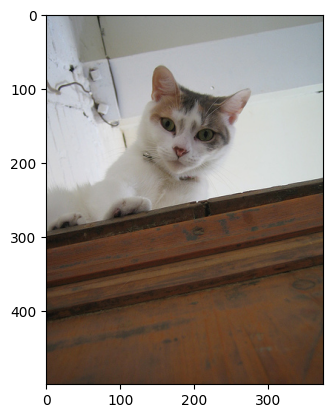

In [ ]:
import random

query_image_idx = int(len(images) * random.random())

img = image.load_img(images[query_image_idx])
plt.imshow(img)

The assumption we can now make is that two images which have similar content, should produce similar feature vectors. The next two cells will randomly select one image, and then compute a measurement of the dissimilarity (or distance) of that image's PCA feature vector to every other image's feature vector. The dissimilarity metric we use is cosine distance

### Similarity Search with Cosine Distance

In [ ]:
from scipy.spatial import distance

similar_idx = [ distance.cosine(pca_features[query_image_idx], feat) for feat in pca_features ]

The list `similar_idx` contains the image's similarity to every other one. We can sort that list and find the indexes of the most similar images. The next cell will sort them, and then find the most similar items, and return the indexes 5 most similar images. We take from indexes 1:6 rather than 0:5 because the most similar image to the query image, will trivially be the query image itself, since it is included in the distance calculation. So we just skip it.

In [ ]:
idx_closest = sorted(range(len(similar_idx)), key=lambda k: similar_idx[k])[1:6]

The next cell opens the images specified by `idx_closest` and concatenates them into a single image , resizing each so it has a height of 100 pixels.

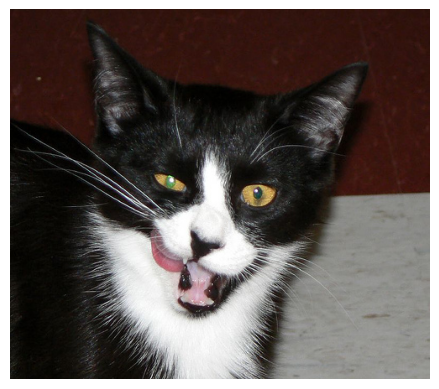

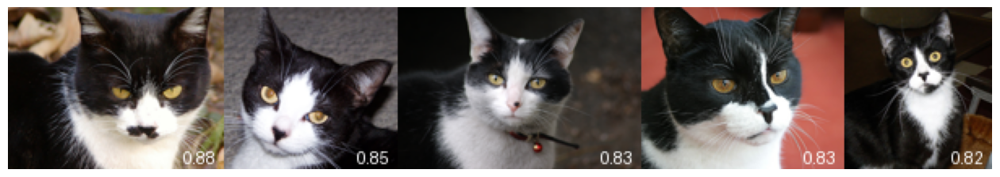

Image Index: 122, Similarity Score: 0.88
Image Index: 2882, Similarity Score: 0.85
Image Index: 2677, Similarity Score: 0.83
Image Index: 7576, Similarity Score: 0.83
Image Index: 9972, Similarity Score: 0.82


In [ ]:
from scipy.spatial import distance
import random
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont
from scipy.spatial.distance import cosine

# Grab a random query image
query_image_idx = int(len(images) * random.random())

# Display the query image
img = Image.open(images[query_image_idx])
plt.imshow(img)
plt.axis('off')
plt.show()

# Compute dissimilarity (cosine distance) of the query image to every other image
similar_idx = [distance.cosine(pca_features[query_image_idx], feat) for feat in pca_features]

# Convert dissimilarity to similarity (smaller distance means more similarity)
similarities = [1 - cosine(pca_features[query_image_idx], feat) for feat in pca_features]
similarity_scores = [(sim + 1) / 2 for sim in similarities]

# Sort to find the most similar images, skip the first index (the image itself)
idx_closest = sorted(range(len(similarity_scores)), key=lambda k: similarity_scores[k], reverse=True)[1:6]

# Load and annotate images
thumbs = []
font = ImageFont.load_default()

for idx in idx_closest:
    img = Image.open(images[idx])
    img = img.resize((int(img.width * 100 / img.height), 100))

    # Annotate image with similarity score
    draw = ImageDraw.Draw(img)
    text = f"{similarity_scores[idx]:.2f}"
    # Use textbbox to get the bounding box of the text
    text_bbox = draw.textbbox((0, 0), text, font=font)
    text_width = text_bbox[2] - text_bbox[0]
    text_height = text_bbox[3] - text_bbox[1]
    draw.text((img.width - text_width - 5, img.height - text_height - 5), text, font=font, fill=(255, 255, 255))

    thumbs.append(img)

# Concatenate images
concat_image = np.concatenate([np.asarray(t) for t in thumbs], axis=1)

# Show concatenated image
plt.figure(figsize=(16, 12))
plt.imshow(concat_image)
plt.axis('off')
plt.show()

# Print similarity scores
for idx in idx_closest:
    print(f"Image Index: {idx}, Similarity Score: {similarity_scores[idx]:.2f}")

For convenience, we automate this process by defining the function `get_closest_images`, which computes the cosine distance between the PCA features of `query_image_idx`-th image in our dataset, and the PCA features of every image in the dataset (including itself, trivially 0). It then returns an array of indices to the `num_results` (default is 5) most similar images to it (not including itself).

We also define a helper function `get_concatenated_images` which simply takes those resulting images and concatenates them into a single image for easy display.

In [ ]:
import random
from scipy.spatial import distance
from PIL import ImageDraw, ImageFont

def get_closest_images(query_image_idx, num_results=5):
    distances = [distance.cosine(pca_features[query_image_idx], feat) for feat in pca_features]
    idx_closest = sorted(range(len(distances)), key=lambda k: distances[k])[1:num_results + 1]
    return idx_closest

def get_concatenated_images(indexes, thumb_height):
    thumbs = []
    font = ImageFont.load_default()
    for idx in indexes:
        img = image.load_img(images[idx])
        img = img.resize((int(img.width * thumb_height / img.height), thumb_height))
        if idx != query_image_idx:
            draw = ImageDraw.Draw(img)
            text = f"{similarity_scores[idx]:.2f}"
             # Use textbbox to get the bounding box of the text
            text_bbox = draw.textbbox((0, 0), text, font=font)
            text_width = text_bbox[2] - text_bbox[0]
            text_height = text_bbox[3] - text_bbox[1]
            draw.text((img.width - text_width - 5, img.height - text_height - 5), text, font=font, fill=(255, 255, 255))
        thumbs.append(img)
    concat_image = np.concatenate([np.asarray(t) for t in thumbs], axis=1)
    return concat_image

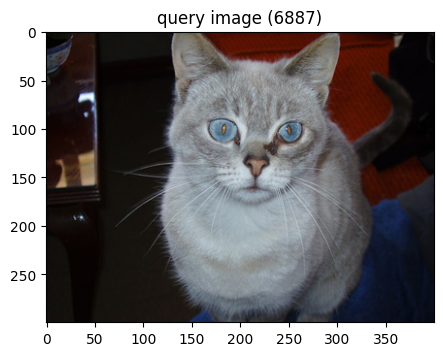

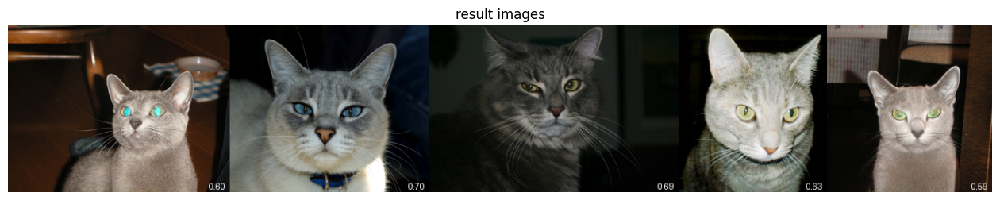

Image Index: 9340, Similarity Score: 0.60
Image Index: 6375, Similarity Score: 0.70
Image Index: 2494, Similarity Score: 0.69
Image Index: 1347, Similarity Score: 0.63
Image Index: 3149, Similarity Score: 0.59


In [ ]:
query_image_idx = int(len(images) * random.random())
idx_closest = get_closest_images(query_image_idx)
query_image = get_concatenated_images([query_image_idx], 300)
results_image = get_concatenated_images(idx_closest, 200)

plt.figure(figsize = (5,5))
plt.imshow(query_image)
plt.title("query image (%d)" % query_image_idx)


plt.figure(figsize = (16,12))
plt.imshow(results_image)
plt.title("result images")
plt.axis('off')
plt.show()

for idx in idx_closest:
    print(f"Image Index: {idx}, Similarity Score: {similarity_scores[idx]:.2f}")

## Other distance metrics

In [ ]:
import random
from scipy.spatial import distance
from PIL import ImageDraw, ImageFont

# Euclidean Similarity (using the inverse of distance for similarity)
def euclidean_similarity(vector1, vector2):
    return 1 / (1 + np.sqrt(np.sum((vector1 - vector2) ** 2)))

# Manhattan Similarity (using the inverse of distance for similarity)
def manhattan_similarity(vector1, vector2):
    return 1 / (1 + np.sum(np.abs(vector1 - vector2)))

# Minkowski Similarity (generalized similarity metric)
def minkowski_similarity(vector1, vector2, p=3):
    return 1 / (1 + np.sum(np.abs(vector1 - vector2) ** p) ** (1 / p))

# Jaccard Similarity (using binary vectors)
def jaccard_similarity(vector1, vector2):
    intersection = np.sum(np.minimum(vector1, vector2))
    union = np.sum(np.maximum(vector1, vector2))
    return intersection / union

def get_closest_images(query_image_idx, num_results=5, metric='cosine'):
    if metric == 'euclidean':
        similarities = [euclidean_similarity(pca_features[query_image_idx], feat) for feat in pca_features]
    elif metric == 'manhattan':
        similarities = [manhattan_similarity(pca_features[query_image_idx], feat) for feat in pca_features]
    elif metric == 'minkowski':
        similarities = [minkowski_similarity(pca_features[query_image_idx], feat) for feat in pca_features]
    elif metric == 'jaccard':
        similarities = [jaccard_similarity(pca_features[query_image_idx], feat) for feat in pca_features]
    else:  # default is cosine similarity
        similarities = [1 - distance.cosine(pca_features[query_image_idx], feat) for feat in pca_features]

    similarity_scores = [(sim + 1) / 2 for sim in similarities]  # normalize similarity to be between 0 and 1
    idx_closest = sorted(range(len(similarity_scores)), key=lambda k: similarity_scores[k], reverse=True)[1:num_results + 1]
    return idx_closest, similarity_scores

def get_concatenated_images(indexes, thumb_height, similarity_scores):
    thumbs = []
    font = ImageFont.load_default()
    for idx in indexes:
        img = image.load_img(images[idx])
        img = img.resize((int(img.width * thumb_height / img.height), thumb_height))
        if idx != query_image_idx:
            draw = ImageDraw.Draw(img)
            text = f"{similarity_scores[idx]:.2f}"
            text_bbox = draw.textbbox((0, 0), text, font=font)
            text_width = text_bbox[2] - text_bbox[0]
            text_height = text_bbox[3] - text_bbox[1]
            draw.text((img.width - text_width - 5, img.height - text_height - 5), text, font=font, fill=(255, 255, 255))
        thumbs.append(img)
    concat_image = np.concatenate([np.asarray(t) for t in thumbs], axis=1)
    return concat_image

## Euclidean

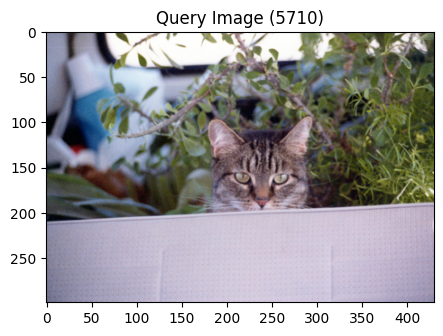

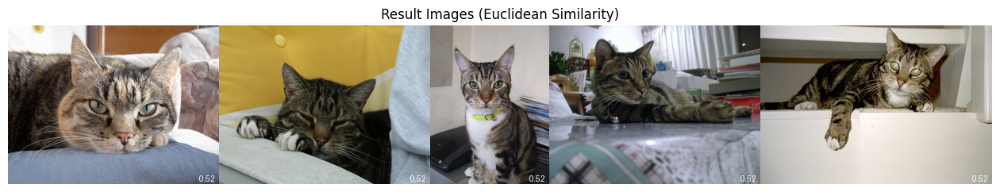

Image Index: 3618, Similarity Score: 0.52
Image Index: 8008, Similarity Score: 0.52
Image Index: 6619, Similarity Score: 0.52
Image Index: 519, Similarity Score: 0.52
Image Index: 7252, Similarity Score: 0.52


In [ ]:
query_image_idx = int(len(images) * random.random())
metric = 'euclidean'
idx_closest, similarity_scores = get_closest_images(query_image_idx, metric=metric)
query_image = get_concatenated_images([query_image_idx], 300, similarity_scores)
results_image = get_concatenated_images(idx_closest, 200, similarity_scores)


plt.figure(figsize=(5, 5))
plt.imshow(query_image)
plt.title("Query Image (%d)" % query_image_idx)

plt.figure(figsize=(16, 12))
plt.imshow(results_image)
plt.title(f"Result Images ({metric.capitalize()} Similarity)")
plt.axis('off')
plt.show()

for idx in idx_closest:
    print(f"Image Index: {idx}, Similarity Score: {similarity_scores[idx]:.2f}")


## Manhattan

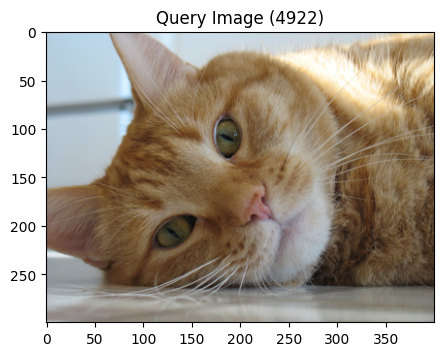

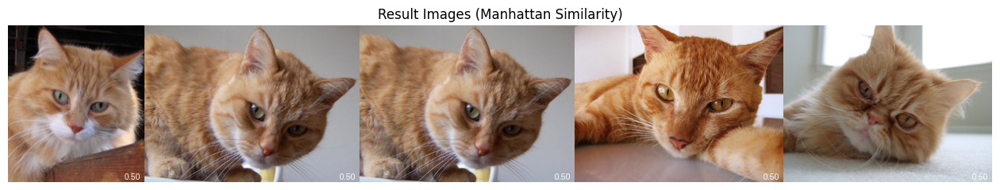

Image Index: 991, Similarity Score: 0.50
Image Index: 3063, Similarity Score: 0.50
Image Index: 5895, Similarity Score: 0.50
Image Index: 351, Similarity Score: 0.50
Image Index: 8481, Similarity Score: 0.50


In [ ]:

query_image_idx = int(len(images) * random.random())
metric = 'manhattan'
idx_closest, similarity_scores = get_closest_images(query_image_idx, metric=metric)
query_image = get_concatenated_images([query_image_idx], 300, similarity_scores)
results_image = get_concatenated_images(idx_closest, 200, similarity_scores)


plt.figure(figsize=(5, 5))
plt.imshow(query_image)
plt.title("Query Image (%d)" % query_image_idx)

plt.figure(figsize=(16, 12))
plt.imshow(results_image)
plt.title(f"Result Images ({metric.capitalize()} Similarity)")
plt.axis('off')
plt.show()

for idx in idx_closest:
    print(f"Image Index: {idx}, Similarity Score: {similarity_scores[idx]:.2f}")


## Minkowski

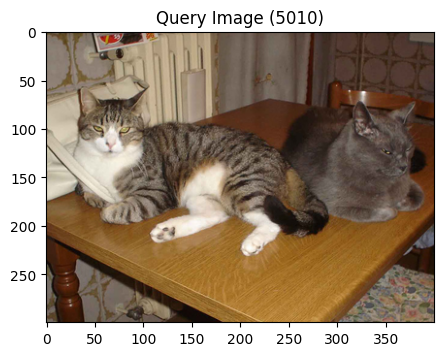

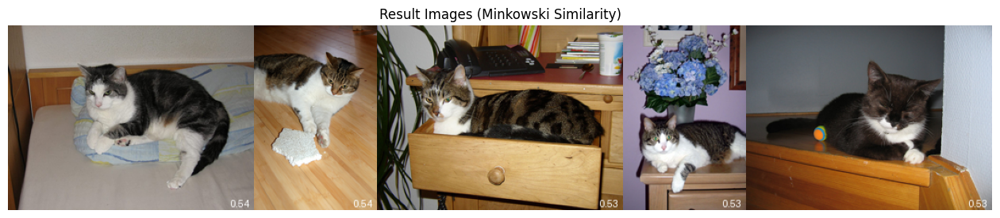

Image Index: 924, Similarity Score: 0.54
Image Index: 5472, Similarity Score: 0.54
Image Index: 6096, Similarity Score: 0.53
Image Index: 9936, Similarity Score: 0.53
Image Index: 3988, Similarity Score: 0.53


In [ ]:

query_image_idx = int(len(images) * random.random())
metric = 'minkowski'
idx_closest, similarity_scores = get_closest_images(query_image_idx, metric=metric)
query_image = get_concatenated_images([query_image_idx], 300, similarity_scores)
results_image = get_concatenated_images(idx_closest, 200, similarity_scores)


plt.figure(figsize=(5, 5))
plt.imshow(query_image)
plt.title("Query Image (%d)" % query_image_idx)

plt.figure(figsize=(16, 12))
plt.imshow(results_image)
plt.title(f"Result Images ({metric.capitalize()} Similarity)")
plt.axis('off')
plt.show()

# Print similarity scores
for idx in idx_closest:
    print(f"Image Index: {idx}, Similarity Score: {similarity_scores[idx]:.2f}")


## Jaccard

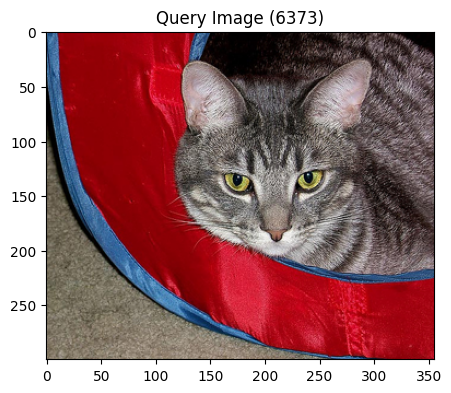

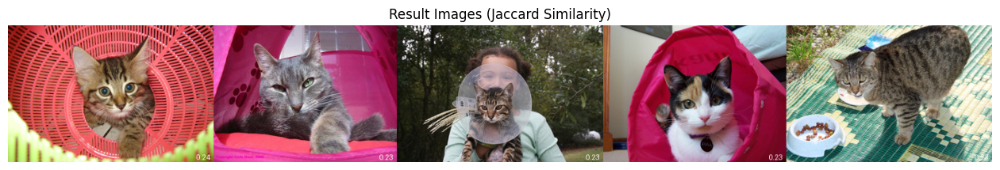

Image Index: 6099, Similarity Score: 0.24
Image Index: 6469, Similarity Score: 0.23
Image Index: 5711, Similarity Score: 0.23
Image Index: 3211, Similarity Score: 0.23
Image Index: 4904, Similarity Score: 0.23


In [ ]:

query_image_idx = int(len(images) * random.random())
metric = 'jaccard'
idx_closest, similarity_scores = get_closest_images(query_image_idx, metric=metric)
query_image = get_concatenated_images([query_image_idx], 300, similarity_scores)
results_image = get_concatenated_images(idx_closest, 200, similarity_scores)


plt.figure(figsize=(5, 5))
plt.imshow(query_image)
plt.title("Query Image (%d)" % query_image_idx)


plt.figure(figsize=(16, 12))
plt.imshow(results_image)
plt.title(f"Result Images ({metric.capitalize()} Similarity)")
plt.axis('off')
plt.show()


for idx in idx_closest:
    print(f"Image Index: {idx}, Similarity Score: {similarity_scores[idx]:.2f}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Text(0.5, 1.0, 'result images')

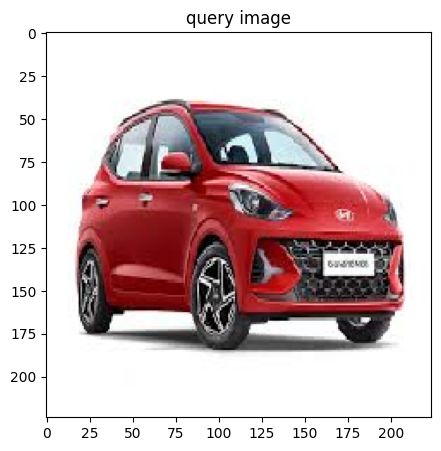

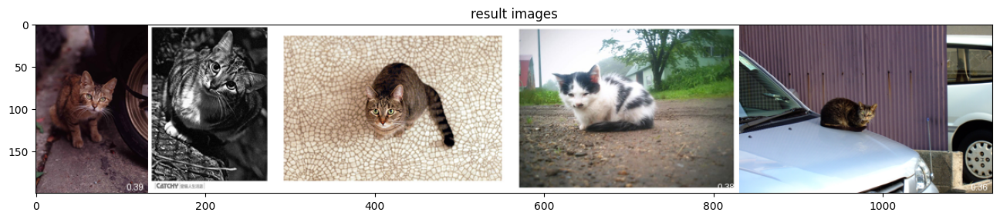

In [ ]:
# load image and extract features
new_image, x = load_image("/content/download (5).jpeg")
new_features = feat_extractor.predict(x)

# project it into pca space
new_pca_features = pca.transform(new_features)[0]

# calculate its distance to all the other images pca feature vectors
distances = [ distance.cosine(new_pca_features, feat) for feat in pca_features ]
idx_closest = sorted(range(len(distances)), key=lambda k: distances[k])[0:5]  # grab first 5

# Creating a dummy similarity_scores (since we don't have actual similarity scores for the new image)
similarity_scores = {idx: 1 - distances[idx] for idx in idx_closest}
# We use 1 - distance as a proxy for similarity, assuming larger distance means lower similarity

# display the results
plt.figure(figsize = (5,5))
plt.imshow(new_image)
plt.title("query image")

results_image = get_concatenated_images(idx_closest, 200, similarity_scores) #Pass similarity_scores

# display the resulting images
plt.figure(figsize = (16,12))
plt.imshow(results_image)
plt.title("result images")

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


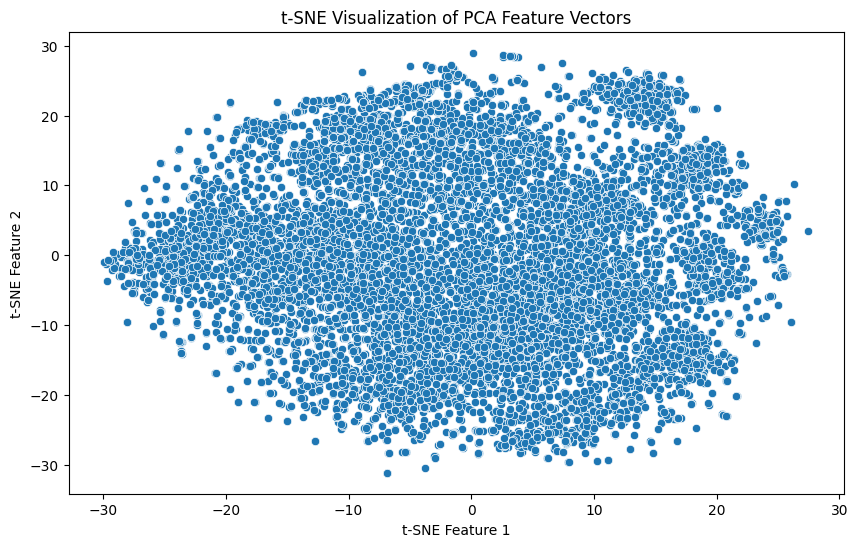

In [ ]:
from sklearn.manifold import TSNE
import seaborn as sns
import matplotlib.pyplot as plt

# Perform t-SNE to reduce the dimensionality to 2D for visualization
tsne = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=300)
tsne_features = tsne.fit_transform(pca_features)  # Use the PCA-transformed features

# Plot the t-SNE visualization
plt.figure(figsize=(10, 6))
sns.scatterplot(x=tsne_features[:, 0], y=tsne_features[:, 1])
plt.title("t-SNE Visualization of PCA Feature Vectors")
plt.xlabel("t-SNE Feature 1")
plt.ylabel("t-SNE Feature 2")
plt.show()
